## Testing

### Hypothesis testing

In [6]:
from __future__ import print_function, division

%matplotlib inline

import numpy as np

import random

import thinkstats2
import thinkplot

null hypothesis - Which is a model of the system based on the assumption that the apparent effect is not real(no relation, no different)
P-value - which is the probability of seeing the apparent effect if the null hypothesis is true
假设null是真的（没有关系），那么这个抽样出现的概率是多少
statistically significant - which means that it is unlikely to appear in the larger population
如果 p-value 很低，说明出现这个抽样结果的机率很低，但也出现了，说明null假设有问题

In [31]:
class HypothesisTest(object):
    
    def __init__(self, data):
        self.data = data
        self.MakeModel() #已Pass
        self.actual = self.TestStatistic(data) #这里优先算出了区别，示例是 140-110=30
        
    def PValue(self, iters= 1000):
        self.test_stats = [self.TestStatistic(self.RunModel()) for _ in range(iters)]
        #这里负责运行1000次选择和把选择的差距值保存到list
        count = sum(1 for x in self.test_stats if x >= self.actual)
        #再次遍历 test_stats，如果出现比 actual(30)大的，就+1
        
        print('actual:', self.actual)
        #print('test_stats:', self.test_stats)
        #print('count:', count)
        return count/iters
    
    def TestStatistic(self, data):
        raise UnimplementedMethodException()
        
    def MakeModel(self):
        pass
    
    def RunModel(self):
        raise UnimplementedMethodException()
        

In [30]:
class CoinTest(HypothesisTest):
    
    def TestStatistic(self, data): #这里只负责计算差距的绝对值
        heads, tails = data
        test_stat = abs(heads - tails)
        print('test_stat:',test_stat)
        return test_stat
    
    def RunModel(self): #这里只负责随机选择H或T
        heads, tails = self.data
        n = heads + tails
        sample = [random.choice('HT') for _ in range(n)] #这里运行H+T总和的次数
        hist = thinkstats2.Hist(sample)
        data = hist['H'],hist['T']
        #print('hist[H],hist[T]: ',data)
        return data

In [32]:
ct = CoinTest((140,110))
pvalue = ct.PValue()#这里才是运行p-value
pvalue

test_stat: 30
test_stat: 14
test_stat: 2
test_stat: 10
test_stat: 6
test_stat: 14
test_stat: 4
test_stat: 6
test_stat: 26
test_stat: 6
test_stat: 26
test_stat: 26
test_stat: 26
test_stat: 22
test_stat: 4
test_stat: 4
test_stat: 24
test_stat: 20
test_stat: 14
test_stat: 18
test_stat: 26
test_stat: 16
test_stat: 4
test_stat: 18
test_stat: 46
test_stat: 18
test_stat: 10
test_stat: 0
test_stat: 8
test_stat: 18
test_stat: 6
test_stat: 10
test_stat: 10
test_stat: 14
test_stat: 6
test_stat: 8
test_stat: 36
test_stat: 8
test_stat: 8
test_stat: 0
test_stat: 4
test_stat: 34
test_stat: 4
test_stat: 2
test_stat: 12
test_stat: 6
test_stat: 12
test_stat: 10
test_stat: 6
test_stat: 26
test_stat: 6
test_stat: 10
test_stat: 14
test_stat: 18
test_stat: 6
test_stat: 6
test_stat: 22
test_stat: 6
test_stat: 10
test_stat: 12
test_stat: 10
test_stat: 6
test_stat: 22
test_stat: 14
test_stat: 0
test_stat: 2
test_stat: 12
test_stat: 6
test_stat: 4
test_stat: 18
test_stat: 8
test_stat: 10
test_stat: 24
test_stat

test_stat: 28
test_stat: 16
test_stat: 10
test_stat: 24
test_stat: 20
test_stat: 22
test_stat: 28
test_stat: 2
test_stat: 10
test_stat: 36
test_stat: 28
test_stat: 22
test_stat: 8
test_stat: 12
test_stat: 2
test_stat: 12
test_stat: 8
test_stat: 10
test_stat: 14
test_stat: 14
test_stat: 20
test_stat: 4
test_stat: 18
test_stat: 6
test_stat: 4
test_stat: 28
test_stat: 20
test_stat: 0
test_stat: 42
test_stat: 24
test_stat: 24
test_stat: 18
test_stat: 10
test_stat: 14
test_stat: 4
test_stat: 14
test_stat: 10
test_stat: 6
test_stat: 18
test_stat: 16
test_stat: 12
test_stat: 10
test_stat: 14
test_stat: 14
test_stat: 4
test_stat: 16
test_stat: 20
test_stat: 6
test_stat: 22
test_stat: 8
test_stat: 8
test_stat: 12
test_stat: 26
test_stat: 6
test_stat: 20
test_stat: 26
test_stat: 6
test_stat: 2
test_stat: 6
test_stat: 12
test_stat: 20
test_stat: 12
test_stat: 16
test_stat: 2
test_stat: 8
test_stat: 10
test_stat: 4
test_stat: 18
test_stat: 4
test_stat: 4
test_stat: 10
test_stat: 18
test_stat: 2
te

0.053

### Permutation test

In [37]:
class DiffMeansPermute(thinkstats2.HypothesisTest):
    
    def TestStatistic(self, data):
        group1, group2 = data
        test_stat = abs(group1.mean() - group2.mean())
        return test_stat
    
    def MakeModel(self):
        group1, group2 = self.data
        self.n , self.m = len(group1), len(group2)
        self.pool = np.hstack((group1, group2)) #在group1后面加上 group2
        '''
            >>> a = np.array((1,2,3))
            >>> b = np.array((2,3,4))
            >>> np.hstack((a,b))
            array([1, 2, 3, 2, 3, 4])
        '''
        
    def RunModel(self):
        np.random.shuffle(self.pool) #吧里面的数字顺序打乱
        data = self.pool[:self.n], self.pool[self.n:] #把整个数值通过n数量来分开两段
        return data

In [36]:
a = [1,2,3,4,5]
print(a)
np.random.shuffle(a)
print(a)

[1, 2, 3, 4, 5]
[3, 2, 4, 1, 5]


In [38]:
import first

In [39]:
live, firsts, others = first.MakeFrames()
data = firsts.prglngth.values, others.prglngth.values

In [40]:
ht = DiffMeansPermute(data)
pvalue = ht.PValue()
pvalue

0.146

No handles with labels found to put in legend.


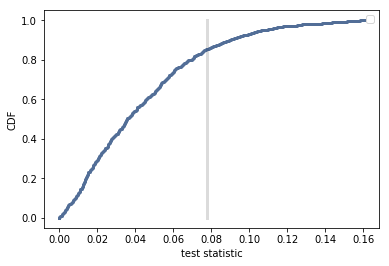

In [41]:
ht.PlotCdf()
thinkplot.Config(xlabel='test statistic', ylabel='CDF')

In [42]:
class DiffMeansOneSided(DiffMeansPermute):
    
    def TestStatistic(self, data):
        group1, group2 = data
        test_stat = group1.mean() - group2.mean()
        return test_stat

In [44]:
ht = DiffMeansOneSided(data)
pvalue =ht.PValue()
pvalue

0.083

### Difference in standard deviation

In [45]:
class DiffStdPermute(DiffMeansPermute):
    
    def TestStatistic(self, data):
        group1, group2 = data
        test_stat = group1.std() - group2.std()
        return test_stat

In [48]:
ht = DiffStdPermute(data)
pvalue = ht.PValue()
pvalue

0.075

### Testing correlation

In [51]:
class CorrelationPermute(thinkstats2.HypothesisTest):
    
    def TestStatistic(self, data):
        xs, ys = data
        test_stat = abs(thinkstats2.Corr(xs, ys))
        return test_stat
    
    def RunModel(self):
        xs, ys = self.data
        xs = np.random.permutation(xs)
        return xs, ys

In [52]:
cleaned = live.dropna(subset=['agepreg', 'totalwgt_lb'])
data = cleaned.agepreg.values, cleaned.totalwgt_lb.values
ht = CorrelationPermute(data)
pvalue = ht.PValue()
pvalue

0.0

In [53]:
ht.actual, ht.MaxTestStat()

(0.06883397035410908, 0.0309100256847525)

### Testing proportion

In [70]:
class DiceTest(thinkstats2.HypothesisTest):
    
    def TestStatistic(self, data):
        observed = data 
        n = sum(observed)
        expected = np.ones(6) *n/6 #這個是期望值，相當與 [1,1,1,1,1,1] * 60 = [60,60,60,60,60,60]/6 = [10,10,10,10,10,10]
        test_stat = sum(abs(observed - expected))#觀察值減去期望值的結果
        diff = observed - expected
        #print('observed:', observed, '- expected:', expected, '=', diff, ' sum:',test_stat)
        return test_stat
    
    def RunModel(self):
        n =sum(self.data) #觀測記錄裏面每一個數字出現的次數總和 [1,1,1,1,1,1] = 6
        #print(n)
        values = [1,2,3,4,5,6]
        rolls = np.random.choice(values, n, replace=True) #滾60次，記錄每次滾出的結果，保存到rolls
        hist = thinkstats2.Hist(rolls) #用 Hist 來計算每個數字出現的頻率
        freqs = hist.Freqs(values) #freqs 相當與每個數字出現的頻率以列表保存
        #print(freqs)
        return freqs

In [67]:
a = np.ones(6)
b = a * 6
c = sum(b)
d = [1,2,1,2,3,1]
print(b-d)

[5. 4. 5. 4. 3. 5.]


In [71]:
data =[8,9,19,5,8,11]
dt = DiceTest(data)
pvalue = dt.PValue(iters=100000)
pvalue

observed: [8, 9, 19, 5, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1.  9. -5. -2.  1.]  sum: 20.0
observed: [5, 17, 12, 5, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  7.  2. -5.  2. -1.]  sum: 22.0
observed: [14, 6, 10, 9, 14, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -4.  0. -1.  4. -3.]  sum: 16.0
observed: [15, 6, 9, 9, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -4. -1. -1.  1.  0.]  sum: 12.0
observed: [10, 11, 11, 10, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1.  1.  0. -2.  0.]  sum: 4.0
observed: [6, 10, 15, 12, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  0.  5.  2. -1. -2.]  sum: 14.0
observed: [12, 9, 10, 10, 6, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1.  0.  0. -4.  3.]  sum: 10.0
observed: [8, 7, 16, 9, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -3.  6. -1.  0.  0.]  sum: 12.0
observed: [12, 9, 12, 9, 5, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1.  2. -1. -5.  3.]  sum: 14.0
observed: [10, 7, 

observed: [11, 6, 17, 8, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -4.  7. -2. -1. -1.]  sum: 16.0
observed: [10, 11, 9, 10, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1. -1.  0.  1. -1.]  sum: 4.0
observed: [8, 8, 8, 12, 10, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2. -2.  2.  0.  4.]  sum: 12.0
observed: [15, 8, 13, 11, 5, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -2.  3.  1. -5. -2.]  sum: 18.0
observed: [10, 11, 8, 14, 11, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1. -2.  4.  1. -4.]  sum: 12.0
observed: [7, 10, 12, 12, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0.  2.  2. -1.  0.]  sum: 8.0
observed: [9, 6, 11, 11, 13, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -4.  1.  1.  3.  0.]  sum: 10.0
observed: [10, 11, 11, 10, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1.  1.  0.  0. -2.]  sum: 4.0
observed: [9, 9, 16, 4, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  6. -6.  3. -1.]  sum: 18.0
observed: [10, 7, 

observed: [8, 7, 13, 9, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -3.  3. -1.  2.  1.]  sum: 12.0
observed: [12, 8, 13, 6, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2.  3. -4. -1.  2.]  sum: 14.0
observed: [6, 11, 11, 15, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  1.  1.  5. -1. -2.]  sum: 14.0
observed: [10, 7, 13, 9, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3.  3. -1. -1.  2.]  sum: 10.0
observed: [9, 9, 7, 14, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1. -3.  4.  1.  0.]  sum: 10.0
observed: [4, 9, 13, 10, 16, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-6. -1.  3.  0.  6. -2.]  sum: 18.0
observed: [7, 10, 8, 10, 9, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0. -2.  0. -1.  6.]  sum: 12.0
observed: [11, 12, 15, 9, 7, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2.  5. -1. -3. -4.]  sum: 16.0
observed: [8, 9, 11, 7, 14, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1.  1. -3.  4.  1.]  sum: 12.0
observed: [7, 9, 16

observed: [8, 13, 4, 14, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  3. -6.  4.  2. -1.]  sum: 18.0
observed: [10, 11, 11, 11, 6, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1.  1.  1. -4.  1.]  sum: 8.0
observed: [14, 9, 14, 14, 6, 3] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -1.  4.  4. -4. -7.]  sum: 24.0
observed: [9, 10, 11, 9, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  1. -1.  0.  1.]  sum: 4.0
observed: [11, 11, 7, 8, 7, 16] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1. -3. -2. -3.  6.]  sum: 16.0
observed: [14, 8, 10, 8, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -2.  0. -2.  2. -2.]  sum: 12.0
observed: [11, 9, 10, 13, 11, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1.  0.  3.  1. -4.]  sum: 10.0
observed: [7, 14, 8, 15, 10, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  4. -2.  5.  0. -4.]  sum: 18.0
observed: [9, 13, 6, 11, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3. -4.  1.  2. -1.]  sum: 12.0
observed: [9, 14,

observed: [12, 8, 13, 7, 14, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2.  3. -3.  4. -4.]  sum: 18.0
observed: [7, 7, 12, 17, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -3.  2.  7.  0. -3.]  sum: 18.0
observed: [11, 9, 12, 10, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1.  2.  0.  0. -2.]  sum: 6.0
observed: [15, 10, 10, 10, 5, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  0.  0.  0. -5.  0.]  sum: 10.0
observed: [14, 6, 15, 9, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -4.  5. -1. -1. -3.]  sum: 18.0
observed: [9, 11, 12, 8, 14, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  2. -2.  4. -4.]  sum: 14.0
observed: [7, 10, 9, 5, 16, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0. -1. -5.  6.  3.]  sum: 18.0
observed: [13, 9, 11, 6, 8, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1.  1. -4. -2.  3.]  sum: 14.0
observed: [8, 12, 11, 13, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2.  1.  3. -2. -2.]  sum: 12.0
observed: [11, 11,

observed: [10, 7, 6, 13, 13, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3. -4.  3.  3.  1.]  sum: 14.0
observed: [7, 18, 7, 5, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  8. -3. -5.  1.  2.]  sum: 22.0
observed: [10, 10, 8, 10, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0. -2.  0.  1.  1.]  sum: 4.0
observed: [8, 9, 8, 11, 11, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1. -2.  1.  1.  3.]  sum: 10.0
observed: [11, 9, 9, 10, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1. -1.  0.  1.  0.]  sum: 4.0
observed: [11, 14, 13, 4, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  4.  3. -6. -1. -1.]  sum: 16.0
observed: [7, 9, 10, 9, 15, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -1.  0. -1.  5.  0.]  sum: 10.0
observed: [12, 15, 8, 6, 6, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  5. -2. -4. -4.  3.]  sum: 20.0
observed: [8, 14, 11, 8, 14, 5] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  4.  1. -2.  4. -5.]  sum: 18.0
observed: [16, 5,

observed: [13, 14, 5, 12, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  4. -5.  2. -2. -2.]  sum: 18.0
observed: [9, 7, 11, 11, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -3.  1.  1.  3. -1.]  sum: 10.0
observed: [13, 8, 11, 10, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -2.  1.  0. -2.  0.]  sum: 8.0
observed: [9, 7, 18, 6, 7, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -3.  8. -4. -3.  3.]  sum: 22.0
observed: [8, 6, 11, 8, 15, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -4.  1. -2.  5.  2.]  sum: 16.0
observed: [13, 16, 9, 8, 8, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  6. -1. -2. -2. -4.]  sum: 18.0
observed: [11, 7, 14, 6, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3.  4. -4.  1.  1.]  sum: 14.0
observed: [7, 13, 12, 8, 13, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  3.  2. -2.  3. -3.]  sum: 16.0
observed: [5, 13, 11, 9, 9, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  3.  1. -1. -1.  3.]  sum: 14.0
observed: [14, 11, 9

observed: [14, 8, 13, 10, 11, 4] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -2.  3.  0.  1. -6.]  sum: 16.0
observed: [14, 9, 7, 8, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -1. -3. -2.  2.  0.]  sum: 12.0
observed: [16, 11, 6, 6, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 6.  1. -4. -4.  0.  1.]  sum: 16.0
observed: [11, 10, 13, 8, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0.  3. -2.  0. -2.]  sum: 8.0
observed: [9, 5, 13, 4, 11, 18] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -5.  3. -6.  1.  8.]  sum: 24.0
observed: [7, 13, 7, 9, 14, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  3. -3. -1.  4.  0.]  sum: 14.0
observed: [7, 12, 10, 15, 6, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2.  0.  5. -4.  0.]  sum: 14.0
observed: [17, 13, 9, 6, 7, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 7.  3. -1. -4. -3. -2.]  sum: 20.0
observed: [11, 10, 7, 10, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0. -3.  0.  0.  2.]  sum: 6.0
observed: [7, 15

observed: [9, 11, 11, 8, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  1. -2.  0.  1.]  sum: 6.0
observed: [11, 10, 9, 15, 7, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0. -1.  5. -3. -2.]  sum: 12.0
observed: [11, 13, 7, 12, 11, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  3. -3.  2.  1. -4.]  sum: 14.0
observed: [10, 13, 7, 15, 7, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  3. -3.  5. -3. -2.]  sum: 16.0
observed: [10, 10, 8, 13, 7, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0. -2.  3. -3.  2.]  sum: 10.0
observed: [4, 18, 7, 14, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-6.  8. -3.  4.  0. -3.]  sum: 24.0
observed: [11, 12, 7, 10, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2. -3.  0.  2. -2.]  sum: 10.0
observed: [13, 7, 11, 14, 7, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -3.  1.  4. -3. -2.]  sum: 16.0
observed: [12, 12, 10, 7, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  2.  0. -3. -2.  1.]  sum: 10.0
observed: [9, 1

observed: [10, 8, 5, 14, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2. -5.  4.  2.  1.]  sum: 14.0
observed: [12, 9, 8, 10, 7, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1. -2.  0. -3.  4.]  sum: 12.0
observed: [5, 9, 18, 7, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-5. -1.  8. -3.  1.  0.]  sum: 18.0
observed: [10, 13, 6, 13, 5, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  3. -4.  3. -5.  3.]  sum: 18.0
observed: [11, 12, 13, 9, 10, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2.  3. -1.  0. -5.]  sum: 12.0
observed: [5, 15, 10, 5, 7, 18] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  5.  0. -5. -3.  8.]  sum: 26.0
observed: [6, 8, 13, 8, 13, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -2.  3. -2.  3.  2.]  sum: 16.0
observed: [14, 8, 7, 12, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -2. -3.  2.  1. -2.]  sum: 14.0
observed: [10, 3, 11, 11, 12, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -7.  1.  1.  2.  3.]  sum: 14.0
observed: [7, 

observed: [10, 11, 12, 10, 6, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1.  2.  0. -4.  1.]  sum: 8.0
observed: [11, 13, 5, 10, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  3. -5.  0. -1.  2.]  sum: 12.0
observed: [10, 6, 10, 11, 8, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -4.  0.  1. -2.  5.]  sum: 12.0
observed: [9, 7, 10, 12, 14, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -3.  0.  2.  4. -2.]  sum: 12.0
observed: [9, 13, 9, 9, 13, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3. -1. -1.  3. -3.]  sum: 12.0
observed: [8, 9, 10, 7, 15, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1.  0. -3.  5.  1.]  sum: 12.0
observed: [15, 9, 9, 8, 13, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -1. -1. -2.  3. -4.]  sum: 16.0
observed: [4, 10, 14, 6, 8, 18] - expected: [10. 10. 10. 10. 10. 10.] = [-6.  0.  4. -4. -2.  8.]  sum: 24.0
observed: [10, 10, 9, 5, 11, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0. -1. -5.  1.  5.]  sum: 12.0
observed: [13, 8,

observed: [11, 12, 12, 6, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2.  2. -4. -1.  0.]  sum: 10.0
observed: [9, 9, 7, 10, 15, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1. -3.  0.  5.  0.]  sum: 10.0
observed: [10, 11, 10, 8, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1.  0. -2. -1.  2.]  sum: 6.0
observed: [12, 10, 8, 9, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0. -2. -1.  0.  1.]  sum: 6.0
observed: [11, 2, 11, 8, 17, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -8.  1. -2.  7.  1.]  sum: 20.0
observed: [9, 6, 12, 10, 9, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -4.  2.  0. -1.  4.]  sum: 12.0
observed: [9, 18, 9, 8, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  8. -1. -2. -2. -2.]  sum: 16.0
observed: [15, 9, 6, 11, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -1. -4.  1.  0. -1.]  sum: 12.0
observed: [12, 11, 5, 8, 12, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1. -5. -2.  2.  2.]  sum: 14.0
observed: [8, 9, 9

observed: [8, 10, 14, 7, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0.  4. -3. -1.  2.]  sum: 12.0
observed: [14, 9, 8, 9, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -1. -2. -1.  2. -2.]  sum: 12.0
observed: [12, 8, 13, 8, 13, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2.  3. -2.  3. -4.]  sum: 16.0
observed: [9, 11, 7, 10, 10, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1. -3.  0.  0.  3.]  sum: 8.0
observed: [12, 14, 8, 9, 11, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  4. -2. -1.  1. -4.]  sum: 14.0
observed: [11, 5, 10, 11, 10, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -5.  0.  1.  0.  3.]  sum: 10.0
observed: [6, 10, 11, 8, 10, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  0.  1. -2.  0.  5.]  sum: 12.0
observed: [13, 12, 11, 6, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  2.  1. -4.  0. -2.]  sum: 12.0
observed: [13, 5, 11, 9, 14, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -5.  1. -1.  4. -2.]  sum: 16.0
observed: [9, 9,

observed: [10, 11, 17, 9, 8, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1.  7. -1. -2. -5.]  sum: 16.0
observed: [12, 11, 7, 9, 8, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1. -3. -1. -2.  3.]  sum: 12.0
observed: [11, 13, 13, 7, 7, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  3.  3. -3. -3. -1.]  sum: 14.0
observed: [10, 17, 9, 11, 7, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  7. -1.  1. -3. -4.]  sum: 16.0
observed: [8, 8, 8, 10, 11, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2. -2.  0.  1.  5.]  sum: 12.0
observed: [13, 13, 9, 4, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  3. -1. -6.  2. -1.]  sum: 16.0
observed: [6, 8, 11, 15, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -2.  1.  5.  2. -2.]  sum: 16.0
observed: [9, 11, 12, 7, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  2. -3.  1.  0.]  sum: 8.0
observed: [14, 10, 7, 11, 12, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  0. -3.  1.  2. -4.]  sum: 14.0
observed: [13, 16,

observed: [7, 15, 12, 7, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  5.  2. -3.  0. -1.]  sum: 14.0
observed: [7, 10, 10, 11, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0.  0.  1.  0.  2.]  sum: 6.0
observed: [8, 9, 11, 6, 14, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1.  1. -4.  4.  2.]  sum: 14.0
observed: [10, 9, 5, 13, 9, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1. -5.  3. -1.  4.]  sum: 14.0
observed: [14, 13, 3, 10, 7, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  3. -7.  0. -3.  3.]  sum: 20.0
observed: [7, 13, 10, 10, 14, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  3.  0.  0.  4. -4.]  sum: 14.0
observed: [11, 15, 7, 5, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  5. -3. -5.  3. -1.]  sum: 18.0
observed: [15, 6, 8, 7, 9, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -4. -2. -3. -1.  5.]  sum: 20.0
observed: [10, 11, 9, 12, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1. -1.  2. -1. -1.]  sum: 6.0
observed: [11, 7, 

observed: [9, 12, 12, 5, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2.  2. -5.  0.  2.]  sum: 12.0
observed: [14, 13, 9, 10, 7, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  3. -1.  0. -3. -3.]  sum: 14.0
observed: [10, 8, 7, 9, 14, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2. -3. -1.  4.  2.]  sum: 12.0
observed: [8, 6, 13, 10, 8, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -4.  3.  0. -2.  5.]  sum: 16.0
observed: [12, 10, 15, 11, 7, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0.  5.  1. -3. -5.]  sum: 16.0
observed: [8, 7, 14, 6, 13, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -3.  4. -4.  3.  2.]  sum: 18.0
observed: [14, 10, 11, 10, 7, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  0.  1.  0. -3. -2.]  sum: 10.0
observed: [11, 11, 8, 9, 14, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1. -2. -1.  4. -3.]  sum: 12.0
observed: [12, 14, 11, 9, 6, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  4.  1. -1. -4. -2.]  sum: 14.0
observed: [11, 1

observed: [8, 14, 7, 11, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  4. -3.  1. -1.  1.]  sum: 12.0
observed: [10, 13, 3, 11, 8, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  3. -7.  1. -2.  5.]  sum: 18.0
observed: [10, 10, 6, 4, 17, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0. -4. -6.  7.  3.]  sum: 20.0
observed: [15, 10, 8, 12, 9, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  0. -2.  2. -1. -4.]  sum: 14.0
observed: [7, 5, 17, 11, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -5.  7.  1.  1. -1.]  sum: 18.0
observed: [7, 9, 13, 10, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -1.  3.  0.  0.  1.]  sum: 8.0
observed: [7, 10, 10, 7, 15, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0.  0. -3.  5.  1.]  sum: 12.0
observed: [9, 14, 7, 8, 16, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  4. -3. -2.  6. -4.]  sum: 20.0
observed: [9, 10, 10, 13, 6, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  0.  3. -4.  2.]  sum: 10.0
observed: [10, 1

observed: [10, 10, 9, 8, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0. -1. -2.  2.  1.]  sum: 6.0
observed: [10, 10, 12, 9, 12, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0.  2. -1.  2. -3.]  sum: 8.0
observed: [11, 5, 8, 14, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -5. -2.  4.  1.  1.]  sum: 14.0
observed: [14, 8, 12, 9, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -2.  2. -1. -2. -1.]  sum: 12.0
observed: [13, 10, 5, 14, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  0. -5.  4. -2.  0.]  sum: 14.0
observed: [11, 14, 11, 7, 12, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  4.  1. -3.  2. -5.]  sum: 16.0
observed: [9, 14, 14, 11, 8, 4] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  4.  4.  1. -2. -6.]  sum: 18.0
observed: [10, 12, 11, 8, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2.  1. -2.  0. -1.]  sum: 6.0
observed: [11, 7, 9, 12, 5, 16] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3. -1.  2. -5.  6.]  sum: 18.0
observed: [12, 7,

observed: [9, 6, 15, 11, 14, 5] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -4.  5.  1.  4. -5.]  sum: 20.0
observed: [12, 9, 10, 10, 13, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1.  0.  0.  3. -4.]  sum: 10.0
observed: [10, 13, 10, 7, 15, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  3.  0. -3.  5. -5.]  sum: 16.0
observed: [7, 8, 16, 9, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2.  6. -1.  2. -2.]  sum: 16.0
observed: [11, 4, 11, 12, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -6.  1.  2.  3. -1.]  sum: 14.0
observed: [9, 10, 8, 11, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0. -2.  1.  2.  0.]  sum: 6.0
observed: [7, 4, 6, 11, 13, 19] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -6. -4.  1.  3.  9.]  sum: 26.0
observed: [8, 7, 7, 11, 10, 17] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -3. -3.  1.  0.  7.]  sum: 16.0
observed: [9, 9, 9, 12, 8, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1. -1.  2. -2.  3.]  sum: 10.0
observed: [6, 11, 

observed: [8, 9, 12, 11, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1.  2.  1.  2. -2.]  sum: 10.0
observed: [12, 9, 12, 6, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1.  2. -4.  1.  0.]  sum: 10.0
observed: [9, 9, 6, 14, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1. -4.  4.  3. -1.]  sum: 14.0
observed: [7, 6, 14, 10, 10, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -4.  4.  0.  0.  3.]  sum: 14.0
observed: [8, 6, 5, 11, 11, 19] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -4. -5.  1.  1.  9.]  sum: 22.0
observed: [12, 5, 16, 11, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -5.  6.  1. -1. -3.]  sum: 18.0
observed: [9, 14, 10, 10, 5, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  4.  0.  0. -5.  2.]  sum: 12.0
observed: [10, 13, 5, 10, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  3. -5.  0.  1.  1.]  sum: 10.0
observed: [8, 18, 11, 5, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  8.  1. -5. -1. -1.]  sum: 18.0
observed: [7, 10

observed: [16, 8, 6, 6, 12, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -2. -4. -4.  2.  2.]  sum: 20.0
observed: [14, 8, 10, 12, 11, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -2.  0.  2.  1. -5.]  sum: 14.0
observed: [10, 8, 12, 10, 5, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2.  2.  0. -5.  5.]  sum: 14.0
observed: [14, 7, 12, 10, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -3.  2.  0. -2. -1.]  sum: 12.0
observed: [16, 9, 10, 10, 8, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -1.  0.  0. -2. -3.]  sum: 12.0
observed: [7, 11, 12, 6, 13, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  1.  2. -4.  3.  1.]  sum: 14.0
observed: [8, 11, 10, 7, 13, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1.  0. -3.  3.  1.]  sum: 10.0
observed: [6, 7, 16, 10, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -3.  6.  0.  0.  1.]  sum: 14.0
observed: [7, 16, 8, 11, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  6. -2.  1. -1. -1.]  sum: 14.0
observed: [7, 1

observed: [7, 12, 9, 9, 14, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2. -1. -1.  4. -1.]  sum: 12.0
observed: [8, 14, 11, 9, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  4.  1. -1. -1. -1.]  sum: 10.0
observed: [7, 9, 8, 12, 12, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -1. -2.  2.  2.  2.]  sum: 12.0
observed: [11, 8, 6, 11, 11, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2. -4.  1.  1.  3.]  sum: 12.0
observed: [12, 9, 7, 8, 13, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1. -3. -2.  3.  1.]  sum: 12.0
observed: [10, 12, 13, 8, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2.  3. -2. -1. -2.]  sum: 10.0
observed: [15, 6, 16, 9, 4, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -4.  6. -1. -6.  0.]  sum: 22.0
observed: [13, 7, 11, 9, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -3.  1. -1. -1.  1.]  sum: 10.0
observed: [11, 11, 11, 8, 7, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1.  1. -2. -3.  2.]  sum: 10.0
observed: [5, 12, 8

observed: [7, 14, 16, 8, 8, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  4.  6. -2. -2. -3.]  sum: 20.0
observed: [10, 8, 11, 9, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2.  1. -1.  0.  2.]  sum: 6.0
observed: [9, 8, 5, 8, 15, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2. -5. -2.  5.  5.]  sum: 20.0
observed: [15, 12, 4, 14, 8, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  2. -6.  4. -2. -3.]  sum: 22.0
observed: [13, 15, 8, 13, 4, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  5. -2.  3. -6. -3.]  sum: 22.0
observed: [7, 12, 10, 10, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2.  0.  0.  1.  0.]  sum: 6.0
observed: [7, 15, 11, 5, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  5.  1. -5.  1.  1.]  sum: 16.0
observed: [10, 10, 10, 7, 10, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0.  0. -3.  0.  3.]  sum: 6.0
observed: [12, 11, 7, 10, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1. -3.  0.  0.  0.]  sum: 6.0
observed: [11, 10

observed: [7, 12, 15, 7, 12, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2.  5. -3.  2. -3.]  sum: 18.0
observed: [13, 9, 11, 11, 5, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1.  1.  1. -5.  1.]  sum: 12.0
observed: [15, 9, 10, 6, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -1.  0. -4. -1.  1.]  sum: 12.0
observed: [7, 11, 11, 11, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  1.  1.  1.  2. -2.]  sum: 10.0
observed: [11, 8, 11, 10, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2.  1.  0.  1. -1.]  sum: 6.0
observed: [18, 14, 5, 9, 6, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 8.  4. -5. -1. -4. -2.]  sum: 24.0
observed: [13, 7, 10, 5, 17, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -3.  0. -5.  7. -2.]  sum: 20.0
observed: [10, 15, 4, 10, 8, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  5. -6.  0. -2.  3.]  sum: 16.0
observed: [7, 8, 11, 7, 9, 18] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2.  1. -3. -1.  8.]  sum: 18.0
observed: [13, 5, 

observed: [9, 9, 7, 12, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1. -3.  2.  1.  2.]  sum: 10.0
observed: [10, 5, 17, 11, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -5.  7.  1. -1. -2.]  sum: 16.0
observed: [9, 14, 10, 14, 4, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  4.  0.  4. -6. -1.]  sum: 16.0
observed: [14, 7, 8, 12, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -3. -2.  2.  1. -2.]  sum: 14.0
observed: [11, 12, 12, 9, 7, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2.  2. -1. -3. -1.]  sum: 10.0
observed: [9, 15, 9, 12, 5, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  5. -1.  2. -5.  0.]  sum: 14.0
observed: [9, 16, 4, 7, 13, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  6. -6. -3.  3.  1.]  sum: 20.0
observed: [5, 9, 11, 14, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-5. -1.  1.  4.  0.  1.]  sum: 12.0
observed: [15, 13, 13, 5, 7, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  3.  3. -5. -3. -3.]  sum: 22.0
observed: [8, 15, 

observed: [9, 13, 11, 7, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3.  1. -3. -2.  2.]  sum: 12.0
observed: [11, 9, 8, 10, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1. -2.  0.  2.  0.]  sum: 6.0
observed: [8, 8, 11, 12, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2.  1.  2.  0.  1.]  sum: 8.0
observed: [7, 15, 13, 8, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  5.  3. -2.  0. -3.]  sum: 16.0
observed: [11, 10, 14, 9, 7, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0.  4. -1. -3. -1.]  sum: 10.0
observed: [8, 7, 7, 12, 9, 17] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -3. -3.  2. -1.  7.]  sum: 18.0
observed: [7, 14, 19, 7, 9, 4] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  4.  9. -3. -1. -6.]  sum: 26.0
observed: [9, 12, 10, 6, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2.  0. -4.  2.  1.]  sum: 10.0
observed: [10, 11, 6, 8, 10, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1. -4. -2.  0.  5.]  sum: 12.0
observed: [8, 7, 11

observed: [14, 5, 9, 11, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -5. -1.  1. -1.  2.]  sum: 14.0
observed: [15, 6, 4, 14, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -4. -6.  4.  1.  0.]  sum: 20.0
observed: [6, 7, 11, 11, 11, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -3.  1.  1.  1.  4.]  sum: 14.0
observed: [12, 7, 10, 8, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -3.  0. -2.  2.  1.]  sum: 10.0
observed: [13, 14, 9, 13, 6, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  4. -1.  3. -4. -5.]  sum: 20.0
observed: [11, 9, 13, 10, 11, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1.  3.  0.  1. -4.]  sum: 10.0
observed: [16, 7, 5, 7, 6, 19] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -3. -5. -3. -4.  9.]  sum: 30.0
observed: [7, 9, 9, 13, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -1. -1.  3.  2.  0.]  sum: 10.0
observed: [15, 9, 8, 13, 9, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -1. -2.  3. -1. -4.]  sum: 16.0
observed: [9, 10,

observed: [11, 12, 6, 10, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2. -4.  0.  2. -1.]  sum: 10.0
observed: [6, 10, 17, 10, 7, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  0.  7.  0. -3.  0.]  sum: 14.0
observed: [10, 14, 11, 9, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  4.  1. -1. -1. -3.]  sum: 10.0
observed: [13, 8, 8, 12, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -2. -2.  2.  0. -1.]  sum: 10.0
observed: [7, 10, 14, 11, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0.  4.  1. -2.  0.]  sum: 10.0
observed: [20, 12, 3, 11, 6, 8] - expected: [10. 10. 10. 10. 10. 10.] = [10.  2. -7.  1. -4. -2.]  sum: 26.0
observed: [7, 13, 10, 9, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  3.  0. -1.  0.  1.]  sum: 8.0
observed: [8, 11, 13, 8, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1.  3. -2.  1. -1.]  sum: 10.0
observed: [9, 9, 14, 8, 7, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  4. -2. -3.  3.]  sum: 14.0
observed: [10, 12

observed: [6, 16, 8, 6, 14, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  6. -2. -4.  4.  0.]  sum: 20.0
observed: [7, 8, 9, 16, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2. -1.  6. -2.  2.]  sum: 16.0
observed: [9, 10, 17, 10, 7, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  7.  0. -3. -3.]  sum: 14.0
observed: [9, 7, 15, 3, 16, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -3.  5. -7.  6.  0.]  sum: 22.0
observed: [12, 14, 5, 9, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  4. -5. -1.  2. -2.]  sum: 16.0
observed: [7, 6, 12, 13, 7, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -4.  2.  3. -3.  5.]  sum: 20.0
observed: [9, 6, 13, 12, 13, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -4.  3.  2.  3. -3.]  sum: 16.0
observed: [8, 12, 7, 6, 11, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2. -3. -4.  1.  6.]  sum: 18.0
observed: [9, 10, 11, 10, 13, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  1.  0.  3. -3.]  sum: 8.0
observed: [9, 6, 14,

observed: [10, 12, 12, 9, 4, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2.  2. -1. -6.  3.]  sum: 14.0
observed: [9, 11, 9, 10, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1. -1.  0.  1.  0.]  sum: 4.0
observed: [13, 8, 10, 9, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -2.  0. -1. -1.  1.]  sum: 8.0
observed: [11, 8, 11, 10, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2.  1.  0.  1. -1.]  sum: 6.0
observed: [8, 8, 6, 9, 15, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2. -4. -1.  5.  4.]  sum: 18.0
observed: [17, 10, 3, 13, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 7.  0. -7.  3. -2. -1.]  sum: 20.0
observed: [6, 10, 16, 7, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  0.  6. -3.  0.  1.]  sum: 14.0
observed: [14, 7, 15, 13, 2, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -3.  5.  3. -8. -1.]  sum: 24.0
observed: [13, 9, 13, 9, 6, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1.  3. -1. -4.  0.]  sum: 12.0
observed: [7, 15, 7

observed: [12, 9, 3, 14, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1. -7.  4.  3. -1.]  sum: 18.0
observed: [10, 9, 10, 6, 11, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1.  0. -4.  1.  4.]  sum: 10.0
observed: [11, 9, 6, 16, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1. -4.  6.  1. -3.]  sum: 16.0
observed: [4, 11, 11, 13, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-6.  1.  1.  3.  1.  0.]  sum: 12.0
observed: [13, 13, 10, 9, 11, 4] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  3.  0. -1.  1. -6.]  sum: 14.0
observed: [10, 4, 10, 13, 9, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -6.  0.  3. -1.  4.]  sum: 14.0
observed: [11, 10, 7, 9, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0. -3. -1.  2.  1.]  sum: 8.0
observed: [7, 13, 9, 9, 16, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  3. -1. -1.  6. -4.]  sum: 18.0
observed: [9, 10, 9, 7, 12, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0. -1. -3.  2.  3.]  sum: 10.0
observed: [14, 

observed: [11, 9, 15, 6, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1.  5. -4.  0. -1.]  sum: 12.0
observed: [8, 10, 7, 11, 10, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0. -3.  1.  0.  4.]  sum: 10.0
observed: [8, 9, 6, 13, 12, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1. -4.  3.  2.  2.]  sum: 14.0
observed: [13, 11, 6, 10, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  1. -4.  0. -1.  1.]  sum: 10.0
observed: [15, 5, 9, 11, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -5. -1.  1. -2.  2.]  sum: 16.0
observed: [7, 5, 13, 14, 13, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -5.  3.  4.  3. -2.]  sum: 20.0
observed: [8, 8, 9, 16, 7, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2. -1.  6. -3.  2.]  sum: 16.0
observed: [7, 9, 12, 9, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -1.  2. -1.  1.  2.]  sum: 10.0
observed: [6, 7, 11, 15, 14, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -3.  1.  5.  4. -3.]  sum: 20.0
observed: [10, 10,

observed: [6, 12, 13, 6, 13, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  2.  3. -4.  3.  0.]  sum: 16.0
observed: [9, 5, 10, 18, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -5.  0.  8. -3.  1.]  sum: 18.0
observed: [15, 6, 11, 9, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -4.  1. -1. -1.  0.]  sum: 12.0
observed: [8, 11, 11, 11, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1.  1.  1. -2.  1.]  sum: 8.0
observed: [13, 8, 12, 9, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -2.  2. -1. -1. -1.]  sum: 10.0
observed: [6, 12, 9, 12, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  2. -1.  2.  0.  1.]  sum: 10.0
observed: [11, 4, 11, 13, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -6.  1.  3.  1.  0.]  sum: 12.0
observed: [10, 15, 9, 8, 12, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  5. -1. -2.  2. -4.]  sum: 14.0
observed: [9, 8, 13, 13, 4, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2.  3.  3. -6.  3.]  sum: 18.0
observed: [11, 1

observed: [11, 9, 13, 4, 10, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1.  3. -6.  0.  3.]  sum: 14.0
observed: [7, 7, 11, 13, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -3.  1.  3.  1.  1.]  sum: 12.0
observed: [6, 11, 13, 10, 6, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  1.  3.  0. -4.  4.]  sum: 16.0
observed: [10, 6, 12, 11, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -4.  2.  1.  2. -1.]  sum: 10.0
observed: [10, 5, 5, 9, 12, 19] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -5. -5. -1.  2.  9.]  sum: 22.0
observed: [12, 11, 11, 13, 6, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1.  1.  3. -4. -3.]  sum: 14.0
observed: [12, 8, 9, 13, 6, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2. -1.  3. -4.  2.]  sum: 14.0
observed: [9, 8, 9, 10, 15, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2. -1.  0.  5. -1.]  sum: 10.0
observed: [14, 11, 10, 11, 7, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  1.  0.  1. -3. -3.]  sum: 12.0
observed: [7, 

observed: [11, 12, 9, 10, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2. -1.  0.  0. -2.]  sum: 6.0
observed: [10, 11, 10, 15, 9, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1.  0.  5. -1. -5.]  sum: 12.0
observed: [14, 11, 7, 11, 7, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  1. -3.  1. -3.  0.]  sum: 12.0
observed: [14, 11, 4, 8, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  1. -6. -2.  1.  2.]  sum: 16.0
observed: [11, 12, 5, 13, 7, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2. -5.  3. -3.  2.]  sum: 16.0
observed: [8, 11, 12, 9, 14, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1.  2. -1.  4. -4.]  sum: 14.0
observed: [5, 11, 17, 7, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  1.  7. -3. -1.  1.]  sum: 18.0
observed: [10, 16, 8, 7, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  6. -2. -3. -1.  0.]  sum: 12.0
observed: [11, 9, 12, 10, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1.  2.  0. -3.  1.]  sum: 8.0
observed: [11, 

observed: [11, 13, 10, 4, 8, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  3.  0. -6. -2.  4.]  sum: 16.0
observed: [12, 11, 12, 7, 5, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1.  2. -3. -5.  3.]  sum: 16.0
observed: [12, 16, 12, 8, 4, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  6.  2. -2. -6. -2.]  sum: 20.0
observed: [6, 8, 7, 16, 13, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -2. -3.  6.  3.  0.]  sum: 18.0
observed: [10, 10, 13, 4, 8, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0.  3. -6. -2.  5.]  sum: 16.0
observed: [12, 14, 6, 8, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  4. -4. -2. -1.  1.]  sum: 14.0
observed: [10, 11, 10, 13, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1.  0.  3. -1. -3.]  sum: 8.0
observed: [10, 15, 8, 8, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  5. -2. -2. -1.  0.]  sum: 10.0
observed: [8, 7, 9, 9, 13, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -3. -1. -1.  3.  4.]  sum: 14.0
observed: [10, 8,

observed: [8, 10, 10, 12, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0.  0.  2. -2.  2.]  sum: 8.0
observed: [13, 12, 11, 6, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  2.  1. -4. -1. -1.]  sum: 12.0
observed: [8, 9, 9, 12, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1. -1.  2.  2.  0.]  sum: 8.0
observed: [14, 9, 12, 11, 9, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -1.  2.  1. -1. -5.]  sum: 14.0
observed: [7, 14, 9, 10, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  4. -1.  0. -1.  1.]  sum: 10.0
observed: [10, 10, 6, 12, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0. -4.  2.  3. -1.]  sum: 10.0
observed: [12, 5, 15, 6, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -5.  5. -4.  0.  2.]  sum: 18.0
observed: [12, 10, 12, 11, 2, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0.  2.  1. -8.  3.]  sum: 16.0
observed: [11, 5, 15, 10, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -5.  5.  0.  1. -2.]  sum: 14.0
observed: [14, 

observed: [12, 6, 9, 13, 15, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -4. -1.  3.  5. -5.]  sum: 20.0
observed: [16, 8, 10, 7, 13, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -2.  0. -3.  3. -4.]  sum: 18.0
observed: [11, 12, 12, 9, 7, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2.  2. -1. -3. -1.]  sum: 10.0
observed: [10, 10, 13, 10, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0.  3.  0. -1. -2.]  sum: 6.0
observed: [12, 10, 8, 8, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0. -2. -2.  0.  2.]  sum: 8.0
observed: [13, 10, 9, 10, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  0. -1.  0. -1. -1.]  sum: 6.0
observed: [7, 8, 15, 11, 12, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2.  5.  1.  2. -3.]  sum: 16.0
observed: [11, 10, 12, 4, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0.  2. -6.  1.  2.]  sum: 12.0
observed: [6, 21, 6, 7, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-4. 11. -4. -3.  2. -2.]  sum: 26.0
observed: [9, 11, 1

observed: [14, 10, 7, 7, 6, 16] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  0. -3. -3. -4.  6.]  sum: 20.0
observed: [9, 18, 11, 6, 6, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  8.  1. -4. -4.  0.]  sum: 18.0
observed: [8, 5, 12, 10, 9, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -5.  2.  0. -1.  6.]  sum: 16.0
observed: [9, 10, 10, 9, 8, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  0. -1. -2.  4.]  sum: 8.0
observed: [10, 9, 7, 10, 7, 17] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1. -3.  0. -3.  7.]  sum: 14.0
observed: [15, 9, 8, 14, 6, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -1. -2.  4. -4. -2.]  sum: 18.0
observed: [14, 6, 8, 9, 7, 16] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -4. -2. -1. -3.  6.]  sum: 20.0
observed: [16, 8, 9, 12, 9, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -2. -1.  2. -1. -4.]  sum: 16.0
observed: [9, 9, 10, 7, 13, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  0. -3.  3.  2.]  sum: 10.0
observed: [7, 7, 12, 13

observed: [13, 10, 9, 9, 7, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  0. -1. -1. -3.  2.]  sum: 10.0
observed: [9, 13, 9, 13, 7, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3. -1.  3. -3. -1.]  sum: 12.0
observed: [11, 11, 10, 7, 8, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1.  0. -3. -2.  3.]  sum: 10.0
observed: [15, 7, 10, 7, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -3.  0. -3.  2. -1.]  sum: 14.0
observed: [5, 5, 9, 13, 11, 17] - expected: [10. 10. 10. 10. 10. 10.] = [-5. -5. -1.  3.  1.  7.]  sum: 22.0
observed: [8, 12, 9, 10, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2. -1.  0.  1.  0.]  sum: 6.0
observed: [12, 10, 6, 9, 7, 16] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0. -4. -1. -3.  6.]  sum: 16.0
observed: [16, 10, 12, 9, 7, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 6.  0.  2. -1. -3. -4.]  sum: 16.0
observed: [11, 8, 12, 14, 6, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2.  2.  4. -4. -1.]  sum: 14.0
observed: [10, 10, 

observed: [7, 13, 12, 14, 8, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  3.  2.  4. -2. -4.]  sum: 18.0
observed: [12, 9, 10, 6, 9, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1.  0. -4. -1.  4.]  sum: 12.0
observed: [13, 8, 8, 6, 15, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -2. -2. -4.  5.  0.]  sum: 16.0
observed: [10, 16, 9, 7, 6, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  6. -1. -3. -4.  2.]  sum: 16.0
observed: [7, 9, 12, 12, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -1.  2.  2. -2.  2.]  sum: 12.0
observed: [11, 13, 9, 8, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  3. -1. -2.  0. -1.]  sum: 8.0
observed: [8, 13, 5, 10, 11, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  3. -5.  0.  1.  3.]  sum: 14.0
observed: [10, 14, 9, 15, 5, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  4. -1.  5. -5. -3.]  sum: 18.0
observed: [12, 11, 13, 7, 7, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1.  3. -3. -3.  0.]  sum: 12.0
observed: [6, 12, 

observed: [8, 13, 11, 7, 14, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  3.  1. -3.  4. -3.]  sum: 16.0
observed: [12, 13, 7, 8, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  3. -3. -2.  0.  0.]  sum: 10.0
observed: [8, 15, 8, 11, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  5. -2.  1. -2.  0.]  sum: 12.0
observed: [12, 16, 7, 5, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  6. -3. -5.  1. -1.]  sum: 18.0
observed: [8, 11, 14, 8, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1.  4. -2. -1.  0.]  sum: 10.0
observed: [9, 13, 11, 11, 7, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3.  1.  1. -3. -1.]  sum: 10.0
observed: [12, 9, 10, 11, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1.  0.  1. -1. -1.]  sum: 6.0
observed: [10, 12, 12, 8, 14, 4] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2.  2. -2.  4. -6.]  sum: 16.0
observed: [7, 10, 11, 11, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0.  1.  1.  0.  1.]  sum: 6.0
observed: [11, 7,

observed: [8, 14, 8, 9, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  4. -2. -1.  1.  0.]  sum: 10.0
observed: [4, 9, 14, 9, 13, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-6. -1.  4. -1.  3.  1.]  sum: 16.0
observed: [12, 11, 8, 11, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1. -2.  1. -2.  0.]  sum: 8.0
observed: [11, 9, 11, 12, 7, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1.  1.  2. -3.  0.]  sum: 8.0
observed: [9, 10, 10, 11, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  0.  1. -1.  1.]  sum: 4.0
observed: [8, 10, 12, 10, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0.  2.  0. -1.  1.]  sum: 6.0
observed: [10, 17, 8, 6, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  7. -2. -4. -1.  0.]  sum: 14.0
observed: [7, 12, 10, 9, 9, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2.  0. -1. -1.  3.]  sum: 10.0
observed: [11, 11, 10, 8, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1.  0. -2. -2.  2.]  sum: 8.0
observed: [10, 5, 1

observed: [18, 10, 8, 8, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 8.  0. -2. -2. -2. -2.]  sum: 16.0
observed: [12, 13, 7, 11, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  3. -3.  1.  0. -3.]  sum: 12.0
observed: [15, 9, 13, 5, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -1.  3. -5. -1. -1.]  sum: 16.0
observed: [8, 14, 7, 7, 13, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  4. -3. -3.  3.  1.]  sum: 16.0
observed: [13, 12, 11, 4, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  2.  1. -6. -2.  2.]  sum: 16.0
observed: [7, 12, 10, 5, 15, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2.  0. -5.  5.  1.]  sum: 16.0
observed: [10, 8, 7, 10, 16, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2. -3.  0.  6. -1.]  sum: 12.0
observed: [13, 10, 12, 8, 11, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  0.  2. -2.  1. -4.]  sum: 12.0
observed: [5, 11, 13, 11, 6, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  1.  3.  1. -4.  4.]  sum: 18.0
observed: [14, 7

observed: [11, 12, 11, 9, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2.  1. -1. -2. -1.]  sum: 8.0
observed: [8, 8, 10, 10, 13, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2.  0.  0.  3.  1.]  sum: 8.0
observed: [12, 13, 5, 16, 5, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  3. -5.  6. -5. -1.]  sum: 22.0
observed: [7, 18, 9, 8, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  8. -1. -2.  0. -2.]  sum: 16.0
observed: [8, 18, 10, 9, 3, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  8.  0. -1. -7.  2.]  sum: 20.0
observed: [10, 12, 10, 10, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2.  0.  0. -3.  1.]  sum: 6.0
observed: [13, 8, 9, 10, 15, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -2. -1.  0.  5. -5.]  sum: 16.0
observed: [13, 11, 9, 10, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  1. -1.  0. -2. -1.]  sum: 8.0
observed: [15, 8, 10, 5, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -2.  0. -5.  2.  0.]  sum: 14.0
observed: [8, 7, 7, 

observed: [5, 9, 9, 14, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-5. -1. -1.  4.  1.  2.]  sum: 14.0
observed: [8, 11, 14, 7, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1.  4. -3.  0.  0.]  sum: 10.0
observed: [6, 12, 11, 11, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  2.  1.  1.  2. -2.]  sum: 12.0
observed: [6, 13, 8, 13, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  3. -2.  3.  0.  0.]  sum: 12.0
observed: [11, 9, 9, 8, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1. -1. -2.  1.  2.]  sum: 8.0
observed: [9, 11, 9, 12, 12, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1. -1.  2.  2. -3.]  sum: 10.0
observed: [8, 10, 11, 10, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0.  1.  0. -1.  2.]  sum: 6.0
observed: [12, 8, 14, 11, 5, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2.  4.  1. -5.  0.]  sum: 14.0
observed: [7, 12, 11, 12, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2.  1.  2. -1. -1.]  sum: 10.0
observed: [11, 8

observed: [11, 7, 14, 7, 7, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3.  4. -3. -3.  4.]  sum: 18.0
observed: [9, 8, 16, 6, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2.  6. -4.  1.  0.]  sum: 14.0
observed: [9, 10, 16, 6, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  6. -4.  0. -1.]  sum: 12.0
observed: [10, 10, 10, 12, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0.  0.  2. -2.  0.]  sum: 4.0
observed: [17, 8, 4, 11, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 7. -2. -6.  1. -1.  1.]  sum: 18.0
observed: [8, 9, 10, 10, 10, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1.  0.  0.  0.  3.]  sum: 6.0
observed: [9, 11, 9, 14, 13, 4] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1. -1.  4.  3. -6.]  sum: 16.0
observed: [16, 6, 10, 8, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -4.  0. -2.  1. -1.]  sum: 14.0
observed: [5, 12, 13, 6, 13, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  2.  3. -4.  3.  1.]  sum: 18.0
observed: [12, 8,

observed: [8, 16, 7, 10, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  6. -3.  0. -2.  1.]  sum: 14.0
observed: [9, 8, 11, 12, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2.  1.  2. -1.  1.]  sum: 8.0
observed: [10, 14, 12, 8, 10, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  4.  2. -2.  0. -4.]  sum: 12.0
observed: [10, 9, 14, 9, 6, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1.  4. -1. -4.  2.]  sum: 12.0
observed: [13, 5, 12, 7, 9, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -5.  2. -3. -1.  4.]  sum: 18.0
observed: [8, 13, 9, 12, 5, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  3. -1.  2. -5.  3.]  sum: 16.0
observed: [13, 6, 12, 12, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -4.  2.  2. -2. -1.]  sum: 14.0
observed: [7, 9, 5, 15, 12, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -1. -5.  5.  2.  2.]  sum: 18.0
observed: [15, 8, 11, 9, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -2.  1. -1.  0. -3.]  sum: 12.0
observed: [10, 13, 

observed: [8, 11, 11, 9, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1.  1. -1. -1.  2.]  sum: 8.0
observed: [8, 15, 11, 12, 7, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  5.  1.  2. -3. -3.]  sum: 16.0
observed: [12, 8, 8, 10, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2. -2.  0.  2.  0.]  sum: 8.0
observed: [12, 11, 10, 9, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1.  0. -1. -3.  1.]  sum: 8.0
observed: [10, 11, 8, 13, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1. -2.  3.  1. -3.]  sum: 10.0
observed: [13, 9, 9, 9, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1. -1. -1.  2. -2.]  sum: 10.0
observed: [7, 9, 12, 15, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -1.  2.  5.  0. -3.]  sum: 14.0
observed: [12, 14, 13, 8, 9, 4] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  4.  3. -2. -1. -6.]  sum: 18.0
observed: [5, 12, 15, 7, 7, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  2.  5. -3. -3.  4.]  sum: 22.0
observed: [9, 8, 9, 

observed: [5, 13, 8, 16, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  3. -2.  6. -2.  0.]  sum: 18.0
observed: [10, 12, 13, 10, 9, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2.  3.  0. -1. -4.]  sum: 10.0
observed: [12, 8, 6, 10, 11, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2. -4.  0.  1.  3.]  sum: 12.0
observed: [8, 7, 10, 11, 14, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -3.  0.  1.  4.  0.]  sum: 10.0
observed: [12, 17, 5, 8, 5, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  7. -5. -2. -5.  3.]  sum: 24.0
observed: [8, 14, 9, 8, 13, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  4. -1. -2.  3. -2.]  sum: 14.0
observed: [8, 6, 12, 10, 12, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -4.  2.  0.  2.  2.]  sum: 12.0
observed: [12, 10, 11, 10, 7, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0.  1.  0. -3.  0.]  sum: 6.0
observed: [11, 9, 11, 9, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1.  1. -1.  0.  0.]  sum: 4.0
observed: [9, 1

observed: [16, 10, 4, 7, 9, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 6.  0. -6. -3. -1.  4.]  sum: 20.0
observed: [9, 7, 12, 11, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -3.  2.  1.  2. -1.]  sum: 10.0
observed: [12, 5, 8, 13, 9, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -5. -2.  3. -1.  3.]  sum: 16.0
observed: [9, 7, 3, 13, 13, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -3. -7.  3.  3.  5.]  sum: 22.0
observed: [5, 16, 5, 10, 11, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  6. -5.  0.  1.  3.]  sum: 20.0
observed: [8, 7, 15, 10, 7, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -3.  5.  0. -3.  3.]  sum: 16.0
observed: [9, 10, 18, 8, 8, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  8. -2. -2. -3.]  sum: 16.0
observed: [6, 10, 10, 13, 8, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  0.  0.  3. -2.  3.]  sum: 12.0
observed: [9, 8, 11, 10, 14, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2.  1.  0.  4. -2.]  sum: 10.0
observed: [11, 10,

observed: [15, 13, 7, 6, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  3. -3. -4.  0. -1.]  sum: 16.0
observed: [11, 4, 10, 12, 8, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -6.  0.  2. -2.  5.]  sum: 16.0
observed: [13, 7, 9, 9, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -3. -1. -1.  1.  1.]  sum: 10.0
observed: [12, 11, 8, 10, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1. -2.  0.  0. -1.]  sum: 6.0
observed: [14, 7, 13, 11, 4, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -3.  3.  1. -6.  1.]  sum: 18.0
observed: [14, 8, 13, 11, 7, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -2.  3.  1. -3. -3.]  sum: 16.0
observed: [8, 10, 7, 9, 11, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0. -3. -1.  1.  5.]  sum: 12.0
observed: [10, 11, 8, 8, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1. -2. -2.  2.  1.]  sum: 8.0
observed: [11, 15, 11, 5, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  5.  1. -5.  0. -2.]  sum: 14.0
observed: [10, 1

observed: [8, 13, 9, 15, 11, 4] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  3. -1.  5.  1. -6.]  sum: 18.0
observed: [9, 11, 9, 12, 13, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1. -1.  2.  3. -4.]  sum: 12.0
observed: [5, 9, 15, 8, 13, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-5. -1.  5. -2.  3.  0.]  sum: 16.0
observed: [7, 10, 6, 10, 13, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0. -4.  0.  3.  4.]  sum: 14.0
observed: [10, 10, 4, 12, 13, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0. -6.  2.  3.  1.]  sum: 12.0
observed: [15, 5, 11, 13, 6, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -5.  1.  3. -4.  0.]  sum: 18.0
observed: [10, 15, 7, 8, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  5. -3. -2.  1. -1.]  sum: 12.0
observed: [8, 11, 16, 7, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1.  6. -3.  0. -2.]  sum: 14.0
observed: [6, 10, 9, 7, 15, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  0. -1. -3.  5.  3.]  sum: 16.0
observed: [5, 8

observed: [13, 8, 7, 6, 12, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -2. -3. -4.  2.  4.]  sum: 18.0
observed: [13, 9, 8, 12, 5, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1. -2.  2. -5.  3.]  sum: 16.0
observed: [5, 12, 10, 10, 14, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  2.  0.  0.  4. -1.]  sum: 12.0
observed: [9, 9, 12, 11, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  2.  1. -1.  0.]  sum: 6.0
observed: [13, 12, 8, 15, 10, 2] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  2. -2.  5.  0. -8.]  sum: 20.0
observed: [15, 7, 11, 4, 9, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -3.  1. -6. -1.  4.]  sum: 20.0
observed: [9, 12, 6, 6, 12, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2. -4. -4.  2.  5.]  sum: 18.0
observed: [11, 11, 9, 12, 11, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1. -1.  2.  1. -4.]  sum: 10.0
observed: [13, 10, 3, 11, 14, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  0. -7.  1.  4. -1.]  sum: 16.0
observed: [10, 5

observed: [10, 9, 11, 9, 13, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1.  1. -1.  3. -2.]  sum: 8.0
observed: [14, 10, 11, 9, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  0.  1. -1. -1. -3.]  sum: 10.0
observed: [10, 9, 9, 11, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1. -1.  1.  1.  0.]  sum: 4.0
observed: [12, 6, 11, 6, 16, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -4.  1. -4.  6. -1.]  sum: 18.0
observed: [10, 12, 7, 8, 10, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2. -3. -2.  0.  3.]  sum: 10.0
observed: [12, 13, 10, 8, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  3.  0. -2. -1. -2.]  sum: 10.0
observed: [9, 9, 13, 9, 7, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  3. -1. -3.  3.]  sum: 12.0
observed: [14, 8, 7, 10, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -2. -3.  0. -1.  2.]  sum: 12.0
observed: [7, 14, 10, 7, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  4.  0. -3.  0.  2.]  sum: 12.0
observed: [10, 4, 8

observed: [16, 6, 6, 12, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -4. -4.  2.  0.  0.]  sum: 16.0
observed: [6, 13, 10, 10, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  3.  0.  0. -1.  2.]  sum: 10.0
observed: [12, 11, 7, 8, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1. -3. -2.  2.  0.]  sum: 10.0
observed: [9, 9, 14, 12, 6, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  4.  2. -4.  0.]  sum: 12.0
observed: [10, 10, 10, 14, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0.  0.  4. -1. -3.]  sum: 8.0
observed: [11, 9, 10, 7, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1.  0. -3.  2.  1.]  sum: 8.0
observed: [10, 9, 13, 9, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1.  3. -1. -1.  0.]  sum: 6.0
observed: [7, 8, 11, 18, 7, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2.  1.  8. -3. -1.]  sum: 18.0
observed: [9, 10, 11, 8, 6, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  1. -2. -4.  6.]  sum: 14.0
observed: [15, 10,

observed: [11, 10, 12, 10, 7, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0.  2.  0. -3.  0.]  sum: 6.0
observed: [7, 13, 13, 11, 5, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  3.  3.  1. -5.  1.]  sum: 16.0
observed: [7, 10, 13, 9, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0.  3. -1.  2. -1.]  sum: 10.0
observed: [5, 10, 12, 5, 15, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  0.  2. -5.  5.  3.]  sum: 20.0
observed: [7, 10, 10, 9, 7, 17] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0.  0. -1. -3.  7.]  sum: 14.0
observed: [6, 12, 8, 9, 13, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  2. -2. -1.  3.  2.]  sum: 14.0
observed: [7, 12, 10, 7, 14, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2.  0. -3.  4.  0.]  sum: 12.0
observed: [10, 16, 5, 10, 5, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  6. -5.  0. -5.  4.]  sum: 20.0
observed: [9, 9, 12, 8, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  2. -2.  0.  2.]  sum: 8.0
observed: [7, 1

observed: [9, 7, 13, 10, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -3.  3.  0.  0.  1.]  sum: 8.0
observed: [10, 7, 12, 15, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3.  2.  5. -1. -3.]  sum: 14.0
observed: [8, 9, 10, 9, 13, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1.  0. -1.  3.  1.]  sum: 8.0
observed: [13, 13, 8, 5, 13, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  3. -2. -5.  3. -2.]  sum: 18.0
observed: [11, 7, 11, 12, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3.  1.  2.  0. -1.]  sum: 8.0
observed: [9, 9, 9, 13, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1. -1.  3.  0.  0.]  sum: 6.0
observed: [10, 16, 8, 11, 6, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  6. -2.  1. -4. -1.]  sum: 14.0
observed: [12, 9, 10, 9, 5, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1.  0. -1. -5.  5.]  sum: 14.0
observed: [12, 6, 6, 20, 10, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -4. -4. 10.  0. -4.]  sum: 24.0
observed: [10, 8, 8, 

observed: [17, 7, 7, 7, 9, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 7. -3. -3. -3. -1.  3.]  sum: 20.0
observed: [9, 11, 10, 11, 7, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  0.  1. -3.  2.]  sum: 8.0
observed: [9, 15, 10, 8, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  5.  0. -2.  0. -2.]  sum: 10.0
observed: [11, 11, 11, 8, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1.  1. -2.  1. -2.]  sum: 8.0
observed: [7, 11, 17, 7, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  1.  7. -3. -3.  1.]  sum: 18.0
observed: [10, 13, 12, 5, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  3.  2. -5. -2.  2.]  sum: 14.0
observed: [8, 13, 9, 10, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  3. -1.  0.  0.  0.]  sum: 6.0
observed: [6, 16, 8, 12, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  6. -2.  2. -3.  1.]  sum: 18.0
observed: [16, 10, 9, 8, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 6.  0. -1. -2. -1. -2.]  sum: 12.0
observed: [13, 7, 10

observed: [7, 17, 12, 7, 6, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  7.  2. -3. -4.  1.]  sum: 20.0
observed: [12, 7, 5, 13, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -3. -5.  3.  2.  1.]  sum: 16.0
observed: [8, 13, 10, 11, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  3.  0.  1.  0. -2.]  sum: 8.0
observed: [11, 13, 8, 8, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  3. -2. -2.  2. -2.]  sum: 12.0
observed: [11, 9, 8, 12, 14, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1. -2.  2.  4. -4.]  sum: 14.0
observed: [6, 10, 19, 8, 5, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  0.  9. -2. -5.  2.]  sum: 22.0
observed: [9, 11, 10, 6, 12, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  0. -4.  2.  2.]  sum: 10.0
observed: [7, 9, 15, 10, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -1.  5.  0.  0. -1.]  sum: 10.0
observed: [8, 10, 5, 14, 9, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0. -5.  4. -1.  4.]  sum: 16.0
observed: [11, 15

observed: [11, 5, 11, 18, 6, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -5.  1.  8. -4. -1.]  sum: 20.0
observed: [8, 11, 9, 12, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1. -1.  2.  0.  0.]  sum: 6.0
observed: [10, 8, 16, 5, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2.  6. -5.  0.  1.]  sum: 14.0
observed: [8, 10, 10, 11, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0.  0.  1.  0.  1.]  sum: 4.0
observed: [13, 10, 11, 10, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  0.  1.  0. -2. -2.]  sum: 8.0
observed: [5, 15, 12, 7, 13, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  5.  2. -3.  3. -2.]  sum: 20.0
observed: [11, 12, 10, 9, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2.  0. -1.  1. -3.]  sum: 8.0
observed: [9, 12, 6, 13, 6, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2. -4.  3. -4.  4.]  sum: 18.0
observed: [11, 17, 12, 8, 8, 4] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  7.  2. -2. -2. -6.]  sum: 20.0
observed: [8, 13,

observed: [16, 6, 10, 8, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -4.  0. -2. -1.  1.]  sum: 14.0
observed: [6, 9, 5, 15, 12, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -1. -5.  5.  2.  3.]  sum: 20.0
observed: [7, 13, 14, 3, 8, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  3.  4. -7. -2.  5.]  sum: 24.0
observed: [11, 11, 1, 12, 15, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1. -9.  2.  5.  0.]  sum: 18.0
observed: [11, 14, 8, 8, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  4. -2. -2. -2.  1.]  sum: 12.0
observed: [14, 11, 12, 3, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  1.  2. -7.  2. -2.]  sum: 18.0
observed: [12, 12, 5, 13, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  2. -5.  3.  1. -3.]  sum: 16.0
observed: [6, 9, 10, 5, 19, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -1.  0. -5.  9.  1.]  sum: 20.0
observed: [10, 14, 13, 7, 7, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  4.  3. -3. -3. -1.]  sum: 14.0
observed: [14, 

observed: [9, 17, 10, 11, 9, 4] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  7.  0.  1. -1. -6.]  sum: 16.0
observed: [9, 9, 9, 14, 13, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1. -1.  4.  3. -4.]  sum: 14.0
observed: [14, 7, 12, 9, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -3.  2. -1. -1. -1.]  sum: 12.0
observed: [10, 7, 11, 8, 8, 16] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3.  1. -2. -2.  6.]  sum: 14.0
observed: [10, 8, 8, 10, 12, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2. -2.  0.  2.  2.]  sum: 8.0
observed: [9, 9, 8, 9, 15, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1. -2. -1.  5.  0.]  sum: 10.0
observed: [7, 8, 11, 8, 14, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2.  1. -2.  4.  2.]  sum: 14.0
observed: [12, 4, 16, 9, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -6.  6. -1. -1.  0.]  sum: 16.0
observed: [12, 10, 10, 4, 8, 16] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0.  0. -6. -2.  6.]  sum: 16.0
observed: [11, 13, 11

observed: [8, 11, 9, 9, 10, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1. -1. -1.  0.  3.]  sum: 8.0
observed: [9, 8, 10, 15, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2.  0.  5.  0. -2.]  sum: 10.0
observed: [14, 8, 8, 9, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -2. -2. -1. -1.  2.]  sum: 12.0
observed: [14, 10, 8, 8, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  0. -2. -2. -1.  1.]  sum: 10.0
observed: [10, 11, 10, 11, 13, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1.  0.  1.  3. -5.]  sum: 10.0
observed: [11, 13, 9, 10, 13, 4] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  3. -1.  0.  3. -6.]  sum: 14.0
observed: [10, 8, 9, 12, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2. -1.  2.  2. -1.]  sum: 8.0
observed: [6, 11, 9, 11, 10, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  1. -1.  1.  0.  3.]  sum: 10.0
observed: [7, 8, 9, 11, 17, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2. -1.  1.  7. -2.]  sum: 16.0
observed: [10, 10, 

observed: [6, 11, 6, 13, 9, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  1. -4.  3. -1.  5.]  sum: 18.0
observed: [8, 10, 9, 12, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0. -1.  2.  2. -1.]  sum: 8.0
observed: [7, 7, 10, 18, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -3.  0.  8.  0. -2.]  sum: 16.0
observed: [12, 12, 7, 9, 7, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  2. -3. -1. -3.  3.]  sum: 14.0
observed: [12, 4, 13, 10, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -6.  3.  0.  2. -1.]  sum: 14.0
observed: [8, 12, 10, 8, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2.  0. -2.  1.  1.]  sum: 8.0
observed: [11, 10, 10, 11, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0.  0.  1.  1. -3.]  sum: 6.0
observed: [9, 15, 8, 4, 11, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  5. -2. -6.  1.  3.]  sum: 18.0
observed: [14, 6, 10, 7, 13, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -4.  0. -3.  3.  0.]  sum: 14.0
observed: [10, 6,

observed: [12, 8, 8, 10, 16, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2. -2.  0.  6. -4.]  sum: 16.0
observed: [6, 13, 13, 11, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  3.  3.  1.  0. -3.]  sum: 14.0
observed: [7, 13, 11, 6, 7, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  3.  1. -4. -3.  6.]  sum: 20.0
observed: [8, 14, 7, 14, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  4. -3.  4. -1. -2.]  sum: 16.0
observed: [11, 15, 8, 7, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  5. -2. -3.  1. -2.]  sum: 14.0
observed: [9, 13, 9, 10, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3. -1.  0.  0. -1.]  sum: 6.0
observed: [8, 3, 14, 9, 15, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -7.  4. -1.  5.  1.]  sum: 20.0
observed: [13, 5, 8, 10, 10, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -5. -2.  0.  0.  4.]  sum: 14.0
observed: [10, 6, 13, 10, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -4.  3.  0.  1.  0.]  sum: 8.0
observed: [9, 9, 8

observed: [5, 16, 9, 13, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  6. -1.  3.  0. -3.]  sum: 18.0
observed: [7, 6, 16, 10, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -4.  6.  0.  1.  0.]  sum: 14.0
observed: [12, 9, 9, 8, 15, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1. -1. -2.  5. -3.]  sum: 14.0
observed: [8, 8, 9, 11, 9, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2. -1.  1. -1.  5.]  sum: 12.0
observed: [9, 13, 11, 9, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3.  1. -1. -3.  1.]  sum: 10.0
observed: [9, 7, 8, 12, 10, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -3. -2.  2.  0.  4.]  sum: 12.0
observed: [12, 13, 6, 12, 11, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  3. -4.  2.  1. -4.]  sum: 16.0
observed: [6, 8, 13, 10, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -2.  3.  0.  1.  2.]  sum: 12.0
observed: [5, 13, 12, 11, 6, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  3.  2.  1. -4.  3.]  sum: 18.0
observed: [12, 14

observed: [6, 10, 8, 13, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  0. -2.  3.  1.  2.]  sum: 12.0
observed: [10, 7, 14, 6, 7, 16] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3.  4. -4. -3.  6.]  sum: 20.0
observed: [10, 11, 11, 9, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1.  1. -1. -2.  1.]  sum: 6.0
observed: [5, 6, 12, 16, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-5. -4.  2.  6.  2. -1.]  sum: 20.0
observed: [13, 10, 10, 8, 12, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  0.  0. -2.  2. -3.]  sum: 10.0
observed: [9, 11, 7, 8, 16, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1. -3. -2.  6. -1.]  sum: 14.0
observed: [13, 8, 8, 10, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -2. -2.  0.  2. -1.]  sum: 10.0
observed: [9, 13, 10, 8, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3.  0. -2. -2.  2.]  sum: 10.0
observed: [6, 11, 11, 13, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  1.  1.  3.  0. -1.]  sum: 10.0
observed: [12, 10

observed: [7, 6, 13, 14, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -4.  3.  4.  0.  0.]  sum: 14.0
observed: [12, 10, 9, 10, 12, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0. -1.  0.  2. -3.]  sum: 8.0
observed: [10, 9, 13, 10, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1.  3.  0. -3.  1.]  sum: 8.0
observed: [13, 4, 10, 10, 7, 16] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -6.  0.  0. -3.  6.]  sum: 18.0
observed: [10, 18, 6, 12, 6, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  8. -4.  2. -4. -2.]  sum: 20.0
observed: [11, 13, 9, 11, 7, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  3. -1.  1. -3. -1.]  sum: 10.0
observed: [11, 8, 11, 9, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2.  1. -1.  2. -1.]  sum: 8.0
observed: [10, 11, 4, 8, 8, 19] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1. -6. -2. -2.  9.]  sum: 20.0
observed: [9, 12, 11, 12, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2.  1.  2. -2. -2.]  sum: 10.0
observed: [9, 10, 

observed: [15, 15, 7, 3, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  5. -3. -7. -1.  1.]  sum: 22.0
observed: [14, 12, 10, 6, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  2.  0. -4.  0. -2.]  sum: 12.0
observed: [11, 9, 12, 9, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1.  2. -1.  0. -1.]  sum: 6.0
observed: [10, 12, 8, 11, 12, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2. -2.  1.  2. -3.]  sum: 10.0
observed: [4, 5, 19, 10, 8, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-6. -5.  9.  0. -2.  4.]  sum: 26.0
observed: [7, 12, 12, 9, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2.  2. -1.  2. -2.]  sum: 12.0
observed: [12, 13, 16, 5, 8, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  3.  6. -5. -2. -4.]  sum: 22.0
observed: [13, 7, 10, 6, 12, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -3.  0. -4.  2.  2.]  sum: 14.0
observed: [11, 11, 11, 4, 8, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1.  1. -6. -2.  5.]  sum: 16.0
observed: [8, 10

observed: [7, 11, 10, 10, 9, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  1.  0.  0. -1.  3.]  sum: 8.0
observed: [13, 11, 12, 8, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  1.  2. -2. -1. -3.]  sum: 12.0
observed: [9, 11, 7, 11, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1. -3.  1.  1.  1.]  sum: 8.0
observed: [6, 12, 11, 12, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  2.  1.  2.  0. -1.]  sum: 10.0
observed: [11, 10, 17, 5, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0.  7. -5. -1. -2.]  sum: 16.0
observed: [10, 12, 13, 7, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2.  3. -3.  1. -3.]  sum: 12.0
observed: [10, 11, 9, 11, 12, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1. -1.  1.  2. -3.]  sum: 8.0
observed: [11, 15, 7, 9, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  5. -3. -1.  0. -2.]  sum: 12.0
observed: [12, 9, 11, 9, 12, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1.  1. -1.  2. -3.]  sum: 10.0
observed: [7, 5, 

observed: [8, 10, 13, 9, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0.  3. -1.  0.  0.]  sum: 6.0
observed: [6, 11, 9, 8, 10, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  1. -1. -2.  0.  6.]  sum: 14.0
observed: [11, 8, 12, 7, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2.  2. -3.  0.  2.]  sum: 10.0
observed: [6, 10, 7, 11, 13, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  0. -3.  1.  3.  3.]  sum: 14.0
observed: [17, 7, 6, 11, 13, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 7. -3. -4.  1.  3. -4.]  sum: 22.0
observed: [10, 13, 9, 9, 7, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  3. -1. -1. -3.  2.]  sum: 10.0
observed: [8, 12, 15, 9, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2.  5. -1. -1. -3.]  sum: 14.0
observed: [9, 5, 9, 9, 12, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -5. -1. -1.  2.  6.]  sum: 16.0
observed: [8, 10, 10, 14, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0.  0.  4. -2.  0.]  sum: 8.0
observed: [11, 8, 8

observed: [12, 14, 7, 6, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  4. -3. -4.  1.  0.]  sum: 14.0
observed: [7, 15, 12, 15, 9, 2] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  5.  2.  5. -1. -8.]  sum: 24.0
observed: [12, 11, 9, 11, 6, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1. -1.  1. -4.  1.]  sum: 10.0
observed: [11, 8, 11, 9, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2.  1. -1. -1.  2.]  sum: 8.0
observed: [6, 8, 10, 16, 6, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -2.  0.  6. -4.  4.]  sum: 20.0
observed: [6, 7, 14, 12, 15, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -3.  4.  2.  5. -4.]  sum: 22.0
observed: [16, 6, 9, 7, 9, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -4. -1. -3. -1.  3.]  sum: 18.0
observed: [9, 11, 8, 13, 7, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1. -2.  3. -3.  2.]  sum: 12.0
observed: [7, 11, 6, 10, 9, 17] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  1. -4.  0. -1.  7.]  sum: 16.0
observed: [14, 5, 1

observed: [13, 7, 7, 12, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -3. -3.  2.  2. -1.]  sum: 14.0
observed: [10, 10, 9, 10, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0. -1.  0.  2. -1.]  sum: 4.0
observed: [12, 12, 8, 10, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  2. -2.  0.  0. -2.]  sum: 8.0
observed: [10, 13, 7, 10, 6, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  3. -3.  0. -4.  4.]  sum: 14.0
observed: [10, 7, 7, 16, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3. -3.  6.  1. -1.]  sum: 14.0
observed: [8, 9, 8, 10, 13, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1. -2.  0.  3.  2.]  sum: 10.0
observed: [6, 13, 8, 12, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  3. -2.  2.  0.  1.]  sum: 12.0
observed: [11, 7, 9, 8, 12, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3. -1. -2.  2.  3.]  sum: 12.0
observed: [12, 9, 11, 5, 13, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1.  1. -5.  3.  0.]  sum: 12.0
observed: [15, 1

observed: [7, 14, 5, 7, 17, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  4. -5. -3.  7.  0.]  sum: 22.0
observed: [13, 10, 8, 12, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  0. -2.  2. -2. -1.]  sum: 10.0
observed: [16, 4, 6, 17, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -6. -4.  7.  0. -3.]  sum: 26.0
observed: [10, 12, 9, 10, 12, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2. -1.  0.  2. -3.]  sum: 8.0
observed: [10, 18, 12, 9, 6, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  8.  2. -1. -4. -5.]  sum: 20.0
observed: [8, 8, 15, 12, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2.  5.  2.  0. -3.]  sum: 14.0
observed: [13, 9, 13, 5, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1.  3. -5.  2. -2.]  sum: 16.0
observed: [9, 14, 12, 9, 10, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  4.  2. -1.  0. -4.]  sum: 12.0
observed: [13, 13, 9, 11, 6, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  3. -1.  1. -4. -2.]  sum: 14.0
observed: [7, 10, 8

observed: [10, 13, 12, 8, 11, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  3.  2. -2.  1. -4.]  sum: 12.0
observed: [12, 9, 14, 10, 7, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1.  4.  0. -3. -2.]  sum: 12.0
observed: [16, 7, 12, 7, 6, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -3.  2. -3. -4.  2.]  sum: 20.0
observed: [9, 15, 10, 12, 6, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  5.  0.  2. -4. -2.]  sum: 14.0
observed: [9, 10, 13, 12, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  3.  2. -2. -2.]  sum: 10.0
observed: [12, 2, 9, 9, 19, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -8. -1. -1.  9. -1.]  sum: 22.0
observed: [14, 10, 7, 8, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  0. -3. -2.  1.  0.]  sum: 10.0
observed: [13, 14, 10, 6, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  4.  0. -4. -1. -2.]  sum: 14.0
observed: [6, 11, 6, 7, 14, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  1. -4. -3.  4.  6.]  sum: 22.0
observed: [14, 7, 

observed: [13, 12, 6, 11, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  2. -4.  1.  1. -3.]  sum: 14.0
observed: [8, 9, 9, 15, 13, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1. -1.  5.  3. -4.]  sum: 16.0
observed: [8, 11, 11, 10, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1.  1.  0. -2.  2.]  sum: 8.0
observed: [6, 11, 14, 6, 13, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  1.  4. -4.  3.  0.]  sum: 16.0
observed: [7, 15, 8, 10, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  5. -2.  0.  1. -1.]  sum: 12.0
observed: [13, 16, 5, 10, 6, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  6. -5.  0. -4.  0.]  sum: 18.0
observed: [12, 8, 7, 11, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2. -3.  1.  0.  2.]  sum: 10.0
observed: [8, 6, 7, 12, 11, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -4. -3.  2.  1.  6.]  sum: 18.0
observed: [9, 14, 9, 13, 6, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  4. -1.  3. -4. -1.]  sum: 14.0
observed: [13, 8,

observed: [7, 9, 10, 11, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -1.  0.  1.  2.  1.]  sum: 8.0
observed: [6, 8, 10, 14, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -2.  0.  4.  0.  2.]  sum: 12.0
observed: [7, 14, 11, 12, 6, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  4.  1.  2. -4.  0.]  sum: 14.0
observed: [11, 10, 7, 9, 10, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0. -3. -1.  0.  3.]  sum: 8.0
observed: [10, 10, 10, 10, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0.  0.  0. -2.  2.]  sum: 4.0
observed: [10, 15, 8, 10, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  5. -2.  0. -2. -1.]  sum: 10.0
observed: [12, 10, 12, 7, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0.  2. -3.  0. -1.]  sum: 8.0
observed: [7, 12, 9, 10, 9, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2. -1.  0. -1.  3.]  sum: 10.0
observed: [8, 7, 13, 8, 13, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -3.  3. -2.  3.  1.]  sum: 14.0
observed: [12, 5

observed: [11, 9, 11, 7, 9, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1.  1. -3. -1.  3.]  sum: 10.0
observed: [11, 18, 9, 7, 7, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  8. -1. -3. -3. -2.]  sum: 18.0
observed: [11, 10, 13, 14, 6, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0.  3.  4. -4. -4.]  sum: 16.0
observed: [9, 9, 8, 9, 10, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1. -2. -1.  0.  5.]  sum: 10.0
observed: [7, 11, 11, 11, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  1.  1.  1.  0.  0.]  sum: 6.0
observed: [11, 7, 5, 14, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3. -5.  4.  2.  1.]  sum: 16.0
observed: [11, 4, 13, 14, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -6.  3.  4. -2.  0.]  sum: 16.0
observed: [9, 12, 13, 12, 7, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2.  3.  2. -3. -3.]  sum: 14.0
observed: [5, 8, 8, 7, 18, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-5. -2. -2. -3.  8.  4.]  sum: 24.0
observed: [8, 2, 1

observed: [15, 12, 10, 6, 11, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  2.  0. -4.  1. -4.]  sum: 16.0
observed: [9, 10, 15, 7, 5, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  5. -3. -5.  4.]  sum: 18.0
observed: [9, 12, 8, 10, 14, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2. -2.  0.  4. -3.]  sum: 12.0
observed: [14, 12, 8, 11, 5, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  2. -2.  1. -5.  0.]  sum: 14.0
observed: [9, 9, 15, 7, 7, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  5. -3. -3.  3.]  sum: 16.0
observed: [15, 7, 12, 9, 7, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -3.  2. -1. -3.  0.]  sum: 14.0
observed: [10, 9, 8, 9, 16, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1. -2. -1.  6. -2.]  sum: 12.0
observed: [12, 9, 11, 12, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1.  1.  2. -1. -3.]  sum: 10.0
observed: [11, 8, 10, 18, 7, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2.  0.  8. -3. -4.]  sum: 18.0
observed: [9, 15, 8

observed: [10, 6, 17, 10, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -4.  7.  0.  0. -3.]  sum: 14.0
observed: [10, 6, 12, 11, 13, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -4.  2.  1.  3. -2.]  sum: 12.0
observed: [6, 11, 11, 9, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  1.  1. -1.  1.  2.]  sum: 10.0
observed: [8, 9, 9, 10, 9, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1. -1.  0. -1.  5.]  sum: 10.0
observed: [12, 8, 11, 5, 13, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2.  1. -5.  3.  1.]  sum: 14.0
observed: [12, 7, 17, 9, 10, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -3.  7. -1.  0. -5.]  sum: 18.0
observed: [10, 7, 7, 12, 14, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3. -3.  2.  4.  0.]  sum: 12.0
observed: [8, 7, 6, 9, 13, 17] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -3. -4. -1.  3.  7.]  sum: 20.0
observed: [8, 11, 11, 7, 16, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1.  1. -3.  6. -3.]  sum: 16.0
observed: [3, 6,

observed: [10, 4, 14, 14, 5, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -6.  4.  4. -5.  3.]  sum: 22.0
observed: [9, 10, 9, 15, 5, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0. -1.  5. -5.  2.]  sum: 14.0
observed: [5, 8, 13, 12, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-5. -2.  3.  2.  0.  2.]  sum: 14.0
observed: [8, 8, 13, 11, 7, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2.  3.  1. -3.  3.]  sum: 14.0
observed: [11, 8, 9, 8, 12, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2. -1. -2.  2.  2.]  sum: 10.0
observed: [11, 10, 11, 11, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0.  1.  1.  0. -3.]  sum: 6.0
observed: [9, 7, 11, 10, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -3.  1.  0.  1.  2.]  sum: 8.0
observed: [9, 10, 14, 11, 7, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  4.  1. -3. -1.]  sum: 10.0
observed: [11, 11, 4, 16, 4, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1. -6.  6. -6.  4.]  sum: 24.0
observed: [13, 

observed: [16, 11, 5, 10, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 6.  1. -5.  0.  0. -2.]  sum: 14.0
observed: [9, 8, 12, 12, 13, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2.  2.  2.  3. -4.]  sum: 14.0
observed: [13, 11, 6, 7, 9, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  1. -4. -3. -1.  4.]  sum: 16.0
observed: [12, 5, 8, 11, 13, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -5. -2.  1.  3.  1.]  sum: 14.0
observed: [9, 12, 6, 14, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2. -4.  4.  0. -1.]  sum: 12.0
observed: [13, 7, 13, 9, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -3.  3. -1. -1. -1.]  sum: 12.0
observed: [8, 15, 5, 9, 10, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  5. -5. -1.  0.  3.]  sum: 16.0
observed: [9, 10, 9, 12, 6, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0. -1.  2. -4.  4.]  sum: 12.0
observed: [12, 10, 8, 14, 6, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0. -2.  4. -4.  0.]  sum: 12.0
observed: [13, 11

observed: [12, 13, 6, 9, 13, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  3. -4. -1.  3. -3.]  sum: 16.0
observed: [10, 7, 12, 9, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3.  2. -1.  1.  1.]  sum: 8.0
observed: [9, 9, 15, 9, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  5. -1.  1. -3.]  sum: 12.0
observed: [8, 11, 12, 15, 6, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1.  2.  5. -4. -2.]  sum: 16.0
observed: [11, 10, 5, 9, 12, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0. -5. -1.  2.  3.]  sum: 12.0
observed: [10, 7, 11, 15, 7, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3.  1.  5. -3.  0.]  sum: 12.0
observed: [9, 7, 10, 9, 14, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -3.  0. -1.  4.  1.]  sum: 10.0
observed: [9, 11, 9, 13, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1. -1.  3. -3.  1.]  sum: 10.0
observed: [7, 15, 11, 6, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  5.  1. -4.  1.  0.]  sum: 14.0
observed: [5, 9, 

observed: [13, 11, 10, 8, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  1.  0. -2. -3.  1.]  sum: 10.0
observed: [9, 7, 8, 10, 11, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -3. -2.  0.  1.  5.]  sum: 12.0
observed: [8, 9, 9, 15, 6, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1. -1.  5. -4.  3.]  sum: 16.0
observed: [9, 9, 12, 9, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  2. -1.  0.  1.]  sum: 6.0
observed: [6, 15, 6, 5, 15, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  5. -4. -5.  5.  3.]  sum: 26.0
observed: [8, 6, 9, 13, 13, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -4. -1.  3.  3.  1.]  sum: 14.0
observed: [7, 12, 8, 13, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2. -2.  3. -1.  1.]  sum: 12.0
observed: [7, 9, 11, 9, 10, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -1.  1. -1.  0.  4.]  sum: 10.0
observed: [9, 12, 11, 14, 8, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2.  1.  4. -2. -4.]  sum: 14.0
observed: [7, 5, 9, 

observed: [12, 11, 5, 11, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1. -5.  1.  0.  1.]  sum: 10.0
observed: [8, 7, 8, 15, 9, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -3. -2.  5. -1.  3.]  sum: 16.0
observed: [6, 13, 9, 6, 12, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  3. -1. -4.  2.  4.]  sum: 18.0
observed: [14, 9, 8, 8, 7, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -1. -2. -2. -3.  4.]  sum: 16.0
observed: [8, 15, 5, 11, 8, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  5. -5.  1. -2.  3.]  sum: 18.0
observed: [6, 10, 9, 13, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  0. -1.  3.  1.  1.]  sum: 10.0
observed: [11, 7, 9, 7, 11, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3. -1. -3.  1.  5.]  sum: 14.0
observed: [6, 12, 13, 8, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  2.  3. -2.  0.  1.]  sum: 12.0
observed: [6, 9, 11, 7, 18, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -1.  1. -3.  8. -1.]  sum: 18.0
observed: [9, 8, 5

observed: [8, 7, 11, 11, 7, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -3.  1.  1. -3.  6.]  sum: 16.0
observed: [8, 10, 8, 13, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0. -2.  3.  2. -1.]  sum: 10.0
observed: [12, 7, 9, 9, 13, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -3. -1. -1.  3.  0.]  sum: 10.0
observed: [6, 7, 12, 11, 8, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -3.  2.  1. -2.  6.]  sum: 18.0
observed: [8, 9, 14, 13, 7, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1.  4.  3. -3. -1.]  sum: 14.0
observed: [7, 10, 10, 11, 7, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0.  0.  1. -3.  5.]  sum: 12.0
observed: [8, 9, 8, 14, 7, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1. -2.  4. -3.  4.]  sum: 16.0
observed: [8, 11, 10, 11, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1.  0.  1.  0.  0.]  sum: 4.0
observed: [9, 12, 4, 13, 6, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2. -6.  3. -4.  6.]  sum: 22.0
observed: [16, 14, 

observed: [12, 12, 7, 10, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  2. -3.  0.  0. -1.]  sum: 8.0
observed: [8, 11, 12, 9, 7, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1.  2. -1. -3.  3.]  sum: 12.0
observed: [9, 9, 7, 7, 16, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1. -3. -3.  6.  2.]  sum: 16.0
observed: [13, 9, 8, 10, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1. -2.  0.  2. -2.]  sum: 10.0
observed: [10, 9, 11, 12, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1.  1.  2.  1. -3.]  sum: 8.0
observed: [14, 10, 9, 8, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  0. -1. -2.  1. -2.]  sum: 10.0
observed: [9, 11, 13, 9, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  3. -1. -2.  0.]  sum: 8.0
observed: [7, 12, 8, 8, 13, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2. -2. -2.  3.  2.]  sum: 14.0
observed: [8, 16, 9, 7, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  6. -1. -3. -2.  2.]  sum: 16.0
observed: [9, 8, 6, 15

observed: [10, 13, 12, 6, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  3.  2. -4. -1.  0.]  sum: 10.0
observed: [10, 11, 10, 12, 12, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1.  0.  2.  2. -5.]  sum: 10.0
observed: [9, 16, 10, 9, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  6.  0. -1. -1. -3.]  sum: 12.0
observed: [9, 8, 16, 10, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2.  6.  0.  0. -3.]  sum: 12.0
observed: [8, 17, 9, 7, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  7. -1. -3. -2.  1.]  sum: 16.0
observed: [13, 14, 6, 5, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  4. -4. -5.  3. -1.]  sum: 20.0
observed: [13, 9, 8, 12, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1. -2.  2. -1. -1.]  sum: 10.0
observed: [8, 13, 9, 12, 13, 5] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  3. -1.  2.  3. -5.]  sum: 16.0
observed: [11, 10, 8, 12, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0. -2.  2. -2.  1.]  sum: 8.0
observed: [13, 6, 1

observed: [8, 11, 10, 10, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1.  0.  0.  1.  0.]  sum: 4.0
observed: [9, 8, 14, 11, 12, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2.  4.  1.  2. -4.]  sum: 14.0
observed: [9, 11, 7, 11, 14, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1. -3.  1.  4. -2.]  sum: 12.0
observed: [9, 9, 7, 11, 12, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1. -3.  1.  2.  2.]  sum: 10.0
observed: [6, 8, 12, 13, 8, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -2.  2.  3. -2.  3.]  sum: 16.0
observed: [10, 11, 8, 10, 13, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1. -2.  0.  3. -2.]  sum: 8.0
observed: [5, 10, 15, 9, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  0.  5. -1.  0.  1.]  sum: 12.0
observed: [13, 9, 12, 12, 3, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1.  2.  2. -7.  1.]  sum: 16.0
observed: [12, 10, 8, 11, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0. -2.  1. -1.  0.]  sum: 6.0
observed: [9, 11

observed: [5, 7, 10, 12, 9, 17] - expected: [10. 10. 10. 10. 10. 10.] = [-5. -3.  0.  2. -1.  7.]  sum: 18.0
observed: [13, 6, 9, 8, 16, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -4. -1. -2.  6. -2.]  sum: 18.0
observed: [7, 8, 14, 7, 8, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2.  4. -3. -2.  6.]  sum: 20.0
observed: [11, 7, 14, 10, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3.  4.  0. -2.  0.]  sum: 10.0
observed: [9, 9, 10, 13, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  0.  3.  0. -1.]  sum: 6.0
observed: [7, 6, 17, 6, 17, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -4.  7. -4.  7. -3.]  sum: 28.0
observed: [7, 17, 11, 6, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  7.  1. -4.  0. -1.]  sum: 16.0
observed: [8, 12, 15, 9, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2.  5. -1. -2. -2.]  sum: 14.0
observed: [13, 10, 7, 14, 7, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  0. -3.  4. -3. -1.]  sum: 14.0
observed: [17, 9, 9, 11

observed: [10, 12, 9, 13, 10, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2. -1.  3.  0. -4.]  sum: 10.0
observed: [13, 7, 7, 9, 8, 16] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -3. -3. -1. -2.  6.]  sum: 18.0
observed: [7, 12, 13, 12, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2.  3.  2. -2. -2.]  sum: 14.0
observed: [7, 8, 17, 10, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2.  7.  0.  1. -3.]  sum: 16.0
observed: [7, 13, 9, 12, 13, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  3. -1.  2.  3. -4.]  sum: 16.0
observed: [9, 6, 12, 8, 16, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -4.  2. -2.  6. -1.]  sum: 16.0
observed: [7, 6, 11, 13, 14, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -4.  1.  3.  4. -1.]  sum: 16.0
observed: [12, 9, 10, 10, 12, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1.  0.  0.  2. -3.]  sum: 8.0
observed: [9, 11, 3, 13, 9, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1. -7.  3. -1.  5.]  sum: 18.0
observed: [4, 12, 9,

observed: [4, 10, 11, 11, 12, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-6.  0.  1.  1.  2.  2.]  sum: 12.0
observed: [12, 11, 9, 9, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1. -1. -1. -1.  0.]  sum: 6.0
observed: [7, 9, 12, 14, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -1.  2.  4. -3.  1.]  sum: 14.0
observed: [6, 9, 8, 10, 17, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -1. -2.  0.  7.  0.]  sum: 14.0
observed: [8, 9, 13, 13, 7, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1.  3.  3. -3.  0.]  sum: 12.0
observed: [5, 23, 9, 5, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-5. 13. -1. -5. -3.  1.]  sum: 28.0
observed: [8, 13, 6, 8, 9, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  3. -4. -2. -1.  6.]  sum: 18.0
observed: [11, 8, 4, 13, 13, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2. -6.  3.  3.  1.]  sum: 16.0
observed: [13, 8, 13, 8, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -2.  3. -2.  0. -2.]  sum: 12.0
observed: [9, 9, 7,

observed: [6, 14, 7, 14, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  4. -3.  4.  0. -1.]  sum: 16.0
observed: [8, 7, 13, 9, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -3.  3. -1.  1.  2.]  sum: 12.0
observed: [10, 15, 7, 7, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  5. -3. -3. -1.  2.]  sum: 14.0
observed: [15, 10, 4, 6, 14, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  0. -6. -4.  4.  1.]  sum: 20.0
observed: [10, 11, 9, 6, 11, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1. -1. -4.  1.  3.]  sum: 10.0
observed: [7, 13, 7, 10, 14, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  3. -3.  0.  4. -1.]  sum: 14.0
observed: [8, 4, 15, 16, 12, 5] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -6.  5.  6.  2. -5.]  sum: 26.0
observed: [12, 11, 8, 7, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1. -2. -3.  2.  0.]  sum: 10.0
observed: [5, 12, 9, 9, 13, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  2. -1. -1.  3.  2.]  sum: 14.0
observed: [13, 5

observed: [10, 8, 7, 17, 5, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2. -3.  7. -5.  3.]  sum: 20.0
observed: [7, 11, 17, 5, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  1.  7. -5.  0.  0.]  sum: 16.0
observed: [9, 6, 11, 11, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -4.  1.  1.  2.  1.]  sum: 10.0
observed: [9, 11, 5, 16, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1. -5.  6.  1. -2.]  sum: 16.0
observed: [8, 8, 8, 11, 11, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2. -2.  1.  1.  4.]  sum: 12.0
observed: [11, 10, 10, 13, 7, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0.  0.  3. -3. -1.]  sum: 8.0
observed: [13, 3, 10, 16, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -7.  0.  6.  0. -2.]  sum: 18.0
observed: [9, 16, 5, 11, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  6. -5.  1. -2.  1.]  sum: 16.0
observed: [11, 9, 8, 17, 9, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1. -2.  7. -1. -4.]  sum: 16.0
observed: [9, 10,

observed: [13, 9, 11, 11, 4, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1.  1.  1. -6.  2.]  sum: 14.0
observed: [7, 7, 17, 11, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -3.  7.  1.  0. -2.]  sum: 16.0
observed: [9, 13, 8, 11, 6, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3. -2.  1. -4.  3.]  sum: 14.0
observed: [12, 9, 14, 10, 7, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1.  4.  0. -3. -2.]  sum: 12.0
observed: [9, 12, 14, 11, 10, 4] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2.  4.  1.  0. -6.]  sum: 14.0
observed: [10, 10, 10, 10, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0.  0.  0. -1.  1.]  sum: 2.0
observed: [8, 8, 8, 12, 10, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2. -2.  2.  0.  4.]  sum: 12.0
observed: [9, 13, 10, 12, 7, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3.  0.  2. -3. -1.]  sum: 10.0
observed: [13, 12, 10, 7, 12, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  2.  0. -3.  2. -4.]  sum: 14.0
observed: [16, 

observed: [19, 5, 14, 6, 10, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 9. -5.  4. -4.  0. -4.]  sum: 26.0
observed: [8, 9, 12, 7, 7, 17] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1.  2. -3. -3.  7.]  sum: 18.0
observed: [8, 10, 5, 14, 10, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0. -5.  4.  0.  3.]  sum: 14.0
observed: [9, 6, 21, 7, 7, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -4. 11. -3. -3.  0.]  sum: 22.0
observed: [10, 9, 11, 9, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1.  1. -1.  2. -1.]  sum: 6.0
observed: [6, 12, 12, 7, 10, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  2.  2. -3.  0.  3.]  sum: 14.0
observed: [9, 10, 8, 9, 17, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0. -2. -1.  7. -3.]  sum: 14.0
observed: [10, 13, 8, 8, 14, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  3. -2. -2.  4. -3.]  sum: 14.0
observed: [10, 14, 16, 5, 6, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  4.  6. -5. -4. -1.]  sum: 20.0
observed: [8, 13, 14,

observed: [9, 12, 6, 13, 5, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2. -4.  3. -5.  5.]  sum: 20.0
observed: [10, 11, 16, 7, 12, 4] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1.  6. -3.  2. -6.]  sum: 18.0
observed: [9, 9, 11, 9, 9, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  1. -1. -1.  3.]  sum: 8.0
observed: [8, 14, 12, 8, 12, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  4.  2. -2.  2. -4.]  sum: 16.0
observed: [9, 6, 9, 12, 11, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -4. -1.  2.  1.  3.]  sum: 12.0
observed: [9, 6, 11, 13, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -4.  1.  3.  1.  0.]  sum: 10.0
observed: [8, 10, 7, 14, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0. -3.  4. -1.  2.]  sum: 12.0
observed: [7, 12, 15, 6, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2.  5. -4.  0.  0.]  sum: 14.0
observed: [9, 13, 7, 8, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3. -3. -2.  1.  2.]  sum: 12.0
observed: [10, 19,

observed: [9, 18, 9, 10, 8, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  8. -1.  0. -2. -4.]  sum: 16.0
observed: [14, 6, 13, 12, 9, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -4.  3.  2. -1. -4.]  sum: 18.0
observed: [9, 9, 10, 12, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  0.  2.  1. -1.]  sum: 6.0
observed: [13, 12, 8, 8, 14, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  2. -2. -2.  4. -5.]  sum: 18.0
observed: [15, 8, 10, 11, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -2.  0.  1. -1. -3.]  sum: 12.0
observed: [5, 14, 10, 13, 3, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  4.  0.  3. -7.  5.]  sum: 24.0
observed: [5, 14, 10, 10, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  4.  0.  0.  0.  1.]  sum: 10.0
observed: [10, 13, 5, 14, 13, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  3. -5.  4.  3. -5.]  sum: 20.0
observed: [11, 14, 10, 8, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  4.  0. -2.  0. -3.]  sum: 10.0
observed: [12, 8

observed: [6, 2, 10, 14, 11, 17] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -8.  0.  4.  1.  7.]  sum: 24.0
observed: [16, 6, 11, 10, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -4.  1.  0.  0. -3.]  sum: 14.0
observed: [14, 7, 6, 14, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -3. -4.  4. -1.  0.]  sum: 16.0
observed: [8, 12, 13, 10, 13, 4] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2.  3.  0.  3. -6.]  sum: 16.0
observed: [12, 4, 6, 12, 18, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -6. -4.  2.  8. -2.]  sum: 24.0
observed: [7, 11, 4, 14, 12, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  1. -6.  4.  2.  2.]  sum: 18.0
observed: [6, 16, 5, 13, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  6. -5.  3.  1. -1.]  sum: 20.0
observed: [9, 9, 11, 10, 14, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  1.  0.  4. -3.]  sum: 10.0
observed: [12, 13, 11, 11, 7, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  3.  1.  1. -3. -4.]  sum: 14.0
observed: [12,

observed: [7, 10, 13, 9, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0.  3. -1. -1.  2.]  sum: 10.0
observed: [11, 10, 7, 9, 10, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0. -3. -1.  0.  3.]  sum: 8.0
observed: [12, 13, 10, 9, 10, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  3.  0. -1.  0. -4.]  sum: 10.0
observed: [12, 10, 10, 8, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0.  0. -2. -2.  2.]  sum: 8.0
observed: [11, 12, 11, 9, 4, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2.  1. -1. -6.  3.]  sum: 14.0
observed: [12, 4, 12, 10, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -6.  2.  0.  1.  1.]  sum: 12.0
observed: [8, 5, 11, 15, 8, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -5.  1.  5. -2.  3.]  sum: 18.0
observed: [12, 10, 8, 8, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0. -2. -2.  3. -1.]  sum: 10.0
observed: [8, 9, 8, 7, 15, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1. -2. -3.  5.  3.]  sum: 16.0
observed: [11, 9

observed: [6, 16, 5, 10, 8, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  6. -5.  0. -2.  5.]  sum: 22.0
observed: [7, 8, 14, 13, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2.  4.  3.  1. -3.]  sum: 16.0
observed: [11, 7, 8, 14, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3. -2.  4.  2. -2.]  sum: 14.0
observed: [9, 6, 8, 13, 13, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -4. -2.  3.  3.  1.]  sum: 14.0
observed: [13, 13, 7, 10, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  3. -3.  0. -2. -1.]  sum: 12.0
observed: [10, 15, 8, 6, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  5. -2. -4.  0.  1.]  sum: 12.0
observed: [8, 7, 12, 10, 10, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -3.  2.  0.  0.  3.]  sum: 10.0
observed: [9, 10, 9, 12, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0. -1.  2. -1.  1.]  sum: 6.0
observed: [9, 5, 7, 11, 20, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -5. -3.  1. 10. -2.]  sum: 22.0
observed: [14, 9, 1

observed: [7, 10, 9, 12, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0. -1.  2.  1.  1.]  sum: 8.0
observed: [7, 13, 8, 9, 13, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  3. -2. -1.  3.  0.]  sum: 12.0
observed: [9, 9, 14, 6, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  4. -4.  2.  0.]  sum: 12.0
observed: [7, 12, 9, 6, 9, 17] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2. -1. -4. -1.  7.]  sum: 18.0
observed: [6, 10, 10, 11, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  0.  0.  1.  2.  1.]  sum: 8.0
observed: [21, 5, 11, 8, 6, 9] - expected: [10. 10. 10. 10. 10. 10.] = [11. -5.  1. -2. -4. -1.]  sum: 24.0
observed: [11, 11, 10, 6, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1.  0. -4.  3. -1.]  sum: 10.0
observed: [10, 9, 5, 16, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1. -5.  6.  0.  0.]  sum: 12.0
observed: [11, 13, 12, 6, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  3.  2. -4. -2.  0.]  sum: 12.0
observed: [5, 12,

observed: [11, 11, 13, 6, 7, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1.  3. -4. -3.  2.]  sum: 14.0
observed: [13, 14, 9, 7, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  4. -1. -3.  0. -3.]  sum: 14.0
observed: [10, 9, 11, 8, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1.  1. -2.  0.  2.]  sum: 6.0
observed: [8, 8, 6, 17, 13, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2. -4.  7.  3. -2.]  sum: 20.0
observed: [9, 10, 15, 7, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  5. -3.  1. -2.]  sum: 12.0
observed: [11, 12, 6, 10, 6, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2. -4.  0. -4.  5.]  sum: 16.0
observed: [6, 10, 9, 15, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  0. -1.  5. -2.  2.]  sum: 14.0
observed: [7, 10, 9, 7, 13, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0. -1. -3.  3.  4.]  sum: 14.0
observed: [12, 13, 7, 6, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  3. -3. -4.  2.  0.]  sum: 14.0
observed: [8, 15,

observed: [7, 8, 10, 11, 12, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2.  0.  1.  2.  2.]  sum: 10.0
observed: [11, 9, 13, 8, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1.  3. -2. -2.  1.]  sum: 10.0
observed: [6, 8, 17, 14, 9, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -2.  7.  4. -1. -4.]  sum: 22.0
observed: [12, 10, 13, 4, 13, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0.  3. -6.  3. -2.]  sum: 16.0
observed: [14, 14, 8, 13, 4, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  4. -2.  3. -6. -3.]  sum: 22.0
observed: [9, 7, 12, 6, 14, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -3.  2. -4.  4.  2.]  sum: 16.0
observed: [10, 7, 8, 8, 12, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3. -2. -2.  2.  5.]  sum: 14.0
observed: [12, 9, 7, 9, 13, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1. -3. -1.  3.  0.]  sum: 10.0
observed: [8, 10, 10, 9, 14, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0.  0. -1.  4. -1.]  sum: 8.0
observed: [6, 12, 1

observed: [9, 7, 18, 10, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -3.  8.  0. -1. -3.]  sum: 16.0
observed: [7, 10, 7, 10, 16, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0. -3.  0.  6.  0.]  sum: 12.0
observed: [9, 12, 16, 9, 11, 3] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2.  6. -1.  1. -7.]  sum: 18.0
observed: [14, 14, 6, 8, 5, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  4. -4. -2. -5.  3.]  sum: 22.0
observed: [8, 14, 11, 9, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  4.  1. -1. -1. -1.]  sum: 10.0
observed: [6, 7, 14, 7, 14, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -3.  4. -3.  4.  2.]  sum: 20.0
observed: [14, 11, 12, 7, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  1.  2. -3. -2. -2.]  sum: 14.0
observed: [13, 10, 5, 11, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  0. -5.  1.  2. -1.]  sum: 12.0
observed: [9, 9, 12, 7, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  2. -3.  1.  2.]  sum: 10.0
observed: [16, 11, 

observed: [15, 5, 5, 12, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -5. -5.  2.  2.  1.]  sum: 20.0
observed: [7, 10, 7, 11, 12, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0. -3.  1.  2.  3.]  sum: 12.0
observed: [11, 10, 10, 13, 6, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0.  0.  3. -4.  0.]  sum: 8.0
observed: [9, 7, 10, 10, 10, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -3.  0.  0.  0.  4.]  sum: 8.0
observed: [11, 12, 13, 4, 13, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2.  3. -6.  3. -3.]  sum: 18.0
observed: [12, 11, 8, 14, 8, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1. -2.  4. -2. -3.]  sum: 14.0
observed: [9, 14, 12, 7, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  4.  2. -3. -1. -1.]  sum: 12.0
observed: [8, 11, 11, 9, 13, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1.  1. -1.  3. -2.]  sum: 10.0
observed: [13, 10, 6, 13, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  0. -4.  3.  0. -2.]  sum: 12.0
observed: [6, 1

observed: [13, 8, 10, 13, 10, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -2.  0.  3.  0. -4.]  sum: 12.0
observed: [10, 12, 11, 9, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2.  1. -1.  0. -2.]  sum: 6.0
observed: [2, 14, 18, 9, 12, 5] - expected: [10. 10. 10. 10. 10. 10.] = [-8.  4.  8. -1.  2. -5.]  sum: 28.0
observed: [9, 13, 10, 9, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3.  0. -1.  0. -1.]  sum: 6.0
observed: [12, 8, 9, 7, 11, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2. -1. -3.  1.  3.]  sum: 12.0
observed: [9, 8, 11, 11, 14, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2.  1.  1.  4. -3.]  sum: 12.0
observed: [7, 9, 16, 6, 7, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -1.  6. -4. -3.  5.]  sum: 22.0
observed: [7, 13, 11, 10, 12, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  3.  1.  0.  2. -3.]  sum: 12.0
observed: [9, 11, 14, 9, 6, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  4. -1. -4.  1.]  sum: 12.0
observed: [17, 4, 1

observed: [10, 10, 10, 13, 12, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0.  0.  3.  2. -5.]  sum: 10.0
observed: [9, 8, 11, 8, 10, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2.  1. -2.  0.  4.]  sum: 10.0
observed: [10, 8, 11, 10, 14, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2.  1.  0.  4. -3.]  sum: 10.0
observed: [6, 11, 13, 8, 9, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  1.  3. -2. -1.  3.]  sum: 14.0
observed: [7, 14, 15, 8, 7, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  4.  5. -2. -3. -1.]  sum: 18.0
observed: [15, 12, 8, 5, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  2. -2. -5.  2. -2.]  sum: 18.0
observed: [8, 11, 9, 8, 11, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1. -1. -2.  1.  3.]  sum: 10.0
observed: [12, 10, 15, 8, 8, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0.  5. -2. -2. -3.]  sum: 14.0
observed: [9, 8, 13, 6, 12, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2.  3. -4.  2.  2.]  sum: 14.0
observed: [5, 12,

observed: [8, 10, 7, 13, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0. -3.  3.  0.  2.]  sum: 10.0
observed: [14, 8, 8, 8, 7, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -2. -2. -2. -3.  5.]  sum: 18.0
observed: [11, 11, 11, 9, 12, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1.  1. -1.  2. -4.]  sum: 10.0
observed: [11, 9, 12, 7, 6, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1.  2. -3. -4.  5.]  sum: 16.0
observed: [10, 12, 12, 6, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2.  2. -4.  1. -1.]  sum: 10.0
observed: [15, 8, 7, 11, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -2. -3.  1. -1.  0.]  sum: 12.0
observed: [5, 8, 11, 13, 9, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-5. -2.  1.  3. -1.  4.]  sum: 16.0
observed: [9, 6, 16, 10, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -4.  6.  0.  0. -1.]  sum: 12.0
observed: [7, 15, 13, 13, 5, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  5.  3.  3. -5. -3.]  sum: 22.0
observed: [10, 8,

observed: [7, 6, 17, 14, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -4.  7.  4. -2. -2.]  sum: 22.0
observed: [7, 14, 8, 8, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  4. -2. -2.  1.  2.]  sum: 14.0
observed: [5, 8, 15, 11, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-5. -2.  5.  1. -1.  2.]  sum: 16.0
observed: [7, 13, 8, 12, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  3. -2.  2. -2.  2.]  sum: 14.0
observed: [10, 12, 6, 16, 5, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2. -4.  6. -5.  1.]  sum: 18.0
observed: [9, 10, 7, 13, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0. -3.  3.  2. -1.]  sum: 10.0
observed: [9, 8, 14, 12, 7, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2.  4.  2. -3.  0.]  sum: 12.0
observed: [10, 8, 5, 12, 7, 18] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2. -5.  2. -3.  8.]  sum: 20.0
observed: [12, 11, 7, 14, 10, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1. -3.  4.  0. -4.]  sum: 14.0
observed: [9, 9, 1

observed: [15, 10, 11, 8, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  0.  1. -2. -2. -2.]  sum: 12.0
observed: [9, 13, 8, 10, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3. -2.  0. -1.  1.]  sum: 8.0
observed: [8, 11, 8, 10, 10, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1. -2.  0.  0.  3.]  sum: 8.0
observed: [9, 13, 9, 7, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3. -1. -3.  2.  0.]  sum: 10.0
observed: [13, 6, 14, 10, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -4.  4.  0. -1. -2.]  sum: 14.0
observed: [7, 14, 7, 9, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  4. -3. -1.  2.  1.]  sum: 14.0
observed: [8, 12, 12, 10, 6, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2.  2.  0. -4.  2.]  sum: 12.0
observed: [10, 10, 12, 10, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0.  2.  0. -2.  0.]  sum: 4.0
observed: [9, 13, 8, 11, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3. -2.  1. -1.  0.]  sum: 8.0
observed: [8, 15, 7

observed: [8, 11, 6, 13, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1. -4.  3.  0.  2.]  sum: 12.0
observed: [7, 10, 15, 10, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0.  5.  0.  0. -2.]  sum: 10.0
observed: [7, 14, 15, 10, 8, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  4.  5.  0. -2. -4.]  sum: 18.0
observed: [7, 17, 9, 11, 7, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  7. -1.  1. -3. -1.]  sum: 16.0
observed: [9, 7, 13, 10, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -3.  3.  0.  1.  0.]  sum: 8.0
observed: [11, 8, 14, 5, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2.  4. -5.  1.  1.]  sum: 14.0
observed: [11, 15, 13, 6, 7, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  5.  3. -4. -3. -2.]  sum: 18.0
observed: [9, 12, 11, 11, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2.  1.  1. -2. -1.]  sum: 8.0
observed: [7, 11, 11, 11, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  1.  1.  1.  0.  0.]  sum: 6.0
observed: [4, 8, 

observed: [9, 9, 9, 16, 14, 3] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1. -1.  6.  4. -7.]  sum: 20.0
observed: [6, 8, 12, 5, 14, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -2.  2. -5.  4.  5.]  sum: 22.0
observed: [7, 12, 12, 10, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2.  2.  0.  0. -1.]  sum: 8.0
observed: [5, 11, 7, 10, 12, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  1. -3.  0.  2.  5.]  sum: 16.0
observed: [8, 8, 12, 10, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2.  2.  0.  2.  0.]  sum: 8.0
observed: [18, 12, 10, 8, 4, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 8.  2.  0. -2. -6. -2.]  sum: 20.0
observed: [12, 10, 9, 11, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0. -1.  1.  0. -2.]  sum: 6.0
observed: [8, 13, 13, 9, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  3.  3. -1. -1. -2.]  sum: 12.0
observed: [7, 10, 15, 13, 12, 3] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0.  5.  3.  2. -7.]  sum: 20.0
observed: [6, 12, 1

observed: [13, 8, 15, 9, 8, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -2.  5. -1. -2. -3.]  sum: 16.0
observed: [14, 12, 9, 8, 6, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  2. -1. -2. -4.  1.]  sum: 14.0
observed: [7, 7, 15, 11, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -3.  5.  1.  1. -1.]  sum: 14.0
observed: [17, 8, 8, 4, 15, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 7. -2. -2. -6.  5. -2.]  sum: 24.0
observed: [15, 11, 13, 10, 8, 3] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  1.  3.  0. -2. -7.]  sum: 18.0
observed: [10, 13, 11, 5, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  3.  1. -5.  1.  0.]  sum: 10.0
observed: [7, 10, 6, 11, 11, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0. -4.  1.  1.  5.]  sum: 14.0
observed: [6, 15, 7, 13, 14, 5] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  5. -3.  3.  4. -5.]  sum: 24.0
observed: [9, 11, 13, 7, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  3. -3.  1. -1.]  sum: 10.0
observed: [14, 11

observed: [8, 8, 9, 13, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2. -1.  3.  1.  1.]  sum: 10.0
observed: [9, 8, 12, 12, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2.  2.  2.  1. -2.]  sum: 10.0
observed: [11, 8, 4, 14, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2. -6.  4.  2.  1.]  sum: 16.0
observed: [12, 4, 10, 16, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -6.  0.  6.  1. -3.]  sum: 18.0
observed: [6, 13, 7, 7, 11, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  3. -3. -3.  1.  6.]  sum: 20.0
observed: [12, 11, 10, 11, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1.  0.  1. -1. -3.]  sum: 8.0
observed: [10, 9, 14, 8, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1.  4. -2.  1. -2.]  sum: 10.0
observed: [13, 6, 9, 13, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -4. -1.  3.  0. -1.]  sum: 12.0
observed: [10, 7, 14, 5, 13, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3.  4. -5.  3.  1.]  sum: 16.0
observed: [10, 9

observed: [9, 11, 15, 7, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  5. -3.  0. -2.]  sum: 12.0
observed: [4, 12, 9, 15, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-6.  2. -1.  5. -1.  1.]  sum: 16.0
observed: [10, 10, 10, 7, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0.  0. -3.  2.  1.]  sum: 6.0
observed: [8, 8, 7, 12, 11, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2. -3.  2.  1.  4.]  sum: 14.0
observed: [9, 11, 10, 16, 5, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  0.  6. -5. -1.]  sum: 14.0
observed: [10, 10, 12, 10, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0.  2.  0. -2.  0.]  sum: 4.0
observed: [7, 8, 9, 12, 6, 18] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2. -1.  2. -4.  8.]  sum: 20.0
observed: [8, 11, 9, 7, 12, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1. -1. -3.  2.  3.]  sum: 12.0
observed: [8, 12, 8, 8, 13, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2. -2. -2.  3.  1.]  sum: 12.0
observed: [9, 8, 7

observed: [9, 15, 6, 15, 6, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  5. -4.  5. -4. -1.]  sum: 20.0
observed: [15, 10, 8, 9, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  0. -2. -1. -2.  0.]  sum: 10.0
observed: [12, 9, 10, 6, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1.  0. -4.  2.  1.]  sum: 10.0
observed: [10, 12, 9, 15, 6, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2. -1.  5. -4. -2.]  sum: 14.0
observed: [9, 14, 11, 9, 7, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  4.  1. -1. -3.  0.]  sum: 10.0
observed: [8, 10, 9, 16, 6, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0. -1.  6. -4.  1.]  sum: 14.0
observed: [10, 5, 11, 10, 9, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -5.  1.  0. -1.  5.]  sum: 12.0
observed: [5, 12, 15, 10, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  2.  5.  0. -1. -1.]  sum: 14.0
observed: [13, 5, 9, 15, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -5. -1.  5.  1. -3.]  sum: 18.0
observed: [6, 14, 

observed: [6, 5, 11, 9, 21, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -5.  1. -1. 11. -2.]  sum: 24.0
observed: [12, 9, 10, 9, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1.  0. -1.  1. -1.]  sum: 6.0
observed: [9, 11, 8, 11, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1. -2.  1.  0.  1.]  sum: 6.0
observed: [9, 14, 11, 12, 8, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  4.  1.  2. -2. -4.]  sum: 14.0
observed: [12, 16, 7, 11, 5, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  6. -3.  1. -5. -1.]  sum: 18.0
observed: [10, 8, 6, 11, 13, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2. -4.  1.  3.  2.]  sum: 12.0
observed: [6, 12, 11, 10, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  2.  1.  0.  1.  0.]  sum: 8.0
observed: [12, 9, 9, 12, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1. -1.  2. -2.  0.]  sum: 8.0
observed: [12, 7, 10, 8, 9, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -3.  0. -2. -1.  4.]  sum: 12.0
observed: [12, 8, 9,

observed: [10, 8, 17, 9, 10, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2.  7. -1.  0. -4.]  sum: 14.0
observed: [7, 7, 9, 16, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -3. -1.  6.  0.  1.]  sum: 14.0
observed: [8, 11, 13, 10, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1.  3.  0.  1. -3.]  sum: 10.0
observed: [8, 11, 8, 13, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1. -2.  3.  0.  0.]  sum: 8.0
observed: [12, 7, 8, 12, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -3. -2.  2. -1.  2.]  sum: 12.0
observed: [9, 8, 9, 14, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2. -1.  4.  0.  0.]  sum: 8.0
observed: [10, 12, 5, 10, 14, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2. -5.  0.  4. -1.]  sum: 12.0
observed: [5, 7, 6, 15, 10, 17] - expected: [10. 10. 10. 10. 10. 10.] = [-5. -3. -4.  5.  0.  7.]  sum: 24.0
observed: [8, 7, 10, 11, 12, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -3.  0.  1.  2.  2.]  sum: 10.0
observed: [9, 9, 

observed: [11, 7, 10, 12, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3.  0.  2. -1.  1.]  sum: 8.0
observed: [10, 13, 4, 9, 14, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  3. -6. -1.  4.  0.]  sum: 14.0
observed: [11, 9, 8, 16, 7, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1. -2.  6. -3. -1.]  sum: 14.0
observed: [7, 8, 12, 7, 12, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2.  2. -3.  2.  4.]  sum: 16.0
observed: [11, 12, 6, 10, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2. -4.  0.  0.  1.]  sum: 8.0
observed: [10, 12, 14, 13, 7, 4] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2.  4.  3. -3. -6.]  sum: 18.0
observed: [11, 11, 12, 11, 7, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1.  2.  1. -3. -2.]  sum: 10.0
observed: [14, 6, 10, 8, 9, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -4.  0. -2. -1.  3.]  sum: 14.0
observed: [9, 8, 13, 7, 17, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2.  3. -3.  7. -4.]  sum: 20.0
observed: [12, 11

observed: [13, 10, 11, 5, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  0.  1. -5.  0.  1.]  sum: 10.0
observed: [8, 12, 9, 7, 11, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2. -1. -3.  1.  3.]  sum: 12.0
observed: [16, 7, 8, 9, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -3. -2. -1. -2.  2.]  sum: 16.0
observed: [8, 5, 16, 8, 8, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -5.  6. -2. -2.  5.]  sum: 22.0
observed: [9, 11, 10, 9, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  0. -1.  1.  0.]  sum: 4.0
observed: [10, 9, 8, 14, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1. -2.  4.  0. -1.]  sum: 8.0
observed: [11, 12, 7, 12, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2. -3.  2. -3.  1.]  sum: 12.0
observed: [9, 11, 6, 14, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1. -4.  4. -1.  1.]  sum: 12.0
observed: [12, 4, 14, 10, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -6.  4.  0.  1. -1.]  sum: 14.0
observed: [9, 10, 

observed: [9, 18, 10, 8, 10, 5] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  8.  0. -2.  0. -5.]  sum: 16.0
observed: [5, 11, 14, 6, 15, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  1.  4. -4.  5. -1.]  sum: 20.0
observed: [9, 10, 7, 11, 8, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0. -3.  1. -2.  5.]  sum: 12.0
observed: [4, 14, 13, 13, 2, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-6.  4.  3.  3. -8.  4.]  sum: 28.0
observed: [15, 7, 13, 8, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -3.  3. -2.  0. -3.]  sum: 16.0
observed: [7, 14, 11, 9, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  4.  1. -1. -2.  1.]  sum: 12.0
observed: [6, 10, 12, 10, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  0.  2.  0.  1.  1.]  sum: 8.0
observed: [6, 9, 8, 9, 15, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -1. -2. -1.  5.  3.]  sum: 16.0
observed: [6, 11, 9, 12, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  1. -1.  2.  3. -1.]  sum: 12.0
observed: [12, 9, 

observed: [8, 12, 14, 11, 8, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2.  4.  1. -2. -3.]  sum: 14.0
observed: [5, 5, 9, 16, 16, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-5. -5. -1.  6.  6. -1.]  sum: 24.0
observed: [11, 11, 7, 13, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1. -3.  3. -1. -1.]  sum: 10.0
observed: [14, 6, 16, 10, 8, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -4.  6.  0. -2. -4.]  sum: 20.0
observed: [10, 9, 6, 13, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1. -4.  3.  1.  1.]  sum: 10.0
observed: [11, 10, 6, 10, 9, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0. -4.  0. -1.  4.]  sum: 10.0
observed: [8, 10, 15, 18, 3, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0.  5.  8. -7. -4.]  sum: 26.0
observed: [10, 14, 10, 8, 6, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  4.  0. -2. -4.  2.]  sum: 12.0
observed: [5, 12, 16, 9, 13, 5] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  2.  6. -1.  3. -5.]  sum: 22.0
observed: [11, 5,

observed: [13, 7, 9, 9, 9, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -3. -1. -1. -1.  3.]  sum: 12.0
observed: [7, 12, 11, 9, 6, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2.  1. -1. -4.  5.]  sum: 16.0
observed: [3, 14, 13, 11, 13, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-7.  4.  3.  1.  3. -4.]  sum: 22.0
observed: [11, 15, 10, 4, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  5.  0. -6.  0.  0.]  sum: 12.0
observed: [7, 16, 9, 9, 12, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  6. -1. -1.  2. -3.]  sum: 16.0
observed: [4, 10, 16, 15, 7, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-6.  0.  6.  5. -3. -2.]  sum: 22.0
observed: [15, 10, 15, 8, 6, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  0.  5. -2. -4. -4.]  sum: 20.0
observed: [6, 13, 13, 7, 8, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  3.  3. -3. -2.  3.]  sum: 18.0
observed: [17, 12, 8, 5, 13, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 7.  2. -2. -5.  3. -5.]  sum: 24.0
observed: [10, 15,

observed: [7, 14, 10, 12, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  4.  0.  2. -1. -2.]  sum: 12.0
observed: [11, 5, 10, 12, 9, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -5.  0.  2. -1.  3.]  sum: 12.0
observed: [11, 14, 9, 8, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  4. -1. -2. -1. -1.]  sum: 10.0
observed: [11, 11, 14, 9, 8, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1.  4. -1. -2. -3.]  sum: 12.0
observed: [13, 10, 12, 8, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  0.  2. -2. -1. -2.]  sum: 10.0
observed: [10, 12, 13, 7, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2.  3. -3.  1. -3.]  sum: 12.0
observed: [6, 7, 8, 16, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -3. -2.  6.  2.  1.]  sum: 18.0
observed: [10, 13, 12, 9, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  3.  2. -1. -2. -2.]  sum: 10.0
observed: [12, 5, 10, 4, 16, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -5.  0. -6.  6.  3.]  sum: 22.0
observed: [8, 17,

observed: [10, 12, 5, 12, 14, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2. -5.  2.  4. -3.]  sum: 16.0
observed: [5, 13, 15, 11, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  3.  5.  1. -1. -3.]  sum: 18.0
observed: [11, 5, 12, 6, 13, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -5.  2. -4.  3.  3.]  sum: 18.0
observed: [8, 11, 13, 11, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1.  3.  1.  0. -3.]  sum: 10.0
observed: [11, 10, 13, 7, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0.  3. -3. -2.  1.]  sum: 10.0
observed: [13, 8, 11, 9, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -2.  1. -1.  1. -2.]  sum: 10.0
observed: [7, 9, 8, 16, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -1. -2.  6.  2. -2.]  sum: 16.0
observed: [6, 10, 14, 15, 9, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  0.  4.  5. -1. -4.]  sum: 18.0
observed: [10, 9, 16, 10, 7, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1.  6.  0. -3. -2.]  sum: 12.0
observed: [9, 5,

observed: [10, 14, 9, 9, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  4. -1. -1. -2.  0.]  sum: 8.0
observed: [8, 12, 10, 13, 11, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2.  0.  3.  1. -4.]  sum: 12.0
observed: [8, 11, 10, 9, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1.  0. -1.  3. -1.]  sum: 8.0
observed: [7, 13, 10, 13, 6, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  3.  0.  3. -4.  1.]  sum: 14.0
observed: [6, 7, 13, 9, 12, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -3.  3. -1.  2.  3.]  sum: 16.0
observed: [11, 15, 13, 6, 10, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  5.  3. -4.  0. -5.]  sum: 18.0
observed: [13, 13, 13, 6, 10, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  3.  3. -4.  0. -5.]  sum: 18.0
observed: [16, 10, 8, 7, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 6.  0. -2. -3. -1.  0.]  sum: 12.0
observed: [9, 6, 15, 10, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -4.  5.  0.  2. -2.]  sum: 14.0
observed: [8, 14,

observed: [10, 10, 11, 7, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0.  1. -3.  1.  1.]  sum: 6.0
observed: [9, 14, 11, 12, 6, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  4.  1.  2. -4. -2.]  sum: 14.0
observed: [7, 12, 9, 11, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2. -1.  1.  1.  0.]  sum: 8.0
observed: [12, 8, 14, 8, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2.  4. -2. -1. -1.]  sum: 12.0
observed: [11, 4, 10, 15, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -6.  0.  5.  1. -1.]  sum: 14.0
observed: [8, 8, 14, 12, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2.  4.  2. -2.  0.]  sum: 12.0
observed: [10, 8, 6, 11, 13, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2. -4.  1.  3.  2.]  sum: 12.0
observed: [13, 8, 3, 14, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -2. -7.  4.  3. -1.]  sum: 20.0
observed: [6, 9, 12, 11, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -1.  2.  1.  1.  1.]  sum: 10.0
observed: [12, 1

observed: [6, 13, 9, 9, 9, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  3. -1. -1. -1.  4.]  sum: 14.0
observed: [16, 8, 6, 10, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -2. -4.  0.  1. -1.]  sum: 14.0
observed: [11, 10, 14, 10, 10, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0.  4.  0.  0. -5.]  sum: 10.0
observed: [7, 11, 8, 9, 15, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  1. -2. -1.  5.  0.]  sum: 12.0
observed: [16, 11, 10, 8, 8, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 6.  1.  0. -2. -2. -3.]  sum: 14.0
observed: [10, 6, 17, 11, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -4.  7.  1. -2. -2.]  sum: 16.0
observed: [10, 13, 9, 8, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  3. -1. -2.  2. -2.]  sum: 10.0
observed: [9, 13, 4, 5, 16, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3. -6. -5.  6.  3.]  sum: 24.0
observed: [7, 11, 12, 14, 6, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  1.  2.  4. -4.  0.]  sum: 14.0
observed: [9, 8, 

observed: [6, 8, 15, 9, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -2.  5. -1.  1.  1.]  sum: 14.0
observed: [10, 10, 6, 11, 13, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0. -4.  1.  3.  0.]  sum: 8.0
observed: [11, 8, 9, 13, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2. -1.  3. -2.  1.]  sum: 10.0
observed: [7, 13, 7, 8, 13, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  3. -3. -2.  3.  2.]  sum: 16.0
observed: [13, 11, 7, 12, 11, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  1. -3.  2.  1. -4.]  sum: 14.0
observed: [6, 16, 5, 11, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  6. -5.  1.  1.  1.]  sum: 18.0
observed: [13, 13, 7, 7, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  3. -3. -3. -2.  2.]  sum: 16.0
observed: [9, 15, 7, 13, 6, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  5. -3.  3. -4.  0.]  sum: 16.0
observed: [11, 11, 9, 4, 11, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1. -1. -6.  1.  4.]  sum: 14.0
observed: [16, 

observed: [4, 16, 9, 5, 15, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-6.  6. -1. -5.  5.  1.]  sum: 24.0
observed: [10, 12, 6, 12, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2. -4.  2.  2. -2.]  sum: 12.0
observed: [15, 12, 6, 7, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  2. -4. -3. -1.  1.]  sum: 16.0
observed: [16, 7, 12, 10, 7, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -3.  2.  0. -3. -2.]  sum: 16.0
observed: [8, 11, 7, 13, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1. -3.  3.  1.  0.]  sum: 10.0
observed: [10, 8, 8, 8, 15, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2. -2. -2.  5.  1.]  sum: 12.0
observed: [6, 11, 14, 4, 16, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  1.  4. -6.  6. -1.]  sum: 22.0
observed: [6, 9, 16, 11, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -1.  6.  1. -2.  0.]  sum: 14.0
observed: [4, 9, 11, 7, 10, 19] - expected: [10. 10. 10. 10. 10. 10.] = [-6. -1.  1. -3.  0.  9.]  sum: 20.0
observed: [7, 12,

observed: [12, 6, 13, 8, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -4.  3. -2.  0.  1.]  sum: 12.0
observed: [7, 7, 11, 8, 11, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -3.  1. -2.  1.  6.]  sum: 16.0
observed: [7, 7, 16, 11, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -3.  6.  1.  0. -1.]  sum: 14.0
observed: [8, 11, 9, 14, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1. -1.  4. -1. -1.]  sum: 10.0
observed: [9, 16, 5, 8, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  6. -5. -2.  3. -1.]  sum: 18.0
observed: [12, 11, 7, 10, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1. -3.  0.  1. -1.]  sum: 8.0
observed: [7, 6, 14, 10, 7, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -4.  4.  0. -3.  6.]  sum: 20.0
observed: [12, 14, 9, 8, 11, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  4. -1. -2.  1. -4.]  sum: 14.0
observed: [8, 14, 9, 11, 13, 5] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  4. -1.  1.  3. -5.]  sum: 16.0
observed: [10, 13, 1

observed: [6, 9, 10, 8, 16, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -1.  0. -2.  6.  1.]  sum: 14.0
observed: [9, 5, 9, 8, 16, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -5. -1. -2.  6.  3.]  sum: 18.0
observed: [17, 8, 10, 7, 5, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 7. -2.  0. -3. -5.  3.]  sum: 20.0
observed: [8, 13, 14, 8, 7, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  3.  4. -2. -3.  0.]  sum: 14.0
observed: [8, 8, 9, 15, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2. -1.  5. -2.  2.]  sum: 14.0
observed: [9, 8, 11, 10, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2.  1.  0.  3. -1.]  sum: 8.0
observed: [11, 11, 11, 5, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1.  1. -5.  2.  0.]  sum: 10.0
observed: [11, 10, 6, 12, 5, 16] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0. -4.  2. -5.  6.]  sum: 18.0
observed: [11, 6, 8, 10, 13, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -4. -2.  0.  3.  2.]  sum: 12.0
observed: [14, 7, 

observed: [11, 11, 10, 9, 12, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1.  0. -1.  2. -3.]  sum: 8.0
observed: [10, 9, 11, 10, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1.  1.  0. -2.  2.]  sum: 6.0
observed: [10, 7, 17, 6, 15, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3.  7. -4.  5. -5.]  sum: 24.0
observed: [10, 12, 10, 10, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2.  0.  0. -2.  0.]  sum: 4.0
observed: [12, 17, 6, 10, 6, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  7. -4.  0. -4. -1.]  sum: 18.0
observed: [13, 5, 11, 8, 15, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -5.  1. -2.  5. -2.]  sum: 18.0
observed: [8, 17, 7, 14, 7, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  7. -3.  4. -3. -3.]  sum: 22.0
observed: [13, 5, 13, 12, 7, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -5.  3.  2. -3.  0.]  sum: 16.0
observed: [9, 11, 14, 6, 6, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  4. -4. -4.  4.]  sum: 18.0
observed: [9, 11, 

observed: [9, 12, 10, 12, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2.  0.  2. -1. -2.]  sum: 8.0
observed: [9, 9, 4, 13, 15, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1. -6.  3.  5.  0.]  sum: 16.0
observed: [8, 10, 12, 7, 9, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0.  2. -3. -1.  4.]  sum: 12.0
observed: [11, 11, 7, 5, 13, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1. -3. -5.  3.  3.]  sum: 16.0
observed: [13, 12, 9, 10, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  2. -1.  0. -1. -3.]  sum: 10.0
observed: [4, 14, 14, 9, 6, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-6.  4.  4. -1. -4.  3.]  sum: 22.0
observed: [7, 10, 10, 7, 21, 5] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0.  0. -3. 11. -5.]  sum: 22.0
observed: [10, 12, 8, 5, 11, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2. -2. -5.  1.  4.]  sum: 14.0
observed: [12, 10, 13, 6, 13, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0.  3. -4.  3. -4.]  sum: 16.0
observed: [9, 8, 

observed: [12, 7, 13, 13, 9, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -3.  3.  3. -1. -4.]  sum: 16.0
observed: [18, 8, 10, 8, 10, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 8. -2.  0. -2.  0. -4.]  sum: 16.0
observed: [8, 11, 9, 10, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1. -1.  0.  1.  1.]  sum: 6.0
observed: [10, 14, 13, 7, 7, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  4.  3. -3. -3. -1.]  sum: 14.0
observed: [10, 7, 5, 12, 14, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3. -5.  2.  4.  2.]  sum: 16.0
observed: [13, 8, 11, 9, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -2.  1. -1. -1.  0.]  sum: 8.0
observed: [11, 12, 8, 13, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2. -2.  3. -1. -3.]  sum: 12.0
observed: [11, 6, 9, 14, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -4. -1.  4. -1.  1.]  sum: 12.0
observed: [10, 13, 6, 15, 7, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  3. -4.  5. -3. -1.]  sum: 16.0
observed: [7, 8, 10

observed: [8, 11, 14, 10, 5, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1.  4.  0. -5.  2.]  sum: 14.0
observed: [7, 11, 10, 11, 8, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  1.  0.  1. -2.  3.]  sum: 10.0
observed: [12, 10, 6, 9, 10, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0. -4. -1.  0.  3.]  sum: 10.0
observed: [11, 11, 9, 9, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1. -1. -1. -1.  1.]  sum: 6.0
observed: [14, 11, 8, 8, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  1. -2. -2.  1. -2.]  sum: 12.0
observed: [11, 5, 11, 12, 15, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -5.  1.  2.  5. -4.]  sum: 18.0
observed: [8, 9, 15, 9, 7, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1.  5. -1. -3.  2.]  sum: 14.0
observed: [15, 6, 9, 10, 13, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -4. -1.  0.  3. -3.]  sum: 16.0
observed: [9, 9, 6, 15, 13, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1. -4.  5.  3. -2.]  sum: 16.0
observed: [9, 5, 8

observed: [5, 11, 13, 6, 13, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  1.  3. -4.  3.  2.]  sum: 18.0
observed: [11, 12, 8, 13, 10, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2. -2.  3.  0. -4.]  sum: 12.0
observed: [10, 10, 12, 8, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0.  2. -2.  1. -1.]  sum: 6.0
observed: [15, 11, 11, 3, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  1.  1. -7.  0.  0.]  sum: 14.0
observed: [8, 14, 8, 13, 7, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  4. -2.  3. -3.  0.]  sum: 14.0
observed: [14, 10, 10, 8, 5, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  0.  0. -2. -5.  3.]  sum: 14.0
observed: [12, 6, 8, 9, 8, 17] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -4. -2. -1. -2.  7.]  sum: 18.0
observed: [9, 9, 10, 7, 10, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  0. -3.  0.  5.]  sum: 10.0
observed: [8, 6, 13, 11, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -4.  3.  1.  1.  1.]  sum: 12.0
observed: [5, 

observed: [6, 10, 12, 10, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  0.  2.  0.  3. -1.]  sum: 10.0
observed: [12, 7, 7, 10, 13, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -3. -3.  0.  3.  1.]  sum: 12.0
observed: [9, 9, 11, 11, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  1.  1. -2.  2.]  sum: 8.0
observed: [10, 13, 8, 9, 13, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  3. -2. -1.  3. -3.]  sum: 12.0
observed: [9, 13, 5, 10, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3. -5.  0.  2.  1.]  sum: 12.0
observed: [12, 6, 15, 11, 3, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -4.  5.  1. -7.  3.]  sum: 22.0
observed: [8, 6, 11, 17, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -4.  1.  7. -1. -1.]  sum: 16.0
observed: [7, 10, 8, 11, 13, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0. -2.  1.  3.  1.]  sum: 10.0
observed: [8, 9, 12, 8, 9, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1.  2. -2. -1.  4.]  sum: 12.0
observed: [16, 8,

observed: [17, 8, 9, 6, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 7. -2. -1. -4.  1. -1.]  sum: 16.0
observed: [15, 8, 9, 8, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -2. -1. -2. -1.  1.]  sum: 12.0
observed: [8, 13, 10, 10, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  3.  0.  0. -2.  1.]  sum: 8.0
observed: [10, 11, 8, 12, 6, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1. -2.  2. -4.  3.]  sum: 12.0
observed: [8, 15, 10, 8, 12, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  5.  0. -2.  2. -3.]  sum: 14.0
observed: [12, 12, 9, 8, 7, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  2. -1. -2. -3.  2.]  sum: 12.0
observed: [7, 11, 7, 11, 13, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  1. -3.  1.  3.  1.]  sum: 12.0
observed: [7, 11, 15, 9, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  1.  5. -1. -2.  0.]  sum: 12.0
observed: [7, 13, 15, 10, 6, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  3.  5.  0. -4. -1.]  sum: 16.0
observed: [15, 10, 

observed: [4, 5, 16, 13, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-6. -5.  6.  3.  3. -1.]  sum: 24.0
observed: [14, 6, 8, 6, 8, 18] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -4. -2. -4. -2.  8.]  sum: 24.0
observed: [7, 7, 13, 11, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -3.  3.  1.  2.  0.]  sum: 12.0
observed: [5, 13, 9, 10, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  3. -1.  0.  1.  2.]  sum: 12.0
observed: [12, 12, 8, 11, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  2. -2.  1.  0. -3.]  sum: 10.0
observed: [15, 10, 5, 7, 13, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  0. -5. -3.  3.  0.]  sum: 16.0
observed: [11, 9, 12, 13, 11, 4] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1.  2.  3.  1. -6.]  sum: 14.0
observed: [12, 11, 5, 9, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1. -5. -1.  1.  2.]  sum: 12.0
observed: [10, 8, 12, 12, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2.  2.  2.  0. -2.]  sum: 8.0
observed: [8, 

observed: [11, 6, 10, 10, 8, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -4.  0.  0. -2.  5.]  sum: 12.0
observed: [7, 13, 8, 13, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  3. -2.  3.  1. -2.]  sum: 14.0
observed: [14, 13, 4, 10, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  3. -6.  0. -2.  1.]  sum: 16.0
observed: [6, 9, 9, 10, 12, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -1. -1.  0.  2.  4.]  sum: 12.0
observed: [12, 7, 14, 11, 10, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -3.  4.  1.  0. -4.]  sum: 14.0
observed: [9, 10, 7, 15, 7, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0. -3.  5. -3.  2.]  sum: 14.0
observed: [8, 11, 11, 14, 6, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1.  1.  4. -4.  0.]  sum: 12.0
observed: [11, 6, 12, 7, 12, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -4.  2. -3.  2.  2.]  sum: 14.0
observed: [5, 4, 17, 10, 11, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-5. -6.  7.  0.  1.  3.]  sum: 22.0
observed: [10

observed: [14, 11, 7, 13, 8, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  1. -3.  3. -2. -3.]  sum: 16.0
observed: [13, 9, 11, 13, 7, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1.  1.  3. -3. -3.]  sum: 14.0
observed: [13, 11, 12, 6, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  1.  2. -4.  0. -2.]  sum: 12.0
observed: [11, 9, 8, 11, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1. -2.  1.  1.  0.]  sum: 6.0
observed: [10, 8, 9, 6, 15, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2. -1. -4.  5.  2.]  sum: 14.0
observed: [18, 12, 3, 8, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 8.  2. -7. -2. -1.  0.]  sum: 20.0
observed: [12, 9, 12, 8, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1.  2. -2.  0. -1.]  sum: 8.0
observed: [7, 8, 8, 13, 15, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2. -2.  3.  5. -1.]  sum: 16.0
observed: [11, 9, 9, 11, 13, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1. -1.  1.  3. -3.]  sum: 10.0
observed: [10, 10, 1

observed: [10, 11, 10, 8, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1.  0. -2.  1.  0.]  sum: 4.0
observed: [15, 6, 10, 12, 7, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -4.  0.  2. -3.  0.]  sum: 14.0
observed: [11, 9, 11, 11, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1.  1.  1.  0. -2.]  sum: 6.0
observed: [11, 9, 13, 8, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1.  3. -2. -2.  1.]  sum: 10.0
observed: [13, 10, 5, 13, 7, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  0. -5.  3. -3.  2.]  sum: 16.0
observed: [11, 11, 11, 10, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1.  1.  0. -1. -2.]  sum: 6.0
observed: [13, 10, 12, 6, 12, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  0.  2. -4.  2. -3.]  sum: 14.0
observed: [8, 15, 9, 8, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  5. -1. -2.  2. -2.]  sum: 14.0
observed: [11, 12, 12, 6, 4, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2.  2. -4. -6.  5.]  sum: 20.0
observed: [11, 

observed: [4, 12, 10, 13, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-6.  2.  0.  3.  0.  1.]  sum: 12.0
observed: [7, 11, 10, 16, 6, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  1.  0.  6. -4.  0.]  sum: 14.0
observed: [7, 12, 5, 9, 11, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2. -5. -1.  1.  6.]  sum: 18.0
observed: [11, 8, 9, 10, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2. -1.  0.  0.  2.]  sum: 6.0
observed: [10, 9, 10, 12, 13, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1.  0.  2.  3. -4.]  sum: 10.0
observed: [12, 13, 7, 6, 15, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  3. -3. -4.  5. -3.]  sum: 20.0
observed: [12, 8, 10, 11, 6, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2.  0.  1. -4.  3.]  sum: 12.0
observed: [9, 12, 7, 12, 14, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2. -3.  2.  4. -4.]  sum: 16.0
observed: [13, 6, 12, 10, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -4.  2.  0. -1.  0.]  sum: 10.0
observed: [16

observed: [9, 8, 9, 11, 7, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2. -1.  1. -3.  6.]  sum: 14.0
observed: [13, 7, 15, 6, 13, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -3.  5. -4.  3. -4.]  sum: 22.0
observed: [13, 7, 10, 8, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -3.  0. -2.  1.  1.]  sum: 10.0
observed: [11, 8, 10, 12, 15, 4] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2.  0.  2.  5. -6.]  sum: 16.0
observed: [12, 14, 7, 9, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  4. -3. -1. -2.  0.]  sum: 12.0
observed: [3, 11, 15, 13, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-7.  1.  5.  3. -1. -1.]  sum: 18.0
observed: [7, 16, 10, 13, 6, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  6.  0.  3. -4. -2.]  sum: 18.0
observed: [13, 10, 9, 10, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  0. -1.  0.  0. -2.]  sum: 6.0
observed: [8, 8, 9, 16, 12, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2. -1.  6.  2. -3.]  sum: 16.0
observed: [16, 6, 1

observed: [12, 8, 11, 6, 16, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2.  1. -4.  6. -3.]  sum: 18.0
observed: [7, 10, 12, 9, 15, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0.  2. -1.  5. -3.]  sum: 14.0
observed: [9, 8, 10, 12, 15, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2.  0.  2.  5. -4.]  sum: 14.0
observed: [10, 8, 11, 10, 14, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2.  1.  0.  4. -3.]  sum: 10.0
observed: [8, 11, 12, 15, 6, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1.  2.  5. -4. -2.]  sum: 16.0
observed: [11, 12, 5, 10, 9, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2. -5.  0. -1.  3.]  sum: 12.0
observed: [7, 14, 7, 11, 7, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  4. -3.  1. -3.  4.]  sum: 18.0
observed: [11, 8, 8, 13, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2. -2.  3. -2.  2.]  sum: 12.0
observed: [8, 12, 11, 11, 15, 3] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2.  1.  1.  5. -7.]  sum: 18.0
observed: [14, 1

observed: [10, 8, 14, 12, 6, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2.  4.  2. -4.  0.]  sum: 12.0
observed: [9, 10, 6, 14, 17, 4] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0. -4.  4.  7. -6.]  sum: 22.0
observed: [11, 14, 4, 15, 6, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  4. -6.  5. -4.  0.]  sum: 20.0
observed: [9, 12, 5, 7, 16, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2. -5. -3.  6.  1.]  sum: 18.0
observed: [11, 11, 13, 9, 4, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1.  3. -1. -6.  2.]  sum: 14.0
observed: [8, 10, 7, 12, 10, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0. -3.  2.  0.  3.]  sum: 10.0
observed: [10, 15, 9, 7, 6, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  5. -1. -3. -4.  3.]  sum: 16.0
observed: [15, 8, 10, 7, 7, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -2.  0. -3. -3.  3.]  sum: 16.0
observed: [12, 9, 12, 10, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1.  2.  0.  0. -3.]  sum: 8.0
observed: [8, 9

observed: [14, 9, 9, 11, 11, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -1. -1.  1.  1. -4.]  sum: 12.0
observed: [4, 8, 14, 10, 16, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-6. -2.  4.  0.  6. -2.]  sum: 20.0
observed: [8, 12, 7, 12, 13, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2. -3.  2.  3. -2.]  sum: 14.0
observed: [8, 5, 12, 13, 14, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -5.  2.  3.  4. -2.]  sum: 18.0
observed: [9, 14, 7, 12, 12, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  4. -3.  2.  2. -4.]  sum: 16.0
observed: [12, 11, 11, 13, 6, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1.  1.  3. -4. -3.]  sum: 14.0
observed: [11, 9, 11, 9, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1.  1. -1.  2. -2.]  sum: 8.0
observed: [9, 11, 14, 9, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  4. -1.  0. -3.]  sum: 10.0
observed: [9, 13, 11, 12, 10, 5] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3.  1.  2.  0. -5.]  sum: 12.0
observed: [7, 7, 1

observed: [6, 16, 9, 11, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  6. -1.  1. -1. -1.]  sum: 14.0
observed: [8, 11, 9, 5, 19, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1. -1. -5.  9. -2.]  sum: 20.0
observed: [6, 9, 13, 8, 15, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -1.  3. -2.  5. -1.]  sum: 16.0
observed: [13, 14, 8, 10, 8, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  4. -2.  0. -2. -3.]  sum: 14.0
observed: [13, 12, 12, 9, 7, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  2.  2. -1. -3. -3.]  sum: 14.0
observed: [5, 14, 11, 10, 14, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  4.  1.  0.  4. -4.]  sum: 18.0
observed: [11, 10, 8, 12, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0. -2.  2.  0. -1.]  sum: 6.0
observed: [17, 15, 3, 7, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 7.  5. -7. -3. -3.  1.]  sum: 26.0
observed: [11, 6, 6, 10, 14, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -4. -4.  0.  4.  3.]  sum: 16.0
observed: [13, 13, 8

observed: [12, 10, 9, 4, 7, 18] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0. -1. -6. -3.  8.]  sum: 20.0
observed: [9, 10, 16, 6, 7, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  6. -4. -3.  2.]  sum: 16.0
observed: [11, 8, 9, 9, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2. -1. -1.  2.  1.]  sum: 8.0
observed: [6, 12, 5, 10, 10, 17] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  2. -5.  0.  0.  7.]  sum: 18.0
observed: [10, 9, 9, 10, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1. -1.  0.  0.  2.]  sum: 4.0
observed: [5, 8, 13, 16, 14, 4] - expected: [10. 10. 10. 10. 10. 10.] = [-5. -2.  3.  6.  4. -6.]  sum: 26.0
observed: [10, 9, 9, 11, 14, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1. -1.  1.  4. -3.]  sum: 10.0
observed: [16, 9, 12, 8, 7, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -1.  2. -2. -3. -2.]  sum: 16.0
observed: [11, 14, 11, 3, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  4.  1. -7.  0.  1.]  sum: 14.0
observed: [11, 6, 

observed: [13, 9, 11, 12, 5, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1.  1.  2. -5.  0.]  sum: 12.0
observed: [6, 10, 8, 12, 10, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  0. -2.  2.  0.  4.]  sum: 12.0
observed: [11, 15, 9, 11, 8, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  5. -1.  1. -2. -4.]  sum: 14.0
observed: [10, 10, 8, 12, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0. -2.  2. -1.  1.]  sum: 6.0
observed: [13, 5, 13, 7, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -5.  3. -3.  3. -1.]  sum: 18.0
observed: [11, 13, 9, 5, 14, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  3. -1. -5.  4. -2.]  sum: 16.0
observed: [12, 11, 11, 2, 16, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1.  1. -8.  6. -2.]  sum: 20.0
observed: [15, 8, 9, 7, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -2. -1. -3.  2. -1.]  sum: 14.0
observed: [9, 6, 9, 18, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -4. -1.  8. -2.  0.]  sum: 16.0
observed: [10, 8, 

observed: [10, 6, 8, 13, 10, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -4. -2.  3.  0.  3.]  sum: 12.0
observed: [13, 8, 7, 11, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -2. -3.  1.  0.  1.]  sum: 10.0
observed: [13, 10, 5, 12, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  0. -5.  2. -2.  2.]  sum: 14.0
observed: [5, 7, 12, 14, 15, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-5. -3.  2.  4.  5. -3.]  sum: 22.0
observed: [12, 11, 13, 6, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1.  3. -4. -2.  0.]  sum: 12.0
observed: [8, 10, 14, 10, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0.  4.  0. -3.  1.]  sum: 10.0
observed: [20, 8, 8, 10, 8, 6] - expected: [10. 10. 10. 10. 10. 10.] = [10. -2. -2.  0. -2. -4.]  sum: 20.0
observed: [12, 4, 12, 13, 12, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -6.  2.  3.  2. -3.]  sum: 18.0
observed: [8, 13, 13, 9, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  3.  3. -1. -1. -2.]  sum: 12.0
observed: [6, 1

observed: [7, 8, 9, 7, 15, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2. -1. -3.  5.  4.]  sum: 18.0
observed: [6, 8, 19, 8, 12, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -2.  9. -2.  2. -3.]  sum: 22.0
observed: [15, 11, 7, 9, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  1. -3. -1.  0. -2.]  sum: 12.0
observed: [12, 11, 10, 8, 7, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1.  0. -2. -3.  2.]  sum: 10.0
observed: [11, 9, 12, 17, 6, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1.  2.  7. -4. -5.]  sum: 20.0
observed: [9, 13, 7, 7, 18, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3. -3. -3.  8. -4.]  sum: 22.0
observed: [18, 12, 7, 8, 7, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 8.  2. -3. -2. -3. -2.]  sum: 20.0
observed: [12, 11, 11, 9, 11, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1.  1. -1.  1. -4.]  sum: 10.0
observed: [13, 13, 12, 2, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  3.  2. -8.  2. -2.]  sum: 20.0
observed: [20, 10, 6

observed: [8, 8, 15, 16, 3, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2.  5.  6. -7.  0.]  sum: 22.0
observed: [11, 14, 9, 8, 4, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  4. -1. -2. -6.  4.]  sum: 18.0
observed: [11, 9, 10, 13, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1.  0.  3. -2. -1.]  sum: 8.0
observed: [9, 9, 17, 10, 8, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  7.  0. -2. -3.]  sum: 14.0
observed: [7, 6, 12, 11, 12, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -4.  2.  1.  2.  2.]  sum: 14.0
observed: [15, 7, 15, 8, 7, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -3.  5. -2. -3. -2.]  sum: 20.0
observed: [15, 7, 6, 14, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -3. -4.  4. -1. -1.]  sum: 18.0
observed: [12, 10, 9, 8, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0. -1. -2.  1.  0.]  sum: 6.0
observed: [14, 11, 8, 9, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  1. -2. -1. -2.  0.]  sum: 10.0
observed: [10, 7, 9, 1

observed: [6, 9, 6, 14, 11, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -1. -4.  4.  1.  4.]  sum: 18.0
observed: [8, 11, 9, 6, 13, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1. -1. -4.  3.  3.]  sum: 14.0
observed: [5, 14, 10, 4, 13, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  4.  0. -6.  3.  4.]  sum: 22.0
observed: [10, 12, 8, 10, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2. -2.  0.  2. -2.]  sum: 8.0
observed: [10, 8, 11, 11, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2.  1.  1. -2.  2.]  sum: 8.0
observed: [14, 6, 16, 12, 7, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -4.  6.  2. -3. -5.]  sum: 24.0
observed: [7, 10, 5, 12, 13, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0. -5.  2.  3.  3.]  sum: 16.0
observed: [11, 14, 8, 6, 13, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  4. -2. -4.  3. -2.]  sum: 16.0
observed: [11, 9, 9, 13, 12, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1. -1.  3.  2. -4.]  sum: 12.0
observed: [15, 11

observed: [6, 9, 4, 14, 17, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -1. -6.  4.  7.  0.]  sum: 22.0
observed: [6, 14, 8, 7, 7, 18] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  4. -2. -3. -3.  8.]  sum: 24.0
observed: [9, 10, 10, 10, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  0.  0.  1.  0.]  sum: 2.0
observed: [12, 8, 10, 9, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2.  0. -1.  0.  1.]  sum: 6.0
observed: [11, 10, 9, 14, 6, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0. -1.  4. -4.  0.]  sum: 10.0
observed: [14, 12, 7, 8, 5, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  2. -3. -2. -5.  4.]  sum: 20.0
observed: [8, 11, 4, 18, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1. -6.  8. -1.  0.]  sum: 18.0
observed: [10, 6, 8, 14, 15, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -4. -2.  4.  5. -3.]  sum: 18.0
observed: [12, 9, 11, 4, 9, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1.  1. -6. -1.  5.]  sum: 16.0
observed: [12, 13,

observed: [11, 6, 10, 11, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -4.  0.  1.  0.  2.]  sum: 8.0
observed: [7, 11, 6, 7, 17, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  1. -4. -3.  7.  2.]  sum: 20.0
observed: [15, 14, 8, 4, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  4. -2. -6.  0. -1.]  sum: 18.0
observed: [8, 9, 12, 8, 10, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1.  2. -2.  0.  3.]  sum: 10.0
observed: [12, 12, 13, 10, 9, 4] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  2.  3.  0. -1. -6.]  sum: 14.0
observed: [11, 9, 9, 9, 14, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1. -1. -1.  4. -2.]  sum: 10.0
observed: [9, 12, 13, 9, 2, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2.  3. -1. -8.  5.]  sum: 20.0
observed: [12, 11, 11, 7, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1.  1. -3. -2.  1.]  sum: 10.0
observed: [13, 12, 5, 11, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  2. -5.  1. -2.  1.]  sum: 14.0
observed: [12, 4

observed: [9, 10, 12, 8, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  2. -2. -1.  2.]  sum: 8.0
observed: [11, 6, 9, 11, 7, 16] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -4. -1.  1. -3.  6.]  sum: 16.0
observed: [7, 7, 7, 12, 15, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -3. -3.  2.  5.  2.]  sum: 18.0
observed: [9, 6, 10, 12, 13, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -4.  0.  2.  3.  0.]  sum: 10.0
observed: [14, 8, 11, 8, 12, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -2.  1. -2.  2. -3.]  sum: 14.0
observed: [12, 11, 8, 12, 7, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1. -2.  2. -3.  0.]  sum: 10.0
observed: [10, 11, 8, 10, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1. -2.  0. -1.  2.]  sum: 6.0
observed: [10, 10, 8, 10, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0. -2.  0.  2.  0.]  sum: 4.0
observed: [11, 9, 9, 3, 17, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1. -1. -7.  7.  1.]  sum: 18.0
observed: [16, 7,

observed: [11, 11, 17, 6, 5, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1.  7. -4. -5.  0.]  sum: 18.0
observed: [10, 14, 8, 9, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  4. -2. -1.  0. -1.]  sum: 8.0
observed: [11, 13, 8, 8, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  3. -2. -2. -1.  1.]  sum: 10.0
observed: [9, 6, 7, 12, 16, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -4. -3.  2.  6.  0.]  sum: 16.0
observed: [16, 7, 5, 10, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -3. -5.  0.  0.  2.]  sum: 16.0
observed: [11, 10, 11, 9, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0.  1. -1.  0. -1.]  sum: 4.0
observed: [7, 10, 8, 9, 13, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0. -2. -1.  3.  3.]  sum: 12.0
observed: [12, 8, 7, 9, 11, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2. -3. -1.  1.  3.]  sum: 12.0
observed: [9, 11, 7, 9, 10, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1. -3. -1.  0.  4.]  sum: 10.0
observed: [6, 8, 1

observed: [9, 8, 11, 7, 13, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2.  1. -3.  3.  2.]  sum: 12.0
observed: [8, 5, 11, 14, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -5.  1.  4.  1.  1.]  sum: 14.0
observed: [13, 10, 1, 4, 21, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  0. -9. -6. 11.  1.]  sum: 30.0
observed: [11, 15, 9, 7, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  5. -1. -3. -1. -1.]  sum: 12.0
observed: [7, 10, 15, 5, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0.  5. -5.  2.  1.]  sum: 16.0
observed: [11, 8, 8, 8, 11, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2. -2. -2.  1.  4.]  sum: 12.0
observed: [11, 14, 12, 5, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  4.  2. -5. -3.  1.]  sum: 16.0
observed: [10, 11, 10, 10, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1.  0.  0.  0. -1.]  sum: 2.0
observed: [15, 11, 6, 9, 7, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  1. -4. -1. -3.  2.]  sum: 16.0
observed: [5, 1

observed: [15, 10, 2, 9, 9, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  0. -8. -1. -1.  5.]  sum: 20.0
observed: [17, 5, 12, 14, 7, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 7. -5.  2.  4. -3. -5.]  sum: 26.0
observed: [12, 11, 8, 12, 5, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1. -2.  2. -5.  2.]  sum: 14.0
observed: [9, 7, 12, 5, 17, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -3.  2. -5.  7.  0.]  sum: 18.0
observed: [10, 7, 8, 15, 5, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3. -2.  5. -5.  5.]  sum: 20.0
observed: [9, 8, 14, 11, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2.  4.  1.  1. -3.]  sum: 12.0
observed: [12, 6, 12, 5, 13, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -4.  2. -5.  3.  2.]  sum: 18.0
observed: [12, 12, 9, 9, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  2. -1. -1.  1. -3.]  sum: 10.0
observed: [7, 9, 14, 11, 7, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -1.  4.  1. -3.  2.]  sum: 14.0
observed: [12, 11

observed: [10, 8, 12, 9, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2.  2. -1.  2. -1.]  sum: 8.0
observed: [12, 8, 14, 6, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2.  4. -4.  2. -2.]  sum: 16.0
observed: [15, 8, 11, 10, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -2.  1.  0. -1. -3.]  sum: 12.0
observed: [11, 10, 11, 12, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0.  1.  2. -2. -2.]  sum: 8.0
observed: [9, 14, 4, 10, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  4. -6.  0.  1.  2.]  sum: 14.0
observed: [12, 16, 7, 11, 7, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  6. -3.  1. -3. -3.]  sum: 18.0
observed: [10, 7, 11, 12, 7, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3.  1.  2. -3.  3.]  sum: 12.0
observed: [8, 12, 8, 9, 8, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2. -2. -1. -2.  5.]  sum: 14.0
observed: [8, 8, 6, 13, 13, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2. -4.  3.  3.  2.]  sum: 16.0
observed: [16, 9, 1

observed: [6, 13, 9, 12, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  3. -1.  2. -1.  1.]  sum: 12.0
observed: [11, 10, 13, 6, 7, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0.  3. -4. -3.  3.]  sum: 14.0
observed: [5, 11, 8, 8, 11, 17] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  1. -2. -2.  1.  7.]  sum: 18.0
observed: [11, 9, 13, 7, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1.  3. -3. -1.  1.]  sum: 10.0
observed: [6, 12, 8, 9, 11, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  2. -2. -1.  1.  4.]  sum: 14.0
observed: [6, 9, 16, 10, 12, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -1.  6.  0.  2. -3.]  sum: 16.0
observed: [5, 8, 12, 15, 6, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-5. -2.  2.  5. -4.  4.]  sum: 22.0
observed: [11, 15, 9, 10, 5, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  5. -1.  0. -5.  0.]  sum: 12.0
observed: [12, 12, 9, 7, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  2. -1. -3.  0.  0.]  sum: 8.0
observed: [15, 11

observed: [10, 8, 10, 8, 12, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2.  0. -2.  2.  2.]  sum: 8.0
observed: [12, 6, 13, 15, 8, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -4.  3.  5. -2. -4.]  sum: 20.0
observed: [9, 9, 14, 7, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  4. -3.  1.  0.]  sum: 10.0
observed: [8, 12, 9, 11, 6, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2. -1.  1. -4.  4.]  sum: 14.0
observed: [9, 11, 14, 10, 12, 4] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  4.  0.  2. -6.]  sum: 14.0
observed: [3, 16, 12, 11, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-7.  6.  2.  1. -3.  1.]  sum: 20.0
observed: [9, 9, 7, 14, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1. -3.  4.  2. -1.]  sum: 12.0
observed: [8, 15, 7, 11, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  5. -3.  1.  0. -1.]  sum: 12.0
observed: [12, 13, 11, 10, 7, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  3.  1.  0. -3. -3.]  sum: 12.0
observed: [9, 13,

observed: [11, 7, 15, 10, 5, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3.  5.  0. -5.  2.]  sum: 16.0
observed: [8, 11, 7, 16, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1. -3.  6.  0. -2.]  sum: 14.0
observed: [9, 16, 6, 9, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  6. -4. -1. -1.  1.]  sum: 14.0
observed: [11, 8, 11, 10, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2.  1.  0.  1. -1.]  sum: 6.0
observed: [13, 7, 11, 6, 15, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -3.  1. -4.  5. -2.]  sum: 18.0
observed: [17, 7, 5, 8, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 7. -3. -5. -2.  1.  2.]  sum: 20.0
observed: [8, 13, 7, 11, 14, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  3. -3.  1.  4. -3.]  sum: 16.0
observed: [12, 10, 8, 15, 9, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0. -2.  5. -1. -4.]  sum: 14.0
observed: [15, 11, 15, 4, 9, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  1.  5. -6. -1. -4.]  sum: 22.0
observed: [9, 10, 1

observed: [8, 7, 15, 11, 7, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -3.  5.  1. -3.  2.]  sum: 16.0
observed: [5, 10, 8, 16, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  0. -2.  6.  0.  1.]  sum: 14.0
observed: [9, 11, 14, 4, 8, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  4. -6. -2.  4.]  sum: 18.0
observed: [9, 9, 7, 14, 6, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1. -3.  4. -4.  5.]  sum: 18.0
observed: [7, 16, 7, 11, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  6. -3.  1.  0. -1.]  sum: 14.0
observed: [6, 8, 8, 8, 19, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -2. -2. -2.  9.  1.]  sum: 20.0
observed: [6, 15, 10, 14, 7, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  5.  0.  4. -3. -2.]  sum: 18.0
observed: [9, 15, 8, 13, 8, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  5. -2.  3. -2. -3.]  sum: 16.0
observed: [9, 13, 7, 5, 12, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3. -3. -5.  2.  4.]  sum: 18.0
observed: [14, 8, 12,

observed: [11, 8, 8, 12, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2. -2.  2. -1.  2.]  sum: 10.0
observed: [9, 17, 11, 10, 5, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  7.  1.  0. -5. -2.]  sum: 16.0
observed: [10, 8, 12, 11, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2.  2.  1.  0. -1.]  sum: 6.0
observed: [11, 12, 6, 12, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2. -4.  2.  0. -1.]  sum: 10.0
observed: [11, 12, 14, 7, 6, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2.  4. -3. -4.  0.]  sum: 14.0
observed: [6, 15, 17, 7, 7, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  5.  7. -3. -3. -2.]  sum: 24.0
observed: [9, 7, 12, 10, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -3.  2.  0.  0.  2.]  sum: 8.0
observed: [10, 9, 9, 10, 7, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1. -1.  0. -3.  5.]  sum: 10.0
observed: [8, 15, 11, 4, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  5.  1. -6.  2.  0.]  sum: 16.0
observed: [14, 10

observed: [9, 12, 8, 10, 14, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2. -2.  0.  4. -3.]  sum: 12.0
observed: [7, 13, 12, 10, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  3.  2.  0. -2.  0.]  sum: 10.0
observed: [10, 7, 8, 8, 13, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3. -2. -2.  3.  4.]  sum: 14.0
observed: [12, 13, 5, 11, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  3. -5.  1. -1.  0.]  sum: 12.0
observed: [8, 7, 9, 8, 9, 19] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -3. -1. -2. -1.  9.]  sum: 18.0
observed: [7, 8, 12, 5, 12, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2.  2. -5.  2.  6.]  sum: 20.0
observed: [9, 6, 11, 15, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -4.  1.  5.  1. -2.]  sum: 14.0
observed: [11, 7, 12, 10, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3.  2.  0.  0.  0.]  sum: 6.0
observed: [8, 9, 15, 7, 14, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1.  5. -3.  4. -3.]  sum: 18.0
observed: [10, 11, 

observed: [12, 8, 9, 8, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2. -1. -2.  1.  2.]  sum: 10.0
observed: [10, 11, 12, 15, 5, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1.  2.  5. -5. -3.]  sum: 16.0
observed: [8, 11, 5, 9, 13, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1. -5. -1.  3.  4.]  sum: 16.0
observed: [10, 12, 10, 12, 7, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2.  0.  2. -3. -1.]  sum: 8.0
observed: [9, 12, 15, 10, 9, 5] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2.  5.  0. -1. -5.]  sum: 14.0
observed: [15, 9, 11, 14, 6, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -1.  1.  4. -4. -5.]  sum: 20.0
observed: [13, 7, 13, 12, 9, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -3.  3.  2. -1. -4.]  sum: 16.0
observed: [13, 8, 10, 6, 16, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -2.  0. -4.  6. -3.]  sum: 18.0
observed: [14, 7, 12, 12, 5, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -3.  2.  2. -5.  0.]  sum: 16.0
observed: [16, 7,

observed: [13, 7, 12, 11, 7, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -3.  2.  1. -3.  0.]  sum: 12.0
observed: [13, 5, 10, 8, 16, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -5.  0. -2.  6. -2.]  sum: 18.0
observed: [9, 11, 13, 10, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  3.  0. -2. -1.]  sum: 8.0
observed: [9, 11, 13, 9, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  3. -1. -2.  0.]  sum: 8.0
observed: [6, 10, 11, 12, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  0.  1.  2.  2. -1.]  sum: 10.0
observed: [10, 11, 9, 10, 7, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1. -1.  0. -3.  3.]  sum: 8.0
observed: [9, 12, 8, 13, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2. -2.  3.  0. -2.]  sum: 10.0
observed: [14, 5, 12, 9, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -5.  2. -1. -2.  2.]  sum: 16.0
observed: [14, 7, 9, 12, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -3. -1.  2. -2.  0.]  sum: 12.0
observed: [9, 7, 14

observed: [9, 12, 16, 8, 5, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2.  6. -2. -5.  0.]  sum: 16.0
observed: [10, 6, 8, 13, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -4. -2.  3.  2.  1.]  sum: 12.0
observed: [11, 10, 11, 7, 3, 18] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0.  1. -3. -7.  8.]  sum: 20.0
observed: [10, 7, 16, 13, 7, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3.  6.  3. -3. -3.]  sum: 18.0
observed: [13, 7, 7, 10, 15, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -3. -3.  0.  5. -2.]  sum: 16.0
observed: [9, 14, 10, 5, 15, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  4.  0. -5.  5. -3.]  sum: 18.0
observed: [8, 9, 10, 8, 15, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1.  0. -2.  5.  0.]  sum: 10.0
observed: [8, 9, 9, 14, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1. -1.  4.  2. -2.]  sum: 12.0
observed: [9, 5, 11, 13, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -5.  1.  3.  1.  1.]  sum: 12.0
observed: [13, 10

observed: [9, 11, 10, 14, 10, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  0.  4.  0. -4.]  sum: 10.0
observed: [7, 8, 10, 17, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2.  0.  7. -2.  0.]  sum: 14.0
observed: [8, 14, 9, 11, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  4. -1.  1. -2.  0.]  sum: 10.0
observed: [13, 11, 17, 7, 6, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  1.  7. -3. -4. -4.]  sum: 22.0
observed: [10, 11, 6, 8, 14, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1. -4. -2.  4.  1.]  sum: 12.0
observed: [16, 10, 12, 4, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 6.  0.  2. -6. -1. -1.]  sum: 16.0
observed: [9, 12, 12, 5, 7, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2.  2. -5. -3.  5.]  sum: 18.0
observed: [9, 11, 9, 4, 13, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1. -1. -6.  3.  4.]  sum: 16.0
observed: [11, 8, 9, 10, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2. -1.  0.  0.  2.]  sum: 6.0
observed: [12, 13

observed: [13, 6, 10, 7, 10, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -4.  0. -3.  0.  4.]  sum: 14.0
observed: [10, 12, 11, 7, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2.  1. -3. -1.  1.]  sum: 8.0
observed: [11, 10, 8, 15, 5, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0. -2.  5. -5.  1.]  sum: 14.0
observed: [13, 5, 12, 10, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -5.  2.  0.  1. -1.]  sum: 12.0
observed: [15, 10, 7, 11, 11, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  0. -3.  1.  1. -4.]  sum: 14.0
observed: [6, 11, 9, 11, 14, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  1. -1.  1.  4. -1.]  sum: 12.0
observed: [6, 12, 8, 13, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  2. -2.  3.  0.  1.]  sum: 12.0
observed: [11, 9, 5, 14, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1. -5.  4. -1.  2.]  sum: 14.0
observed: [9, 2, 11, 11, 13, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -8.  1.  1.  3.  4.]  sum: 18.0
observed: [8,

observed: [7, 8, 9, 13, 15, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2. -1.  3.  5. -2.]  sum: 16.0
observed: [14, 9, 7, 8, 14, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -1. -3. -2.  4. -2.]  sum: 16.0
observed: [7, 14, 9, 10, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  4. -1.  0. -1.  1.]  sum: 10.0
observed: [11, 10, 7, 11, 14, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0. -3.  1.  4. -3.]  sum: 12.0
observed: [7, 7, 14, 15, 12, 5] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -3.  4.  5.  2. -5.]  sum: 22.0
observed: [6, 9, 11, 13, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -1.  1.  3.  1.  0.]  sum: 10.0
observed: [7, 8, 12, 14, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2.  2.  4.  0. -1.]  sum: 12.0
observed: [10, 8, 7, 9, 11, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2. -3. -1.  1.  5.]  sum: 12.0
observed: [6, 17, 7, 10, 7, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  7. -3.  0. -3.  3.]  sum: 20.0
observed: [12, 7, 1

observed: [11, 11, 4, 15, 13, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1. -6.  5.  3. -4.]  sum: 20.0
observed: [9, 11, 12, 12, 6, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  2.  2. -4.  0.]  sum: 10.0
observed: [13, 9, 9, 12, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1. -1.  2. -1. -2.]  sum: 10.0
observed: [11, 13, 6, 6, 8, 16] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  3. -4. -4. -2.  6.]  sum: 20.0
observed: [6, 17, 9, 8, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  7. -1. -2.  0.  0.]  sum: 14.0
observed: [10, 15, 7, 9, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  5. -3. -1.  0. -1.]  sum: 10.0
observed: [12, 8, 6, 12, 9, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2. -4.  2. -1.  3.]  sum: 14.0
observed: [10, 10, 12, 7, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0.  2. -3.  0.  1.]  sum: 6.0
observed: [11, 10, 8, 12, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0. -2.  2. -2.  1.]  sum: 8.0
observed: [8, 8, 

observed: [14, 5, 11, 4, 14, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -5.  1. -6.  4.  2.]  sum: 22.0
observed: [13, 11, 9, 9, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  1. -1. -1.  0. -2.]  sum: 8.0
observed: [7, 7, 8, 10, 16, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -3. -2.  0.  6.  2.]  sum: 16.0
observed: [7, 12, 14, 12, 7, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2.  4.  2. -3. -2.]  sum: 16.0
observed: [10, 12, 12, 9, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2.  2. -1. -1. -2.]  sum: 8.0
observed: [9, 10, 8, 11, 7, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0. -2.  1. -3.  5.]  sum: 12.0
observed: [12, 11, 14, 6, 7, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1.  4. -4. -3.  0.]  sum: 14.0
observed: [8, 8, 12, 11, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2.  2.  1. -1.  2.]  sum: 10.0
observed: [6, 10, 19, 9, 7, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  0.  9. -1. -3. -1.]  sum: 18.0
observed: [9, 12, 7,

observed: [11, 7, 11, 11, 13, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3.  1.  1.  3. -3.]  sum: 12.0
observed: [4, 14, 13, 12, 4, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-6.  4.  3.  2. -6.  3.]  sum: 24.0
observed: [14, 5, 8, 10, 9, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -5. -2.  0. -1.  4.]  sum: 16.0
observed: [11, 13, 13, 10, 5, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  3.  3.  0. -5. -2.]  sum: 14.0
observed: [7, 8, 10, 11, 12, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2.  0.  1.  2.  2.]  sum: 10.0
observed: [9, 13, 9, 7, 14, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3. -1. -3.  4. -2.]  sum: 14.0
observed: [9, 7, 10, 12, 9, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -3.  0.  2. -1.  3.]  sum: 10.0
observed: [8, 12, 10, 10, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2.  0.  0. -2.  2.]  sum: 8.0
observed: [7, 9, 11, 11, 7, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -1.  1.  1. -3.  5.]  sum: 14.0
observed: [6, 11

observed: [10, 11, 5, 15, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1. -5.  5. -2.  1.]  sum: 14.0
observed: [6, 19, 8, 8, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  9. -2. -2.  1. -2.]  sum: 20.0
observed: [8, 8, 13, 6, 11, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2.  3. -4.  1.  4.]  sum: 16.0
observed: [15, 9, 11, 12, 7, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -1.  1.  2. -3. -4.]  sum: 16.0
observed: [13, 9, 9, 7, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1. -1. -3.  0.  2.]  sum: 10.0
observed: [11, 14, 3, 15, 12, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  4. -7.  5.  2. -5.]  sum: 24.0
observed: [6, 12, 9, 13, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  2. -1.  3.  1. -1.]  sum: 12.0
observed: [14, 12, 7, 3, 9, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  2. -3. -7. -1.  5.]  sum: 22.0
observed: [10, 10, 8, 13, 6, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0. -2.  3. -4.  3.]  sum: 12.0
observed: [7, 7, 

observed: [6, 7, 12, 8, 13, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -3.  2. -2.  3.  4.]  sum: 18.0
observed: [10, 11, 9, 9, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1. -1. -1.  0.  1.]  sum: 4.0
observed: [8, 11, 11, 8, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1.  1. -2.  2.  0.]  sum: 8.0
observed: [12, 9, 8, 11, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1. -2.  1.  1. -1.]  sum: 8.0
observed: [16, 6, 10, 8, 13, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -4.  0. -2.  3. -3.]  sum: 18.0
observed: [7, 8, 9, 15, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2. -1.  5.  1.  0.]  sum: 12.0
observed: [11, 14, 5, 17, 9, 4] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  4. -5.  7. -1. -6.]  sum: 24.0
observed: [12, 15, 12, 4, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  5.  2. -6. -2. -1.]  sum: 18.0
observed: [9, 14, 9, 7, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  4. -1. -3.  2. -1.]  sum: 12.0
observed: [8, 10, 6, 

observed: [7, 13, 13, 7, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  3.  3. -3.  0.  0.]  sum: 12.0
observed: [8, 13, 4, 14, 5, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  3. -6.  4. -5.  6.]  sum: 26.0
observed: [6, 6, 6, 14, 14, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -4. -4.  4.  4.  4.]  sum: 24.0
observed: [6, 10, 13, 10, 7, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  0.  3.  0. -3.  4.]  sum: 14.0
observed: [9, 13, 8, 14, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3. -2.  4. -1. -3.]  sum: 14.0
observed: [6, 7, 17, 12, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -3.  7.  2. -3.  1.]  sum: 20.0
observed: [15, 8, 11, 11, 9, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -2.  1.  1. -1. -4.]  sum: 14.0
observed: [9, 15, 4, 14, 5, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  5. -6.  4. -5.  3.]  sum: 24.0
observed: [10, 8, 11, 14, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2.  1.  4.  0. -3.]  sum: 10.0
observed: [12, 10

observed: [12, 6, 12, 9, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -4.  2. -1.  2. -1.]  sum: 12.0
observed: [7, 12, 12, 12, 7, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2.  2.  2. -3.  0.]  sum: 12.0
observed: [11, 11, 10, 8, 14, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1.  0. -2.  4. -4.]  sum: 12.0
observed: [7, 17, 13, 7, 7, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  7.  3. -3. -3. -1.]  sum: 20.0
observed: [10, 9, 10, 10, 7, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1.  0.  0. -3.  4.]  sum: 8.0
observed: [10, 13, 11, 7, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  3.  1. -3. -2.  1.]  sum: 10.0
observed: [6, 9, 18, 11, 6, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -1.  8.  1. -4.  0.]  sum: 18.0
observed: [13, 7, 12, 11, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -3.  2.  1.  0. -3.]  sum: 12.0
observed: [8, 8, 7, 14, 13, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2. -3.  4.  3.  0.]  sum: 14.0
observed: [14, 7

observed: [9, 9, 11, 8, 8, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  1. -2. -2.  5.]  sum: 12.0
observed: [8, 16, 12, 5, 7, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  6.  2. -5. -3.  2.]  sum: 20.0
observed: [8, 13, 11, 10, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  3.  1.  0. -2.  0.]  sum: 8.0
observed: [9, 11, 12, 12, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  2.  2. -2. -2.]  sum: 10.0
observed: [9, 6, 14, 11, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -4.  4.  1. -2.  2.]  sum: 14.0
observed: [18, 13, 8, 8, 6, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 8.  3. -2. -2. -4. -3.]  sum: 22.0
observed: [11, 12, 5, 10, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2. -5.  0.  1.  1.]  sum: 10.0
observed: [9, 9, 8, 8, 12, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1. -2. -2.  2.  4.]  sum: 12.0
observed: [12, 11, 11, 5, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1.  1. -5.  2. -1.]  sum: 12.0
observed: [11, 9, 1

observed: [7, 9, 11, 12, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -1.  1.  2. -1.  2.]  sum: 10.0
observed: [11, 9, 5, 10, 15, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1. -5.  0.  5.  0.]  sum: 12.0
observed: [8, 10, 8, 9, 14, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0. -2. -1.  4.  1.]  sum: 10.0
observed: [11, 8, 7, 13, 13, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2. -3.  3.  3. -2.]  sum: 14.0
observed: [8, 9, 11, 16, 4, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1.  1.  6. -6.  2.]  sum: 18.0
observed: [6, 12, 9, 10, 14, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  2. -1.  0.  4. -1.]  sum: 12.0
observed: [8, 15, 14, 5, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  5.  4. -5. -1. -1.]  sum: 18.0
observed: [6, 7, 13, 11, 13, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -3.  3.  1.  3.  0.]  sum: 14.0
observed: [11, 8, 11, 12, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2.  1.  2. -3.  1.]  sum: 10.0
observed: [13, 13

observed: [9, 6, 11, 10, 13, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -4.  1.  0.  3.  1.]  sum: 10.0
observed: [9, 9, 8, 17, 6, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1. -2.  7. -4.  1.]  sum: 16.0
observed: [12, 12, 7, 13, 7, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  2. -3.  3. -3. -1.]  sum: 14.0
observed: [13, 13, 10, 6, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  3.  0. -4. -2.  0.]  sum: 12.0
observed: [11, 10, 4, 18, 7, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0. -6.  8. -3.  0.]  sum: 18.0
observed: [11, 11, 7, 9, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1. -3. -1.  0.  2.]  sum: 8.0
observed: [8, 14, 16, 9, 9, 4] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  4.  6. -1. -1. -6.]  sum: 20.0
observed: [9, 9, 9, 13, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1. -1.  3.  2. -2.]  sum: 10.0
observed: [10, 6, 10, 6, 18, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -4.  0. -4.  8.  0.]  sum: 16.0
observed: [3, 7, 1

observed: [6, 15, 17, 7, 11, 4] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  5.  7. -3.  1. -6.]  sum: 26.0
observed: [11, 7, 8, 9, 7, 18] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3. -2. -1. -3.  8.]  sum: 18.0
observed: [12, 12, 11, 8, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  2.  1. -2.  0. -3.]  sum: 10.0
observed: [8, 11, 13, 8, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1.  3. -2.  0.  0.]  sum: 8.0
observed: [12, 7, 9, 8, 13, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -3. -1. -2.  3.  1.]  sum: 12.0
observed: [7, 11, 16, 6, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  1.  6. -4. -2.  2.]  sum: 18.0
observed: [12, 12, 11, 12, 6, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  2.  1.  2. -4. -3.]  sum: 14.0
observed: [9, 8, 9, 16, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2. -1.  6. -3.  1.]  sum: 14.0
observed: [14, 9, 12, 9, 10, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -1.  2. -1.  0. -4.]  sum: 12.0
observed: [16, 4, 9

observed: [15, 5, 5, 14, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -5. -5.  4.  1.  0.]  sum: 20.0
observed: [7, 11, 13, 10, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  1.  3.  0.  1. -2.]  sum: 10.0
observed: [12, 7, 11, 9, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -3.  1. -1.  1.  0.]  sum: 8.0
observed: [14, 8, 3, 10, 17, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -2. -7.  0.  7. -2.]  sum: 22.0
observed: [12, 9, 12, 9, 5, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1.  2. -1. -5.  3.]  sum: 14.0
observed: [7, 14, 5, 10, 6, 18] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  4. -5.  0. -4.  8.]  sum: 24.0
observed: [7, 13, 15, 8, 6, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  3.  5. -2. -4.  1.]  sum: 18.0
observed: [11, 8, 7, 12, 7, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2. -3.  2. -3.  5.]  sum: 16.0
observed: [5, 10, 8, 10, 14, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  0. -2.  0.  4.  3.]  sum: 14.0
observed: [9, 8,

observed: [5, 8, 16, 12, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-5. -2.  6.  2. -1.  0.]  sum: 16.0
observed: [8, 12, 10, 7, 13, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2.  0. -3.  3.  0.]  sum: 10.0
observed: [8, 11, 9, 13, 12, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1. -1.  3.  2. -3.]  sum: 12.0
observed: [7, 13, 15, 5, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  3.  5. -5. -1.  1.]  sum: 18.0
observed: [4, 6, 6, 14, 15, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-6. -4. -4.  4.  5.  5.]  sum: 28.0
observed: [11, 8, 8, 11, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2. -2.  1.  1.  1.]  sum: 8.0
observed: [6, 11, 13, 8, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  1.  3. -2.  1.  1.]  sum: 12.0
observed: [8, 14, 6, 13, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  4. -4.  3. -1.  0.]  sum: 14.0
observed: [11, 14, 6, 7, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  4. -4. -3.  1.  1.]  sum: 14.0
observed: [10, 1

observed: [10, 10, 10, 4, 11, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0.  0. -6.  1.  5.]  sum: 12.0
observed: [13, 9, 4, 11, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1. -6.  1.  1.  2.]  sum: 14.0
observed: [11, 6, 13, 11, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -4.  3.  1.  1. -2.]  sum: 12.0
observed: [5, 13, 12, 11, 6, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  3.  2.  1. -4.  3.]  sum: 18.0
observed: [12, 10, 3, 15, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0. -7.  5.  1. -1.]  sum: 16.0
observed: [11, 5, 10, 8, 12, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -5.  0. -2.  2.  4.]  sum: 14.0
observed: [9, 11, 9, 7, 15, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1. -1. -3.  5. -1.]  sum: 12.0
observed: [7, 14, 16, 4, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  4.  6. -6. -1.  0.]  sum: 20.0
observed: [8, 9, 10, 14, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1.  0.  4. -2.  1.]  sum: 10.0
observed: [8,

observed: [10, 6, 11, 12, 14, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -4.  1.  2.  4. -3.]  sum: 14.0
observed: [8, 12, 8, 11, 13, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2. -2.  1.  3. -2.]  sum: 12.0
observed: [12, 7, 10, 11, 13, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -3.  0.  1.  3. -3.]  sum: 12.0
observed: [9, 6, 15, 14, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -4.  5.  4. -2. -2.]  sum: 18.0
observed: [13, 8, 11, 13, 5, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -2.  1.  3. -5.  0.]  sum: 14.0
observed: [11, 7, 14, 10, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3.  4.  0. -2.  0.]  sum: 10.0
observed: [4, 8, 14, 16, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-6. -2.  4.  6.  0. -2.]  sum: 20.0
observed: [12, 5, 8, 12, 14, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -5. -2.  2.  4. -1.]  sum: 16.0
observed: [14, 11, 13, 11, 6, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  1.  3.  1. -4. -5.]  sum: 18.0
observed: [14, 

observed: [13, 8, 12, 8, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -2.  2. -2. -2.  1.]  sum: 12.0
observed: [10, 8, 10, 11, 14, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2.  0.  1.  4. -3.]  sum: 10.0
observed: [11, 6, 13, 6, 11, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -4.  3. -4.  1.  3.]  sum: 16.0
observed: [10, 13, 11, 11, 10, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  3.  1.  1.  0. -5.]  sum: 10.0
observed: [16, 11, 3, 13, 6, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 6.  1. -7.  3. -4.  1.]  sum: 22.0
observed: [7, 6, 12, 13, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -4.  2.  3.  1.  1.]  sum: 14.0
observed: [7, 8, 7, 12, 16, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2. -3.  2.  6.  0.]  sum: 16.0
observed: [16, 11, 3, 11, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 6.  1. -7.  1. -1.  0.]  sum: 16.0
observed: [7, 6, 7, 19, 8, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -4. -3.  9. -2.  3.]  sum: 24.0
observed: [13

observed: [9, 13, 7, 8, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3. -3. -2.  2.  1.]  sum: 12.0
observed: [10, 11, 9, 7, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1. -1. -3.  2.  1.]  sum: 8.0
observed: [13, 12, 7, 10, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  2. -3.  0. -1. -1.]  sum: 10.0
observed: [10, 15, 5, 7, 13, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  5. -5. -3.  3.  0.]  sum: 16.0
observed: [11, 11, 13, 8, 4, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1.  3. -2. -6.  3.]  sum: 16.0
observed: [9, 10, 12, 10, 5, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  2.  0. -5.  4.]  sum: 12.0
observed: [13, 12, 9, 11, 8, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  2. -1.  1. -2. -3.]  sum: 12.0
observed: [10, 4, 6, 12, 19, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -6. -4.  2.  9. -1.]  sum: 22.0
observed: [9, 10, 8, 13, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0. -2.  3.  2. -2.]  sum: 10.0
observed: [12, 1

observed: [7, 10, 8, 12, 10, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0. -2.  2.  0.  3.]  sum: 10.0
observed: [11, 11, 13, 3, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1.  3. -7.  1.  1.]  sum: 14.0
observed: [10, 10, 5, 12, 7, 16] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0. -5.  2. -3.  6.]  sum: 16.0
observed: [9, 13, 9, 9, 7, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3. -1. -1. -3.  3.]  sum: 12.0
observed: [15, 5, 20, 3, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -5. 10. -7.  0. -3.]  sum: 30.0
observed: [6, 8, 13, 16, 6, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -2.  3.  6. -4.  1.]  sum: 20.0
observed: [9, 10, 9, 4, 16, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0. -1. -6.  6.  2.]  sum: 16.0
observed: [14, 8, 10, 8, 6, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -2.  0. -2. -4.  4.]  sum: 16.0
observed: [7, 10, 8, 7, 13, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0. -2. -3.  3.  5.]  sum: 16.0
observed: [10, 9

observed: [8, 10, 11, 15, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0.  1.  5. -1. -3.]  sum: 12.0
observed: [14, 10, 8, 10, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  0. -2.  0. -1. -1.]  sum: 8.0
observed: [7, 14, 12, 9, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  4.  2. -1. -1. -1.]  sum: 12.0
observed: [11, 11, 7, 15, 10, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1. -3.  5.  0. -4.]  sum: 14.0
observed: [8, 11, 9, 7, 14, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1. -1. -3.  4.  1.]  sum: 12.0
observed: [13, 8, 8, 11, 14, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -2. -2.  1.  4. -4.]  sum: 16.0
observed: [9, 11, 14, 12, 8, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  4.  2. -2. -4.]  sum: 14.0
observed: [8, 11, 15, 10, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1.  5.  0. -2. -2.]  sum: 12.0
observed: [11, 10, 8, 8, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0. -2. -2.  1.  2.]  sum: 8.0
observed: [18, 10, 9

observed: [6, 9, 13, 11, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -1.  3.  1.  0.  1.]  sum: 10.0
observed: [5, 15, 17, 7, 7, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  5.  7. -3. -3. -1.]  sum: 24.0
observed: [8, 14, 15, 8, 12, 3] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  4.  5. -2.  2. -7.]  sum: 22.0
observed: [13, 9, 11, 10, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1.  1.  0.  0. -3.]  sum: 8.0
observed: [9, 8, 9, 14, 7, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2. -1.  4. -3.  3.]  sum: 14.0
observed: [5, 7, 15, 13, 13, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-5. -3.  5.  3.  3. -3.]  sum: 22.0
observed: [10, 14, 7, 7, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  4. -3. -3.  2.  0.]  sum: 12.0
observed: [11, 10, 11, 15, 2, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0.  1.  5. -8.  1.]  sum: 16.0
observed: [19, 7, 15, 7, 7, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 9. -3.  5. -3. -3. -5.]  sum: 28.0
observed: [8, 4, 7

observed: [10, 12, 13, 10, 6, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2.  3.  0. -4. -1.]  sum: 10.0
observed: [12, 8, 15, 13, 6, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2.  5.  3. -4. -4.]  sum: 20.0
observed: [8, 11, 7, 5, 14, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1. -3. -5.  4.  5.]  sum: 20.0
observed: [12, 5, 11, 5, 15, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -5.  1. -5.  5.  2.]  sum: 20.0
observed: [8, 6, 14, 12, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -4.  4.  2.  1. -1.]  sum: 14.0
observed: [10, 7, 9, 11, 13, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3. -1.  1.  3.  0.]  sum: 8.0
observed: [9, 9, 10, 13, 12, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  0.  3.  2. -3.]  sum: 10.0
observed: [9, 14, 6, 15, 5, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  4. -4.  5. -5.  1.]  sum: 20.0
observed: [10, 13, 7, 9, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  3. -3. -1. -1.  2.]  sum: 10.0
observed: [15, 3,

observed: [13, 4, 9, 10, 9, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -6. -1.  0. -1.  5.]  sum: 16.0
observed: [9, 10, 7, 9, 13, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0. -3. -1.  3.  2.]  sum: 10.0
observed: [10, 4, 14, 13, 7, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -6.  4.  3. -3.  2.]  sum: 18.0
observed: [11, 10, 11, 14, 4, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0.  1.  4. -6.  0.]  sum: 12.0
observed: [10, 9, 4, 10, 11, 16] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1. -6.  0.  1.  6.]  sum: 14.0
observed: [9, 10, 13, 7, 15, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  3. -3.  5. -4.]  sum: 16.0
observed: [14, 14, 10, 8, 6, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  4.  0. -2. -4. -2.]  sum: 16.0
observed: [7, 12, 7, 10, 14, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2. -3.  0.  4.  0.]  sum: 12.0
observed: [12, 8, 11, 10, 13, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2.  1.  0.  3. -4.]  sum: 12.0
observed: [12

observed: [12, 7, 12, 7, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -3.  2. -3.  2.  0.]  sum: 12.0
observed: [11, 6, 11, 8, 12, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -4.  1. -2.  2.  2.]  sum: 12.0
observed: [9, 9, 5, 16, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1. -5.  6.  2. -1.]  sum: 16.0
observed: [7, 16, 9, 12, 11, 5] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  6. -1.  2.  1. -5.]  sum: 18.0
observed: [17, 8, 9, 13, 9, 4] - expected: [10. 10. 10. 10. 10. 10.] = [ 7. -2. -1.  3. -1. -6.]  sum: 20.0
observed: [9, 13, 7, 9, 8, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3. -3. -1. -2.  4.]  sum: 14.0
observed: [8, 10, 10, 13, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0.  0.  3.  1. -2.]  sum: 8.0
observed: [11, 10, 6, 10, 15, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0. -4.  0.  5. -2.]  sum: 12.0
observed: [10, 10, 9, 10, 15, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0. -1.  0.  5. -4.]  sum: 10.0
observed: [11, 10,

observed: [14, 7, 6, 13, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -3. -4.  3. -1.  1.]  sum: 16.0
observed: [10, 8, 10, 9, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2.  0. -1.  1.  2.]  sum: 6.0
observed: [5, 8, 13, 9, 11, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-5. -2.  3. -1.  1.  4.]  sum: 16.0
observed: [10, 7, 9, 13, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3. -1.  3. -1.  2.]  sum: 10.0
observed: [8, 10, 6, 10, 15, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0. -4.  0.  5.  1.]  sum: 12.0
observed: [11, 6, 14, 6, 9, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -4.  4. -4. -1.  4.]  sum: 18.0
observed: [10, 12, 4, 14, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2. -6.  4.  1. -1.]  sum: 14.0
observed: [14, 11, 5, 8, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  1. -5. -2.  3. -1.]  sum: 16.0
observed: [15, 8, 7, 10, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -2. -3.  0. -1.  1.]  sum: 12.0
observed: [7, 16,

observed: [6, 8, 11, 15, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -2.  1.  5.  1. -1.]  sum: 14.0
observed: [13, 7, 8, 15, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -3. -2.  5.  0. -3.]  sum: 16.0
observed: [15, 13, 6, 7, 6, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  3. -4. -3. -4.  3.]  sum: 22.0
observed: [12, 11, 9, 9, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1. -1. -1. -1.  0.]  sum: 6.0
observed: [5, 12, 7, 5, 14, 17] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  2. -3. -5.  4.  7.]  sum: 26.0
observed: [8, 11, 6, 15, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1. -4.  5.  0.  0.]  sum: 12.0
observed: [12, 12, 9, 11, 5, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  2. -1.  1. -5.  1.]  sum: 12.0
observed: [6, 13, 8, 16, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  3. -2.  6. -2. -1.]  sum: 18.0
observed: [11, 16, 7, 7, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  6. -3. -3. -1.  0.]  sum: 14.0
observed: [15, 9, 1

observed: [10, 9, 11, 12, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1.  1.  2.  0. -2.]  sum: 6.0
observed: [9, 10, 12, 11, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  2.  1. -1. -1.]  sum: 6.0
observed: [10, 9, 9, 10, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1. -1.  0.  3. -1.]  sum: 6.0
observed: [11, 8, 7, 11, 13, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2. -3.  1.  3.  0.]  sum: 10.0
observed: [9, 10, 9, 9, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0. -1. -1.  1.  2.]  sum: 6.0
observed: [13, 13, 10, 4, 7, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  3.  0. -6. -3.  3.]  sum: 18.0
observed: [14, 4, 17, 8, 12, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -6.  7. -2.  2. -5.]  sum: 26.0
observed: [10, 11, 10, 8, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1.  0. -2.  1.  0.]  sum: 4.0
observed: [13, 15, 8, 9, 6, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  5. -2. -1. -4. -1.]  sum: 16.0
observed: [11, 8, 12

observed: [9, 18, 10, 7, 13, 3] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  8.  0. -3.  3. -7.]  sum: 22.0
observed: [17, 10, 11, 10, 4, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 7.  0.  1.  0. -6. -2.]  sum: 16.0
observed: [9, 5, 10, 13, 15, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -5.  0.  3.  5. -2.]  sum: 16.0
observed: [5, 10, 10, 11, 10, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  0.  0.  1.  0.  4.]  sum: 10.0
observed: [12, 9, 12, 6, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1.  2. -4. -1.  2.]  sum: 12.0
observed: [10, 9, 8, 10, 10, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1. -2.  0.  0.  3.]  sum: 6.0
observed: [9, 11, 3, 8, 14, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1. -7. -2.  4.  5.]  sum: 20.0
observed: [10, 12, 9, 7, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2. -1. -3.  1.  1.]  sum: 8.0
observed: [10, 5, 9, 12, 15, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -5. -1.  2.  5. -1.]  sum: 14.0
observed: [6, 14

observed: [8, 9, 10, 15, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1.  0.  5. -1. -1.]  sum: 10.0
observed: [6, 10, 13, 16, 9, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  0.  3.  6. -1. -4.]  sum: 18.0
observed: [11, 9, 14, 13, 8, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1.  4.  3. -2. -5.]  sum: 16.0
observed: [9, 12, 5, 8, 14, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2. -5. -2.  4.  2.]  sum: 16.0
observed: [8, 7, 13, 13, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -3.  3.  3. -1.  0.]  sum: 12.0
observed: [12, 7, 9, 6, 12, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -3. -1. -4.  2.  4.]  sum: 16.0
observed: [6, 12, 6, 13, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  2. -4.  3.  1.  2.]  sum: 16.0
observed: [9, 11, 12, 6, 14, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  2. -4.  4. -2.]  sum: 14.0
observed: [4, 12, 12, 8, 10, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-6.  2.  2. -2.  0.  4.]  sum: 16.0
observed: [8, 12, 

observed: [11, 12, 8, 11, 12, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2. -2.  1.  2. -4.]  sum: 12.0
observed: [9, 9, 8, 11, 10, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1. -2.  1.  0.  3.]  sum: 8.0
observed: [14, 9, 9, 10, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -1. -1.  0.  1. -3.]  sum: 10.0
observed: [11, 9, 11, 11, 12, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1.  1.  1.  2. -4.]  sum: 10.0
observed: [10, 10, 8, 9, 13, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0. -2. -1.  3.  0.]  sum: 6.0
observed: [8, 7, 10, 18, 7, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -3.  0.  8. -3.  0.]  sum: 16.0
observed: [9, 11, 6, 10, 14, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1. -4.  0.  4.  0.]  sum: 10.0
observed: [13, 10, 10, 10, 4, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  0.  0.  0. -6.  3.]  sum: 12.0
observed: [11, 13, 8, 8, 6, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  3. -2. -2. -4.  4.]  sum: 16.0
observed: [9, 1

observed: [8, 13, 11, 8, 7, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  3.  1. -2. -3.  3.]  sum: 14.0
observed: [9, 13, 7, 12, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3. -3.  2.  0. -1.]  sum: 10.0
observed: [7, 13, 9, 13, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  3. -1.  3. -3.  1.]  sum: 14.0
observed: [8, 8, 9, 13, 9, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2. -1.  3. -1.  3.]  sum: 12.0
observed: [9, 9, 7, 11, 10, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1. -3.  1.  0.  4.]  sum: 10.0
observed: [8, 13, 11, 16, 2, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  3.  1.  6. -8.  0.]  sum: 20.0
observed: [11, 8, 12, 7, 7, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2.  2. -3. -3.  5.]  sum: 16.0
observed: [12, 6, 7, 10, 13, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -4. -3.  0.  3.  2.]  sum: 14.0
observed: [5, 12, 12, 14, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  2.  2.  4.  0. -3.]  sum: 16.0
observed: [8, 10,

observed: [6, 8, 10, 15, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -2.  0.  5.  1.  0.]  sum: 12.0
observed: [14, 8, 14, 7, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -2.  4. -3. -1. -2.]  sum: 16.0
observed: [7, 14, 13, 10, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  4.  3.  0. -1. -3.]  sum: 14.0
observed: [9, 13, 10, 9, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3.  0. -1. -1.  0.]  sum: 6.0
observed: [13, 9, 9, 7, 6, 16] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1. -1. -3. -4.  6.]  sum: 18.0
observed: [16, 15, 7, 9, 11, 2] - expected: [10. 10. 10. 10. 10. 10.] = [ 6.  5. -3. -1.  1. -8.]  sum: 24.0
observed: [11, 9, 11, 11, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1.  1.  1. -1. -1.]  sum: 6.0
observed: [4, 17, 13, 8, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-6.  7.  3. -2.  0. -2.]  sum: 20.0
observed: [15, 8, 5, 8, 13, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -2. -5. -2.  3.  1.]  sum: 18.0
observed: [8, 7, 15, 9

observed: [10, 11, 10, 8, 6, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1.  0. -2. -4.  5.]  sum: 12.0
observed: [14, 10, 9, 11, 11, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  0. -1.  1.  1. -5.]  sum: 12.0
observed: [17, 12, 6, 10, 7, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 7.  2. -4.  0. -3. -2.]  sum: 18.0
observed: [12, 7, 12, 8, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -3.  2. -2.  1.  0.]  sum: 10.0
observed: [12, 5, 12, 7, 16, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -5.  2. -3.  6. -2.]  sum: 20.0
observed: [7, 14, 18, 5, 4, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  4.  8. -5. -6.  2.]  sum: 28.0
observed: [8, 12, 17, 7, 15, 1] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2.  7. -3.  5. -9.]  sum: 28.0
observed: [11, 11, 11, 8, 7, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1.  1. -2. -3.  2.]  sum: 10.0
observed: [8, 11, 13, 13, 6, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1.  3.  3. -4. -1.]  sum: 14.0
observed: [9, 1

observed: [9, 16, 7, 8, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  6. -3. -2.  1. -1.]  sum: 14.0
observed: [8, 8, 16, 7, 7, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2.  6. -3. -3.  4.]  sum: 20.0
observed: [9, 7, 13, 10, 8, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -3.  3.  0. -2.  3.]  sum: 12.0
observed: [11, 15, 8, 5, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  5. -2. -5. -1.  2.]  sum: 16.0
observed: [11, 8, 9, 12, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2. -1.  2. -1.  1.]  sum: 8.0
observed: [10, 12, 11, 11, 6, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2.  1.  1. -4.  0.]  sum: 8.0
observed: [9, 11, 7, 9, 10, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1. -3. -1.  0.  4.]  sum: 10.0
observed: [11, 8, 17, 7, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2.  7. -3. -2. -1.]  sum: 16.0
observed: [10, 10, 12, 9, 7, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0.  2. -1. -3.  2.]  sum: 8.0
observed: [8, 10, 6, 1

observed: [12, 12, 11, 8, 5, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  2.  1. -2. -5.  2.]  sum: 14.0
observed: [11, 12, 13, 8, 6, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2.  3. -2. -4.  0.]  sum: 12.0
observed: [10, 13, 10, 9, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  3.  0. -1. -1. -1.]  sum: 6.0
observed: [10, 8, 11, 11, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2.  1.  1. -2.  2.]  sum: 8.0
observed: [8, 7, 8, 8, 11, 18] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -3. -2. -2.  1.  8.]  sum: 18.0
observed: [6, 8, 11, 10, 13, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -2.  1.  0.  3.  2.]  sum: 12.0
observed: [10, 12, 7, 14, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2. -3.  4. -1. -2.]  sum: 12.0
observed: [11, 11, 13, 7, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1.  3. -3.  0. -2.]  sum: 10.0
observed: [11, 13, 9, 9, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  3. -1. -1.  0. -2.]  sum: 8.0
observed: [17, 5, 

observed: [11, 10, 15, 13, 3, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0.  5.  3. -7. -2.]  sum: 18.0
observed: [8, 12, 6, 7, 17, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2. -4. -3.  7.  0.]  sum: 18.0
observed: [6, 11, 12, 12, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  1.  2.  2. -1.  0.]  sum: 10.0
observed: [9, 15, 8, 7, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  5. -2. -3.  1.  0.]  sum: 12.0
observed: [9, 9, 15, 11, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  5.  1. -2. -2.]  sum: 12.0
observed: [10, 7, 9, 7, 19, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3. -1. -3.  9. -2.]  sum: 18.0
observed: [11, 11, 12, 4, 8, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1.  2. -6. -2.  4.]  sum: 16.0
observed: [11, 10, 11, 9, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0.  1. -1. -1.  0.]  sum: 4.0
observed: [5, 14, 8, 15, 6, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  4. -2.  5. -4.  2.]  sum: 22.0
observed: [7, 10, 

observed: [8, 15, 6, 18, 7, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  5. -4.  8. -3. -4.]  sum: 26.0
observed: [8, 15, 5, 11, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  5. -5.  1.  2. -1.]  sum: 16.0
observed: [12, 7, 18, 6, 11, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -3.  8. -4.  1. -4.]  sum: 22.0
observed: [8, 8, 10, 12, 8, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2.  0.  2. -2.  4.]  sum: 12.0
observed: [7, 11, 14, 9, 13, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  1.  4. -1.  3. -4.]  sum: 16.0
observed: [14, 6, 14, 11, 6, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -4.  4.  1. -4. -1.]  sum: 18.0
observed: [9, 10, 20, 5, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0. 10. -5. -1. -3.]  sum: 20.0
observed: [8, 11, 10, 9, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1.  0. -1.  2.  0.]  sum: 6.0
observed: [6, 9, 15, 8, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -1.  5. -2.  1.  1.]  sum: 14.0
observed: [12, 4, 16,

observed: [8, 11, 7, 15, 7, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1. -3.  5. -3.  2.]  sum: 16.0
observed: [5, 12, 13, 9, 14, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  2.  3. -1.  4. -3.]  sum: 18.0
observed: [10, 14, 4, 15, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  4. -6.  5. -1. -2.]  sum: 18.0
observed: [10, 10, 13, 9, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0.  3. -1. -1. -1.]  sum: 6.0
observed: [7, 4, 11, 11, 11, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -6.  1.  1.  1.  6.]  sum: 18.0
observed: [13, 8, 16, 9, 5, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -2.  6. -1. -5. -1.]  sum: 18.0
observed: [6, 6, 10, 14, 11, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -4.  0.  4.  1.  3.]  sum: 16.0
observed: [15, 12, 8, 5, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  2. -2. -5.  2. -2.]  sum: 18.0
observed: [10, 11, 8, 10, 13, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1. -2.  0.  3. -2.]  sum: 8.0
observed: [12, 8, 1

observed: [14, 8, 11, 11, 10, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -2.  1.  1.  0. -4.]  sum: 12.0
observed: [17, 7, 10, 9, 11, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 7. -3.  0. -1.  1. -4.]  sum: 16.0
observed: [12, 11, 9, 12, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1. -1.  2. -2. -2.]  sum: 10.0
observed: [8, 11, 9, 8, 11, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1. -1. -2.  1.  3.]  sum: 10.0
observed: [8, 11, 7, 15, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1. -3.  5.  0. -1.]  sum: 12.0
observed: [6, 13, 7, 12, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  3. -3.  2.  2.  0.]  sum: 14.0
observed: [8, 12, 8, 9, 14, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2. -2. -1.  4. -1.]  sum: 12.0
observed: [9, 9, 12, 8, 8, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  2. -2. -2.  4.]  sum: 12.0
observed: [9, 12, 8, 13, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2. -2.  3.  0. -2.]  sum: 10.0
observed: [7, 11, 1

observed: [8, 18, 8, 11, 10, 5] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  8. -2.  1.  0. -5.]  sum: 18.0
observed: [10, 8, 9, 17, 4, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2. -1.  7. -6.  2.]  sum: 18.0
observed: [6, 11, 9, 10, 9, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  1. -1.  0. -1.  5.]  sum: 12.0
observed: [11, 6, 10, 17, 10, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -4.  0.  7.  0. -4.]  sum: 16.0
observed: [12, 11, 9, 6, 7, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1. -1. -4. -3.  5.]  sum: 16.0
observed: [9, 13, 7, 9, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3. -3. -1.  3. -1.]  sum: 12.0
observed: [10, 15, 14, 6, 8, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  5.  4. -4. -2. -3.]  sum: 18.0
observed: [11, 9, 9, 9, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1. -1. -1.  2.  0.]  sum: 6.0
observed: [12, 10, 8, 11, 12, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0. -2.  1.  2. -3.]  sum: 10.0
observed: [12, 9, 1

observed: [6, 9, 8, 9, 14, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -1. -2. -1.  4.  4.]  sum: 16.0
observed: [8, 9, 12, 10, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1.  2.  0.  0.  1.]  sum: 6.0
observed: [17, 11, 5, 12, 10, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 7.  1. -5.  2.  0. -5.]  sum: 20.0
observed: [4, 7, 7, 19, 13, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-6. -3. -3.  9.  3.  0.]  sum: 24.0
observed: [18, 12, 3, 8, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 8.  2. -7. -2.  0. -1.]  sum: 20.0
observed: [10, 12, 8, 10, 7, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2. -2.  0. -3.  3.]  sum: 10.0
observed: [9, 7, 10, 12, 9, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -3.  0.  2. -1.  3.]  sum: 10.0
observed: [9, 21, 9, 6, 7, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1. 11. -1. -4. -3. -2.]  sum: 22.0
observed: [12, 10, 11, 12, 5, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0.  1.  2. -5.  0.]  sum: 10.0
observed: [9, 13, 

observed: [11, 12, 5, 9, 9, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2. -5. -1. -1.  4.]  sum: 14.0
observed: [10, 9, 13, 7, 15, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1.  3. -3.  5. -4.]  sum: 16.0
observed: [3, 12, 9, 15, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-7.  2. -1.  5.  1.  0.]  sum: 16.0
observed: [10, 13, 14, 10, 6, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  3.  4.  0. -4. -3.]  sum: 14.0
observed: [14, 7, 9, 15, 10, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -3. -1.  5.  0. -5.]  sum: 18.0
observed: [11, 8, 11, 13, 7, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2.  1.  3. -3.  0.]  sum: 10.0
observed: [7, 14, 5, 8, 10, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  4. -5. -2.  0.  6.]  sum: 20.0
observed: [5, 11, 14, 12, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  1.  4.  2. -2.  0.]  sum: 14.0
observed: [14, 7, 14, 9, 12, 4] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -3.  4. -1.  2. -6.]  sum: 20.0
observed: [9, 8

observed: [8, 10, 14, 9, 12, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0.  4. -1.  2. -3.]  sum: 12.0
observed: [7, 9, 9, 10, 13, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -1. -1.  0.  3.  2.]  sum: 10.0
observed: [13, 10, 8, 8, 13, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  0. -2. -2.  3. -2.]  sum: 12.0
observed: [13, 9, 12, 12, 5, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1.  2.  2. -5. -1.]  sum: 14.0
observed: [9, 10, 11, 11, 12, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  1.  1.  2. -3.]  sum: 8.0
observed: [10, 12, 9, 13, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2. -1.  3. -1. -3.]  sum: 10.0
observed: [8, 9, 8, 15, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1. -2.  5.  1. -1.]  sum: 12.0
observed: [13, 9, 12, 5, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1.  2. -5.  0.  1.]  sum: 12.0
observed: [11, 14, 10, 11, 7, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  4.  0.  1. -3. -3.]  sum: 12.0
observed: [7, 10, 

observed: [12, 6, 21, 8, 9, 4] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -4. 11. -2. -1. -6.]  sum: 26.0
observed: [5, 14, 13, 5, 15, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  4.  3. -5.  5. -2.]  sum: 24.0
observed: [12, 10, 11, 8, 13, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0.  1. -2.  3. -4.]  sum: 12.0
observed: [12, 11, 5, 8, 14, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1. -5. -2.  4.  0.]  sum: 14.0
observed: [11, 9, 7, 12, 4, 17] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1. -3.  2. -6.  7.]  sum: 20.0
observed: [10, 10, 13, 14, 6, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0.  3.  4. -4. -3.]  sum: 14.0
observed: [6, 10, 11, 12, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  0.  1.  2.  1.  0.]  sum: 8.0
observed: [10, 7, 10, 15, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3.  0.  5. -1. -1.]  sum: 10.0
observed: [9, 11, 7, 11, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1. -3.  1.  1.  1.]  sum: 8.0
observed: [10, 1

observed: [16, 9, 8, 10, 11, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -1. -2.  0.  1. -4.]  sum: 14.0
observed: [13, 16, 9, 4, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  6. -1. -6.  0. -2.]  sum: 18.0
observed: [14, 9, 4, 7, 11, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -1. -6. -3.  1.  5.]  sum: 20.0
observed: [7, 13, 8, 7, 12, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  3. -2. -3.  2.  3.]  sum: 16.0
observed: [13, 10, 6, 12, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  0. -4.  2.  0. -1.]  sum: 10.0
observed: [13, 7, 14, 7, 12, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -3.  4. -3.  2. -3.]  sum: 18.0
observed: [7, 9, 14, 11, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -1.  4.  1. -1.  0.]  sum: 10.0
observed: [9, 15, 12, 10, 7, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  5.  2.  0. -3. -3.]  sum: 14.0
observed: [4, 7, 15, 12, 9, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-6. -3.  5.  2. -1.  3.]  sum: 20.0
observed: [15, 11,

observed: [14, 11, 11, 9, 7, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  1.  1. -1. -3. -2.]  sum: 12.0
observed: [4, 14, 11, 6, 7, 18] - expected: [10. 10. 10. 10. 10. 10.] = [-6.  4.  1. -4. -3.  8.]  sum: 26.0
observed: [8, 13, 6, 13, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  3. -4.  3.  2. -2.]  sum: 16.0
observed: [10, 11, 6, 14, 12, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1. -4.  4.  2. -3.]  sum: 14.0
observed: [10, 11, 9, 7, 13, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1. -1. -3.  3.  0.]  sum: 8.0
observed: [12, 9, 12, 9, 13, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1.  2. -1.  3. -5.]  sum: 14.0
observed: [7, 12, 9, 13, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2. -1.  3.  0. -1.]  sum: 10.0
observed: [8, 13, 8, 12, 12, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  3. -2.  2.  2. -3.]  sum: 14.0
observed: [10, 12, 9, 14, 6, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2. -1.  4. -4. -1.]  sum: 12.0
observed: [8, 12, 

observed: [10, 10, 8, 13, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0. -2.  3.  0. -1.]  sum: 6.0
observed: [13, 8, 7, 6, 16, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -2. -3. -4.  6.  0.]  sum: 18.0
observed: [14, 7, 10, 13, 4, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -3.  0.  3. -6.  2.]  sum: 18.0
observed: [7, 18, 11, 6, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  8.  1. -4. -2.  0.]  sum: 18.0
observed: [5, 13, 9, 8, 14, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  3. -1. -2.  4.  1.]  sum: 16.0
observed: [8, 13, 15, 12, 8, 4] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  3.  5.  2. -2. -6.]  sum: 20.0
observed: [6, 13, 8, 12, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  3. -2.  2. -1.  2.]  sum: 14.0
observed: [7, 10, 14, 8, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0.  4. -2.  1.  0.]  sum: 10.0
observed: [11, 8, 12, 6, 10, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2.  2. -4.  0.  3.]  sum: 12.0
observed: [8, 17

observed: [8, 9, 8, 10, 13, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1. -2.  0.  3.  2.]  sum: 10.0
observed: [6, 14, 8, 8, 12, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  4. -2. -2.  2.  2.]  sum: 16.0
observed: [10, 11, 7, 12, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1. -3.  2.  1. -1.]  sum: 8.0
observed: [10, 8, 14, 9, 13, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2.  4. -1.  3. -4.]  sum: 14.0
observed: [10, 5, 13, 7, 15, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -5.  3. -3.  5.  0.]  sum: 16.0
observed: [8, 16, 8, 7, 8, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  6. -2. -3. -2.  3.]  sum: 18.0
observed: [10, 10, 5, 6, 18, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0. -5. -4.  8.  1.]  sum: 18.0
observed: [12, 8, 9, 6, 9, 16] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2. -1. -4. -1.  6.]  sum: 16.0
observed: [13, 11, 8, 10, 13, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  1. -2.  0.  3. -5.]  sum: 14.0
observed: [10, 13,

observed: [7, 8, 15, 9, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2.  5. -1.  2. -1.]  sum: 14.0
observed: [17, 7, 10, 8, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 7. -3.  0. -2.  1. -3.]  sum: 16.0
observed: [8, 7, 13, 10, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -3.  3.  0.  0.  2.]  sum: 10.0
observed: [11, 11, 10, 8, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1.  0. -2.  0.  0.]  sum: 4.0
observed: [8, 13, 13, 6, 13, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  3.  3. -4.  3. -3.]  sum: 18.0
observed: [7, 10, 16, 12, 7, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0.  6.  2. -3. -2.]  sum: 16.0
observed: [3, 11, 11, 10, 9, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-7.  1.  1.  0. -1.  6.]  sum: 16.0
observed: [11, 15, 11, 5, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  5.  1. -5.  1. -3.]  sum: 16.0
observed: [14, 6, 14, 10, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -4.  4.  0. -1. -3.]  sum: 16.0
observed: [4, 13

observed: [11, 7, 13, 11, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3.  3.  1. -1. -1.]  sum: 10.0
observed: [8, 9, 13, 11, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1.  3.  1.  0. -1.]  sum: 8.0
observed: [17, 6, 5, 15, 7, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 7. -4. -5.  5. -3.  0.]  sum: 24.0
observed: [10, 8, 13, 10, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2.  3.  0. -1.  0.]  sum: 6.0
observed: [10, 8, 7, 13, 9, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2. -3.  3. -1.  3.]  sum: 12.0
observed: [6, 10, 10, 10, 12, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  0.  0.  0.  2.  2.]  sum: 8.0
observed: [12, 13, 8, 7, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  3. -2. -3.  0.  0.]  sum: 10.0
observed: [11, 8, 13, 7, 8, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2.  3. -3. -2.  3.]  sum: 14.0
observed: [10, 7, 20, 10, 9, 4] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3. 10.  0. -1. -6.]  sum: 20.0
observed: [12, 10,

observed: [7, 12, 12, 8, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2.  2. -2. -1.  2.]  sum: 12.0
observed: [10, 13, 9, 11, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  3. -1.  1.  0. -3.]  sum: 8.0
observed: [13, 8, 11, 7, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -2.  1. -3. -1.  2.]  sum: 12.0
observed: [8, 10, 11, 16, 8, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0.  1.  6. -2. -3.]  sum: 14.0
observed: [13, 10, 7, 13, 5, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  0. -3.  3. -5.  2.]  sum: 16.0
observed: [9, 7, 13, 11, 6, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -3.  3.  1. -4.  4.]  sum: 16.0
observed: [10, 9, 7, 10, 11, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1. -3.  0.  1.  3.]  sum: 8.0
observed: [13, 12, 5, 12, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  2. -5.  2.  0. -2.]  sum: 14.0
observed: [14, 5, 13, 7, 16, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -5.  3. -3.  6. -5.]  sum: 26.0
observed: [10, 14

observed: [14, 12, 14, 7, 4, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  2.  4. -3. -6. -1.]  sum: 20.0
observed: [11, 6, 11, 9, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -4.  1. -1.  1.  2.]  sum: 10.0
observed: [16, 18, 6, 7, 7, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 6.  8. -4. -3. -3. -4.]  sum: 28.0
observed: [11, 7, 8, 9, 12, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3. -2. -1.  2.  3.]  sum: 12.0
observed: [14, 7, 12, 11, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -3.  2.  1. -2. -2.]  sum: 14.0
observed: [9, 7, 16, 6, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -3.  6. -4.  3. -1.]  sum: 18.0
observed: [6, 11, 16, 13, 7, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  1.  6.  3. -3. -3.]  sum: 20.0
observed: [16, 9, 11, 8, 13, 3] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -1.  1. -2.  3. -7.]  sum: 20.0
observed: [13, 6, 10, 11, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -4.  0.  1. -2.  2.]  sum: 12.0
observed: [11, 14, 

observed: [10, 12, 9, 13, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2. -1.  3. -1. -3.]  sum: 10.0
observed: [11, 13, 7, 8, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  3. -3. -2. -1.  2.]  sum: 12.0
observed: [13, 11, 10, 14, 4, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  1.  0.  4. -6. -2.]  sum: 16.0
observed: [6, 10, 16, 13, 8, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  0.  6.  3. -2. -3.]  sum: 18.0
observed: [9, 7, 7, 8, 16, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -3. -3. -2.  6.  3.]  sum: 18.0
observed: [10, 13, 4, 13, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  3. -6.  3. -2.  2.]  sum: 16.0
observed: [12, 8, 7, 11, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2. -3.  1.  0.  2.]  sum: 10.0
observed: [8, 12, 10, 12, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2.  0.  2.  1. -3.]  sum: 10.0
observed: [14, 6, 12, 14, 7, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -4.  2.  4. -3. -3.]  sum: 20.0
observed: [11, 5

observed: [16, 7, 9, 14, 6, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -3. -1.  4. -4. -2.]  sum: 20.0
observed: [3, 8, 10, 11, 12, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-7. -2.  0.  1.  2.  6.]  sum: 18.0
observed: [12, 15, 10, 8, 4, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  5.  0. -2. -6.  1.]  sum: 16.0
observed: [9, 8, 16, 9, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2.  6. -1.  1. -3.]  sum: 14.0
observed: [13, 3, 12, 10, 7, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -7.  2.  0. -3.  5.]  sum: 20.0
observed: [11, 10, 11, 6, 15, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0.  1. -4.  5. -3.]  sum: 14.0
observed: [14, 9, 8, 6, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -1. -2. -4.  2.  1.]  sum: 14.0
observed: [11, 8, 11, 15, 7, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2.  1.  5. -3. -2.]  sum: 14.0
observed: [13, 6, 13, 11, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -4.  3.  1. -1. -2.]  sum: 14.0
observed: [9, 5, 

observed: [13, 14, 10, 3, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  4.  0. -7.  0.  0.]  sum: 14.0
observed: [12, 12, 8, 9, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  2. -2. -1. -1.  0.]  sum: 8.0
observed: [7, 10, 9, 12, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0. -1.  2.  1.  1.]  sum: 8.0
observed: [5, 9, 11, 9, 16, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-5. -1.  1. -1.  6.  0.]  sum: 14.0
observed: [14, 6, 3, 12, 11, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -4. -7.  2.  1.  4.]  sum: 22.0
observed: [7, 13, 8, 11, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  3. -2.  1.  0.  1.]  sum: 10.0
observed: [8, 6, 13, 9, 15, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -4.  3. -1.  5. -1.]  sum: 16.0
observed: [15, 10, 9, 12, 8, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  0. -1.  2. -2. -4.]  sum: 14.0
observed: [18, 5, 9, 9, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 8. -5. -1. -1.  1. -2.]  sum: 18.0
observed: [8, 11, 

observed: [6, 9, 11, 14, 4, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -1.  1.  4. -6.  6.]  sum: 22.0
observed: [11, 10, 12, 7, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0.  2. -3.  0.  0.]  sum: 6.0
observed: [13, 11, 10, 9, 7, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  1.  0. -1. -3.  0.]  sum: 8.0
observed: [16, 6, 7, 10, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -4. -3.  0.  0.  1.]  sum: 14.0
observed: [14, 8, 10, 11, 13, 4] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -2.  0.  1.  3. -6.]  sum: 16.0
observed: [8, 7, 13, 11, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -3.  3.  1.  1.  0.]  sum: 10.0
observed: [12, 10, 7, 11, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0. -3.  1.  0.  0.]  sum: 6.0
observed: [8, 9, 11, 10, 9, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1.  1.  0. -1.  3.]  sum: 8.0
observed: [10, 13, 8, 8, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  3. -2. -2.  1.  0.]  sum: 8.0
observed: [11, 

observed: [12, 7, 9, 15, 6, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -3. -1.  5. -4.  1.]  sum: 16.0
observed: [11, 11, 7, 12, 13, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1. -3.  2.  3. -4.]  sum: 14.0
observed: [11, 8, 9, 10, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2. -1.  0.  0.  2.]  sum: 6.0
observed: [8, 12, 11, 10, 7, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2.  1.  0. -3.  2.]  sum: 10.0
observed: [5, 11, 7, 14, 15, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  1. -3.  4.  5. -2.]  sum: 20.0
observed: [10, 11, 11, 8, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1.  1. -2.  2. -2.]  sum: 8.0
observed: [14, 8, 14, 1, 15, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -2.  4. -9.  5. -2.]  sum: 26.0
observed: [5, 7, 7, 15, 12, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-5. -3. -3.  5.  2.  4.]  sum: 22.0
observed: [6, 7, 11, 13, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -3.  1.  3.  2.  1.]  sum: 14.0
observed: [5, 8,

observed: [10, 9, 10, 13, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1.  0.  3.  1. -3.]  sum: 8.0
observed: [13, 14, 7, 6, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  4. -3. -4. -1.  1.]  sum: 16.0
observed: [10, 15, 10, 9, 7, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  5.  0. -1. -3. -1.]  sum: 10.0
observed: [12, 13, 10, 1, 8, 16] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  3.  0. -9. -2.  6.]  sum: 22.0
observed: [6, 14, 11, 15, 5, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  4.  1.  5. -5. -1.]  sum: 20.0
observed: [8, 7, 12, 7, 14, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -3.  2. -3.  4.  2.]  sum: 16.0
observed: [9, 11, 10, 11, 14, 5] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  0.  1.  4. -5.]  sum: 12.0
observed: [5, 15, 5, 12, 8, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  5. -5.  2. -2.  5.]  sum: 24.0
observed: [7, 10, 8, 10, 15, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0. -2.  0.  5.  0.]  sum: 10.0
observed: [9, 11

observed: [11, 10, 12, 9, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0.  2. -1.  0. -2.]  sum: 6.0
observed: [5, 7, 10, 16, 14, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-5. -3.  0.  6.  4. -2.]  sum: 20.0
observed: [17, 7, 9, 12, 6, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 7. -3. -1.  2. -4. -1.]  sum: 18.0
observed: [16, 10, 7, 11, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 6.  0. -3.  1. -2. -2.]  sum: 14.0
observed: [11, 9, 12, 11, 7, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1.  2.  1. -3.  0.]  sum: 8.0
observed: [8, 15, 8, 8, 8, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  5. -2. -2. -2.  3.]  sum: 16.0
observed: [8, 13, 10, 6, 13, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  3.  0. -4.  3.  0.]  sum: 12.0
observed: [10, 13, 7, 13, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  3. -3.  3. -1. -2.]  sum: 12.0
observed: [9, 9, 12, 13, 7, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  2.  3. -3.  0.]  sum: 10.0
observed: [11, 8, 13

observed: [9, 11, 12, 11, 11, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  2.  1.  1. -4.]  sum: 10.0
observed: [11, 7, 12, 10, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3.  2.  0.  0.  0.]  sum: 6.0
observed: [14, 10, 7, 9, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  0. -3. -1.  0.  0.]  sum: 8.0
observed: [12, 12, 6, 9, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  2. -4. -1.  0.  1.]  sum: 10.0
observed: [9, 8, 12, 11, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2.  2.  1. -2.  2.]  sum: 10.0
observed: [9, 11, 9, 8, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1. -1. -2.  2.  1.]  sum: 8.0
observed: [8, 4, 16, 9, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -6.  6. -1.  2.  1.]  sum: 18.0
observed: [10, 5, 9, 13, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -5. -1.  3.  1.  2.]  sum: 12.0
observed: [11, 9, 12, 7, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1.  2. -3.  2. -1.]  sum: 10.0
observed: [10, 1

observed: [8, 12, 9, 13, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2. -1.  3. -1. -1.]  sum: 10.0
observed: [7, 11, 16, 8, 12, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  1.  6. -2.  2. -4.]  sum: 18.0
observed: [9, 9, 7, 6, 11, 18] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1. -3. -4.  1.  8.]  sum: 18.0
observed: [11, 8, 7, 7, 10, 17] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2. -3. -3.  0.  7.]  sum: 16.0
observed: [14, 8, 8, 15, 5, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -2. -2.  5. -5.  0.]  sum: 18.0
observed: [18, 8, 5, 7, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 8. -2. -5. -3.  2.  0.]  sum: 20.0
observed: [11, 11, 7, 12, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1. -3.  2. -2.  1.]  sum: 10.0
observed: [12, 11, 14, 13, 5, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1.  4.  3. -5. -5.]  sum: 20.0
observed: [10, 12, 13, 7, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2.  3. -3. -2.  0.]  sum: 10.0
observed: [8, 8, 1

observed: [9, 9, 7, 9, 15, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1. -3. -1.  5.  1.]  sum: 12.0
observed: [9, 10, 10, 12, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  0.  2.  0. -1.]  sum: 4.0
observed: [10, 9, 12, 9, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1.  2. -1. -2.  2.]  sum: 8.0
observed: [12, 10, 5, 12, 7, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0. -5.  2. -3.  4.]  sum: 16.0
observed: [8, 15, 10, 10, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  5.  0.  0. -1. -2.]  sum: 10.0
observed: [14, 8, 11, 12, 6, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -2.  1.  2. -4. -1.]  sum: 14.0
observed: [7, 8, 7, 15, 9, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2. -3.  5. -1.  4.]  sum: 18.0
observed: [12, 14, 5, 9, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  4. -5. -1.  2. -2.]  sum: 16.0
observed: [6, 7, 9, 11, 13, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -3. -1.  1.  3.  4.]  sum: 16.0
observed: [9, 12, 9, 

observed: [10, 3, 9, 11, 12, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -7. -1.  1.  2.  5.]  sum: 16.0
observed: [12, 12, 9, 10, 5, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  2. -1.  0. -5.  2.]  sum: 12.0
observed: [11, 6, 7, 10, 14, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -4. -3.  0.  4.  2.]  sum: 14.0
observed: [12, 7, 7, 12, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -3. -3.  2.  2.  0.]  sum: 12.0
observed: [10, 11, 10, 7, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1.  0. -3.  3. -1.]  sum: 8.0
observed: [10, 9, 11, 8, 6, 16] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1.  1. -2. -4.  6.]  sum: 14.0
observed: [5, 10, 15, 10, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  0.  5.  0.  1. -1.]  sum: 12.0
observed: [7, 10, 9, 13, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0. -1.  3.  0.  1.]  sum: 8.0
observed: [11, 11, 12, 8, 5, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1.  2. -2. -5.  3.]  sum: 14.0
observed: [10

observed: [5, 13, 12, 11, 12, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  3.  2.  1.  2. -3.]  sum: 16.0
observed: [7, 11, 8, 10, 11, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  1. -2.  0.  1.  3.]  sum: 10.0
observed: [9, 5, 10, 10, 17, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -5.  0.  0.  7. -1.]  sum: 14.0
observed: [13, 7, 13, 11, 6, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -3.  3.  1. -4.  0.]  sum: 14.0
observed: [11, 10, 7, 9, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0. -3. -1.  2.  1.]  sum: 8.0
observed: [8, 9, 12, 12, 12, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1.  2.  2.  2. -3.]  sum: 12.0
observed: [17, 9, 15, 3, 5, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 7. -1.  5. -7. -5.  1.]  sum: 26.0
observed: [5, 8, 4, 16, 14, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-5. -2. -6.  6.  4.  3.]  sum: 26.0
observed: [7, 12, 12, 9, 6, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2.  2. -1. -4.  4.]  sum: 16.0
observed: [8, 9,

observed: [9, 10, 7, 10, 13, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0. -3.  0.  3.  1.]  sum: 8.0
observed: [8, 15, 15, 6, 7, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  5.  5. -4. -3. -1.]  sum: 20.0
observed: [10, 11, 12, 12, 11, 4] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1.  2.  2.  1. -6.]  sum: 12.0
observed: [11, 14, 6, 8, 8, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  4. -4. -2. -2.  3.]  sum: 16.0
observed: [11, 12, 8, 10, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2. -2.  0.  1. -2.]  sum: 8.0
observed: [6, 6, 13, 11, 17, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -4.  3.  1.  7. -3.]  sum: 22.0
observed: [14, 11, 9, 9, 7, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  1. -1. -1. -3.  0.]  sum: 10.0
observed: [15, 10, 6, 8, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  0. -4. -2.  0.  1.]  sum: 12.0
observed: [14, 6, 13, 7, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -4.  3. -3. -1.  1.]  sum: 16.0
observed: [7, 10,

observed: [9, 7, 7, 9, 18, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -3. -3. -1.  8.  0.]  sum: 16.0
observed: [16, 4, 11, 8, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -6.  1. -2.  2. -1.]  sum: 18.0
observed: [8, 9, 13, 17, 6, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1.  3.  7. -4. -3.]  sum: 20.0
observed: [14, 7, 8, 14, 11, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -3. -2.  4.  1. -4.]  sum: 18.0
observed: [9, 11, 13, 8, 7, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  3. -2. -3.  2.]  sum: 12.0
observed: [12, 10, 16, 9, 7, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0.  6. -1. -3. -4.]  sum: 16.0
observed: [7, 7, 13, 11, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -3.  3.  1.  2.  0.]  sum: 12.0
observed: [12, 11, 12, 6, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1.  2. -4.  1. -2.]  sum: 12.0
observed: [14, 14, 8, 8, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  4. -2. -2. -2. -2.]  sum: 16.0
observed: [16, 12, 5

observed: [4, 7, 10, 16, 13, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-6. -3.  0.  6.  3.  0.]  sum: 18.0
observed: [8, 11, 11, 8, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1.  1. -2.  0.  2.]  sum: 8.0
observed: [8, 12, 12, 8, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2.  2. -2. -1.  1.]  sum: 10.0
observed: [13, 8, 6, 10, 13, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -2. -4.  0.  3.  0.]  sum: 12.0
observed: [13, 8, 8, 9, 16, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -2. -2. -1.  6. -4.]  sum: 18.0
observed: [8, 6, 15, 12, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -4.  5.  2. -2.  1.]  sum: 16.0
observed: [9, 9, 19, 5, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  9. -5. -1. -1.]  sum: 18.0
observed: [5, 7, 14, 17, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-5. -3.  4.  7. -2. -1.]  sum: 22.0
observed: [13, 9, 4, 16, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1. -6.  6.  0. -2.]  sum: 18.0
observed: [14, 3, 11,

observed: [8, 15, 8, 8, 8, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  5. -2. -2. -2.  3.]  sum: 16.0
observed: [7, 6, 11, 11, 16, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -4.  1.  1.  6. -1.]  sum: 16.0
observed: [18, 10, 5, 9, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 8.  0. -5. -1.  0. -2.]  sum: 16.0
observed: [11, 11, 11, 9, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1.  1. -1.  0. -2.]  sum: 6.0
observed: [7, 15, 11, 11, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  5.  1.  1. -2. -2.]  sum: 14.0
observed: [9, 15, 9, 11, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  5. -1.  1. -2. -2.]  sum: 12.0
observed: [6, 10, 14, 11, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  0.  4.  1. -1.  0.]  sum: 10.0
observed: [10, 12, 11, 8, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2.  1. -2.  0. -1.]  sum: 6.0
observed: [6, 11, 12, 4, 14, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  1.  2. -6.  4.  3.]  sum: 20.0
observed: [8, 7, 11

observed: [12, 8, 7, 10, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2. -3.  0.  2.  1.]  sum: 10.0
observed: [12, 11, 6, 6, 14, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1. -4. -4.  4.  1.]  sum: 16.0
observed: [5, 12, 12, 10, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  2.  2.  0.  2. -1.]  sum: 12.0
observed: [7, 17, 10, 7, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  7.  0. -3.  0. -1.]  sum: 14.0
observed: [8, 16, 11, 9, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  6.  1. -1. -1. -3.]  sum: 14.0
observed: [8, 7, 14, 14, 11, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -3.  4.  4.  1. -4.]  sum: 18.0
observed: [9, 12, 17, 9, 6, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2.  7. -1. -4. -3.]  sum: 18.0
observed: [8, 10, 7, 11, 16, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0. -3.  1.  6. -2.]  sum: 14.0
observed: [10, 14, 10, 5, 7, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  4.  0. -5. -3.  4.]  sum: 16.0
observed: [7, 10,

observed: [5, 12, 8, 12, 10, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  2. -2.  2.  0.  3.]  sum: 14.0
observed: [12, 13, 11, 6, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  3.  1. -4.  0. -2.]  sum: 12.0
observed: [8, 12, 12, 7, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2.  2. -3. -1.  2.]  sum: 12.0
observed: [6, 12, 13, 5, 10, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  2.  3. -5.  0.  4.]  sum: 18.0
observed: [10, 16, 6, 7, 13, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  6. -4. -3.  3. -2.]  sum: 18.0
observed: [9, 15, 8, 13, 10, 5] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  5. -2.  3.  0. -5.]  sum: 16.0
observed: [7, 8, 9, 7, 15, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2. -1. -3.  5.  4.]  sum: 18.0
observed: [14, 13, 10, 6, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  3.  0. -4. -1. -2.]  sum: 14.0
observed: [11, 9, 13, 6, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1.  3. -4.  0.  1.]  sum: 10.0
observed: [9, 8,

observed: [7, 11, 11, 9, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  1.  1. -1.  3. -1.]  sum: 10.0
observed: [10, 9, 12, 10, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1.  2.  0.  0. -1.]  sum: 4.0
observed: [7, 17, 6, 6, 12, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  7. -4. -4.  2.  2.]  sum: 22.0
observed: [6, 10, 12, 16, 7, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  0.  2.  6. -3. -1.]  sum: 16.0
observed: [9, 11, 9, 7, 9, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1. -1. -3. -1.  5.]  sum: 12.0
observed: [9, 11, 8, 9, 10, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1. -2. -1.  0.  3.]  sum: 8.0
observed: [11, 12, 9, 7, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2. -1. -3. -1.  2.]  sum: 10.0
observed: [8, 12, 12, 6, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2.  2. -4.  1.  1.]  sum: 12.0
observed: [12, 6, 13, 8, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -4.  3. -2. -1.  2.]  sum: 14.0
observed: [9, 6, 10,

observed: [4, 14, 17, 13, 8, 4] - expected: [10. 10. 10. 10. 10. 10.] = [-6.  4.  7.  3. -2. -6.]  sum: 28.0
observed: [6, 7, 13, 12, 18, 4] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -3.  3.  2.  8. -6.]  sum: 26.0
observed: [10, 10, 12, 9, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0.  2. -1.  0. -1.]  sum: 4.0
observed: [8, 12, 9, 6, 13, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2. -1. -4.  3.  2.]  sum: 14.0
observed: [8, 16, 8, 9, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  6. -2. -1. -1.  0.]  sum: 12.0
observed: [11, 8, 10, 16, 10, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2.  0.  6.  0. -5.]  sum: 14.0
observed: [14, 11, 7, 11, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  1. -3.  1. -2. -1.]  sum: 12.0
observed: [9, 4, 14, 10, 14, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -6.  4.  0.  4. -1.]  sum: 16.0
observed: [10, 9, 7, 7, 12, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1. -3. -3.  2.  5.]  sum: 14.0
observed: [10, 6, 9

observed: [11, 12, 10, 10, 5, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2.  0.  0. -5.  2.]  sum: 10.0
observed: [7, 7, 5, 13, 20, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -3. -5.  3. 10. -2.]  sum: 26.0
observed: [4, 13, 7, 10, 10, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-6.  3. -3.  0.  0.  6.]  sum: 18.0
observed: [10, 4, 12, 11, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -6.  2.  1.  2.  1.]  sum: 12.0
observed: [6, 11, 7, 14, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  1. -3.  4.  0.  2.]  sum: 14.0
observed: [10, 12, 8, 13, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2. -2.  3. -1. -2.]  sum: 10.0
observed: [7, 13, 8, 9, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  3. -2. -1.  1.  2.]  sum: 12.0
observed: [13, 16, 7, 7, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  6. -3. -3.  0. -3.]  sum: 18.0
observed: [13, 11, 9, 8, 7, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  1. -1. -2. -3.  2.]  sum: 12.0
observed: [10,

observed: [10, 12, 11, 11, 10, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2.  1.  1.  0. -4.]  sum: 8.0
observed: [6, 12, 9, 13, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  2. -1.  3. -1.  1.]  sum: 12.0
observed: [10, 10, 12, 14, 11, 3] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0.  2.  4.  1. -7.]  sum: 14.0
observed: [12, 15, 4, 9, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  5. -6. -1. -2.  2.]  sum: 18.0
observed: [13, 8, 4, 10, 14, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -2. -6.  0.  4.  1.]  sum: 16.0
observed: [14, 9, 8, 10, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -1. -2.  0. -1.  0.]  sum: 8.0
observed: [9, 9, 16, 10, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  6.  0. -1. -3.]  sum: 12.0
observed: [7, 9, 12, 13, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -1.  2.  3.  0. -1.]  sum: 10.0
observed: [8, 14, 6, 6, 12, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  4. -4. -4.  2.  4.]  sum: 20.0
observed: [8, 8, 

observed: [10, 13, 6, 11, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  3. -4.  1.  0.  0.]  sum: 8.0
observed: [9, 9, 9, 13, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1. -1.  3. -2.  2.]  sum: 10.0
observed: [10, 11, 10, 12, 7, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1.  0.  2. -3.  0.]  sum: 6.0
observed: [13, 8, 9, 17, 3, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -2. -1.  7. -7.  0.]  sum: 20.0
observed: [10, 13, 11, 9, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  3.  1. -1. -2. -1.]  sum: 8.0
observed: [13, 8, 13, 6, 7, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -2.  3. -4. -3.  3.]  sum: 18.0
observed: [7, 12, 10, 12, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2.  0.  2.  0. -1.]  sum: 8.0
observed: [13, 6, 11, 10, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -4.  1.  0.  2. -2.]  sum: 12.0
observed: [6, 12, 6, 15, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  2. -4.  5.  1.  0.]  sum: 16.0
observed: [4, 8, 

observed: [7, 13, 7, 9, 11, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  3. -3. -1.  1.  3.]  sum: 14.0
observed: [7, 7, 9, 9, 20, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -3. -1. -1. 10. -2.]  sum: 20.0
observed: [6, 7, 13, 11, 8, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -3.  3.  1. -2.  5.]  sum: 18.0
observed: [7, 10, 10, 11, 15, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0.  0.  1.  5. -3.]  sum: 12.0
observed: [10, 11, 4, 12, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1. -6.  2.  1.  2.]  sum: 12.0
observed: [10, 9, 10, 8, 9, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1.  0. -2. -1.  4.]  sum: 8.0
observed: [11, 11, 8, 5, 11, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1. -2. -5.  1.  4.]  sum: 14.0
observed: [5, 12, 12, 8, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  2.  2. -2.  1.  2.]  sum: 14.0
observed: [15, 6, 12, 9, 13, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -4.  2. -1.  3. -5.]  sum: 20.0
observed: [8, 9, 

observed: [10, 13, 7, 13, 12, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  3. -3.  3.  2. -5.]  sum: 16.0
observed: [11, 6, 11, 11, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -4.  1.  1.  1.  0.]  sum: 8.0
observed: [10, 7, 14, 14, 11, 4] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3.  4.  4.  1. -6.]  sum: 18.0
observed: [7, 10, 8, 3, 13, 19] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0. -2. -7.  3.  9.]  sum: 24.0
observed: [9, 11, 7, 8, 13, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1. -3. -2.  3.  2.]  sum: 12.0
observed: [7, 9, 8, 12, 8, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -1. -2.  2. -2.  6.]  sum: 16.0
observed: [15, 12, 5, 7, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  2. -5. -3. -1.  2.]  sum: 18.0
observed: [7, 14, 7, 13, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  4. -3.  3. -2.  1.]  sum: 16.0
observed: [8, 14, 10, 4, 15, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  4.  0. -6.  5. -1.]  sum: 18.0
observed: [7, 8, 

observed: [13, 11, 7, 9, 7, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  1. -3. -1. -3.  3.]  sum: 14.0
observed: [15, 9, 9, 13, 7, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -1. -1.  3. -3. -3.]  sum: 16.0
observed: [10, 9, 10, 13, 5, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1.  0.  3. -5.  3.]  sum: 12.0
observed: [5, 12, 12, 11, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  2.  2.  1.  0.  0.]  sum: 10.0
observed: [8, 7, 7, 17, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -3. -3.  7.  0.  1.]  sum: 16.0
observed: [14, 9, 11, 8, 6, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -1.  1. -2. -4.  2.]  sum: 14.0
observed: [14, 10, 6, 6, 9, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  0. -4. -4. -1.  5.]  sum: 18.0
observed: [11, 11, 10, 11, 11, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1.  0.  1.  1. -4.]  sum: 8.0
observed: [7, 11, 14, 10, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  1.  4.  0.  0. -2.]  sum: 10.0
observed: [8, 1

observed: [11, 8, 1, 15, 13, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2. -9.  5.  3.  2.]  sum: 22.0
observed: [15, 8, 12, 6, 6, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -2.  2. -4. -4.  3.]  sum: 20.0
observed: [6, 15, 13, 11, 8, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  5.  3.  1. -2. -3.]  sum: 18.0
observed: [13, 10, 9, 10, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  0. -1.  0.  0. -2.]  sum: 6.0
observed: [11, 13, 11, 9, 7, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  3.  1. -1. -3. -1.]  sum: 10.0
observed: [11, 8, 11, 9, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2.  1. -1.  1.  0.]  sum: 6.0
observed: [9, 9, 14, 13, 8, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  4.  3. -2. -3.]  sum: 14.0
observed: [8, 11, 7, 10, 13, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1. -3.  0.  3.  1.]  sum: 10.0
observed: [10, 8, 6, 12, 15, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2. -4.  2.  5. -1.]  sum: 14.0
observed: [9, 10, 

observed: [5, 10, 9, 13, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  0. -1.  3.  2.  1.]  sum: 12.0
observed: [19, 7, 10, 11, 8, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 9. -3.  0.  1. -2. -5.]  sum: 20.0
observed: [11, 10, 9, 10, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0. -1.  0.  1. -1.]  sum: 4.0
observed: [11, 9, 12, 10, 5, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1.  2.  0. -5.  3.]  sum: 12.0
observed: [12, 9, 8, 11, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1. -2.  1.  1. -1.]  sum: 8.0
observed: [8, 9, 13, 10, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1.  3.  0. -2.  2.]  sum: 10.0
observed: [8, 14, 9, 9, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  4. -1. -1.  1. -1.]  sum: 10.0
observed: [10, 9, 11, 8, 9, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1.  1. -2. -1.  3.]  sum: 8.0
observed: [19, 6, 2, 11, 9, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 9. -4. -8.  1. -1.  3.]  sum: 26.0
observed: [9, 12, 10

observed: [10, 9, 11, 12, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1.  1.  2.  1. -3.]  sum: 8.0
observed: [11, 15, 6, 9, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  5. -4. -1.  1. -2.]  sum: 14.0
observed: [9, 13, 9, 7, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3. -1. -3.  1.  1.]  sum: 10.0
observed: [17, 7, 8, 6, 14, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 7. -3. -2. -4.  4. -2.]  sum: 22.0
observed: [10, 10, 9, 7, 8, 16] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0. -1. -3. -2.  6.]  sum: 12.0
observed: [9, 10, 8, 16, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0. -2.  6. -2. -1.]  sum: 12.0
observed: [11, 13, 12, 8, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  3.  2. -2. -2. -2.]  sum: 12.0
observed: [8, 11, 8, 12, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1. -2.  2. -1.  2.]  sum: 10.0
observed: [9, 10, 9, 6, 17, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0. -1. -4.  7. -1.]  sum: 14.0
observed: [7, 8, 7, 9,

observed: [13, 17, 6, 9, 3, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  7. -4. -1. -7.  2.]  sum: 24.0
observed: [11, 10, 10, 11, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0.  0.  1. -1. -1.]  sum: 4.0
observed: [6, 5, 14, 13, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -5.  4.  3.  0.  2.]  sum: 18.0
observed: [10, 9, 9, 9, 7, 16] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1. -1. -1. -3.  6.]  sum: 12.0
observed: [10, 8, 8, 14, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2. -2.  4. -1.  1.]  sum: 10.0
observed: [10, 16, 5, 9, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  6. -5. -1.  1. -1.]  sum: 14.0
observed: [12, 10, 7, 9, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0. -3. -1.  2.  0.]  sum: 8.0
observed: [10, 12, 6, 14, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2. -4.  4. -2.  0.]  sum: 12.0
observed: [13, 7, 11, 12, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -3.  1.  2. -1. -2.]  sum: 12.0
observed: [12, 9, 

observed: [11, 13, 13, 12, 8, 3] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  3.  3.  2. -2. -7.]  sum: 18.0
observed: [9, 11, 11, 11, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  1.  1. -2.  0.]  sum: 6.0
observed: [12, 10, 4, 11, 14, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0. -6.  1.  4. -1.]  sum: 14.0
observed: [11, 10, 8, 11, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0. -2.  1.  2. -2.]  sum: 8.0
observed: [9, 10, 14, 5, 8, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  4. -5. -2.  4.]  sum: 16.0
observed: [12, 8, 4, 9, 17, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2. -6. -1.  7.  0.]  sum: 18.0
observed: [8, 8, 12, 14, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2.  2.  4.  0. -2.]  sum: 12.0
observed: [8, 11, 10, 10, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1.  0.  0.  1.  0.]  sum: 4.0
observed: [9, 9, 9, 8, 13, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1. -1. -2.  3.  2.]  sum: 10.0
observed: [12, 8,

observed: [10, 11, 15, 4, 13, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1.  5. -6.  3. -3.]  sum: 18.0
observed: [11, 9, 13, 11, 10, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1.  3.  1.  0. -4.]  sum: 10.0
observed: [9, 11, 10, 7, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  0. -3.  2.  1.]  sum: 8.0
observed: [11, 13, 3, 8, 10, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  3. -7. -2.  0.  5.]  sum: 18.0
observed: [12, 4, 14, 7, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -6.  4. -3.  2.  1.]  sum: 18.0
observed: [5, 8, 11, 9, 13, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-5. -2.  1. -1.  3.  4.]  sum: 16.0
observed: [16, 7, 4, 12, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -3. -6.  2.  0.  1.]  sum: 18.0
observed: [13, 12, 13, 10, 8, 4] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  2.  3.  0. -2. -6.]  sum: 16.0
observed: [12, 12, 13, 8, 4, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  2.  3. -2. -6.  1.]  sum: 16.0
observed: [1

observed: [12, 11, 10, 11, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1.  0.  1. -2. -2.]  sum: 8.0
observed: [11, 12, 14, 5, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2.  4. -5. -1. -1.]  sum: 14.0
observed: [15, 9, 10, 10, 5, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -1.  0.  0. -5.  1.]  sum: 12.0
observed: [10, 8, 12, 17, 7, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2.  2.  7. -3. -4.]  sum: 18.0
observed: [14, 13, 11, 7, 9, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  3.  1. -3. -1. -4.]  sum: 16.0
observed: [9, 12, 10, 10, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2.  0.  0.  0. -1.]  sum: 4.0
observed: [5, 12, 9, 13, 14, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  2. -1.  3.  4. -3.]  sum: 18.0
observed: [10, 7, 7, 11, 9, 16] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3. -3.  1. -1.  6.]  sum: 14.0
observed: [6, 8, 16, 8, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -2.  6. -2.  0.  2.]  sum: 16.0
observed: [11, 7, 

observed: [18, 10, 8, 8, 5, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 8.  0. -2. -2. -5.  1.]  sum: 18.0
observed: [14, 13, 10, 8, 6, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  3.  0. -2. -4. -1.]  sum: 14.0
observed: [13, 15, 9, 7, 11, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  5. -1. -3.  1. -5.]  sum: 18.0
observed: [9, 13, 14, 7, 4, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3.  4. -3. -6.  3.]  sum: 20.0
observed: [8, 13, 10, 7, 9, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  3.  0. -3. -1.  3.]  sum: 12.0
observed: [9, 17, 9, 7, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  7. -1. -3. -1. -1.]  sum: 14.0
observed: [9, 11, 9, 5, 14, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1. -1. -5.  4.  2.]  sum: 14.0
observed: [8, 10, 15, 10, 6, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0.  5.  0. -4.  1.]  sum: 12.0
observed: [12, 7, 14, 9, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -3.  4. -1.  1. -3.]  sum: 14.0
observed: [8, 12, 8,

observed: [6, 12, 11, 7, 15, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  2.  1. -3.  5. -1.]  sum: 16.0
observed: [8, 11, 12, 10, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1.  2.  0. -2.  1.]  sum: 8.0
observed: [14, 11, 10, 7, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  1.  0. -3. -3.  1.]  sum: 12.0
observed: [10, 7, 13, 10, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3.  3.  0.  2. -2.]  sum: 10.0
observed: [9, 7, 11, 13, 7, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -3.  1.  3. -3.  3.]  sum: 14.0
observed: [10, 6, 14, 8, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -4.  4. -2.  3. -1.]  sum: 14.0
observed: [13, 9, 8, 14, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1. -2.  4. -2. -2.]  sum: 14.0
observed: [8, 12, 10, 10, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2.  0.  0.  0.  0.]  sum: 4.0
observed: [9, 12, 9, 17, 5, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2. -1.  7. -5. -2.]  sum: 18.0
observed: [14, 7, 

observed: [9, 14, 10, 12, 10, 5] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  4.  0.  2.  0. -5.]  sum: 12.0
observed: [18, 9, 8, 6, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 8. -1. -2. -4.  1. -2.]  sum: 18.0
observed: [3, 13, 6, 12, 13, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-7.  3. -4.  2.  3.  3.]  sum: 22.0
observed: [12, 9, 9, 9, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1. -1. -1.  1.  0.]  sum: 6.0
observed: [9, 12, 9, 10, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2. -1.  0.  1. -1.]  sum: 6.0
observed: [5, 10, 8, 16, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  0. -2.  6.  0.  1.]  sum: 14.0
observed: [8, 11, 7, 14, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1. -3.  4. -1.  1.]  sum: 12.0
observed: [11, 9, 9, 7, 13, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1. -1. -3.  3.  1.]  sum: 10.0
observed: [7, 9, 10, 9, 11, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -1.  0. -1.  1.  4.]  sum: 10.0
observed: [9, 12, 1

observed: [11, 12, 15, 8, 11, 3] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2.  5. -2.  1. -7.]  sum: 18.0
observed: [9, 10, 8, 10, 13, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0. -2.  0.  3.  0.]  sum: 6.0
observed: [8, 11, 16, 9, 10, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1.  6. -1.  0. -4.]  sum: 14.0
observed: [11, 11, 7, 12, 12, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1. -3.  2.  2. -3.]  sum: 12.0
observed: [7, 10, 10, 11, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0.  0.  1.  1.  1.]  sum: 6.0
observed: [7, 10, 13, 13, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0.  3.  3. -2. -1.]  sum: 12.0
observed: [13, 7, 12, 12, 6, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -3.  2.  2. -4.  0.]  sum: 14.0
observed: [6, 9, 14, 11, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -1.  4.  1.  2. -2.]  sum: 14.0
observed: [8, 12, 8, 8, 6, 18] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2. -2. -2. -4.  8.]  sum: 20.0
observed: [8, 11

observed: [10, 9, 13, 11, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1.  3.  1. -1. -2.]  sum: 8.0
observed: [7, 12, 12, 9, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2.  2. -1.  0.  0.]  sum: 8.0
observed: [8, 12, 12, 11, 5, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2.  2.  1. -5.  2.]  sum: 14.0
observed: [7, 10, 15, 7, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0.  5. -3.  2. -1.]  sum: 14.0
observed: [6, 8, 12, 10, 14, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -2.  2.  0.  4.  0.]  sum: 12.0
observed: [9, 10, 8, 13, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0. -2.  3.  1. -1.]  sum: 8.0
observed: [3, 11, 10, 8, 14, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-7.  1.  0. -2.  4.  4.]  sum: 18.0
observed: [8, 12, 14, 11, 5, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2.  4.  1. -5.  0.]  sum: 14.0
observed: [7, 13, 10, 11, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  3.  0.  1.  0. -1.]  sum: 8.0
observed: [12, 10

observed: [9, 10, 14, 11, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  4.  1. -2. -2.]  sum: 10.0
observed: [5, 9, 12, 9, 12, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-5. -1.  2. -1.  2.  3.]  sum: 14.0
observed: [12, 8, 8, 9, 7, 16] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2. -2. -1. -3.  6.]  sum: 16.0
observed: [7, 11, 10, 10, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  1.  0.  0.  0.  2.]  sum: 6.0
observed: [13, 5, 11, 13, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -5.  1.  3. -2.  0.]  sum: 14.0
observed: [6, 14, 16, 9, 8, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  4.  6. -1. -2. -3.]  sum: 20.0
observed: [7, 12, 9, 14, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2. -1.  4. -2.  0.]  sum: 12.0
observed: [10, 9, 9, 9, 13, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1. -1. -1.  3.  0.]  sum: 6.0
observed: [12, 11, 12, 7, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1.  2. -3. -2.  0.]  sum: 10.0
observed: [8, 10, 8

observed: [12, 9, 8, 10, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1. -2.  0.  1.  0.]  sum: 6.0
observed: [9, 10, 8, 11, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0. -2.  1.  2.  0.]  sum: 6.0
observed: [8, 14, 9, 12, 3, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  4. -1.  2. -7.  4.]  sum: 20.0
observed: [11, 8, 13, 9, 13, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2.  3. -1.  3. -4.]  sum: 14.0
observed: [8, 7, 11, 13, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -3.  1.  3.  2. -1.]  sum: 12.0
observed: [8, 11, 12, 11, 12, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1.  2.  1.  2. -4.]  sum: 12.0
observed: [11, 10, 6, 13, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0. -4.  3.  0.  0.]  sum: 8.0
observed: [6, 8, 9, 14, 10, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -2. -1.  4.  0.  3.]  sum: 14.0
observed: [8, 8, 9, 13, 7, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2. -1.  3. -3.  5.]  sum: 16.0
observed: [8, 14, 

observed: [8, 10, 4, 12, 15, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0. -6.  2.  5.  1.]  sum: 16.0
observed: [14, 11, 9, 8, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  1. -1. -2. -1. -1.]  sum: 10.0
observed: [13, 13, 9, 10, 7, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  3. -1.  0. -3. -2.]  sum: 12.0
observed: [9, 8, 11, 13, 14, 5] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2.  1.  3.  4. -5.]  sum: 16.0
observed: [5, 10, 12, 12, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  0.  2.  2.  1.  0.]  sum: 10.0
observed: [12, 17, 7, 7, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  7. -3. -3.  0. -3.]  sum: 18.0
observed: [5, 12, 11, 15, 7, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  2.  1.  5. -3.  0.]  sum: 16.0
observed: [5, 15, 10, 11, 6, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  5.  0.  1. -4.  3.]  sum: 18.0
observed: [6, 11, 10, 11, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  1.  0.  1.  3. -1.]  sum: 10.0
observed: [8, 

observed: [10, 7, 8, 13, 15, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3. -2.  3.  5. -3.]  sum: 16.0
observed: [11, 8, 6, 17, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2. -4.  7. -2.  0.]  sum: 16.0
observed: [12, 14, 10, 11, 8, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  4.  0.  1. -2. -5.]  sum: 14.0
observed: [8, 8, 11, 13, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2.  1.  3.  0.  0.]  sum: 8.0
observed: [8, 10, 13, 6, 14, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0.  3. -4.  4. -1.]  sum: 14.0
observed: [9, 9, 4, 11, 13, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1. -6.  1.  3.  4.]  sum: 16.0
observed: [15, 8, 12, 6, 13, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -2.  2. -4.  3. -4.]  sum: 20.0
observed: [9, 8, 10, 8, 8, 17] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2.  0. -2. -2.  7.]  sum: 14.0
observed: [11, 11, 12, 7, 7, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1.  2. -3. -3.  2.]  sum: 12.0
observed: [12, 11,

observed: [7, 8, 10, 19, 5, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2.  0.  9. -5.  1.]  sum: 20.0
observed: [9, 13, 6, 13, 7, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3. -4.  3. -3.  2.]  sum: 16.0
observed: [8, 11, 6, 14, 15, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1. -4.  4.  5. -4.]  sum: 20.0
observed: [12, 11, 11, 8, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1.  1. -2. -2.  0.]  sum: 8.0
observed: [8, 12, 11, 11, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2.  1.  1.  0. -2.]  sum: 8.0
observed: [14, 4, 15, 9, 13, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -6.  5. -1.  3. -5.]  sum: 24.0
observed: [13, 7, 10, 7, 16, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -3.  0. -3.  6. -3.]  sum: 18.0
observed: [11, 7, 16, 7, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3.  6. -3. -2.  1.]  sum: 16.0
observed: [11, 9, 9, 14, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1. -1.  4. -1. -2.]  sum: 10.0
observed: [11, 4, 13

observed: [14, 6, 7, 13, 17, 3] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -4. -3.  3.  7. -7.]  sum: 28.0
observed: [6, 14, 13, 7, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  4.  3. -3. -1.  1.]  sum: 16.0
observed: [9, 5, 12, 14, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -5.  2.  4.  0.  0.]  sum: 12.0
observed: [10, 8, 7, 7, 17, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2. -3. -3.  7.  1.]  sum: 16.0
observed: [11, 8, 9, 15, 12, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2. -1.  5.  2. -5.]  sum: 16.0
observed: [6, 7, 10, 12, 10, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -3.  0.  2.  0.  5.]  sum: 14.0
observed: [5, 13, 6, 9, 14, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  3. -4. -1.  4.  3.]  sum: 20.0
observed: [8, 12, 13, 12, 3, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2.  3.  2. -7.  2.]  sum: 18.0
observed: [7, 8, 13, 10, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2.  3.  0.  0.  2.]  sum: 10.0
observed: [9, 1

observed: [12, 9, 8, 8, 5, 18] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1. -2. -2. -5.  8.]  sum: 20.0
observed: [9, 14, 9, 10, 13, 5] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  4. -1.  0.  3. -5.]  sum: 14.0
observed: [13, 9, 6, 11, 8, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1. -4.  1. -2.  3.]  sum: 14.0
observed: [9, 7, 12, 10, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -3.  2.  0.  1.  1.]  sum: 8.0
observed: [8, 6, 15, 14, 4, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -4.  5.  4. -6.  3.]  sum: 24.0
observed: [14, 8, 7, 12, 7, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -2. -3.  2. -3.  2.]  sum: 16.0
observed: [8, 11, 5, 12, 8, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1. -5.  2. -2.  6.]  sum: 18.0
observed: [13, 10, 11, 6, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  0.  1. -4. -2.  2.]  sum: 12.0
observed: [11, 9, 11, 13, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1.  1.  3. -1. -3.]  sum: 10.0
observed: [13, 8, 1

observed: [13, 11, 5, 10, 8, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  1. -5.  0. -2.  3.]  sum: 14.0
observed: [8, 10, 13, 13, 12, 4] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0.  3.  3.  2. -6.]  sum: 16.0
observed: [12, 7, 6, 8, 8, 19] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -3. -4. -2. -2.  9.]  sum: 22.0
observed: [5, 12, 9, 10, 13, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  2. -1.  0.  3.  1.]  sum: 12.0
observed: [17, 17, 6, 7, 7, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 7.  7. -4. -3. -3. -4.]  sum: 28.0
observed: [12, 9, 10, 5, 17, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1.  0. -5.  7. -3.]  sum: 18.0
observed: [8, 8, 10, 15, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2.  0.  5.  1. -2.]  sum: 12.0
observed: [13, 9, 12, 7, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1.  2. -3. -2.  1.]  sum: 12.0
observed: [8, 11, 12, 8, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1.  2. -2.  0.  1.]  sum: 8.0
observed: [15, 13,

observed: [12, 6, 11, 6, 11, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -4.  1. -4.  1.  4.]  sum: 16.0
observed: [6, 8, 12, 17, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -2.  2.  7. -2. -1.]  sum: 18.0
observed: [5, 7, 15, 15, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-5. -3.  5.  5. -1. -1.]  sum: 20.0
observed: [7, 6, 20, 12, 7, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -4. 10.  2. -3. -2.]  sum: 24.0
observed: [14, 4, 10, 10, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -6.  0.  0.  1.  1.]  sum: 12.0
observed: [12, 6, 11, 11, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -4.  1.  1.  0.  0.]  sum: 8.0
observed: [12, 11, 9, 8, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1. -1. -2. -2.  2.]  sum: 10.0
observed: [11, 10, 7, 11, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0. -3.  1.  2. -1.]  sum: 8.0
observed: [9, 15, 8, 7, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  5. -2. -3. -1.  2.]  sum: 14.0
observed: [11, 6, 7

observed: [13, 6, 9, 11, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -4. -1.  1. -1.  2.]  sum: 12.0
observed: [14, 7, 10, 3, 12, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -3.  0. -7.  2.  4.]  sum: 20.0
observed: [9, 10, 8, 16, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0. -2.  6. -2. -1.]  sum: 12.0
observed: [10, 10, 12, 10, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0.  2.  0. -2.  0.]  sum: 4.0
observed: [9, 14, 13, 8, 6, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  4.  3. -2. -4.  0.]  sum: 14.0
observed: [11, 9, 5, 15, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1. -5.  5. -2.  2.]  sum: 16.0
observed: [12, 6, 9, 11, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -4. -1.  1.  3. -1.]  sum: 12.0
observed: [17, 10, 8, 3, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 7.  0. -2. -7.  1.  1.]  sum: 18.0
observed: [8, 15, 8, 8, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  5. -2. -2. -1.  2.]  sum: 14.0
observed: [8, 9, 8

observed: [11, 10, 17, 9, 9, 4] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0.  7. -1. -1. -6.]  sum: 16.0
observed: [11, 8, 15, 12, 9, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2.  5.  2. -1. -5.]  sum: 16.0
observed: [11, 9, 11, 9, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1.  1. -1.  1. -1.]  sum: 6.0
observed: [7, 8, 12, 7, 13, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2.  2. -3.  3.  3.]  sum: 16.0
observed: [13, 9, 7, 12, 6, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1. -3.  2. -4.  3.]  sum: 16.0
observed: [11, 12, 8, 9, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2. -2. -1.  1. -1.]  sum: 8.0
observed: [12, 11, 8, 15, 8, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1. -2.  5. -2. -4.]  sum: 16.0
observed: [9, 11, 9, 12, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1. -1.  2. -1.  0.]  sum: 6.0
observed: [9, 12, 8, 12, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2. -2.  2.  1. -2.]  sum: 10.0
observed: [6, 9, 10, 1

observed: [14, 12, 10, 11, 5, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  2.  0.  1. -5. -2.]  sum: 14.0
observed: [8, 5, 10, 10, 14, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -5.  0.  0.  4.  3.]  sum: 14.0
observed: [10, 6, 14, 9, 8, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -4.  4. -1. -2.  3.]  sum: 14.0
observed: [7, 8, 14, 15, 7, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2.  4.  5. -3. -1.]  sum: 18.0
observed: [9, 4, 7, 16, 13, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -6. -3.  6.  3.  1.]  sum: 20.0
observed: [7, 12, 12, 11, 3, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2.  2.  1. -7.  5.]  sum: 20.0
observed: [9, 12, 8, 12, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2. -2.  2. -2.  1.]  sum: 10.0
observed: [10, 5, 9, 12, 11, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -5. -1.  2.  1.  3.]  sum: 12.0
observed: [9, 17, 10, 7, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  7.  0. -3. -2. -1.]  sum: 14.0
observed: [7, 11,

observed: [13, 11, 8, 9, 12, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  1. -2. -1.  2. -3.]  sum: 12.0
observed: [9, 7, 13, 10, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -3.  3.  0.  0.  1.]  sum: 8.0
observed: [11, 6, 9, 8, 14, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -4. -1. -2.  4.  2.]  sum: 14.0
observed: [8, 11, 8, 13, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1. -2.  3.  1. -1.]  sum: 10.0
observed: [13, 11, 6, 9, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  1. -4. -1. -1.  2.]  sum: 12.0
observed: [8, 15, 10, 6, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  5.  0. -4. -1.  2.]  sum: 14.0
observed: [11, 6, 8, 11, 16, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -4. -2.  1.  6. -2.]  sum: 16.0
observed: [13, 14, 13, 6, 4, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  4.  3. -4. -6.  0.]  sum: 20.0
observed: [14, 8, 7, 12, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -2. -3.  2. -1.  0.]  sum: 12.0
observed: [11, 9, 

observed: [8, 13, 9, 14, 6, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  3. -1.  4. -4.  0.]  sum: 14.0
observed: [11, 10, 10, 9, 6, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0.  0. -1. -4.  4.]  sum: 10.0
observed: [13, 6, 10, 8, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -4.  0. -2.  1.  2.]  sum: 12.0
observed: [10, 12, 11, 9, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2.  1. -1. -1. -1.]  sum: 6.0
observed: [10, 11, 9, 14, 5, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1. -1.  4. -5.  1.]  sum: 12.0
observed: [8, 7, 11, 12, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -3.  1.  2.  3. -1.]  sum: 12.0
observed: [11, 12, 7, 11, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2. -3.  1. -2.  1.]  sum: 10.0
observed: [10, 13, 7, 11, 13, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  3. -3.  1.  3. -4.]  sum: 14.0
observed: [10, 6, 7, 10, 12, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -4. -3.  0.  2.  5.]  sum: 14.0
observed: [14,

observed: [9, 11, 11, 13, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  1.  3. -1. -3.]  sum: 10.0
observed: [4, 16, 10, 10, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-6.  6.  0.  0.  1. -1.]  sum: 14.0
observed: [9, 12, 10, 6, 15, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2.  0. -4.  5. -2.]  sum: 14.0
observed: [4, 15, 10, 13, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-6.  5.  0.  3. -3.  1.]  sum: 18.0
observed: [12, 9, 12, 9, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1.  2. -1. -3.  1.]  sum: 10.0
observed: [8, 9, 7, 7, 14, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1. -3. -3.  4.  5.]  sum: 18.0
observed: [12, 9, 9, 9, 14, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1. -1. -1.  4. -3.]  sum: 12.0
observed: [5, 11, 11, 9, 14, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  1.  1. -1.  4.  0.]  sum: 12.0
observed: [11, 12, 9, 10, 6, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2. -1.  0. -4.  2.]  sum: 10.0
observed: [9, 10,

observed: [9, 15, 7, 15, 10, 4] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  5. -3.  5.  0. -6.]  sum: 20.0
observed: [9, 14, 8, 11, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  4. -2.  1.  0. -2.]  sum: 10.0
observed: [15, 7, 9, 13, 4, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -3. -1.  3. -6.  2.]  sum: 20.0
observed: [10, 5, 15, 14, 7, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -5.  5.  4. -3. -1.]  sum: 18.0
observed: [10, 7, 12, 13, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3.  2.  3.  0. -2.]  sum: 10.0
observed: [14, 15, 9, 8, 11, 3] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  5. -1. -2.  1. -7.]  sum: 20.0
observed: [11, 7, 12, 4, 20, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3.  2. -6. 10. -4.]  sum: 26.0
observed: [10, 11, 12, 8, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1.  2. -2.  0. -1.]  sum: 6.0
observed: [13, 10, 8, 6, 14, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  0. -2. -4.  4. -1.]  sum: 14.0
observed: [6, 8, 1

observed: [12, 14, 10, 6, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  4.  0. -4. -2.  0.]  sum: 12.0
observed: [11, 5, 12, 11, 15, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -5.  2.  1.  5. -4.]  sum: 18.0
observed: [9, 16, 9, 6, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  6. -1. -4. -2.  2.]  sum: 16.0
observed: [10, 12, 10, 11, 11, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2.  0.  1.  1. -4.]  sum: 8.0
observed: [11, 11, 13, 5, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1.  3. -5. -1.  1.]  sum: 12.0
observed: [8, 15, 9, 9, 6, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  5. -1. -1. -4.  3.]  sum: 16.0
observed: [13, 5, 8, 16, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -5. -2.  6. -2.  0.]  sum: 18.0
observed: [8, 11, 11, 9, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1.  1. -1.  0.  1.]  sum: 6.0
observed: [7, 5, 13, 11, 12, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -5.  3.  1.  2.  2.]  sum: 16.0
observed: [11, 1

observed: [9, 7, 12, 12, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -3.  2.  2.  0.  0.]  sum: 8.0
observed: [11, 5, 10, 6, 13, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -5.  0. -4.  3.  5.]  sum: 18.0
observed: [14, 13, 12, 3, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  3.  2. -7. -3.  1.]  sum: 20.0
observed: [14, 10, 12, 9, 5, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  0.  2. -1. -5.  0.]  sum: 12.0
observed: [10, 12, 7, 14, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2. -3.  4. -1. -2.]  sum: 12.0
observed: [16, 10, 7, 10, 6, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 6.  0. -3.  0. -4.  1.]  sum: 14.0
observed: [7, 11, 16, 9, 11, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  1.  6. -1.  1. -4.]  sum: 16.0
observed: [13, 14, 9, 2, 8, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  4. -1. -8. -2.  4.]  sum: 22.0
observed: [11, 15, 11, 9, 9, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  5.  1. -1. -1. -5.]  sum: 14.0
observed: [8, 5

observed: [7, 14, 11, 8, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  4.  1. -2.  2. -2.]  sum: 14.0
observed: [11, 7, 9, 8, 13, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3. -1. -2.  3.  2.]  sum: 12.0
observed: [13, 7, 11, 8, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -3.  1. -2.  1.  0.]  sum: 10.0
observed: [10, 11, 10, 10, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1.  0.  0. -1.  0.]  sum: 2.0
observed: [13, 12, 7, 10, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  2. -3.  0.  1. -3.]  sum: 12.0
observed: [11, 10, 10, 10, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0.  0.  0. -1.  0.]  sum: 2.0
observed: [5, 9, 18, 13, 8, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-5. -1.  8.  3. -2. -3.]  sum: 22.0
observed: [11, 14, 7, 8, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  4. -3. -2.  0.  0.]  sum: 10.0
observed: [7, 11, 10, 12, 14, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  1.  0.  2.  4. -4.]  sum: 14.0
observed: [7, 

observed: [14, 11, 10, 3, 14, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  1.  0. -7.  4. -2.]  sum: 18.0
observed: [11, 8, 13, 10, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2.  3.  0. -1. -1.]  sum: 8.0
observed: [15, 5, 8, 11, 8, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -5. -2.  1. -2.  3.]  sum: 18.0
observed: [9, 12, 9, 11, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2. -1.  1.  1. -2.]  sum: 8.0
observed: [11, 12, 10, 10, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2.  0.  0.  0. -3.]  sum: 6.0
observed: [8, 10, 12, 10, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0.  2.  0.  2. -2.]  sum: 8.0
observed: [7, 9, 11, 7, 11, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -1.  1. -3.  1.  5.]  sum: 14.0
observed: [7, 9, 14, 11, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -1.  4.  1. -1.  0.]  sum: 10.0
observed: [9, 9, 4, 19, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1. -6.  9. -1.  0.]  sum: 18.0
observed: [9, 9, 9, 

observed: [12, 12, 15, 6, 5, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  2.  5. -4. -5.  0.]  sum: 18.0
observed: [6, 11, 7, 16, 14, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  1. -3.  6.  4. -4.]  sum: 22.0
observed: [11, 12, 5, 12, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2. -5.  2.  2. -2.]  sum: 14.0
observed: [12, 4, 15, 10, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -6.  5.  0.  0. -1.]  sum: 14.0
observed: [9, 15, 10, 8, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  5.  0. -2. -2.  0.]  sum: 10.0
observed: [10, 9, 8, 13, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1. -2.  3. -2.  2.]  sum: 10.0
observed: [7, 8, 11, 15, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2.  1.  5. -2.  1.]  sum: 14.0
observed: [8, 8, 12, 16, 7, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2.  2.  6. -3. -1.]  sum: 16.0
observed: [9, 10, 9, 14, 4, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0. -1.  4. -6.  4.]  sum: 16.0
observed: [10, 14

observed: [10, 10, 9, 12, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0. -1.  2. -1.  0.]  sum: 4.0
observed: [11, 10, 15, 9, 10, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0.  5. -1.  0. -5.]  sum: 12.0
observed: [15, 12, 5, 6, 8, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  2. -5. -4. -2.  4.]  sum: 22.0
observed: [8, 7, 10, 9, 15, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -3.  0. -1.  5.  1.]  sum: 12.0
observed: [7, 12, 9, 14, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2. -1.  4. -1. -1.]  sum: 12.0
observed: [6, 10, 8, 14, 14, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  0. -2.  4.  4. -2.]  sum: 16.0
observed: [11, 10, 12, 9, 13, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0.  2. -1.  3. -5.]  sum: 12.0
observed: [14, 8, 8, 9, 13, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -2. -2. -1.  3. -2.]  sum: 14.0
observed: [15, 10, 7, 9, 7, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  0. -3. -1. -3.  2.]  sum: 14.0
observed: [8, 9, 16

observed: [14, 14, 8, 8, 7, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  4. -2. -2. -3. -1.]  sum: 16.0
observed: [10, 12, 9, 14, 7, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2. -1.  4. -3. -2.]  sum: 12.0
observed: [11, 13, 11, 6, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  3.  1. -4.  1. -2.]  sum: 12.0
observed: [8, 9, 14, 12, 5, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1.  4.  2. -5.  2.]  sum: 16.0
observed: [3, 10, 5, 13, 11, 18] - expected: [10. 10. 10. 10. 10. 10.] = [-7.  0. -5.  3.  1.  8.]  sum: 24.0
observed: [8, 11, 7, 12, 8, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1. -3.  2. -2.  4.]  sum: 14.0
observed: [10, 8, 8, 9, 16, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2. -2. -1.  6. -1.]  sum: 12.0
observed: [7, 9, 9, 10, 14, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -1. -1.  0.  4.  1.]  sum: 10.0
observed: [7, 6, 10, 8, 18, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -4.  0. -2.  8.  1.]  sum: 18.0
observed: [8, 11, 6

observed: [6, 18, 4, 14, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  8. -6.  4.  1. -3.]  sum: 26.0
observed: [10, 7, 10, 11, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3.  0.  1.  3. -1.]  sum: 8.0
observed: [13, 8, 6, 8, 10, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -2. -4. -2.  0.  5.]  sum: 16.0
observed: [8, 5, 18, 16, 4, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -5.  8.  6. -6. -1.]  sum: 28.0
observed: [9, 11, 9, 13, 6, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1. -1.  3. -4.  2.]  sum: 12.0
observed: [14, 8, 7, 7, 14, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -2. -3. -3.  4.  0.]  sum: 16.0
observed: [9, 8, 15, 6, 9, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2.  5. -4. -1.  3.]  sum: 16.0
observed: [7, 7, 11, 12, 10, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -3.  1.  2.  0.  3.]  sum: 12.0
observed: [9, 12, 7, 7, 12, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2. -3. -3.  2.  3.]  sum: 14.0
observed: [10, 11, 1

observed: [15, 14, 10, 6, 4, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  4.  0. -4. -6.  1.]  sum: 20.0
observed: [10, 7, 6, 8, 11, 18] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3. -4. -2.  1.  8.]  sum: 18.0
observed: [10, 9, 12, 9, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1.  2. -1. -2.  2.]  sum: 8.0
observed: [13, 4, 13, 4, 9, 17] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -6.  3. -6. -1.  7.]  sum: 26.0
observed: [9, 13, 7, 12, 7, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3. -3.  2. -3.  2.]  sum: 14.0
observed: [10, 7, 6, 12, 14, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3. -4.  2.  4.  1.]  sum: 14.0
observed: [12, 11, 10, 8, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1.  0. -2.  1. -2.]  sum: 8.0
observed: [8, 10, 10, 13, 13, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0.  0.  3.  3. -4.]  sum: 12.0
observed: [14, 6, 10, 12, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -4.  0.  2.  1. -3.]  sum: 14.0
observed: [14, 9

observed: [10, 7, 9, 12, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3. -1.  2.  2.  0.]  sum: 8.0
observed: [12, 10, 8, 11, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0. -2.  1. -2.  1.]  sum: 8.0
observed: [8, 11, 7, 15, 5, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1. -3.  5. -5.  4.]  sum: 20.0
observed: [6, 7, 15, 8, 8, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -3.  5. -2. -2.  6.]  sum: 22.0
observed: [13, 7, 13, 8, 12, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -3.  3. -2.  2. -3.]  sum: 16.0
observed: [10, 12, 8, 12, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2. -2.  2. -1. -1.]  sum: 8.0
observed: [10, 13, 14, 8, 6, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  3.  4. -2. -4. -1.]  sum: 14.0
observed: [7, 18, 10, 5, 5, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  8.  0. -5. -5.  5.]  sum: 26.0
observed: [10, 10, 16, 11, 6, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0.  6.  1. -4. -3.]  sum: 14.0
observed: [13, 9, 11

observed: [6, 7, 12, 12, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -3.  2.  2.  1.  2.]  sum: 14.0
observed: [9, 7, 10, 14, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -3.  0.  4.  1. -1.]  sum: 10.0
observed: [7, 12, 14, 8, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2.  4. -2.  0. -1.]  sum: 12.0
observed: [7, 7, 9, 14, 15, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -3. -1.  4.  5. -2.]  sum: 18.0
observed: [12, 11, 9, 12, 3, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1. -1.  2. -7.  3.]  sum: 16.0
observed: [11, 7, 12, 8, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3.  2. -2.  1.  1.]  sum: 10.0
observed: [10, 11, 11, 13, 7, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1.  1.  3. -3. -2.]  sum: 10.0
observed: [13, 8, 8, 8, 9, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -2. -2. -2. -1.  4.]  sum: 14.0
observed: [8, 5, 16, 9, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -5.  6. -1.  2.  0.]  sum: 16.0
observed: [13, 14

observed: [13, 12, 10, 5, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  2.  0. -5.  1. -1.]  sum: 12.0
observed: [11, 9, 10, 11, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1.  0.  1. -2.  1.]  sum: 6.0
observed: [10, 10, 11, 11, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0.  1.  1. -1. -1.]  sum: 4.0
observed: [6, 8, 12, 9, 19, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -2.  2. -1.  9. -4.]  sum: 22.0
observed: [12, 9, 12, 4, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1.  2. -6.  2.  1.]  sum: 14.0
observed: [7, 5, 15, 7, 12, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -5.  5. -3.  2.  4.]  sum: 22.0
observed: [11, 7, 16, 9, 6, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3.  6. -1. -4.  1.]  sum: 16.0
observed: [12, 13, 13, 8, 11, 3] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  3.  3. -2.  1. -7.]  sum: 18.0
observed: [14, 9, 7, 13, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -1. -3.  3. -2. -1.]  sum: 14.0
observed: [13, 10,

observed: [7, 7, 8, 8, 11, 19] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -3. -2. -2.  1.  9.]  sum: 20.0
observed: [17, 11, 13, 6, 6, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 7.  1.  3. -4. -4. -3.]  sum: 22.0
observed: [10, 15, 9, 7, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  5. -1. -3.  0. -1.]  sum: 10.0
observed: [8, 19, 10, 10, 6, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  9.  0.  0. -4. -3.]  sum: 18.0
observed: [8, 13, 5, 8, 15, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  3. -5. -2.  5.  1.]  sum: 18.0
observed: [11, 6, 13, 7, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -4.  3. -3.  2.  1.]  sum: 14.0
observed: [9, 11, 8, 11, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1. -2.  1.  0.  1.]  sum: 6.0
observed: [10, 12, 8, 7, 8, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2. -2. -3. -2.  5.]  sum: 14.0
observed: [11, 20, 13, 8, 5, 3] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. 10.  3. -2. -5. -7.]  sum: 28.0
observed: [11, 9, 1

observed: [14, 10, 10, 7, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  0.  0. -3.  0. -1.]  sum: 8.0
observed: [13, 7, 4, 11, 12, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -3. -6.  1.  2.  3.]  sum: 18.0
observed: [8, 16, 9, 7, 3, 17] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  6. -1. -3. -7.  7.]  sum: 26.0
observed: [12, 5, 8, 10, 17, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -5. -2.  0.  7. -2.]  sum: 18.0
observed: [13, 10, 7, 9, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  0. -3. -1.  0.  1.]  sum: 8.0
observed: [9, 14, 11, 10, 10, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  4.  1.  0.  0. -4.]  sum: 10.0
observed: [12, 8, 6, 9, 10, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2. -4. -1.  0.  5.]  sum: 14.0
observed: [8, 9, 12, 9, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1.  2. -1.  0.  2.]  sum: 8.0
observed: [11, 7, 7, 13, 9, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3. -3.  3. -1.  3.]  sum: 14.0
observed: [9, 11, 1

observed: [8, 4, 13, 15, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -6.  3.  5.  0.  0.]  sum: 16.0
observed: [11, 9, 6, 10, 16, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1. -4.  0.  6. -2.]  sum: 14.0
observed: [6, 11, 14, 12, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  1.  4.  2. -2. -1.]  sum: 14.0
observed: [9, 14, 12, 6, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  4.  2. -4. -2.  1.]  sum: 14.0
observed: [11, 9, 15, 9, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1.  5. -1. -2. -2.]  sum: 12.0
observed: [9, 13, 7, 11, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3. -3.  1. -2.  2.]  sum: 12.0
observed: [15, 11, 10, 9, 8, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  1.  0. -1. -2. -3.]  sum: 12.0
observed: [9, 11, 15, 10, 9, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  5.  0. -1. -4.]  sum: 12.0
observed: [16, 10, 12, 10, 7, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 6.  0.  2.  0. -3. -5.]  sum: 16.0
observed: [11, 16,

observed: [12, 7, 9, 16, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -3. -1.  6. -2. -2.]  sum: 16.0
observed: [10, 7, 12, 12, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3.  2.  2. -1.  0.]  sum: 8.0
observed: [15, 7, 13, 8, 6, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -3.  3. -2. -4.  1.]  sum: 18.0
observed: [16, 11, 5, 8, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 6.  1. -5. -2. -2.  2.]  sum: 18.0
observed: [11, 7, 10, 11, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3.  0.  1.  1.  0.]  sum: 6.0
observed: [12, 11, 12, 10, 10, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1.  2.  0.  0. -5.]  sum: 10.0
observed: [8, 11, 11, 9, 7, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1.  1. -1. -3.  4.]  sum: 12.0
observed: [10, 7, 14, 17, 5, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3.  4.  7. -5. -3.]  sum: 22.0
observed: [16, 11, 8, 12, 5, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 6.  1. -2.  2. -5. -2.]  sum: 18.0
observed: [10, 15

observed: [15, 8, 10, 11, 10, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -2.  0.  1.  0. -4.]  sum: 12.0
observed: [10, 11, 6, 13, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1. -4.  3. -1.  1.]  sum: 10.0
observed: [10, 6, 13, 13, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -4.  3.  3. -1. -1.]  sum: 12.0
observed: [13, 9, 16, 7, 7, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1.  6. -3. -3. -2.]  sum: 18.0
observed: [5, 12, 11, 11, 13, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  2.  1.  1.  3. -2.]  sum: 14.0
observed: [7, 10, 7, 13, 8, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0. -3.  3. -2.  5.]  sum: 16.0
observed: [15, 13, 8, 11, 4, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  3. -2.  1. -6. -1.]  sum: 18.0
observed: [9, 12, 11, 13, 7, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2.  1.  3. -3. -2.]  sum: 12.0
observed: [9, 10, 7, 12, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0. -3.  2.  0.  2.]  sum: 8.0
observed: [11, 8,

observed: [11, 10, 12, 10, 5, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0.  2.  0. -5.  2.]  sum: 10.0
observed: [9, 11, 8, 12, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1. -2.  2.  2. -2.]  sum: 10.0
observed: [7, 8, 10, 13, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2.  0.  3.  1.  1.]  sum: 10.0
observed: [9, 14, 7, 10, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  4. -3.  0. -1.  1.]  sum: 10.0
observed: [10, 8, 12, 8, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2.  2. -2.  1.  1.]  sum: 8.0
observed: [11, 14, 3, 6, 13, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  4. -7. -4.  3.  3.]  sum: 22.0
observed: [13, 7, 9, 7, 15, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -3. -1. -3.  5. -1.]  sum: 16.0
observed: [15, 6, 7, 10, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -4. -3.  0.  1.  1.]  sum: 14.0
observed: [7, 13, 5, 10, 15, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  3. -5.  0.  5.  0.]  sum: 16.0
observed: [7, 

observed: [9, 9, 6, 11, 12, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1. -4.  1.  2.  3.]  sum: 12.0
observed: [8, 7, 11, 10, 12, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -3.  1.  0.  2.  2.]  sum: 10.0
observed: [17, 8, 10, 8, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 7. -2.  0. -2.  0. -3.]  sum: 14.0
observed: [10, 7, 12, 12, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3.  2.  2.  0. -1.]  sum: 8.0
observed: [9, 11, 10, 8, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  0. -2.  0.  2.]  sum: 6.0
observed: [8, 6, 12, 15, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -4.  2.  5. -2.  1.]  sum: 16.0
observed: [8, 10, 11, 12, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0.  1.  2. -1.  0.]  sum: 6.0
observed: [17, 8, 10, 7, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 7. -2.  0. -3.  1. -3.]  sum: 16.0
observed: [13, 11, 5, 11, 13, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  1. -5.  1.  3. -3.]  sum: 16.0
observed: [11, 10

observed: [10, 11, 7, 8, 11, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1. -3. -2.  1.  3.]  sum: 10.0
observed: [9, 10, 11, 10, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  1.  0.  0.  0.]  sum: 2.0
observed: [8, 16, 8, 10, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  6. -2.  0. -1. -1.]  sum: 12.0
observed: [11, 8, 10, 6, 13, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2.  0. -4.  3.  2.]  sum: 12.0
observed: [11, 9, 12, 8, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1.  2. -2. -2.  2.]  sum: 10.0
observed: [14, 8, 7, 10, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -2. -3.  0.  2. -1.]  sum: 12.0
observed: [8, 11, 4, 13, 15, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1. -6.  3.  5. -1.]  sum: 18.0
observed: [12, 11, 6, 11, 15, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1. -4.  1.  5. -5.]  sum: 18.0
observed: [13, 5, 10, 10, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -5.  0.  0.  0.  2.]  sum: 10.0
observed: [10,

observed: [7, 16, 12, 8, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  6.  2. -2. -1. -2.]  sum: 16.0
observed: [8, 15, 6, 14, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  5. -4.  4. -1. -2.]  sum: 18.0
observed: [12, 7, 16, 7, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -3.  6. -3.  1. -3.]  sum: 18.0
observed: [13, 14, 11, 9, 7, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  4.  1. -1. -3. -4.]  sum: 16.0
observed: [10, 11, 5, 16, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1. -5.  6. -3.  1.]  sum: 16.0
observed: [8, 12, 6, 15, 7, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2. -4.  5. -3.  2.]  sum: 18.0
observed: [6, 8, 14, 8, 11, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -2.  4. -2.  1.  3.]  sum: 16.0
observed: [11, 8, 8, 13, 14, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2. -2.  3.  4. -4.]  sum: 16.0
observed: [7, 12, 10, 9, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2.  0. -1.  1.  1.]  sum: 8.0
observed: [8, 12, 14

observed: [11, 7, 16, 11, 9, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3.  6.  1. -1. -4.]  sum: 16.0
observed: [8, 6, 8, 12, 13, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -4. -2.  2.  3.  3.]  sum: 16.0
observed: [8, 12, 10, 13, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2.  0.  3.  0. -3.]  sum: 10.0
observed: [15, 6, 10, 8, 14, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -4.  0. -2.  4. -3.]  sum: 18.0
observed: [12, 10, 13, 5, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0.  3. -5. -1.  1.]  sum: 12.0
observed: [14, 9, 17, 6, 6, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -1.  7. -4. -4. -2.]  sum: 22.0
observed: [6, 9, 12, 7, 12, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -1.  2. -3.  2.  4.]  sum: 16.0
observed: [8, 9, 13, 8, 14, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1.  3. -2.  4. -2.]  sum: 14.0
observed: [7, 8, 12, 10, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2.  2.  0.  2.  1.]  sum: 10.0
observed: [12, 8, 

observed: [10, 12, 4, 11, 15, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2. -6.  1.  5. -2.]  sum: 16.0
observed: [11, 8, 10, 11, 14, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2.  0.  1.  4. -4.]  sum: 12.0
observed: [8, 13, 10, 11, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  3.  0.  1. -1. -1.]  sum: 8.0
observed: [11, 9, 13, 9, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1.  3. -1. -3.  1.]  sum: 10.0
observed: [9, 6, 10, 10, 14, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -4.  0.  0.  4.  1.]  sum: 10.0
observed: [11, 9, 10, 8, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1.  0. -2.  1.  1.]  sum: 6.0
observed: [9, 9, 8, 13, 13, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1. -2.  3.  3. -2.]  sum: 12.0
observed: [9, 9, 11, 11, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  1.  1.  0.  0.]  sum: 4.0
observed: [7, 13, 10, 7, 13, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  3.  0. -3.  3.  0.]  sum: 12.0
observed: [8, 9, 

observed: [12, 8, 10, 4, 13, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2.  0. -6.  3.  3.]  sum: 16.0
observed: [14, 9, 10, 12, 7, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -1.  0.  2. -3. -2.]  sum: 12.0
observed: [7, 13, 11, 11, 12, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  3.  1.  1.  2. -4.]  sum: 14.0
observed: [12, 15, 5, 13, 5, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  5. -5.  3. -5.  0.]  sum: 20.0
observed: [10, 6, 13, 12, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -4.  3.  2.  0. -1.]  sum: 10.0
observed: [10, 12, 9, 13, 7, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2. -1.  3. -3. -1.]  sum: 10.0
observed: [10, 8, 8, 9, 12, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2. -2. -1.  2.  3.]  sum: 10.0
observed: [11, 8, 13, 14, 4, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2.  3.  4. -6.  0.]  sum: 16.0
observed: [9, 12, 6, 13, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2. -4.  3.  0.  0.]  sum: 10.0
observed: [5,

observed: [11, 12, 14, 2, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2.  4. -8. -1.  2.]  sum: 18.0
observed: [11, 7, 8, 14, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3. -2.  4. -1.  1.]  sum: 12.0
observed: [5, 7, 7, 19, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-5. -3. -3.  9.  3. -1.]  sum: 24.0
observed: [7, 18, 7, 7, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  8. -3. -3. -1.  2.]  sum: 20.0
observed: [11, 11, 11, 8, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1.  1. -2.  0. -1.]  sum: 6.0
observed: [12, 9, 9, 14, 5, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1. -1.  4. -5.  1.]  sum: 14.0
observed: [13, 13, 10, 8, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  3.  0. -2. -2. -2.]  sum: 12.0
observed: [5, 14, 13, 10, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  4.  3.  0. -1. -1.]  sum: 14.0
observed: [12, 12, 10, 12, 7, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  2.  0.  2. -3. -3.]  sum: 12.0
observed: [9, 11, 5

observed: [7, 12, 9, 8, 13, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2. -1. -2.  3.  1.]  sum: 12.0
observed: [11, 8, 15, 10, 6, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2.  5.  0. -4.  0.]  sum: 12.0
observed: [11, 11, 11, 15, 9, 3] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1.  1.  5. -1. -7.]  sum: 16.0
observed: [12, 6, 15, 5, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -4.  5. -5.  2.  0.]  sum: 18.0
observed: [11, 4, 12, 13, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -6.  2.  3.  0.  0.]  sum: 12.0
observed: [10, 11, 10, 9, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1.  0. -1.  2. -2.]  sum: 6.0
observed: [17, 7, 6, 10, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 7. -3. -4.  0. -2.  2.]  sum: 18.0
observed: [11, 14, 13, 11, 2, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  4.  3.  1. -8. -1.]  sum: 18.0
observed: [14, 12, 3, 11, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  2. -7.  1.  1. -1.]  sum: 16.0
observed: [6

observed: [10, 11, 6, 12, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1. -4.  2. -1.  2.]  sum: 10.0
observed: [18, 7, 11, 8, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 8. -3.  1. -2. -2. -2.]  sum: 18.0
observed: [7, 17, 11, 7, 12, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  7.  1. -3.  2. -4.]  sum: 20.0
observed: [15, 10, 12, 8, 8, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  0.  2. -2. -2. -3.]  sum: 14.0
observed: [7, 15, 8, 8, 15, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  5. -2. -2.  5. -3.]  sum: 20.0
observed: [10, 8, 13, 9, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2.  3. -1.  1. -1.]  sum: 8.0
observed: [10, 8, 7, 10, 9, 16] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2. -3.  0. -1.  6.]  sum: 12.0
observed: [7, 12, 13, 11, 7, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2.  3.  1. -3.  0.]  sum: 12.0
observed: [8, 10, 10, 12, 13, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0.  0.  2.  3. -3.]  sum: 10.0
observed: [14, 9, 1

observed: [13, 13, 11, 13, 3, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  3.  1.  3. -7. -3.]  sum: 20.0
observed: [13, 9, 8, 11, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1. -2.  1. -1.  0.]  sum: 8.0
observed: [11, 12, 10, 8, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2.  0. -2.  1. -2.]  sum: 8.0
observed: [7, 7, 8, 15, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -3. -2.  5.  2.  1.]  sum: 16.0
observed: [12, 8, 10, 9, 14, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2.  0. -1.  4. -3.]  sum: 12.0
observed: [17, 4, 11, 8, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 7. -6.  1. -2.  0.  0.]  sum: 16.0
observed: [13, 11, 9, 6, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  1. -1. -4.  2. -1.]  sum: 12.0
observed: [11, 6, 17, 8, 3, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -4.  7. -2. -7.  5.]  sum: 26.0
observed: [13, 5, 11, 8, 10, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -5.  1. -2.  0.  3.]  sum: 14.0
observed: [11, 7,

observed: [7, 8, 12, 11, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2.  2.  1.  2.  0.]  sum: 10.0
observed: [13, 9, 7, 11, 6, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1. -3.  1. -4.  4.]  sum: 16.0
observed: [15, 12, 2, 11, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  2. -8.  1. -1.  1.]  sum: 18.0
observed: [12, 13, 8, 12, 6, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  3. -2.  2. -4. -1.]  sum: 14.0
observed: [2, 12, 9, 14, 10, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-8.  2. -1.  4.  0.  3.]  sum: 18.0
observed: [12, 8, 10, 11, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2.  0.  1.  1. -2.]  sum: 8.0
observed: [11, 9, 14, 5, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1.  4. -5.  1.  0.]  sum: 12.0
observed: [11, 16, 5, 10, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  6. -5.  0. -2.  0.]  sum: 14.0
observed: [14, 6, 8, 10, 14, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -4. -2.  0.  4. -2.]  sum: 16.0
observed: [12,

observed: [9, 6, 14, 5, 14, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -4.  4. -5.  4.  2.]  sum: 20.0
observed: [11, 15, 14, 5, 10, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  5.  4. -5.  0. -5.]  sum: 20.0
observed: [16, 9, 16, 10, 5, 4] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -1.  6.  0. -5. -6.]  sum: 24.0
observed: [13, 12, 7, 12, 7, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  2. -3.  2. -3. -1.]  sum: 14.0
observed: [10, 10, 8, 12, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0. -2.  2. -1.  1.]  sum: 6.0
observed: [10, 5, 12, 14, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -5.  2.  4.  0. -1.]  sum: 12.0
observed: [11, 9, 8, 17, 7, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1. -2.  7. -3. -2.]  sum: 16.0
observed: [12, 11, 11, 9, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1.  1. -1. -1. -2.]  sum: 8.0
observed: [13, 14, 12, 5, 6, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  4.  2. -5. -4.  0.]  sum: 18.0
observed: [9, 15, 

observed: [9, 8, 16, 10, 12, 5] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2.  6.  0.  2. -5.]  sum: 16.0
observed: [11, 8, 11, 10, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2.  1.  0.  0.  0.]  sum: 4.0
observed: [18, 5, 9, 10, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 8. -5. -1.  0. -1. -1.]  sum: 16.0
observed: [11, 6, 11, 17, 9, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -4.  1.  7. -1. -4.]  sum: 18.0
observed: [13, 12, 8, 10, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  2. -2.  0.  0. -3.]  sum: 10.0
observed: [13, 13, 9, 10, 8, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  3. -1.  0. -2. -3.]  sum: 12.0
observed: [8, 10, 11, 7, 15, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0.  1. -3.  5. -1.]  sum: 12.0
observed: [12, 11, 6, 7, 14, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1. -4. -3.  4.  0.]  sum: 14.0
observed: [12, 10, 12, 9, 7, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0.  2. -1. -3.  0.]  sum: 8.0
observed: [10, 8,

observed: [13, 8, 11, 4, 14, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -2.  1. -6.  4.  0.]  sum: 16.0
observed: [8, 8, 8, 12, 16, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2. -2.  2.  6. -2.]  sum: 16.0
observed: [9, 10, 11, 9, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  1. -1.  0.  1.]  sum: 4.0
observed: [9, 16, 9, 11, 4, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  6. -1.  1. -6.  1.]  sum: 16.0
observed: [10, 10, 11, 13, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0.  1.  3. -1. -3.]  sum: 8.0
observed: [11, 15, 13, 7, 6, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  5.  3. -3. -4. -2.]  sum: 18.0
observed: [7, 12, 10, 12, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2.  0.  2.  1. -2.]  sum: 10.0
observed: [11, 10, 9, 10, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0. -1.  0.  0.  0.]  sum: 2.0
observed: [12, 12, 7, 12, 11, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  2. -3.  2.  1. -4.]  sum: 14.0
observed: [7, 9,

observed: [11, 12, 8, 14, 4, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2. -2.  4. -6.  1.]  sum: 16.0
observed: [9, 9, 13, 11, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  3.  1. -1. -1.]  sum: 8.0
observed: [10, 8, 11, 12, 6, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2.  1.  2. -4.  3.]  sum: 12.0
observed: [10, 15, 7, 12, 7, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  5. -3.  2. -3. -1.]  sum: 14.0
observed: [7, 12, 6, 13, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2. -4.  3.  3. -1.]  sum: 16.0
observed: [5, 8, 13, 13, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-5. -2.  3.  3.  1.  0.]  sum: 14.0
observed: [8, 10, 7, 16, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0. -3.  6.  0. -1.]  sum: 12.0
observed: [7, 11, 13, 11, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  1.  3.  1. -1. -1.]  sum: 10.0
observed: [8, 13, 9, 12, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  3. -1.  2. -3.  1.]  sum: 12.0
observed: [8, 9, 1

observed: [6, 17, 12, 11, 6, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  7.  2.  1. -4. -2.]  sum: 20.0
observed: [12, 9, 6, 10, 15, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1. -4.  0.  5. -2.]  sum: 14.0
observed: [5, 11, 16, 10, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  1.  6.  0. -1. -1.]  sum: 14.0
observed: [11, 11, 11, 9, 6, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1.  1. -1. -4.  2.]  sum: 10.0
observed: [5, 13, 9, 8, 15, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  3. -1. -2.  5.  0.]  sum: 16.0
observed: [7, 11, 11, 10, 13, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  1.  1.  0.  3. -2.]  sum: 10.0
observed: [11, 9, 11, 9, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1.  1. -1. -1.  1.]  sum: 6.0
observed: [12, 9, 16, 7, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1.  6. -3. -2. -2.]  sum: 16.0
observed: [13, 10, 10, 14, 8, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  0.  0.  4. -2. -5.]  sum: 14.0
observed: [8, 7, 1

observed: [12, 9, 11, 10, 6, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1.  1.  0. -4.  2.]  sum: 10.0
observed: [7, 9, 11, 10, 6, 17] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -1.  1.  0. -4.  7.]  sum: 16.0
observed: [8, 7, 12, 12, 6, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -3.  2.  2. -4.  5.]  sum: 18.0
observed: [9, 8, 8, 13, 14, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2. -2.  3.  4. -2.]  sum: 14.0
observed: [9, 6, 13, 12, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -4.  3.  2.  1. -1.]  sum: 12.0
observed: [11, 8, 10, 6, 12, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2.  0. -4.  2.  3.]  sum: 12.0
observed: [16, 9, 7, 10, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -1. -3.  0. -3.  1.]  sum: 14.0
observed: [11, 10, 9, 8, 9, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0. -1. -2. -1.  3.]  sum: 8.0
observed: [14, 11, 2, 13, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  1. -8.  3.  1. -1.]  sum: 18.0
observed: [13, 13,

observed: [6, 11, 8, 17, 13, 5] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  1. -2.  7.  3. -5.]  sum: 22.0
observed: [8, 14, 6, 12, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  4. -4.  2.  0.  0.]  sum: 12.0
observed: [12, 8, 9, 9, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2. -1. -1.  1.  1.]  sum: 8.0
observed: [16, 6, 9, 8, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -4. -1. -2. -1.  2.]  sum: 16.0
observed: [10, 10, 15, 7, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0.  5. -3. -2.  0.]  sum: 10.0
observed: [9, 14, 10, 9, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  4.  0. -1.  0. -2.]  sum: 8.0
observed: [10, 8, 9, 9, 11, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2. -1. -1.  1.  3.]  sum: 8.0
observed: [11, 9, 8, 13, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1. -2.  3. -2.  1.]  sum: 10.0
observed: [12, 7, 8, 9, 12, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -3. -2. -1.  2.  2.]  sum: 12.0
observed: [9, 10, 13,

observed: [13, 7, 8, 14, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -3. -2.  4. -3.  1.]  sum: 16.0
observed: [13, 11, 14, 5, 13, 4] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  1.  4. -5.  3. -6.]  sum: 22.0
observed: [7, 14, 8, 6, 10, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  4. -2. -4.  0.  5.]  sum: 18.0
observed: [9, 10, 8, 9, 6, 18] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0. -2. -1. -4.  8.]  sum: 16.0
observed: [8, 9, 12, 7, 11, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1.  2. -3.  1.  3.]  sum: 12.0
observed: [9, 12, 10, 12, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2.  0.  2. -2. -1.]  sum: 8.0
observed: [8, 6, 13, 11, 8, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -4.  3.  1. -2.  4.]  sum: 16.0
observed: [12, 9, 11, 15, 4, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1.  1.  5. -6. -1.]  sum: 16.0
observed: [10, 10, 12, 9, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0.  2. -1.  1. -2.]  sum: 6.0
observed: [13, 10, 7

observed: [12, 10, 10, 10, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0.  0.  0. -3.  1.]  sum: 6.0
observed: [7, 10, 13, 11, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0.  3.  1.  0. -1.]  sum: 8.0
observed: [9, 15, 6, 12, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  5. -4.  2.  0. -2.]  sum: 14.0
observed: [11, 10, 5, 9, 10, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0. -5. -1.  0.  5.]  sum: 12.0
observed: [9, 6, 4, 13, 13, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -4. -6.  3.  3.  5.]  sum: 22.0
observed: [12, 8, 11, 8, 8, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2.  1. -2. -2.  3.]  sum: 12.0
observed: [8, 6, 14, 10, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -4.  4.  0.  2.  0.]  sum: 12.0
observed: [5, 13, 9, 12, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  3. -1.  2.  2. -1.]  sum: 14.0
observed: [7, 10, 12, 9, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0.  2. -1.  1.  1.]  sum: 8.0
observed: [11, 1

observed: [9, 13, 7, 15, 6, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3. -3.  5. -4.  0.]  sum: 16.0
observed: [10, 9, 8, 16, 11, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1. -2.  6.  1. -4.]  sum: 14.0
observed: [15, 9, 9, 10, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -1. -1.  0.  0. -3.]  sum: 10.0
observed: [12, 13, 12, 5, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  3.  2. -5.  1. -3.]  sum: 16.0
observed: [10, 7, 10, 10, 13, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3.  0.  0.  3.  0.]  sum: 6.0
observed: [8, 13, 11, 9, 12, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  3.  1. -1.  2. -3.]  sum: 12.0
observed: [6, 11, 10, 13, 13, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  1.  0.  3.  3. -3.]  sum: 14.0
observed: [11, 6, 11, 11, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -4.  1.  1. -1.  2.]  sum: 10.0
observed: [11, 11, 13, 11, 6, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1.  3.  1. -4. -2.]  sum: 12.0
observed: [13,

observed: [10, 12, 6, 9, 14, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2. -4. -1.  4. -1.]  sum: 12.0
observed: [7, 11, 11, 10, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  1.  1.  0.  0.  1.]  sum: 6.0
observed: [10, 10, 15, 10, 6, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0.  5.  0. -4. -1.]  sum: 10.0
observed: [15, 8, 11, 7, 7, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -2.  1. -3. -3.  2.]  sum: 16.0
observed: [9, 8, 12, 12, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2.  2.  2. -2.  1.]  sum: 10.0
observed: [6, 14, 11, 9, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  4.  1. -1.  0.  0.]  sum: 10.0
observed: [10, 11, 10, 12, 6, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1.  0.  2. -4.  1.]  sum: 8.0
observed: [7, 10, 13, 8, 9, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0.  3. -2. -1.  3.]  sum: 12.0
observed: [14, 7, 5, 11, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -3. -5.  1.  2.  1.]  sum: 16.0
observed: [11,

observed: [14, 13, 9, 8, 6, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  3. -1. -2. -4.  0.]  sum: 14.0
observed: [12, 8, 6, 15, 13, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2. -4.  5.  3. -4.]  sum: 20.0
observed: [11, 7, 14, 10, 12, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3.  4.  0.  2. -4.]  sum: 14.0
observed: [12, 8, 9, 7, 9, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2. -1. -3. -1.  5.]  sum: 14.0
observed: [6, 11, 10, 5, 16, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  1.  0. -5.  6.  2.]  sum: 18.0
observed: [6, 7, 12, 12, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -3.  2.  2.  2.  1.]  sum: 14.0
observed: [12, 10, 9, 15, 9, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0. -1.  5. -1. -5.]  sum: 14.0
observed: [20, 10, 10, 5, 8, 7] - expected: [10. 10. 10. 10. 10. 10.] = [10.  0.  0. -5. -2. -3.]  sum: 20.0
observed: [6, 9, 11, 14, 14, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -1.  1.  4.  4. -4.]  sum: 18.0
observed: [10, 6,

observed: [13, 8, 7, 9, 13, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -2. -3. -1.  3.  0.]  sum: 12.0
observed: [10, 9, 9, 8, 14, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1. -1. -2.  4.  0.]  sum: 8.0
observed: [7, 14, 16, 11, 6, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  4.  6.  1. -4. -4.]  sum: 22.0
observed: [12, 15, 7, 11, 8, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  5. -3.  1. -2. -3.]  sum: 16.0
observed: [8, 9, 10, 12, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1.  0.  2.  1.  0.]  sum: 6.0
observed: [10, 6, 10, 11, 14, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -4.  0.  1.  4. -1.]  sum: 10.0
observed: [10, 11, 9, 11, 14, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1. -1.  1.  4. -5.]  sum: 12.0
observed: [16, 11, 5, 8, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 6.  1. -5. -2. -2.  2.]  sum: 18.0
observed: [6, 9, 7, 12, 13, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -1. -3.  2.  3.  3.]  sum: 16.0
observed: [13, 10,

observed: [11, 10, 14, 9, 12, 4] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0.  4. -1.  2. -6.]  sum: 14.0
observed: [18, 8, 9, 7, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 8. -2. -1. -3. -3.  1.]  sum: 18.0
observed: [11, 10, 9, 6, 8, 16] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0. -1. -4. -2.  6.]  sum: 14.0
observed: [10, 12, 10, 10, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2.  0.  0.  0. -2.]  sum: 4.0
observed: [10, 6, 10, 11, 8, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -4.  0.  1. -2.  5.]  sum: 12.0
observed: [10, 14, 10, 9, 11, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  4.  0. -1.  1. -4.]  sum: 10.0
observed: [13, 7, 10, 10, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -3.  0.  0. -1.  1.]  sum: 8.0
observed: [9, 9, 10, 10, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  0.  0.  2.  0.]  sum: 4.0
observed: [9, 12, 8, 8, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2. -2. -2.  1.  2.]  sum: 10.0
observed: [10, 7

observed: [12, 11, 12, 9, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1.  2. -1. -2. -2.]  sum: 10.0
observed: [11, 8, 12, 13, 7, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2.  2.  3. -3. -1.]  sum: 12.0
observed: [8, 11, 11, 9, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1.  1. -1.  2. -1.]  sum: 8.0
observed: [7, 13, 11, 9, 13, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  3.  1. -1.  3. -3.]  sum: 14.0
observed: [12, 7, 8, 10, 10, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -3. -2.  0.  0.  3.]  sum: 10.0
observed: [9, 8, 9, 8, 12, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2. -1. -2.  2.  4.]  sum: 12.0
observed: [8, 9, 11, 9, 14, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1.  1. -1.  4. -1.]  sum: 10.0
observed: [5, 13, 15, 10, 13, 4] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  3.  5.  0.  3. -6.]  sum: 22.0
observed: [12, 10, 7, 13, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0. -3.  3. -2.  0.]  sum: 10.0
observed: [10, 10, 

observed: [8, 13, 14, 6, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  3.  4. -4. -1.  0.]  sum: 14.0
observed: [7, 8, 16, 14, 6, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2.  6.  4. -4. -1.]  sum: 20.0
observed: [8, 9, 14, 9, 6, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1.  4. -1. -4.  4.]  sum: 16.0
observed: [9, 10, 10, 6, 10, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  0. -4.  0.  5.]  sum: 10.0
observed: [11, 8, 7, 8, 12, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2. -3. -2.  2.  4.]  sum: 14.0
observed: [13, 10, 12, 2, 5, 18] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  0.  2. -8. -5.  8.]  sum: 26.0
observed: [10, 9, 8, 11, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1. -2.  1.  1.  1.]  sum: 6.0
observed: [10, 14, 12, 10, 9, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  4.  2.  0. -1. -5.]  sum: 12.0
observed: [12, 10, 13, 11, 6, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0.  3.  1. -4. -2.]  sum: 12.0
observed: [11, 6,

observed: [11, 8, 8, 10, 14, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2. -2.  0.  4. -1.]  sum: 10.0
observed: [11, 13, 6, 6, 14, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  3. -4. -4.  4.  0.]  sum: 16.0
observed: [12, 10, 6, 10, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0. -4.  0.  3. -1.]  sum: 10.0
observed: [9, 9, 13, 4, 11, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  3. -6.  1.  4.]  sum: 16.0
observed: [9, 7, 12, 9, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -3.  2. -1.  1.  2.]  sum: 10.0
observed: [11, 5, 9, 12, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -5. -1.  2.  1.  2.]  sum: 12.0
observed: [12, 8, 7, 9, 8, 16] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2. -3. -1. -2.  6.]  sum: 16.0
observed: [14, 11, 9, 10, 10, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  1. -1.  0.  0. -4.]  sum: 10.0
observed: [13, 9, 8, 11, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1. -2.  1.  1. -2.]  sum: 10.0
observed: [16, 7

observed: [13, 9, 10, 10, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1.  0.  0. -1. -1.]  sum: 6.0
observed: [10, 9, 11, 12, 6, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1.  1.  2. -4.  2.]  sum: 10.0
observed: [13, 12, 6, 10, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  2. -4.  0.  1. -2.]  sum: 12.0
observed: [11, 15, 11, 6, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  5.  1. -4. -1. -2.]  sum: 14.0
observed: [14, 12, 7, 9, 5, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  2. -3. -1. -5.  3.]  sum: 18.0
observed: [14, 8, 11, 7, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -2.  1. -3.  2. -2.]  sum: 14.0
observed: [12, 10, 11, 7, 14, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0.  1. -3.  4. -4.]  sum: 14.0
observed: [10, 10, 7, 8, 12, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0. -3. -2.  2.  3.]  sum: 10.0
observed: [15, 9, 9, 6, 7, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -1. -1. -4. -3.  4.]  sum: 18.0
observed: [6, 8, 

observed: [9, 13, 11, 6, 13, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3.  1. -4.  3. -2.]  sum: 14.0
observed: [7, 7, 10, 16, 6, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -3.  0.  6. -4.  4.]  sum: 20.0
observed: [12, 7, 11, 9, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -3.  1. -1.  1.  0.]  sum: 8.0
observed: [8, 18, 5, 12, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  8. -5.  2.  0. -3.]  sum: 20.0
observed: [7, 10, 9, 6, 13, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0. -1. -4.  3.  5.]  sum: 16.0
observed: [9, 13, 2, 14, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3. -8.  4.  0.  2.]  sum: 18.0
observed: [10, 8, 11, 8, 9, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2.  1. -2. -1.  4.]  sum: 10.0
observed: [13, 10, 12, 5, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  0.  2. -5. -1.  1.]  sum: 12.0
observed: [9, 13, 4, 13, 7, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3. -6.  3. -3.  4.]  sum: 20.0
observed: [17, 12

observed: [11, 9, 8, 13, 12, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1. -2.  3.  2. -3.]  sum: 12.0
observed: [13, 9, 9, 9, 7, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1. -1. -1. -3.  3.]  sum: 12.0
observed: [9, 14, 7, 10, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  4. -3.  0.  0.  0.]  sum: 8.0
observed: [6, 12, 11, 17, 7, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  2.  1.  7. -3. -3.]  sum: 20.0
observed: [9, 14, 7, 6, 11, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  4. -3. -4.  1.  3.]  sum: 16.0
observed: [9, 11, 7, 9, 9, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1. -3. -1. -1.  5.]  sum: 12.0
observed: [6, 11, 5, 12, 18, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  1. -5.  2.  8. -2.]  sum: 22.0
observed: [8, 7, 12, 9, 11, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -3.  2. -1.  1.  3.]  sum: 12.0
observed: [13, 10, 7, 13, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  0. -3.  3. -2. -1.]  sum: 12.0
observed: [12, 10, 12

observed: [10, 7, 11, 13, 7, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3.  1.  3. -3.  2.]  sum: 12.0
observed: [7, 9, 11, 7, 13, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -1.  1. -3.  3.  3.]  sum: 14.0
observed: [6, 13, 5, 11, 12, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  3. -5.  1.  2.  3.]  sum: 18.0
observed: [12, 12, 8, 15, 8, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  2. -2.  5. -2. -5.]  sum: 18.0
observed: [11, 15, 9, 7, 12, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  5. -1. -3.  2. -4.]  sum: 16.0
observed: [6, 11, 6, 10, 9, 18] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  1. -4.  0. -1.  8.]  sum: 18.0
observed: [11, 9, 11, 8, 8, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1.  1. -2. -2.  3.]  sum: 10.0
observed: [5, 9, 8, 19, 7, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-5. -1. -2.  9. -3.  2.]  sum: 22.0
observed: [7, 10, 13, 9, 13, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0.  3. -1.  3. -2.]  sum: 12.0
observed: [10, 7, 

observed: [11, 14, 7, 6, 9, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  4. -3. -4. -1.  3.]  sum: 16.0
observed: [12, 11, 6, 8, 9, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1. -4. -2. -1.  4.]  sum: 14.0
observed: [8, 11, 7, 13, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1. -3.  3.  0.  1.]  sum: 10.0
observed: [10, 8, 7, 13, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2. -3.  3.  2.  0.]  sum: 10.0
observed: [4, 15, 8, 6, 13, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-6.  5. -2. -4.  3.  4.]  sum: 24.0
observed: [10, 9, 12, 9, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1.  2. -1.  0.  0.]  sum: 4.0
observed: [17, 4, 9, 8, 17, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 7. -6. -1. -2.  7. -5.]  sum: 28.0
observed: [6, 15, 10, 12, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  5.  0.  2. -1. -2.]  sum: 14.0
observed: [8, 8, 12, 10, 14, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2.  2.  0.  4. -2.]  sum: 12.0
observed: [6, 13, 

observed: [6, 8, 9, 11, 13, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -2. -1.  1.  3.  3.]  sum: 14.0
observed: [10, 11, 10, 6, 14, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1.  0. -4.  4. -1.]  sum: 10.0
observed: [10, 11, 10, 12, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1.  0.  2.  0. -3.]  sum: 6.0
observed: [7, 8, 8, 11, 13, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2. -2.  1.  3.  3.]  sum: 14.0
observed: [11, 17, 11, 10, 6, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  7.  1.  0. -4. -5.]  sum: 18.0
observed: [10, 11, 8, 13, 13, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1. -2.  3.  3. -5.]  sum: 14.0
observed: [11, 4, 9, 14, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -6. -1.  4.  2.  0.]  sum: 14.0
observed: [13, 8, 8, 12, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -2. -2.  2.  0. -1.]  sum: 10.0
observed: [9, 13, 5, 12, 4, 17] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3. -5.  2. -6.  7.]  sum: 24.0
observed: [8, 

observed: [4, 7, 8, 16, 12, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-6. -3. -2.  6.  2.  3.]  sum: 22.0
observed: [13, 7, 8, 12, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -3. -2.  2. -2.  2.]  sum: 14.0
observed: [9, 9, 8, 7, 11, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1. -2. -3.  1.  6.]  sum: 14.0
observed: [8, 11, 8, 12, 8, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1. -2.  2. -2.  3.]  sum: 12.0
observed: [13, 8, 8, 15, 7, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -2. -2.  5. -3. -1.]  sum: 16.0
observed: [12, 9, 8, 11, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1. -2.  1.  1. -1.]  sum: 8.0
observed: [8, 14, 11, 8, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  4.  1. -2.  0. -1.]  sum: 10.0
observed: [7, 7, 14, 16, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -3.  4.  6. -1. -3.]  sum: 20.0
observed: [11, 13, 9, 7, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  3. -1. -3.  1. -1.]  sum: 10.0
observed: [5, 15, 7, 8,

observed: [10, 8, 11, 9, 6, 16] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2.  1. -1. -4.  6.]  sum: 14.0
observed: [11, 12, 9, 8, 15, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2. -1. -2.  5. -5.]  sum: 16.0
observed: [12, 12, 10, 9, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  2.  0. -1.  0. -3.]  sum: 8.0
observed: [12, 10, 7, 8, 9, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0. -3. -2. -1.  4.]  sum: 12.0
observed: [7, 7, 12, 13, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -3.  2.  3. -1.  2.]  sum: 14.0
observed: [13, 8, 8, 11, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -2. -2.  1.  1. -1.]  sum: 10.0
observed: [9, 7, 14, 9, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -3.  4. -1.  2. -1.]  sum: 12.0
observed: [9, 14, 7, 9, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  4. -3. -1.  2. -1.]  sum: 12.0
observed: [12, 8, 9, 13, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2. -1.  3.  1. -3.]  sum: 12.0
observed: [14, 13, 9,

observed: [13, 6, 14, 9, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -4.  4. -1.  1. -3.]  sum: 16.0
observed: [11, 10, 6, 7, 13, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0. -4. -3.  3.  3.]  sum: 14.0
observed: [15, 7, 10, 9, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -3.  0. -1. -1.  0.]  sum: 10.0
observed: [10, 11, 8, 9, 15, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1. -2. -1.  5. -3.]  sum: 12.0
observed: [12, 8, 10, 12, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2.  0.  2. -2.  0.]  sum: 8.0
observed: [13, 3, 13, 9, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -7.  3. -1.  2.  0.]  sum: 16.0
observed: [9, 14, 4, 10, 19, 4] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  4. -6.  0.  9. -6.]  sum: 26.0
observed: [14, 10, 7, 9, 7, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  0. -3. -1. -3.  3.]  sum: 14.0
observed: [12, 12, 12, 11, 5, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  2.  2.  1. -5. -2.]  sum: 14.0
observed: [12, 9

observed: [9, 11, 12, 9, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  2. -1.  0. -1.]  sum: 6.0
observed: [9, 10, 8, 10, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0. -2.  0.  1.  2.]  sum: 6.0
observed: [11, 6, 12, 7, 12, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -4.  2. -3.  2.  2.]  sum: 14.0
observed: [7, 11, 9, 15, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  1. -1.  5. -3.  1.]  sum: 14.0
observed: [7, 10, 7, 6, 18, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0. -3. -4.  8.  2.]  sum: 20.0
observed: [9, 14, 6, 6, 7, 18] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  4. -4. -4. -3.  8.]  sum: 24.0
observed: [11, 9, 13, 8, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1.  3. -2. -1.  0.]  sum: 8.0
observed: [8, 10, 7, 11, 10, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0. -3.  1.  0.  4.]  sum: 10.0
observed: [10, 16, 8, 5, 8, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  6. -2. -5. -2.  3.]  sum: 18.0
observed: [10, 11, 1

observed: [11, 8, 8, 13, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2. -2.  3. -1.  1.]  sum: 10.0
observed: [10, 8, 15, 8, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2.  5. -2. -1.  0.]  sum: 10.0
observed: [12, 14, 4, 5, 16, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  4. -6. -5.  6. -1.]  sum: 24.0
observed: [10, 16, 10, 12, 6, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  6.  0.  2. -4. -4.]  sum: 16.0
observed: [8, 19, 12, 7, 8, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  9.  2. -3. -2. -4.]  sum: 22.0
observed: [6, 8, 13, 9, 14, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -2.  3. -1.  4.  0.]  sum: 14.0
observed: [5, 9, 14, 16, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-5. -1.  4.  6. -2. -2.]  sum: 20.0
observed: [12, 7, 12, 10, 14, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -3.  2.  0.  4. -5.]  sum: 16.0
observed: [15, 7, 10, 5, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -3.  0. -5.  2.  1.]  sum: 16.0
observed: [8, 12, 

observed: [13, 9, 7, 11, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1. -3.  1. -2.  2.]  sum: 12.0
observed: [8, 18, 7, 4, 15, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  8. -3. -6.  5. -2.]  sum: 26.0
observed: [17, 8, 7, 7, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 7. -2. -3. -3.  0.  1.]  sum: 16.0
observed: [10, 12, 12, 10, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2.  2.  0. -2. -2.]  sum: 8.0
observed: [12, 4, 11, 13, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -6.  1.  3.  1. -1.]  sum: 14.0
observed: [13, 10, 8, 9, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  0. -2. -1.  1. -1.]  sum: 8.0
observed: [8, 13, 9, 8, 16, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  3. -1. -2.  6. -4.]  sum: 18.0
observed: [11, 13, 7, 14, 8, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  3. -3.  4. -2. -3.]  sum: 16.0
observed: [11, 12, 8, 6, 9, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2. -2. -4. -1.  4.]  sum: 14.0
observed: [9, 10, 10,

observed: [10, 9, 10, 8, 13, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1.  0. -2.  3.  0.]  sum: 6.0
observed: [12, 8, 10, 6, 13, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2.  0. -4.  3.  1.]  sum: 12.0
observed: [9, 11, 12, 8, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  2. -2.  1. -1.]  sum: 8.0
observed: [8, 12, 8, 9, 15, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2. -2. -1.  5. -2.]  sum: 14.0
observed: [9, 8, 13, 10, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2.  3.  0. -2.  2.]  sum: 10.0
observed: [7, 15, 13, 7, 12, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  5.  3. -3.  2. -4.]  sum: 20.0
observed: [12, 8, 16, 8, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2.  6. -2. -1. -3.]  sum: 16.0
observed: [7, 11, 5, 10, 11, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  1. -5.  0.  1.  6.]  sum: 16.0
observed: [10, 8, 8, 7, 10, 17] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2. -2. -3.  0.  7.]  sum: 14.0
observed: [7, 10, 10

observed: [14, 11, 8, 9, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  1. -2. -1. -2.  0.]  sum: 10.0
observed: [13, 11, 15, 9, 5, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  1.  5. -1. -5. -3.]  sum: 18.0
observed: [7, 9, 10, 11, 9, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -1.  0.  1. -1.  4.]  sum: 10.0
observed: [10, 5, 14, 8, 14, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -5.  4. -2.  4. -1.]  sum: 16.0
observed: [11, 13, 6, 10, 7, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  3. -4.  0. -3.  3.]  sum: 14.0
observed: [12, 10, 15, 8, 10, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0.  5. -2.  0. -5.]  sum: 14.0
observed: [6, 10, 13, 11, 4, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  0.  3.  1. -6.  6.]  sum: 20.0
observed: [10, 7, 11, 13, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3.  1.  3. -2.  1.]  sum: 10.0
observed: [8, 12, 13, 8, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2.  3. -2. -2.  1.]  sum: 12.0
observed: [10, 

observed: [6, 11, 9, 10, 14, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  1. -1.  0.  4.  0.]  sum: 10.0
observed: [13, 12, 6, 16, 8, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  2. -4.  6. -2. -5.]  sum: 22.0
observed: [15, 5, 12, 11, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -5.  2.  1.  0. -3.]  sum: 16.0
observed: [8, 9, 9, 13, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1. -1.  3.  2. -1.]  sum: 10.0
observed: [7, 8, 7, 9, 17, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2. -3. -1.  7.  2.]  sum: 18.0
observed: [7, 14, 10, 12, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  4.  0.  2.  0. -3.]  sum: 12.0
observed: [16, 9, 10, 11, 8, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -1.  0.  1. -2. -4.]  sum: 14.0
observed: [9, 14, 8, 10, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  4. -2.  0. -2.  1.]  sum: 10.0
observed: [7, 9, 12, 11, 14, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -1.  2.  1.  4. -3.]  sum: 14.0
observed: [10, 13,

observed: [5, 11, 7, 12, 13, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  1. -3.  2.  3.  2.]  sum: 16.0
observed: [6, 12, 14, 10, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  2.  4.  0. -2.  0.]  sum: 12.0
observed: [16, 6, 5, 8, 14, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -4. -5. -2.  4.  1.]  sum: 22.0
observed: [12, 9, 11, 12, 7, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1.  1.  2. -3. -1.]  sum: 10.0
observed: [8, 11, 10, 13, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1.  0.  3.  1. -3.]  sum: 10.0
observed: [10, 11, 11, 14, 7, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1.  1.  4. -3. -3.]  sum: 12.0
observed: [20, 14, 6, 6, 7, 7] - expected: [10. 10. 10. 10. 10. 10.] = [10.  4. -4. -4. -3. -3.]  sum: 28.0
observed: [12, 11, 11, 8, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1.  1. -2. -3.  1.]  sum: 10.0
observed: [11, 10, 10, 10, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0.  0.  0. -2.  1.]  sum: 4.0
observed: [11,

observed: [9, 6, 9, 10, 15, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -4. -1.  0.  5.  1.]  sum: 12.0
observed: [9, 12, 8, 9, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2. -2. -1.  0.  2.]  sum: 8.0
observed: [13, 11, 7, 12, 12, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  1. -3.  2.  2. -5.]  sum: 16.0
observed: [7, 7, 15, 16, 9, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -3.  5.  6. -1. -4.]  sum: 22.0
observed: [7, 16, 9, 11, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  6. -1.  1. -2. -1.]  sum: 14.0
observed: [8, 9, 7, 13, 14, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1. -3.  3.  4. -1.]  sum: 14.0
observed: [14, 12, 6, 6, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  2. -4. -4.  0.  2.]  sum: 16.0
observed: [7, 10, 9, 9, 12, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0. -1. -1.  2.  3.]  sum: 10.0
observed: [6, 14, 11, 8, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  4.  1. -2.  0.  1.]  sum: 12.0
observed: [12, 9, 14

observed: [8, 6, 14, 12, 7, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -4.  4.  2. -3.  3.]  sum: 18.0
observed: [8, 4, 8, 16, 10, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -6. -2.  6.  0.  4.]  sum: 20.0
observed: [9, 10, 11, 10, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  1.  0.  1. -1.]  sum: 4.0
observed: [8, 9, 12, 4, 10, 17] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1.  2. -6.  0.  7.]  sum: 18.0
observed: [15, 8, 8, 9, 13, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -2. -2. -1.  3. -3.]  sum: 16.0
observed: [14, 8, 6, 11, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -2. -4.  1.  2. -1.]  sum: 14.0
observed: [14, 8, 5, 11, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -2. -5.  1.  2.  0.]  sum: 14.0
observed: [17, 10, 6, 8, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 7.  0. -4. -2. -2.  1.]  sum: 16.0
observed: [12, 10, 12, 13, 6, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0.  2.  3. -4. -3.]  sum: 14.0
observed: [9, 11, 

observed: [10, 12, 10, 5, 7, 16] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2.  0. -5. -3.  6.]  sum: 16.0
observed: [11, 8, 17, 8, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2.  7. -2. -1. -3.]  sum: 16.0
observed: [13, 11, 8, 6, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  1. -2. -4.  2.  0.]  sum: 12.0
observed: [11, 9, 7, 15, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1. -3.  5.  0. -2.]  sum: 12.0
observed: [8, 13, 7, 15, 5, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  3. -3.  5. -5.  2.]  sum: 20.0
observed: [8, 12, 12, 8, 3, 17] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2.  2. -2. -7.  7.]  sum: 22.0
observed: [11, 8, 9, 13, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2. -1.  3. -1.  0.]  sum: 8.0
observed: [9, 11, 3, 9, 11, 17] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1. -7. -1.  1.  7.]  sum: 18.0
observed: [9, 15, 11, 11, 7, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  5.  1.  1. -3. -3.]  sum: 14.0
observed: [9, 4, 13

observed: [11, 8, 10, 12, 13, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2.  0.  2.  3. -4.]  sum: 12.0
observed: [7, 11, 12, 12, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  1.  2.  2.  1. -3.]  sum: 12.0
observed: [15, 8, 9, 7, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -2. -1. -3.  2. -1.]  sum: 14.0
observed: [6, 10, 13, 10, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  0.  3.  0. -1.  2.]  sum: 10.0
observed: [8, 15, 5, 12, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  5. -5.  2. -2.  2.]  sum: 18.0
observed: [14, 6, 9, 9, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -4. -1. -1.  0.  2.]  sum: 12.0
observed: [13, 8, 8, 7, 13, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -2. -2. -3.  3.  1.]  sum: 14.0
observed: [11, 6, 7, 7, 18, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -4. -3. -3.  8.  1.]  sum: 20.0
observed: [11, 9, 11, 7, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1.  1. -3.  3. -1.]  sum: 10.0
observed: [11, 8,

observed: [7, 8, 8, 26, 9, 2] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2. -2. 16. -1. -8.]  sum: 32.0
observed: [15, 8, 13, 8, 5, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -2.  3. -2. -5.  1.]  sum: 18.0
observed: [6, 12, 11, 6, 13, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  2.  1. -4.  3.  2.]  sum: 16.0
observed: [10, 12, 9, 8, 13, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2. -1. -2.  3. -2.]  sum: 10.0
observed: [6, 6, 8, 15, 12, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -4. -2.  5.  2.  3.]  sum: 20.0
observed: [10, 4, 13, 9, 11, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -6.  3. -1.  1.  3.]  sum: 14.0
observed: [6, 8, 8, 14, 13, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -2. -2.  4.  3.  1.]  sum: 16.0
observed: [11, 9, 12, 8, 15, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1.  2. -2.  5. -5.]  sum: 16.0
observed: [12, 13, 12, 5, 14, 4] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  3.  2. -5.  4. -6.]  sum: 22.0
observed: [10, 13,

observed: [9, 12, 11, 6, 9, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2.  1. -4. -1.  3.]  sum: 12.0
observed: [8, 7, 12, 13, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -3.  2.  3.  1. -1.]  sum: 12.0
observed: [11, 11, 7, 12, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1. -3.  2.  0. -1.]  sum: 8.0
observed: [11, 13, 8, 10, 4, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  3. -2.  0. -6.  4.]  sum: 16.0
observed: [10, 8, 9, 9, 12, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2. -1. -1.  2.  2.]  sum: 8.0
observed: [15, 11, 9, 4, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  1. -1. -6.  1.  0.]  sum: 14.0
observed: [11, 11, 8, 10, 13, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1. -2.  0.  3. -3.]  sum: 10.0
observed: [11, 13, 6, 8, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  3. -4. -2.  3. -1.]  sum: 14.0
observed: [9, 11, 11, 9, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  1. -1.  1. -1.]  sum: 6.0
observed: [6, 15, 

observed: [13, 6, 9, 12, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -4. -1.  2.  0.  0.]  sum: 10.0
observed: [7, 5, 15, 13, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -5.  5.  3.  1. -1.]  sum: 18.0
observed: [17, 9, 10, 7, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 7. -1.  0. -3. -1. -2.]  sum: 14.0
observed: [9, 11, 9, 15, 7, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1. -1.  5. -3. -1.]  sum: 12.0
observed: [9, 4, 8, 15, 13, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -6. -2.  5.  3.  1.]  sum: 18.0
observed: [9, 15, 7, 6, 13, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  5. -3. -4.  3.  0.]  sum: 16.0
observed: [7, 13, 7, 13, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  3. -3.  3. -2.  2.]  sum: 16.0
observed: [8, 9, 10, 6, 13, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1.  0. -4.  3.  4.]  sum: 14.0
observed: [10, 6, 8, 10, 17, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -4. -2.  0.  7. -1.]  sum: 14.0
observed: [12, 13, 1

observed: [12, 9, 11, 8, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1.  1. -2. -2.  2.]  sum: 10.0
observed: [9, 13, 11, 10, 6, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3.  1.  0. -4.  1.]  sum: 10.0
observed: [11, 7, 9, 11, 16, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3. -1.  1.  6. -4.]  sum: 16.0
observed: [8, 15, 9, 9, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  5. -1. -1.  0. -1.]  sum: 10.0
observed: [10, 16, 10, 9, 8, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  6.  0. -1. -2. -3.]  sum: 12.0
observed: [6, 9, 13, 12, 6, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -1.  3.  2. -4.  4.]  sum: 18.0
observed: [8, 6, 13, 8, 15, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -4.  3. -2.  5.  0.]  sum: 16.0
observed: [14, 9, 5, 10, 9, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -1. -5.  0. -1.  3.]  sum: 14.0
observed: [12, 7, 10, 8, 15, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -3.  0. -2.  5. -2.]  sum: 14.0
observed: [4, 6, 13

observed: [11, 6, 11, 10, 14, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -4.  1.  0.  4. -2.]  sum: 12.0
observed: [16, 8, 9, 14, 8, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -2. -1.  4. -2. -5.]  sum: 20.0
observed: [13, 8, 11, 13, 3, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -2.  1.  3. -7.  2.]  sum: 18.0
observed: [8, 10, 9, 9, 11, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0. -1. -1.  1.  3.]  sum: 8.0
observed: [5, 11, 14, 12, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  1.  4.  2.  0. -2.]  sum: 14.0
observed: [5, 9, 17, 3, 16, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-5. -1.  7. -7.  6.  0.]  sum: 26.0
observed: [8, 13, 9, 13, 11, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  3. -1.  3.  1. -4.]  sum: 14.0
observed: [15, 8, 14, 9, 7, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -2.  4. -1. -3. -3.]  sum: 18.0
observed: [13, 9, 9, 11, 6, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1. -1.  1. -4.  2.]  sum: 12.0
observed: [13, 13, 

observed: [11, 7, 16, 12, 6, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3.  6.  2. -4. -2.]  sum: 18.0
observed: [8, 10, 10, 12, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0.  0.  2.  1. -1.]  sum: 6.0
observed: [13, 5, 8, 14, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -5. -2.  4. -2.  2.]  sum: 18.0
observed: [12, 7, 14, 8, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -3.  4. -2.  0. -1.]  sum: 12.0
observed: [8, 4, 14, 11, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -6.  4.  1.  2.  1.]  sum: 16.0
observed: [11, 9, 13, 7, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1.  3. -3. -1.  1.]  sum: 10.0
observed: [12, 12, 13, 12, 3, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  2.  3.  2. -7. -2.]  sum: 18.0
observed: [7, 10, 11, 10, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0.  1.  0.  2.  0.]  sum: 6.0
observed: [8, 9, 12, 10, 14, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1.  2.  0.  4. -3.]  sum: 12.0
observed: [8, 14

observed: [9, 10, 10, 10, 6, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  0.  0. -4.  5.]  sum: 10.0
observed: [7, 8, 7, 16, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2. -3.  6.  1.  1.]  sum: 16.0
observed: [10, 9, 8, 12, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1. -2.  2.  1.  0.]  sum: 6.0
observed: [12, 10, 9, 9, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0. -1. -1. -2.  2.]  sum: 8.0
observed: [8, 8, 9, 10, 11, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2. -1.  0.  1.  4.]  sum: 10.0
observed: [16, 9, 6, 11, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -1. -4.  1.  1. -3.]  sum: 16.0
observed: [14, 10, 7, 12, 12, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  0. -3.  2.  2. -5.]  sum: 16.0
observed: [9, 9, 10, 7, 10, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  0. -3.  0.  5.]  sum: 10.0
observed: [7, 10, 8, 10, 11, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0. -2.  0.  1.  4.]  sum: 10.0
observed: [9, 9, 

observed: [9, 10, 7, 9, 7, 18] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0. -3. -1. -3.  8.]  sum: 16.0
observed: [8, 9, 15, 11, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1.  5.  1. -2. -1.]  sum: 12.0
observed: [6, 13, 12, 13, 7, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  3.  2.  3. -3. -1.]  sum: 16.0
observed: [12, 9, 12, 11, 7, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1.  2.  1. -3. -1.]  sum: 10.0
observed: [20, 9, 11, 4, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [10. -1.  1. -6. -2. -2.]  sum: 22.0
observed: [12, 7, 15, 6, 6, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -3.  5. -4. -4.  4.]  sum: 22.0
observed: [16, 12, 8, 4, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 6.  2. -2. -6. -2.  2.]  sum: 20.0
observed: [6, 14, 7, 14, 3, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  4. -3.  4. -7.  6.]  sum: 28.0
observed: [7, 10, 13, 8, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0.  3. -2.  0.  2.]  sum: 10.0
observed: [14, 9, 9, 

observed: [11, 11, 9, 7, 9, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1. -1. -3. -1.  3.]  sum: 10.0
observed: [8, 10, 10, 14, 6, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0.  0.  4. -4.  2.]  sum: 12.0
observed: [15, 7, 11, 14, 10, 3] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -3.  1.  4.  0. -7.]  sum: 20.0
observed: [18, 6, 9, 15, 5, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 8. -4. -1.  5. -5. -3.]  sum: 26.0
observed: [3, 14, 8, 13, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-7.  4. -2.  3.  1.  1.]  sum: 18.0
observed: [8, 16, 8, 12, 10, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  6. -2.  2.  0. -4.]  sum: 16.0
observed: [8, 3, 14, 15, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -7.  4.  5. -1.  1.]  sum: 20.0
observed: [10, 14, 9, 7, 14, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  4. -1. -3.  4. -4.]  sum: 16.0
observed: [7, 9, 11, 8, 15, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -1.  1. -2.  5.  0.]  sum: 12.0
observed: [9, 7, 

observed: [10, 7, 11, 6, 11, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3.  1. -4.  1.  5.]  sum: 14.0
observed: [10, 11, 16, 10, 5, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1.  6.  0. -5. -2.]  sum: 14.0
observed: [11, 13, 12, 9, 9, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  3.  2. -1. -1. -4.]  sum: 12.0
observed: [14, 8, 10, 13, 6, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -2.  0.  3. -4. -1.]  sum: 14.0
observed: [10, 10, 13, 11, 6, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0.  3.  1. -4.  0.]  sum: 8.0
observed: [13, 12, 7, 10, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  2. -3.  0.  0. -2.]  sum: 10.0
observed: [13, 8, 9, 13, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -2. -1.  3.  0. -3.]  sum: 12.0
observed: [9, 7, 11, 13, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -3.  1.  3.  1. -1.]  sum: 10.0
observed: [7, 12, 10, 11, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2.  0.  1.  2. -2.]  sum: 10.0
observed: [14,

observed: [8, 6, 17, 8, 6, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -4.  7. -2. -4.  5.]  sum: 24.0
observed: [11, 8, 10, 11, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2.  0.  1. -1.  1.]  sum: 6.0
observed: [7, 12, 11, 15, 10, 5] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2.  1.  5.  0. -5.]  sum: 16.0
observed: [14, 9, 15, 6, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -1.  5. -4. -2. -2.]  sum: 18.0
observed: [12, 7, 8, 9, 13, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -3. -2. -1.  3.  1.]  sum: 12.0
observed: [13, 14, 9, 8, 6, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  4. -1. -2. -4.  0.]  sum: 14.0
observed: [12, 12, 8, 5, 8, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  2. -2. -5. -2.  5.]  sum: 18.0
observed: [14, 8, 12, 6, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -2.  2. -4.  1. -1.]  sum: 14.0
observed: [13, 6, 9, 17, 6, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -4. -1.  7. -4. -1.]  sum: 20.0
observed: [12, 13, 11

observed: [7, 17, 10, 8, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  7.  0. -2. -1. -1.]  sum: 14.0
observed: [16, 8, 9, 9, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -2. -1. -1.  0. -2.]  sum: 12.0
observed: [7, 11, 12, 11, 7, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  1.  2.  1. -3.  2.]  sum: 12.0
observed: [6, 12, 13, 12, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  2.  3.  2. -1. -2.]  sum: 14.0
observed: [8, 11, 14, 8, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1.  4. -2.  0. -1.]  sum: 10.0
observed: [12, 7, 5, 14, 9, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -3. -5.  4. -1.  3.]  sum: 18.0
observed: [10, 7, 9, 5, 13, 16] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3. -1. -5.  3.  6.]  sum: 18.0
observed: [7, 10, 10, 10, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0.  0.  0.  2.  1.]  sum: 6.0
observed: [6, 8, 15, 8, 10, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -2.  5. -2.  0.  3.]  sum: 16.0
observed: [10, 8, 7

observed: [8, 9, 13, 8, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1.  3. -2.  3. -1.]  sum: 12.0
observed: [10, 6, 11, 12, 15, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -4.  1.  2.  5. -4.]  sum: 16.0
observed: [8, 13, 8, 11, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  3. -2.  1.  1. -1.]  sum: 10.0
observed: [10, 11, 7, 8, 11, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1. -3. -2.  1.  3.]  sum: 10.0
observed: [9, 10, 12, 7, 9, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  2. -3. -1.  3.]  sum: 10.0
observed: [14, 7, 11, 7, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -3.  1. -3.  2. -1.]  sum: 14.0
observed: [12, 9, 11, 4, 8, 16] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1.  1. -6. -2.  6.]  sum: 18.0
observed: [12, 10, 10, 12, 5, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0.  0.  2. -5.  1.]  sum: 10.0
observed: [11, 9, 9, 10, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1. -1.  0.  1.  0.]  sum: 4.0
observed: [10, 6

observed: [12, 7, 10, 12, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -3.  0.  2. -1.  0.]  sum: 8.0
observed: [4, 14, 9, 16, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-6.  4. -1.  6.  0. -3.]  sum: 20.0
observed: [10, 14, 10, 10, 7, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  4.  0.  0. -3. -1.]  sum: 8.0
observed: [12, 10, 9, 9, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0. -1. -1. -1.  1.]  sum: 6.0
observed: [8, 10, 9, 13, 7, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0. -1.  3. -3.  3.]  sum: 12.0
observed: [11, 9, 10, 11, 12, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1.  0.  1.  2. -3.]  sum: 8.0
observed: [18, 8, 8, 8, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 8. -2. -2. -2. -1. -1.]  sum: 16.0
observed: [15, 10, 6, 10, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  0. -4.  0. -1.  0.]  sum: 10.0
observed: [12, 12, 8, 10, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  2. -2.  0. -2.  0.]  sum: 8.0
observed: [11, 8, 10,

observed: [10, 13, 9, 12, 13, 3] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  3. -1.  2.  3. -7.]  sum: 16.0
observed: [6, 9, 10, 11, 11, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -1.  0.  1.  1.  3.]  sum: 10.0
observed: [10, 7, 9, 12, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3. -1.  2.  1.  1.]  sum: 8.0
observed: [6, 6, 17, 8, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -4.  7. -2.  1.  2.]  sum: 20.0
observed: [10, 8, 13, 8, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2.  3. -2.  0.  1.]  sum: 8.0
observed: [12, 9, 10, 7, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1.  0. -3.  3. -1.]  sum: 10.0
observed: [8, 13, 12, 7, 6, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  3.  2. -3. -4.  4.]  sum: 18.0
observed: [10, 10, 12, 9, 7, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0.  2. -1. -3.  2.]  sum: 8.0
observed: [12, 11, 15, 4, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1.  5. -6.  1. -3.]  sum: 18.0
observed: [7, 9,

observed: [11, 14, 10, 9, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  4.  0. -1. -2. -2.]  sum: 10.0
observed: [12, 11, 9, 9, 12, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1. -1. -1.  2. -3.]  sum: 10.0
observed: [5, 9, 7, 9, 19, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-5. -1. -3. -1.  9.  1.]  sum: 20.0
observed: [8, 12, 9, 13, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2. -1.  3.  1. -3.]  sum: 12.0
observed: [3, 8, 16, 14, 14, 5] - expected: [10. 10. 10. 10. 10. 10.] = [-7. -2.  6.  4.  4. -5.]  sum: 28.0
observed: [9, 7, 13, 9, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -3.  3. -1.  3. -1.]  sum: 12.0
observed: [10, 15, 10, 10, 5, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  5.  0.  0. -5.  0.]  sum: 10.0
observed: [11, 10, 14, 8, 6, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0.  4. -2. -4.  1.]  sum: 12.0
observed: [8, 10, 13, 13, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0.  3.  3. -2. -2.]  sum: 12.0
observed: [8, 9, 9

observed: [9, 8, 10, 11, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2.  0.  1.  1.  1.]  sum: 6.0
observed: [12, 8, 9, 14, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2. -1.  4. -1. -2.]  sum: 12.0
observed: [7, 14, 11, 7, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  4.  1. -3.  1.  0.]  sum: 12.0
observed: [7, 11, 11, 13, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  1.  1.  3.  1. -3.]  sum: 12.0
observed: [4, 14, 11, 6, 12, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-6.  4.  1. -4.  2.  3.]  sum: 20.0
observed: [16, 7, 8, 10, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -3. -2.  0.  1. -2.]  sum: 14.0
observed: [11, 12, 4, 12, 7, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2. -6.  2. -3.  4.]  sum: 18.0
observed: [12, 18, 3, 8, 12, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  8. -7. -2.  2. -3.]  sum: 24.0
observed: [10, 10, 5, 13, 8, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0. -5.  3. -2.  4.]  sum: 14.0
observed: [9, 1

observed: [14, 10, 8, 10, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  0. -2.  0.  0. -2.]  sum: 8.0
observed: [14, 8, 7, 10, 14, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -2. -3.  0.  4. -3.]  sum: 16.0
observed: [10, 12, 14, 3, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2.  4. -7. -1.  2.]  sum: 16.0
observed: [10, 9, 12, 10, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1.  2.  0.  1. -2.]  sum: 6.0
observed: [6, 11, 4, 10, 15, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  1. -6.  0.  5.  4.]  sum: 20.0
observed: [13, 14, 11, 8, 6, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  4.  1. -2. -4. -2.]  sum: 16.0
observed: [9, 9, 17, 10, 4, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  7.  0. -6.  1.]  sum: 16.0
observed: [8, 8, 8, 14, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2. -2.  4.  2.  0.]  sum: 12.0
observed: [8, 9, 12, 4, 15, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1.  2. -6.  5.  2.]  sum: 18.0
observed: [8, 10,

observed: [4, 15, 10, 13, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-6.  5.  0.  3. -3.  1.]  sum: 18.0
observed: [13, 10, 5, 16, 7, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  0. -5.  6. -3. -1.]  sum: 18.0
observed: [12, 8, 12, 7, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2.  2. -3.  0.  1.]  sum: 10.0
observed: [11, 7, 14, 10, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3.  4.  0. -2.  0.]  sum: 10.0
observed: [11, 9, 9, 8, 13, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1. -1. -2.  3.  0.]  sum: 8.0
observed: [9, 15, 12, 7, 7, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  5.  2. -3. -3.  0.]  sum: 14.0
observed: [11, 11, 8, 9, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1. -2. -1.  1.  0.]  sum: 6.0
observed: [17, 12, 7, 9, 6, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 7.  2. -3. -1. -4. -1.]  sum: 18.0
observed: [11, 6, 15, 8, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -4.  5. -2. -2.  2.]  sum: 16.0
observed: [13, 8, 

observed: [10, 8, 8, 13, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2. -2.  3.  2. -1.]  sum: 10.0
observed: [11, 15, 7, 6, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  5. -3. -4.  2. -1.]  sum: 16.0
observed: [9, 9, 14, 8, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  4. -2.  0.  0.]  sum: 8.0
observed: [9, 11, 10, 11, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  0.  1.  0. -1.]  sum: 4.0
observed: [10, 12, 7, 11, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2. -3.  1. -2.  2.]  sum: 10.0
observed: [10, 13, 8, 10, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  3. -2.  0. -1.  0.]  sum: 6.0
observed: [12, 10, 8, 11, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0. -2.  1.  0. -1.]  sum: 6.0
observed: [11, 14, 10, 5, 13, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  4.  0. -5.  3. -3.]  sum: 16.0
observed: [13, 10, 7, 8, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  0. -3. -2.  0.  2.]  sum: 10.0
observed: [17, 9,

observed: [8, 12, 12, 7, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2.  2. -3.  1.  0.]  sum: 10.0
observed: [4, 13, 8, 15, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-6.  3. -2.  5. -2.  2.]  sum: 20.0
observed: [14, 10, 9, 12, 6, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  0. -1.  2. -4. -1.]  sum: 12.0
observed: [12, 12, 13, 11, 9, 3] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  2.  3.  1. -1. -7.]  sum: 16.0
observed: [10, 7, 11, 12, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3.  1.  2. -2.  2.]  sum: 10.0
observed: [10, 7, 7, 11, 13, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3. -3.  1.  3.  2.]  sum: 12.0
observed: [14, 6, 6, 13, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -4. -4.  3.  2. -1.]  sum: 18.0
observed: [4, 5, 11, 10, 17, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-6. -5.  1.  0.  7.  3.]  sum: 22.0
observed: [9, 11, 4, 12, 12, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1. -6.  2.  2.  2.]  sum: 14.0
observed: [10

observed: [10, 14, 8, 14, 6, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  4. -2.  4. -4. -2.]  sum: 16.0
observed: [11, 9, 8, 11, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1. -2.  1.  0.  1.]  sum: 6.0
observed: [10, 12, 11, 10, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2.  1.  0. -1. -2.]  sum: 6.0
observed: [7, 9, 13, 10, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -1.  3.  0.  2. -1.]  sum: 10.0
observed: [8, 11, 11, 8, 14, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1.  1. -2.  4. -2.]  sum: 12.0
observed: [8, 9, 12, 6, 17, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1.  2. -4.  7. -2.]  sum: 18.0
observed: [12, 12, 9, 6, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  2. -1. -4.  2. -1.]  sum: 12.0
observed: [11, 13, 8, 11, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  3. -2.  1. -2. -1.]  sum: 10.0
observed: [10, 13, 9, 6, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  3. -1. -4.  0.  2.]  sum: 10.0
observed: [5, 12, 1

observed: [11, 9, 10, 9, 5, 16] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1.  0. -1. -5.  6.]  sum: 14.0
observed: [13, 10, 14, 10, 7, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  0.  4.  0. -3. -4.]  sum: 14.0
observed: [11, 14, 10, 9, 10, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  4.  0. -1.  0. -4.]  sum: 10.0
observed: [16, 7, 8, 13, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -3. -2.  3. -1. -3.]  sum: 18.0
observed: [7, 5, 14, 7, 12, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -5.  4. -3.  2.  5.]  sum: 22.0
observed: [8, 12, 10, 7, 8, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2.  0. -3. -2.  5.]  sum: 14.0
observed: [9, 10, 10, 9, 7, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  0. -1. -3.  5.]  sum: 10.0
observed: [16, 4, 13, 5, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -6.  3. -5.  2.  0.]  sum: 22.0
observed: [8, 9, 10, 14, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1.  0.  4. -2.  1.]  sum: 10.0
observed: [8, 7, 

observed: [9, 12, 9, 9, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2. -1. -1.  0.  1.]  sum: 6.0
observed: [7, 8, 17, 7, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2.  7. -3.  0.  1.]  sum: 16.0
observed: [11, 5, 13, 8, 16, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -5.  3. -2.  6. -3.]  sum: 20.0
observed: [7, 15, 7, 7, 9, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  5. -3. -3. -1.  5.]  sum: 20.0
observed: [14, 13, 7, 9, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  3. -3. -1. -2. -1.]  sum: 14.0
observed: [6, 13, 7, 12, 9, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  3. -3.  2. -1.  3.]  sum: 16.0
observed: [9, 6, 16, 12, 12, 5] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -4.  6.  2.  2. -5.]  sum: 20.0
observed: [11, 10, 12, 7, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0.  2. -3.  0.  0.]  sum: 6.0
observed: [14, 7, 9, 8, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -3. -1. -2.  1.  1.]  sum: 12.0
observed: [9, 12, 6, 

observed: [10, 10, 10, 11, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0.  0.  1.  1. -2.]  sum: 4.0
observed: [10, 8, 16, 7, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2.  6. -3. -1.  0.]  sum: 12.0
observed: [8, 9, 11, 12, 7, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1.  1.  2. -3.  3.]  sum: 12.0
observed: [9, 14, 12, 9, 10, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  4.  2. -1.  0. -4.]  sum: 12.0
observed: [10, 9, 15, 7, 12, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1.  5. -3.  2. -3.]  sum: 14.0
observed: [9, 12, 10, 10, 12, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2.  0.  0.  2. -3.]  sum: 8.0
observed: [8, 11, 13, 10, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1.  3.  0. -1. -1.]  sum: 8.0
observed: [11, 6, 13, 8, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -4.  3. -2.  2.  0.]  sum: 12.0
observed: [12, 9, 16, 7, 11, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1.  6. -3.  1. -5.]  sum: 18.0
observed: [11, 8, 

observed: [12, 9, 9, 14, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1. -1.  4. -2. -2.]  sum: 12.0
observed: [6, 14, 11, 8, 8, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  4.  1. -2. -2.  3.]  sum: 16.0
observed: [8, 11, 7, 14, 7, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1. -3.  4. -3.  3.]  sum: 16.0
observed: [8, 6, 17, 10, 14, 5] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -4.  7.  0.  4. -5.]  sum: 22.0
observed: [8, 4, 14, 9, 16, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -6.  4. -1.  6. -1.]  sum: 20.0
observed: [13, 13, 14, 7, 7, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  3.  4. -3. -3. -4.]  sum: 20.0
observed: [14, 12, 5, 7, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  2. -5. -3.  1.  1.]  sum: 16.0
observed: [12, 9, 9, 9, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1. -1. -1.  0.  1.]  sum: 6.0
observed: [12, 8, 16, 7, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2.  6. -3. -2. -1.]  sum: 16.0
observed: [10, 8, 11, 

observed: [7, 12, 8, 14, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2. -2.  4.  1. -2.]  sum: 14.0
observed: [12, 8, 14, 7, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2.  4. -3. -2.  1.]  sum: 14.0
observed: [11, 6, 10, 10, 10, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -4.  0.  0.  0.  3.]  sum: 8.0
observed: [6, 10, 16, 11, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  0.  6.  1. -2. -1.]  sum: 14.0
observed: [10, 7, 9, 11, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3. -1.  1.  1.  2.]  sum: 8.0
observed: [12, 11, 11, 7, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1.  1. -3.  0. -1.]  sum: 8.0
observed: [10, 7, 7, 17, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3. -3.  7. -2.  1.]  sum: 16.0
observed: [6, 6, 15, 17, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -4.  5.  7. -1. -3.]  sum: 24.0
observed: [10, 6, 6, 9, 15, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -4. -4. -1.  5.  4.]  sum: 18.0
observed: [7, 10, 9

observed: [10, 14, 14, 10, 6, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  4.  4.  0. -4. -4.]  sum: 16.0
observed: [13, 12, 10, 8, 12, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  2.  0. -2.  2. -5.]  sum: 14.0
observed: [15, 7, 12, 8, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -3.  2. -2. -2.  0.]  sum: 14.0
observed: [13, 17, 3, 9, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  7. -7. -1. -3.  1.]  sum: 22.0
observed: [8, 4, 11, 15, 14, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -6.  1.  5.  4. -2.]  sum: 20.0
observed: [14, 11, 8, 6, 7, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  1. -2. -4. -3.  4.]  sum: 18.0
observed: [11, 13, 9, 12, 9, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  3. -1.  2. -1. -4.]  sum: 12.0
observed: [8, 12, 13, 7, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2.  3. -3.  0.  0.]  sum: 10.0
observed: [13, 10, 10, 10, 11, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  0.  0.  0.  1. -4.]  sum: 8.0
observed: [5, 1

observed: [14, 13, 6, 11, 6, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  3. -4.  1. -4.  0.]  sum: 16.0
observed: [10, 7, 7, 15, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3. -3.  5.  2. -1.]  sum: 14.0
observed: [15, 6, 7, 10, 8, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -4. -3.  0. -2.  4.]  sum: 18.0
observed: [16, 9, 8, 7, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -1. -2. -3.  1. -1.]  sum: 14.0
observed: [7, 10, 19, 12, 6, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0.  9.  2. -4. -4.]  sum: 22.0
observed: [9, 10, 9, 11, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0. -1.  1.  1.  0.]  sum: 4.0
observed: [11, 8, 10, 11, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2.  0.  1. -1.  1.]  sum: 6.0
observed: [15, 10, 8, 4, 14, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  0. -2. -6.  4. -1.]  sum: 18.0
observed: [11, 9, 12, 10, 6, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1.  2.  0. -4.  2.]  sum: 10.0
observed: [7, 5, 8

observed: [9, 5, 16, 11, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -5.  6.  1. -2.  1.]  sum: 16.0
observed: [10, 9, 7, 15, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1. -3.  5. -1.  0.]  sum: 10.0
observed: [12, 15, 7, 7, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  5. -3. -3.  1. -2.]  sum: 16.0
observed: [10, 10, 11, 12, 6, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0.  1.  2. -4.  1.]  sum: 8.0
observed: [8, 8, 18, 11, 9, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2.  8.  1. -1. -4.]  sum: 18.0
observed: [9, 11, 14, 4, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  4. -6.  2.  0.]  sum: 14.0
observed: [11, 7, 10, 15, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3.  0.  5. -2. -1.]  sum: 12.0
observed: [13, 11, 9, 9, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  1. -1. -1. -3.  1.]  sum: 10.0
observed: [11, 12, 7, 12, 4, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2. -3.  2. -6.  4.]  sum: 18.0
observed: [8, 19,

observed: [10, 7, 11, 8, 7, 17] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3.  1. -2. -3.  7.]  sum: 16.0
observed: [9, 10, 13, 9, 5, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  3. -1. -5.  4.]  sum: 14.0
observed: [5, 16, 6, 9, 11, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  6. -4. -1.  1.  3.]  sum: 20.0
observed: [9, 13, 7, 9, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3. -3. -1.  2.  0.]  sum: 10.0
observed: [11, 9, 8, 9, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1. -2. -1.  1.  2.]  sum: 8.0
observed: [10, 10, 12, 15, 5, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0.  2.  5. -5. -2.]  sum: 14.0
observed: [12, 15, 9, 5, 12, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  5. -1. -5.  2. -3.]  sum: 18.0
observed: [12, 11, 11, 8, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1.  1. -2.  0. -2.]  sum: 8.0
observed: [11, 9, 11, 8, 13, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1.  1. -2.  3. -2.]  sum: 10.0
observed: [11, 4, 9

observed: [10, 10, 6, 13, 8, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0. -4.  3. -2.  3.]  sum: 12.0
observed: [11, 10, 6, 8, 12, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0. -4. -2.  2.  3.]  sum: 12.0
observed: [14, 7, 12, 8, 5, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -3.  2. -2. -5.  4.]  sum: 20.0
observed: [8, 10, 13, 10, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0.  3.  0. -1.  0.]  sum: 6.0
observed: [6, 12, 9, 12, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  2. -1.  2.  2. -1.]  sum: 12.0
observed: [10, 10, 8, 9, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0. -2. -1.  1.  2.]  sum: 6.0
observed: [9, 10, 10, 7, 12, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  0. -3.  2.  2.]  sum: 8.0
observed: [12, 12, 3, 13, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  2. -7.  3.  2. -2.]  sum: 18.0
observed: [11, 7, 10, 12, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3.  0.  2.  2. -2.]  sum: 10.0
observed: [10, 

observed: [9, 16, 10, 8, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  6.  0. -2. -1. -2.]  sum: 12.0
observed: [9, 10, 13, 9, 12, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  3. -1.  2. -3.]  sum: 10.0
observed: [10, 11, 14, 8, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1.  4. -2. -1. -2.]  sum: 10.0
observed: [11, 8, 10, 10, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2.  0.  0. -1.  2.]  sum: 6.0
observed: [10, 4, 3, 15, 13, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -6. -7.  5.  3.  5.]  sum: 26.0
observed: [11, 9, 8, 7, 10, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1. -2. -3.  0.  5.]  sum: 12.0
observed: [13, 7, 10, 7, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -3.  0. -3.  2.  1.]  sum: 12.0
observed: [9, 14, 15, 7, 7, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  4.  5. -3. -3. -2.]  sum: 18.0
observed: [9, 12, 11, 7, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2.  1. -3.  0.  1.]  sum: 8.0
observed: [6, 16, 6

observed: [16, 11, 8, 7, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 6.  1. -2. -3. -1. -1.]  sum: 14.0
observed: [7, 9, 9, 11, 18, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -1. -1.  1.  8. -4.]  sum: 18.0
observed: [19, 10, 9, 10, 7, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 9.  0. -1.  0. -3. -5.]  sum: 18.0
observed: [9, 9, 12, 11, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  2.  1. -2.  1.]  sum: 8.0
observed: [9, 5, 8, 10, 12, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -5. -2.  0.  2.  6.]  sum: 16.0
observed: [8, 9, 12, 10, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1.  2.  0. -1.  2.]  sum: 8.0
observed: [9, 7, 12, 10, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -3.  2.  0.  0.  2.]  sum: 8.0
observed: [8, 11, 6, 9, 14, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1. -4. -1.  4.  2.]  sum: 14.0
observed: [9, 8, 8, 11, 11, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2. -2.  1.  1.  3.]  sum: 10.0
observed: [9, 7, 7, 20,

observed: [8, 8, 11, 12, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2.  1.  2.  2. -1.]  sum: 10.0
observed: [6, 9, 14, 13, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -1.  4.  3.  0. -2.]  sum: 14.0
observed: [9, 7, 11, 7, 12, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -3.  1. -3.  2.  4.]  sum: 14.0
observed: [7, 11, 5, 12, 12, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  1. -5.  2.  2.  3.]  sum: 16.0
observed: [13, 6, 6, 16, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -4. -4.  6. -1.  0.]  sum: 18.0
observed: [11, 8, 6, 11, 11, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2. -4.  1.  1.  3.]  sum: 12.0
observed: [5, 13, 11, 10, 13, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  3.  1.  0.  3. -2.]  sum: 14.0
observed: [4, 7, 15, 12, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-6. -3.  5.  2.  0.  2.]  sum: 18.0
observed: [9, 14, 12, 5, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  4.  2. -5. -2.  2.]  sum: 16.0
observed: [10, 

observed: [13, 9, 11, 10, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1.  1.  0. -1. -2.]  sum: 8.0
observed: [9, 16, 11, 6, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  6.  1. -4. -3.  1.]  sum: 16.0
observed: [13, 7, 10, 14, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -3.  0.  4. -2. -2.]  sum: 14.0
observed: [10, 8, 10, 11, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2.  0.  1.  1.  0.]  sum: 4.0
observed: [7, 6, 16, 11, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -4.  6.  1. -1.  1.]  sum: 16.0
observed: [11, 12, 7, 8, 9, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2. -3. -2. -1.  3.]  sum: 12.0
observed: [12, 15, 7, 8, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  5. -3. -2.  0. -2.]  sum: 14.0
observed: [12, 12, 8, 9, 5, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  2. -2. -1. -5.  4.]  sum: 16.0
observed: [10, 12, 7, 8, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2. -3. -2.  2.  1.]  sum: 10.0
observed: [13, 9, 

observed: [12, 9, 12, 12, 8, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1.  2.  2. -2. -3.]  sum: 12.0
observed: [9, 13, 13, 12, 5, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3.  3.  2. -5. -2.]  sum: 16.0
observed: [10, 6, 12, 16, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -4.  2.  6. -2. -2.]  sum: 16.0
observed: [11, 9, 10, 9, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1.  0. -1.  0.  1.]  sum: 4.0
observed: [10, 11, 11, 9, 12, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1.  1. -1.  2. -3.]  sum: 8.0
observed: [15, 10, 6, 12, 13, 4] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  0. -4.  2.  3. -6.]  sum: 20.0
observed: [14, 8, 7, 9, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -2. -3. -1.  2.  0.]  sum: 12.0
observed: [8, 14, 7, 8, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  4. -3. -2.  1.  2.]  sum: 14.0
observed: [11, 8, 7, 11, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2. -3.  1.  1.  2.]  sum: 10.0
observed: [11, 10

observed: [14, 13, 9, 10, 9, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  3. -1.  0. -1. -5.]  sum: 14.0
observed: [10, 12, 9, 7, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2. -1. -3.  1.  1.]  sum: 8.0
observed: [3, 10, 13, 10, 11, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-7.  0.  3.  0.  1.  3.]  sum: 14.0
observed: [10, 9, 10, 9, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1.  0. -1.  2.  0.]  sum: 4.0
observed: [12, 12, 6, 9, 8, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  2. -4. -1. -2.  3.]  sum: 14.0
observed: [7, 11, 9, 6, 15, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  1. -1. -4.  5.  2.]  sum: 16.0
observed: [10, 15, 11, 7, 7, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  5.  1. -3. -3.  0.]  sum: 12.0
observed: [13, 12, 11, 8, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  2.  1. -2. -2. -2.]  sum: 12.0
observed: [11, 8, 10, 10, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2.  0.  0.  1.  0.]  sum: 4.0
observed: [8, 6

observed: [11, 10, 8, 10, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0. -2.  0.  2. -1.]  sum: 6.0
observed: [12, 11, 4, 8, 15, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1. -6. -2.  5.  0.]  sum: 16.0
observed: [12, 14, 8, 9, 7, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  4. -2. -1. -3.  0.]  sum: 12.0
observed: [8, 8, 9, 15, 17, 3] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2. -1.  5.  7. -7.]  sum: 24.0
observed: [6, 9, 11, 14, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -1.  1.  4. -1.  1.]  sum: 12.0
observed: [10, 8, 16, 10, 12, 4] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2.  6.  0.  2. -6.]  sum: 16.0
observed: [9, 8, 14, 8, 14, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2.  4. -2.  4. -3.]  sum: 16.0
observed: [11, 11, 8, 5, 9, 16] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1. -2. -5. -1.  6.]  sum: 16.0
observed: [12, 12, 9, 10, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  2. -1.  0. -1. -2.]  sum: 8.0
observed: [3, 12, 8,

observed: [13, 9, 15, 9, 8, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1.  5. -1. -2. -4.]  sum: 16.0
observed: [11, 7, 10, 10, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3.  0.  0.  0.  2.]  sum: 6.0
observed: [10, 10, 9, 8, 15, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0. -1. -2.  5. -2.]  sum: 10.0
observed: [9, 15, 7, 5, 11, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  5. -3. -5.  1.  3.]  sum: 18.0
observed: [18, 12, 6, 10, 7, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 8.  2. -4.  0. -3. -3.]  sum: 20.0
observed: [9, 7, 12, 11, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -3.  2.  1. -1.  2.]  sum: 10.0
observed: [10, 12, 10, 9, 14, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2.  0. -1.  4. -5.]  sum: 12.0
observed: [11, 7, 8, 14, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3. -2.  4.  1. -1.]  sum: 12.0
observed: [12, 9, 11, 11, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1.  1.  1. -2. -1.]  sum: 8.0
observed: [11, 9, 7

observed: [14, 10, 13, 3, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  0.  3. -7.  0.  0.]  sum: 14.0
observed: [10, 5, 19, 6, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -5.  9. -4.  0.  0.]  sum: 18.0
observed: [13, 8, 7, 11, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -2. -3.  1. -1.  2.]  sum: 12.0
observed: [7, 10, 11, 8, 7, 17] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0.  1. -2. -3.  7.]  sum: 16.0
observed: [12, 13, 7, 6, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  3. -3. -4.  1.  1.]  sum: 14.0
observed: [10, 12, 10, 9, 12, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2.  0. -1.  2. -3.]  sum: 8.0
observed: [9, 10, 9, 12, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0. -1.  2.  1. -1.]  sum: 6.0
observed: [11, 11, 7, 13, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1. -3.  3. -3.  1.]  sum: 12.0
observed: [10, 6, 10, 10, 16, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -4.  0.  0.  6. -2.]  sum: 12.0
observed: [12,

observed: [11, 10, 14, 8, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0.  4. -2. -2. -1.]  sum: 10.0
observed: [5, 14, 6, 13, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  4. -4.  3.  1.  1.]  sum: 18.0
observed: [12, 6, 12, 11, 12, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -4.  2.  1.  2. -3.]  sum: 14.0
observed: [7, 11, 5, 13, 6, 18] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  1. -5.  3. -4.  8.]  sum: 24.0
observed: [11, 13, 8, 11, 6, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  3. -2.  1. -4.  1.]  sum: 12.0
observed: [7, 9, 10, 13, 8, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -1.  0.  3. -2.  3.]  sum: 12.0
observed: [9, 12, 12, 9, 6, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2.  2. -1. -4.  2.]  sum: 12.0
observed: [10, 12, 11, 10, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2.  1.  0. -2. -1.]  sum: 6.0
observed: [6, 10, 8, 12, 12, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  0. -2.  2.  2.  2.]  sum: 12.0
observed: [13, 

observed: [9, 9, 12, 11, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  2.  1.  0. -1.]  sum: 6.0
observed: [14, 8, 10, 8, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -2.  0. -2. -2.  2.]  sum: 12.0
observed: [7, 9, 12, 13, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -1.  2.  3.  0. -1.]  sum: 10.0
observed: [11, 8, 15, 9, 12, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2.  5. -1.  2. -5.]  sum: 16.0
observed: [5, 11, 14, 14, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  1.  4.  4. -2. -2.]  sum: 18.0
observed: [16, 10, 9, 8, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 6.  0. -1. -2. -1. -2.]  sum: 12.0
observed: [9, 11, 11, 11, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  1.  1.  1. -3.]  sum: 8.0
observed: [12, 8, 9, 8, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2. -1. -2.  1.  2.]  sum: 10.0
observed: [7, 14, 12, 9, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  4.  2. -1. -1. -1.]  sum: 12.0
observed: [16, 13, 7, 

observed: [12, 8, 11, 4, 11, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2.  1. -6.  1.  4.]  sum: 16.0
observed: [13, 7, 11, 10, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -3.  1.  0.  0. -1.]  sum: 8.0
observed: [12, 8, 8, 11, 15, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2. -2.  1.  5. -4.]  sum: 16.0
observed: [12, 8, 11, 9, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2.  1. -1.  1. -1.]  sum: 8.0
observed: [15, 6, 10, 7, 15, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -4.  0. -3.  5. -3.]  sum: 20.0
observed: [13, 8, 8, 13, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -2. -2.  3. -1. -1.]  sum: 12.0
observed: [7, 6, 13, 9, 15, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -4.  3. -1.  5.  0.]  sum: 16.0
observed: [12, 12, 9, 10, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  2. -1.  0.  0. -3.]  sum: 8.0
observed: [7, 9, 14, 7, 15, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -1.  4. -3.  5. -2.]  sum: 18.0
observed: [8, 14, 8, 

observed: [6, 10, 11, 10, 9, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  0.  1.  0. -1.  4.]  sum: 10.0
observed: [9, 12, 9, 9, 7, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2. -1. -1. -3.  4.]  sum: 12.0
observed: [12, 9, 8, 12, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1. -2.  2. -1.  0.]  sum: 8.0
observed: [8, 7, 9, 10, 15, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -3. -1.  0.  5.  1.]  sum: 12.0
observed: [9, 10, 11, 11, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  1.  1. -1.  0.]  sum: 4.0
observed: [5, 6, 8, 12, 16, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-5. -4. -2.  2.  6.  3.]  sum: 22.0
observed: [4, 10, 8, 16, 8, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-6.  0. -2.  6. -2.  4.]  sum: 20.0
observed: [7, 11, 13, 15, 6, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  1.  3.  5. -4. -2.]  sum: 18.0
observed: [8, 7, 16, 16, 5, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -3.  6.  6. -5. -2.]  sum: 24.0
observed: [9, 6, 8, 8

observed: [7, 13, 11, 14, 8, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  3.  1.  4. -2. -3.]  sum: 16.0
observed: [8, 11, 6, 16, 6, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1. -4.  6. -4.  3.]  sum: 20.0
observed: [11, 9, 11, 8, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1.  1. -2.  2. -1.]  sum: 8.0
observed: [5, 16, 10, 13, 12, 4] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  6.  0.  3.  2. -6.]  sum: 22.0
observed: [12, 14, 10, 10, 10, 4] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  4.  0.  0.  0. -6.]  sum: 12.0
observed: [11, 8, 11, 17, 4, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2.  1.  7. -6. -1.]  sum: 18.0
observed: [11, 9, 7, 13, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1. -3.  3. -1.  1.]  sum: 10.0
observed: [6, 10, 9, 12, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  0. -1.  2.  2.  1.]  sum: 10.0
observed: [5, 13, 12, 14, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  3.  2.  4. -1. -3.]  sum: 18.0
observed: [9, 9,

observed: [5, 9, 10, 15, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-5. -1.  0.  5.  1.  0.]  sum: 12.0
observed: [12, 8, 8, 10, 8, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2. -2.  0. -2.  4.]  sum: 12.0
observed: [11, 8, 11, 8, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2.  1. -2.  1.  1.]  sum: 8.0
observed: [8, 15, 11, 8, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  5.  1. -2. -3.  1.]  sum: 14.0
observed: [8, 12, 8, 11, 13, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2. -2.  1.  3. -2.]  sum: 12.0
observed: [11, 11, 9, 9, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1. -1. -1.  1. -1.]  sum: 6.0
observed: [8, 8, 7, 11, 11, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2. -3.  1.  1.  5.]  sum: 14.0
observed: [14, 13, 7, 13, 5, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  3. -3.  3. -5. -2.]  sum: 20.0
observed: [14, 10, 12, 12, 7, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  0.  2.  2. -3. -5.]  sum: 16.0
observed: [8, 18, 

observed: [6, 11, 16, 11, 12, 4] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  1.  6.  1.  2. -6.]  sum: 20.0
observed: [15, 4, 12, 9, 6, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -6.  2. -1. -4.  4.]  sum: 22.0
observed: [11, 13, 10, 10, 5, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  3.  0.  0. -5.  1.]  sum: 10.0
observed: [12, 7, 11, 10, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -3.  1.  0.  2. -2.]  sum: 10.0
observed: [14, 11, 9, 6, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  1. -1. -4. -1.  1.]  sum: 12.0
observed: [15, 9, 11, 8, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -1.  1. -2. -1. -2.]  sum: 12.0
observed: [7, 9, 13, 8, 13, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -1.  3. -2.  3.  0.]  sum: 12.0
observed: [7, 10, 7, 5, 17, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0. -3. -5.  7.  4.]  sum: 22.0
observed: [12, 9, 10, 11, 6, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1.  0.  1. -4.  2.]  sum: 10.0
observed: [6, 1

observed: [11, 11, 14, 11, 9, 4] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1.  4.  1. -1. -6.]  sum: 14.0
observed: [13, 10, 9, 6, 16, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  0. -1. -4.  6. -4.]  sum: 18.0
observed: [8, 10, 12, 9, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0.  2. -1.  1.  0.]  sum: 6.0
observed: [9, 12, 17, 8, 5, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2.  7. -2. -5. -1.]  sum: 18.0
observed: [11, 20, 6, 7, 5, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. 10. -4. -3. -5.  1.]  sum: 24.0
observed: [12, 13, 9, 9, 7, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  3. -1. -1. -3.  0.]  sum: 10.0
observed: [9, 9, 10, 6, 10, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  0. -4.  0.  6.]  sum: 12.0
observed: [9, 11, 12, 15, 5, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  2.  5. -5. -2.]  sum: 16.0
observed: [12, 11, 11, 10, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1.  1.  0. -2. -2.]  sum: 8.0
observed: [11, 5, 1

observed: [9, 15, 5, 12, 6, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  5. -5.  2. -4.  3.]  sum: 20.0
observed: [15, 5, 11, 14, 10, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -5.  1.  4.  0. -5.]  sum: 20.0
observed: [12, 10, 7, 10, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0. -3.  0. -1.  2.]  sum: 8.0
observed: [10, 8, 10, 13, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2.  0.  3. -1.  0.]  sum: 6.0
observed: [12, 11, 7, 10, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1. -3.  0.  0.  0.]  sum: 6.0
observed: [8, 11, 12, 12, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1.  2.  2. -1. -2.]  sum: 10.0
observed: [10, 10, 5, 9, 9, 17] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0. -5. -1. -1.  7.]  sum: 14.0
observed: [12, 12, 10, 10, 4, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  2.  0.  0. -6.  2.]  sum: 12.0
observed: [10, 10, 10, 7, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0.  0. -3.  1.  2.]  sum: 6.0
observed: [15,

observed: [11, 9, 12, 13, 4, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1.  2.  3. -6.  1.]  sum: 14.0
observed: [6, 17, 10, 9, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  7.  0. -1. -2.  0.]  sum: 14.0
observed: [15, 10, 12, 9, 6, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  0.  2. -1. -4. -2.]  sum: 14.0
observed: [12, 9, 10, 13, 6, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1.  0.  3. -4.  0.]  sum: 10.0
observed: [11, 11, 6, 13, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1. -4.  3. -2.  1.]  sum: 12.0
observed: [10, 7, 9, 11, 10, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3. -1.  1.  0.  3.]  sum: 8.0
observed: [8, 12, 11, 9, 14, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2.  1. -1.  4. -4.]  sum: 14.0
observed: [6, 17, 8, 8, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  7. -2. -2.  1.  0.]  sum: 16.0
observed: [8, 9, 19, 12, 5, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1.  9.  2. -5. -3.]  sum: 22.0
observed: [5, 10,

observed: [6, 7, 8, 9, 15, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -3. -2. -1.  5.  5.]  sum: 20.0
observed: [6, 14, 10, 10, 14, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  4.  0.  0.  4. -4.]  sum: 16.0
observed: [10, 12, 8, 11, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2. -2.  1. -2.  1.]  sum: 8.0
observed: [7, 11, 10, 9, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  1.  0. -1.  1.  2.]  sum: 8.0
observed: [10, 10, 12, 9, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0.  2. -1.  0. -1.]  sum: 4.0
observed: [11, 13, 9, 11, 10, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  3. -1.  1.  0. -4.]  sum: 10.0
observed: [6, 12, 6, 8, 15, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  2. -4. -2.  5.  3.]  sum: 20.0
observed: [14, 8, 6, 14, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -2. -4.  4. -2.  0.]  sum: 16.0
observed: [6, 5, 14, 7, 15, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -5.  4. -3.  5.  3.]  sum: 24.0
observed: [15, 11,

observed: [9, 7, 13, 12, 6, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -3.  3.  2. -4.  3.]  sum: 16.0
observed: [12, 12, 10, 6, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  2.  0. -4.  1. -1.]  sum: 10.0
observed: [7, 14, 8, 11, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  4. -2.  1.  2. -2.]  sum: 14.0
observed: [8, 15, 9, 9, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  5. -1. -1.  1. -2.]  sum: 12.0
observed: [9, 5, 10, 11, 13, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -5.  0.  1.  3.  2.]  sum: 12.0
observed: [8, 13, 10, 9, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  3.  0. -1.  2. -2.]  sum: 10.0
observed: [12, 8, 9, 9, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2. -1. -1.  2.  0.]  sum: 8.0
observed: [6, 10, 10, 10, 11, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  0.  0.  0.  1.  3.]  sum: 8.0
observed: [13, 9, 10, 8, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1.  0. -2.  0.  0.]  sum: 6.0
observed: [9, 12, 

observed: [7, 14, 13, 8, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  4.  3. -2. -1. -1.]  sum: 14.0
observed: [11, 16, 10, 12, 4, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  6.  0.  2. -6. -3.]  sum: 18.0
observed: [12, 9, 9, 11, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1. -1.  1. -1.  0.]  sum: 6.0
observed: [5, 9, 10, 10, 14, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-5. -1.  0.  0.  4.  2.]  sum: 12.0
observed: [5, 11, 13, 10, 8, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  1.  3.  0. -2.  3.]  sum: 14.0
observed: [10, 12, 12, 9, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2.  2. -1. -1. -2.]  sum: 8.0
observed: [10, 16, 12, 6, 5, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  6.  2. -4. -5.  1.]  sum: 18.0
observed: [14, 10, 10, 6, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  0.  0. -4. -1.  1.]  sum: 10.0
observed: [11, 10, 4, 17, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0. -6.  7. -1. -1.]  sum: 16.0
observed: [10, 13

observed: [9, 12, 11, 12, 11, 5] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2.  1.  2.  1. -5.]  sum: 12.0
observed: [12, 12, 4, 12, 14, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  2. -6.  2.  4. -4.]  sum: 20.0
observed: [9, 9, 8, 12, 9, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1. -2.  2. -1.  3.]  sum: 10.0
observed: [7, 5, 12, 14, 8, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -5.  2.  4. -2.  4.]  sum: 20.0
observed: [9, 8, 10, 16, 7, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2.  0.  6. -3.  0.]  sum: 12.0
observed: [8, 11, 9, 11, 13, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1. -1.  1.  3. -2.]  sum: 10.0
observed: [8, 7, 13, 12, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -3.  3.  2.  1. -1.]  sum: 12.0
observed: [7, 13, 5, 13, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  3. -5.  3.  3. -1.]  sum: 18.0
observed: [12, 10, 8, 10, 13, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0. -2.  0.  3. -3.]  sum: 10.0
observed: [9, 12,

observed: [9, 7, 6, 15, 14, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -3. -4.  5.  4. -1.]  sum: 18.0
observed: [12, 6, 11, 8, 14, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -4.  1. -2.  4. -1.]  sum: 14.0
observed: [10, 5, 18, 12, 6, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -5.  8.  2. -4. -1.]  sum: 20.0
observed: [8, 12, 9, 9, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2. -1. -1.  2.  0.]  sum: 8.0
observed: [13, 10, 8, 12, 6, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  0. -2.  2. -4.  1.]  sum: 12.0
observed: [11, 10, 11, 8, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0.  1. -2.  1. -1.]  sum: 6.0
observed: [8, 14, 12, 12, 9, 5] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  4.  2.  2. -1. -5.]  sum: 16.0
observed: [13, 12, 5, 9, 16, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  2. -5. -1.  6. -5.]  sum: 22.0
observed: [16, 8, 9, 9, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -2. -1. -1.  0. -2.]  sum: 12.0
observed: [13, 10, 10

observed: [10, 12, 11, 10, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2.  1.  0.  0. -3.]  sum: 6.0
observed: [9, 13, 9, 15, 5, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3. -1.  5. -5. -1.]  sum: 16.0
observed: [6, 6, 10, 17, 8, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -4.  0.  7. -2.  3.]  sum: 20.0
observed: [9, 16, 8, 8, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  6. -2. -2.  1. -2.]  sum: 14.0
observed: [8, 10, 9, 13, 7, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0. -1.  3. -3.  3.]  sum: 12.0
observed: [12, 11, 3, 9, 16, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1. -7. -1.  6. -1.]  sum: 18.0
observed: [12, 10, 11, 10, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0.  1.  0. -2. -1.]  sum: 6.0
observed: [9, 10, 9, 14, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0. -1.  4. -3.  1.]  sum: 10.0
observed: [7, 13, 4, 15, 16, 5] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  3. -6.  5.  6. -5.]  sum: 28.0
observed: [11, 13, 1

observed: [9, 9, 14, 7, 14, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  4. -3.  4. -3.]  sum: 16.0
observed: [10, 5, 11, 11, 10, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -5.  1.  1.  0.  3.]  sum: 10.0
observed: [8, 5, 10, 10, 11, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -5.  0.  0.  1.  6.]  sum: 14.0
observed: [12, 11, 11, 10, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1.  1.  0. -1. -3.]  sum: 8.0
observed: [9, 8, 9, 9, 12, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2. -1. -1.  2.  3.]  sum: 10.0
observed: [12, 7, 8, 12, 13, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -3. -2.  2.  3. -2.]  sum: 14.0
observed: [10, 11, 6, 8, 11, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1. -4. -2.  1.  4.]  sum: 12.0
observed: [12, 10, 11, 4, 14, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0.  1. -6.  4. -1.]  sum: 14.0
observed: [14, 8, 8, 8, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -2. -2. -2.  0.  2.]  sum: 12.0
observed: [9, 17

observed: [8, 11, 6, 14, 8, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1. -4.  4. -2.  3.]  sum: 16.0
observed: [15, 8, 13, 7, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -2.  3. -3. -1. -2.]  sum: 16.0
observed: [11, 6, 7, 13, 9, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -4. -3.  3. -1.  4.]  sum: 16.0
observed: [9, 10, 6, 10, 13, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0. -4.  0.  3.  2.]  sum: 10.0
observed: [10, 11, 8, 8, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1. -2. -2.  1.  2.]  sum: 8.0
observed: [16, 8, 8, 6, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -2. -2. -4.  1.  1.]  sum: 16.0
observed: [7, 8, 14, 15, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2.  4.  5. -1. -3.]  sum: 18.0
observed: [15, 9, 12, 6, 6, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -1.  2. -4. -4.  2.]  sum: 18.0
observed: [16, 5, 13, 8, 5, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -5.  3. -2. -5.  3.]  sum: 24.0
observed: [10, 10, 9

observed: [12, 9, 11, 12, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1.  1.  2. -1. -3.]  sum: 10.0
observed: [12, 12, 3, 17, 10, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  2. -7.  7.  0. -4.]  sum: 22.0
observed: [7, 12, 7, 11, 14, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2. -3.  1.  4. -1.]  sum: 14.0
observed: [11, 5, 9, 17, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -5. -1.  7. -2.  0.]  sum: 16.0
observed: [10, 7, 9, 9, 12, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3. -1. -1.  2.  3.]  sum: 10.0
observed: [9, 10, 3, 14, 7, 17] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0. -7.  4. -3.  7.]  sum: 22.0
observed: [11, 14, 6, 13, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  4. -4.  3. -2. -2.]  sum: 16.0
observed: [7, 10, 10, 14, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0.  0.  4. -1.  0.]  sum: 8.0
observed: [14, 6, 11, 10, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -4.  1.  0. -1.  0.]  sum: 10.0
observed: [12, 12

observed: [5, 12, 9, 14, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  2. -1.  4.  2. -2.]  sum: 16.0
observed: [13, 12, 9, 10, 5, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  2. -1.  0. -5.  1.]  sum: 12.0
observed: [12, 2, 10, 15, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -8.  0.  5.  0.  1.]  sum: 16.0
observed: [7, 13, 4, 13, 9, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  3. -6.  3. -1.  4.]  sum: 20.0
observed: [8, 14, 8, 12, 13, 5] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  4. -2.  2.  3. -5.]  sum: 18.0
observed: [9, 7, 10, 9, 13, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -3.  0. -1.  3.  2.]  sum: 10.0
observed: [11, 10, 8, 13, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0. -2.  3.  1. -3.]  sum: 10.0
observed: [7, 12, 7, 14, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2. -3.  4.  0.  0.]  sum: 12.0
observed: [11, 9, 10, 12, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1.  0.  2.  0. -2.]  sum: 6.0
observed: [9, 

observed: [9, 9, 14, 10, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  4.  0. -1. -1.]  sum: 8.0
observed: [8, 8, 16, 8, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2.  6. -2. -1.  1.]  sum: 14.0
observed: [9, 11, 7, 12, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1. -3.  2.  0.  1.]  sum: 8.0
observed: [13, 11, 9, 6, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  1. -1. -4.  1.  0.]  sum: 10.0
observed: [13, 10, 10, 12, 7, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  0.  0.  2. -3. -2.]  sum: 10.0
observed: [9, 20, 12, 5, 7, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1. 10.  2. -5. -3. -3.]  sum: 24.0
observed: [9, 7, 14, 12, 14, 4] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -3.  4.  2.  4. -6.]  sum: 20.0
observed: [10, 10, 10, 6, 15, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0.  0. -4.  5. -1.]  sum: 10.0
observed: [8, 11, 8, 7, 12, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1. -2. -3.  2.  4.]  sum: 14.0
observed: [11, 10, 8

observed: [12, 18, 10, 6, 9, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  8.  0. -4. -1. -5.]  sum: 20.0
observed: [17, 7, 10, 12, 6, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 7. -3.  0.  2. -4. -2.]  sum: 18.0
observed: [6, 10, 11, 9, 16, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  0.  1. -1.  6. -2.]  sum: 14.0
observed: [8, 7, 14, 9, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -3.  4. -1.  2.  0.]  sum: 12.0
observed: [10, 5, 11, 16, 6, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -5.  1.  6. -4.  2.]  sum: 18.0
observed: [11, 12, 9, 4, 12, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2. -1. -6.  2.  2.]  sum: 14.0
observed: [7, 8, 15, 7, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2.  5. -3.  2.  1.]  sum: 16.0
observed: [10, 9, 11, 6, 13, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1.  1. -4.  3.  1.]  sum: 10.0
observed: [12, 13, 11, 11, 8, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  3.  1.  1. -2. -5.]  sum: 14.0
observed: [10, 

observed: [8, 12, 20, 6, 8, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2. 10. -4. -2. -4.]  sum: 24.0
observed: [11, 15, 9, 6, 6, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  5. -1. -4. -4.  3.]  sum: 18.0
observed: [11, 6, 7, 15, 13, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -4. -3.  5.  3. -2.]  sum: 18.0
observed: [9, 10, 6, 11, 14, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0. -4.  1.  4.  0.]  sum: 10.0
observed: [12, 11, 9, 15, 5, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1. -1.  5. -5. -2.]  sum: 16.0
observed: [11, 13, 9, 9, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  3. -1. -1.  1. -3.]  sum: 10.0
observed: [6, 8, 18, 8, 13, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -2.  8. -2.  3. -3.]  sum: 22.0
observed: [10, 7, 10, 5, 17, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3.  0. -5.  7.  1.]  sum: 16.0
observed: [11, 13, 10, 7, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  3.  0. -3. -1.  0.]  sum: 8.0
observed: [14, 7, 1

observed: [11, 8, 8, 12, 13, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2. -2.  2.  3. -2.]  sum: 12.0
observed: [7, 13, 15, 7, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  3.  5. -3.  0. -2.]  sum: 16.0
observed: [14, 8, 9, 11, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -2. -1.  1. -3.  1.]  sum: 12.0
observed: [11, 12, 10, 7, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2.  0. -3.  0.  0.]  sum: 6.0
observed: [7, 14, 8, 6, 13, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  4. -2. -4.  3.  2.]  sum: 18.0
observed: [9, 10, 7, 14, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0. -3.  4.  0.  0.]  sum: 8.0
observed: [12, 5, 9, 6, 17, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -5. -1. -4.  7.  1.]  sum: 20.0
observed: [8, 9, 10, 12, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1.  0.  2.  0.  1.]  sum: 6.0
observed: [8, 8, 14, 11, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2.  4.  1.  0. -1.]  sum: 10.0
observed: [10, 10,

observed: [8, 9, 15, 11, 11, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1.  5.  1.  1. -4.]  sum: 14.0
observed: [9, 13, 8, 14, 10, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3. -2.  4.  0. -4.]  sum: 14.0
observed: [6, 13, 10, 8, 9, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  3.  0. -2. -1.  4.]  sum: 14.0
observed: [8, 13, 11, 10, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  3.  1.  0. -3.  1.]  sum: 10.0
observed: [7, 12, 8, 12, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2. -2.  2.  2. -1.]  sum: 12.0
observed: [7, 8, 13, 13, 12, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2.  3.  3.  2. -3.]  sum: 16.0
observed: [6, 11, 10, 10, 10, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  1.  0.  0.  0.  3.]  sum: 8.0
observed: [12, 6, 9, 11, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -4. -1.  1.  3. -1.]  sum: 12.0
observed: [9, 15, 9, 9, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  5. -1. -1. -1. -1.]  sum: 10.0
observed: [14, 5, 9

observed: [9, 19, 5, 13, 5, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  9. -5.  3. -5. -1.]  sum: 24.0
observed: [9, 12, 9, 12, 6, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2. -1.  2. -4.  2.]  sum: 12.0
observed: [7, 10, 8, 10, 12, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0. -2.  0.  2.  3.]  sum: 10.0
observed: [11, 9, 9, 10, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1. -1.  0. -1.  2.]  sum: 6.0
observed: [9, 11, 10, 12, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  0.  2. -1. -1.]  sum: 6.0
observed: [13, 9, 12, 5, 8, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1.  2. -5. -2.  3.]  sum: 16.0
observed: [13, 9, 10, 11, 7, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1.  0.  1. -3.  0.]  sum: 8.0
observed: [11, 14, 7, 6, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  4. -3. -4.  2.  0.]  sum: 14.0
observed: [10, 7, 10, 11, 8, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3.  0.  1. -2.  4.]  sum: 10.0
observed: [16, 7, 7

observed: [7, 10, 16, 11, 6, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0.  6.  1. -4.  0.]  sum: 14.0
observed: [7, 13, 14, 11, 8, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  3.  4.  1. -2. -3.]  sum: 16.0
observed: [14, 11, 9, 9, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  1. -1. -1.  0. -3.]  sum: 10.0
observed: [10, 15, 11, 8, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  5.  1. -2. -2. -2.]  sum: 12.0
observed: [6, 13, 11, 8, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  3.  1. -2.  1.  1.]  sum: 12.0
observed: [8, 10, 6, 12, 10, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0. -4.  2.  0.  4.]  sum: 12.0
observed: [9, 16, 7, 9, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  6. -3. -1. -2.  1.]  sum: 14.0
observed: [13, 11, 11, 10, 11, 4] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  1.  1.  0.  1. -6.]  sum: 12.0
observed: [10, 12, 7, 11, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2. -3.  1.  0.  0.]  sum: 6.0
observed: [14,

observed: [9, 7, 10, 11, 15, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -3.  0.  1.  5. -2.]  sum: 12.0
observed: [14, 8, 8, 10, 16, 4] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -2. -2.  0.  6. -6.]  sum: 20.0
observed: [11, 13, 6, 7, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  3. -4. -3.  1.  2.]  sum: 14.0
observed: [8, 4, 10, 12, 13, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -6.  0.  2.  3.  3.]  sum: 16.0
observed: [16, 8, 10, 9, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -2.  0. -1.  0. -3.]  sum: 12.0
observed: [15, 12, 6, 6, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  2. -4. -4. -1.  2.]  sum: 18.0
observed: [9, 9, 13, 8, 13, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  3. -2.  3. -2.]  sum: 12.0
observed: [6, 14, 10, 9, 7, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  4.  0. -1. -3.  4.]  sum: 16.0
observed: [11, 13, 10, 11, 7, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  3.  0.  1. -3. -2.]  sum: 10.0
observed: [11, 10

observed: [13, 12, 13, 11, 4, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  2.  3.  1. -6. -3.]  sum: 18.0
observed: [11, 8, 9, 9, 10, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2. -1. -1.  0.  3.]  sum: 8.0
observed: [11, 13, 8, 13, 6, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  3. -2.  3. -4. -1.]  sum: 14.0
observed: [11, 11, 7, 7, 16, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1. -3. -3.  6. -2.]  sum: 16.0
observed: [15, 7, 10, 13, 4, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -3.  0.  3. -6.  1.]  sum: 18.0
observed: [10, 7, 13, 10, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3.  3.  0. -1.  1.]  sum: 8.0
observed: [9, 11, 11, 8, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  1. -2.  1.  0.]  sum: 6.0
observed: [11, 8, 9, 11, 14, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2. -1.  1.  4. -3.]  sum: 12.0
observed: [9, 8, 13, 11, 12, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2.  3.  1.  2. -3.]  sum: 12.0
observed: [11, 13,

observed: [9, 7, 13, 6, 11, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -3.  3. -4.  1.  4.]  sum: 16.0
observed: [14, 9, 8, 9, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -1. -2. -1.  1. -1.]  sum: 10.0
observed: [9, 10, 10, 8, 10, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  0. -2.  0.  3.]  sum: 6.0
observed: [11, 8, 9, 12, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2. -1.  2.  1. -1.]  sum: 8.0
observed: [11, 12, 11, 6, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2.  1. -4.  0.  0.]  sum: 8.0
observed: [14, 11, 13, 5, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  1.  3. -5.  0. -3.]  sum: 16.0
observed: [10, 10, 8, 18, 6, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0. -2.  8. -4. -2.]  sum: 16.0
observed: [9, 16, 11, 9, 6, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  6.  1. -1. -4. -1.]  sum: 14.0
observed: [11, 8, 11, 7, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2.  1. -3.  2.  1.]  sum: 10.0
observed: [7, 12, 7

observed: [10, 6, 9, 13, 14, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -4. -1.  3.  4. -2.]  sum: 14.0
observed: [10, 11, 8, 7, 10, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1. -2. -3.  0.  4.]  sum: 10.0
observed: [11, 6, 7, 11, 9, 16] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -4. -3.  1. -1.  6.]  sum: 16.0
observed: [4, 10, 7, 13, 11, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-6.  0. -3.  3.  1.  5.]  sum: 18.0
observed: [6, 14, 13, 8, 12, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  4.  3. -2.  2. -3.]  sum: 18.0
observed: [11, 9, 10, 13, 12, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1.  0.  3.  2. -5.]  sum: 12.0
observed: [7, 8, 14, 10, 13, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2.  4.  0.  3. -2.]  sum: 14.0
observed: [5, 13, 9, 8, 9, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  3. -1. -2. -1.  6.]  sum: 18.0
observed: [13, 8, 11, 13, 7, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -2.  1.  3. -3. -2.]  sum: 14.0
observed: [7, 12,

observed: [8, 8, 10, 12, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2.  0.  2.  2.  0.]  sum: 8.0
observed: [8, 12, 10, 8, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2.  0. -2.  1.  1.]  sum: 8.0
observed: [6, 9, 12, 13, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -1.  2.  3.  1. -1.]  sum: 12.0
observed: [14, 11, 9, 8, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  1. -1. -2.  0. -2.]  sum: 10.0
observed: [11, 7, 13, 13, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3.  3.  3. -1. -3.]  sum: 14.0
observed: [17, 5, 10, 7, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 7. -5.  0. -3.  0.  1.]  sum: 16.0
observed: [13, 9, 6, 9, 9, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1. -4. -1. -1.  4.]  sum: 14.0
observed: [12, 10, 9, 8, 13, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0. -1. -2.  3. -2.]  sum: 10.0
observed: [6, 7, 10, 12, 11, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -3.  0.  2.  1.  4.]  sum: 14.0
observed: [6, 10, 

observed: [7, 9, 9, 13, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -1. -1.  3.  1.  1.]  sum: 10.0
observed: [12, 6, 10, 11, 5, 16] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -4.  0.  1. -5.  6.]  sum: 18.0
observed: [8, 5, 15, 10, 7, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -5.  5.  0. -3.  5.]  sum: 20.0
observed: [6, 11, 14, 18, 2, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  1.  4.  8. -8. -1.]  sum: 26.0
observed: [11, 6, 8, 11, 13, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -4. -2.  1.  3.  1.]  sum: 12.0
observed: [16, 8, 8, 7, 13, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -2. -2. -3.  3. -2.]  sum: 18.0
observed: [7, 13, 9, 11, 7, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  3. -1.  1. -3.  3.]  sum: 14.0
observed: [8, 7, 11, 8, 14, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -3.  1. -2.  4.  2.]  sum: 14.0
observed: [11, 9, 9, 7, 9, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1. -1. -3. -1.  5.]  sum: 12.0
observed: [9, 10, 1

observed: [8, 8, 8, 10, 12, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2. -2.  0.  2.  4.]  sum: 12.0
observed: [14, 7, 10, 6, 8, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -3.  0. -4. -2.  5.]  sum: 18.0
observed: [17, 9, 14, 5, 10, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 7. -1.  4. -5.  0. -5.]  sum: 22.0
observed: [5, 10, 14, 8, 13, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  0.  4. -2.  3.  0.]  sum: 14.0
observed: [12, 13, 7, 7, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  3. -3. -3.  1.  0.]  sum: 12.0
observed: [15, 7, 12, 12, 8, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -3.  2.  2. -2. -4.]  sum: 18.0
observed: [8, 8, 8, 11, 17, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2. -2.  1.  7. -2.]  sum: 16.0
observed: [10, 6, 9, 15, 13, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -4. -1.  5.  3. -3.]  sum: 16.0
observed: [7, 13, 11, 8, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  3.  1. -2.  0.  1.]  sum: 10.0
observed: [11, 6,

observed: [10, 9, 8, 8, 11, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1. -2. -2.  1.  4.]  sum: 10.0
observed: [14, 9, 13, 7, 6, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -1.  3. -3. -4.  1.]  sum: 16.0
observed: [11, 18, 11, 10, 6, 4] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  8.  1.  0. -4. -6.]  sum: 20.0
observed: [11, 9, 11, 12, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1.  1.  2.  0. -3.]  sum: 8.0
observed: [18, 9, 11, 8, 8, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 8. -1.  1. -2. -2. -4.]  sum: 18.0
observed: [12, 6, 7, 13, 6, 16] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -4. -3.  3. -4.  6.]  sum: 22.0
observed: [11, 9, 10, 7, 13, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1.  0. -3.  3.  0.]  sum: 8.0
observed: [9, 10, 11, 14, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  1.  4. -1. -3.]  sum: 10.0
observed: [9, 9, 7, 14, 8, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1. -3.  4. -2.  3.]  sum: 14.0
observed: [10, 8, 5,

observed: [4, 12, 10, 7, 15, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-6.  2.  0. -3.  5.  2.]  sum: 18.0
observed: [10, 17, 8, 5, 15, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  7. -2. -5.  5. -5.]  sum: 24.0
observed: [16, 11, 7, 8, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 6.  1. -3. -2.  0. -2.]  sum: 14.0
observed: [10, 10, 8, 16, 10, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0. -2.  6.  0. -4.]  sum: 12.0
observed: [12, 9, 9, 14, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1. -1.  4. -1. -3.]  sum: 12.0
observed: [10, 12, 11, 10, 12, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2.  1.  0.  2. -5.]  sum: 10.0
observed: [9, 11, 11, 9, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  1. -1.  2. -2.]  sum: 8.0
observed: [8, 6, 10, 7, 18, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -4.  0. -3.  8.  1.]  sum: 18.0
observed: [5, 11, 8, 11, 15, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  1. -2.  1.  5.  0.]  sum: 14.0
observed: [9, 10

observed: [15, 12, 8, 7, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  2. -2. -3. -3.  1.]  sum: 16.0
observed: [14, 8, 13, 8, 7, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -2.  3. -2. -3.  0.]  sum: 14.0
observed: [5, 15, 7, 11, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  5. -3.  1.  2.  0.]  sum: 16.0
observed: [7, 15, 13, 10, 1, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  5.  3.  0. -9.  4.]  sum: 24.0
observed: [10, 11, 11, 9, 5, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1.  1. -1. -5.  4.]  sum: 12.0
observed: [11, 9, 12, 7, 7, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1.  2. -3. -3.  4.]  sum: 14.0
observed: [11, 14, 9, 6, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  4. -1. -4.  1. -1.]  sum: 12.0
observed: [12, 14, 11, 9, 8, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  4.  1. -1. -2. -4.]  sum: 14.0
observed: [12, 15, 10, 8, 8, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  5.  0. -2. -2. -3.]  sum: 14.0
observed: [8, 10

observed: [12, 6, 10, 7, 13, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -4.  0. -3.  3.  2.]  sum: 14.0
observed: [9, 9, 14, 11, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  4.  1.  0. -3.]  sum: 10.0
observed: [8, 9, 12, 10, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1.  2.  0.  1.  0.]  sum: 6.0
observed: [17, 9, 10, 8, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 7. -1.  0. -2. -2. -2.]  sum: 14.0
observed: [12, 8, 9, 9, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2. -1. -1.  2.  0.]  sum: 8.0
observed: [8, 12, 7, 8, 18, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2. -3. -2.  8. -3.]  sum: 20.0
observed: [12, 9, 4, 14, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1. -6.  4.  0.  1.]  sum: 14.0
observed: [15, 7, 9, 13, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -3. -1.  3. -2. -2.]  sum: 16.0
observed: [13, 7, 9, 9, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -3. -1. -1.  3. -1.]  sum: 12.0
observed: [6, 12, 10, 

observed: [8, 8, 9, 12, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2. -1.  2.  2.  1.]  sum: 10.0
observed: [9, 12, 16, 4, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2.  6. -6. -2.  1.]  sum: 18.0
observed: [9, 8, 13, 9, 8, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2.  3. -1. -2.  3.]  sum: 12.0
observed: [5, 15, 16, 5, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  5.  6. -5. -1.  0.]  sum: 22.0
observed: [14, 8, 9, 9, 7, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -2. -1. -1. -3.  3.]  sum: 14.0
observed: [10, 11, 9, 11, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1. -1.  1.  0. -1.]  sum: 4.0
observed: [6, 10, 11, 9, 10, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  0.  1. -1.  0.  4.]  sum: 10.0
observed: [12, 8, 13, 11, 11, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2.  3.  1.  1. -5.]  sum: 14.0
observed: [8, 10, 15, 9, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0.  5. -1. -1. -1.]  sum: 10.0
observed: [12, 7, 9,

observed: [12, 6, 5, 10, 11, 16] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -4. -5.  0.  1.  6.]  sum: 18.0
observed: [10, 11, 9, 15, 7, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1. -1.  5. -3. -2.]  sum: 12.0
observed: [9, 9, 10, 13, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  0.  3.  0. -1.]  sum: 6.0
observed: [12, 15, 7, 13, 6, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  5. -3.  3. -4. -3.]  sum: 20.0
observed: [12, 6, 11, 10, 13, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -4.  1.  0.  3. -2.]  sum: 12.0
observed: [5, 12, 13, 7, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  2.  3. -3.  1.  2.]  sum: 16.0
observed: [9, 8, 9, 13, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2. -1.  3.  1.  0.]  sum: 8.0
observed: [14, 8, 5, 14, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -2. -5.  4. -2.  1.]  sum: 18.0
observed: [14, 10, 9, 7, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  0. -1. -3.  1. -1.]  sum: 10.0
observed: [11, 9, 

observed: [10, 10, 13, 5, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0.  3. -5.  2.  0.]  sum: 10.0
observed: [12, 10, 8, 15, 6, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0. -2.  5. -4. -1.]  sum: 14.0
observed: [11, 9, 11, 9, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1.  1. -1. -1.  1.]  sum: 6.0
observed: [12, 10, 8, 10, 15, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0. -2.  0.  5. -5.]  sum: 14.0
observed: [12, 12, 7, 13, 6, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  2. -3.  3. -4.  0.]  sum: 14.0
observed: [8, 10, 9, 10, 10, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0. -1.  0.  0.  3.]  sum: 6.0
observed: [8, 13, 11, 10, 12, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  3.  1.  0.  2. -4.]  sum: 12.0
observed: [11, 10, 13, 6, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0.  3. -4.  1. -1.]  sum: 10.0
observed: [12, 10, 6, 8, 11, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0. -4. -2.  1.  3.]  sum: 12.0
observed: [11

observed: [12, 13, 6, 10, 7, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  3. -4.  0. -3.  2.]  sum: 14.0
observed: [9, 13, 5, 9, 13, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3. -5. -1.  3.  1.]  sum: 14.0
observed: [7, 13, 9, 11, 6, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  3. -1.  1. -4.  4.]  sum: 16.0
observed: [14, 16, 12, 3, 9, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  6.  2. -7. -1. -4.]  sum: 24.0
observed: [8, 12, 17, 7, 7, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2.  7. -3. -3. -1.]  sum: 18.0
observed: [7, 4, 11, 14, 9, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -6.  1.  4. -1.  5.]  sum: 20.0
observed: [5, 12, 10, 11, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  2.  0.  1.  0.  2.]  sum: 10.0
observed: [6, 14, 10, 15, 8, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  4.  0.  5. -2. -3.]  sum: 18.0
observed: [6, 12, 10, 10, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  2.  0.  0.  0.  2.]  sum: 8.0
observed: [7, 14

observed: [11, 13, 5, 7, 14, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  3. -5. -3.  4.  0.]  sum: 16.0
observed: [9, 8, 10, 13, 13, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2.  0.  3.  3. -3.]  sum: 12.0
observed: [7, 8, 9, 8, 11, 17] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2. -1. -2.  1.  7.]  sum: 16.0
observed: [8, 7, 12, 7, 12, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -3.  2. -3.  2.  4.]  sum: 16.0
observed: [13, 11, 8, 12, 7, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  1. -2.  2. -3. -1.]  sum: 12.0
observed: [8, 9, 16, 10, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1.  6.  0. -2. -1.]  sum: 12.0
observed: [11, 10, 8, 9, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0. -2. -1.  2.  0.]  sum: 6.0
observed: [8, 7, 9, 15, 8, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -3. -1.  5. -2.  3.]  sum: 16.0
observed: [11, 8, 10, 17, 7, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2.  0.  7. -3. -3.]  sum: 16.0
observed: [10, 11, 7,

observed: [10, 10, 11, 6, 14, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0.  1. -4.  4. -1.]  sum: 10.0
observed: [9, 13, 12, 8, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3.  2. -2. -2.  0.]  sum: 10.0
observed: [8, 9, 13, 9, 16, 5] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1.  3. -1.  6. -5.]  sum: 18.0
observed: [13, 9, 8, 9, 8, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1. -2. -1. -2.  3.]  sum: 12.0
observed: [5, 6, 14, 10, 13, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-5. -4.  4.  0.  3.  2.]  sum: 18.0
observed: [11, 12, 8, 7, 6, 16] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2. -2. -3. -4.  6.]  sum: 18.0
observed: [7, 8, 10, 8, 15, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2.  0. -2.  5.  2.]  sum: 14.0
observed: [9, 10, 10, 9, 7, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  0. -1. -3.  5.]  sum: 10.0
observed: [7, 15, 12, 6, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  5.  2. -4.  2. -2.]  sum: 18.0
observed: [10, 8, 1

observed: [8, 13, 5, 15, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  3. -5.  5.  0. -1.]  sum: 16.0
observed: [12, 9, 13, 9, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1.  3. -1. -1. -2.]  sum: 10.0
observed: [14, 11, 6, 13, 7, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  1. -4.  3. -3. -1.]  sum: 16.0
observed: [6, 15, 12, 13, 7, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  5.  2.  3. -3. -3.]  sum: 20.0
observed: [7, 12, 13, 8, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2.  3. -2. -1.  1.]  sum: 12.0
observed: [5, 14, 9, 13, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  4. -1.  3. -2.  1.]  sum: 16.0
observed: [12, 6, 6, 9, 12, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -4. -4. -1.  2.  5.]  sum: 18.0
observed: [11, 14, 5, 14, 10, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  4. -5.  4.  0. -4.]  sum: 18.0
observed: [5, 14, 10, 12, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  4.  0.  2. -1.  0.]  sum: 12.0
observed: [8, 15, 

observed: [8, 8, 9, 8, 16, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2. -1. -2.  6.  1.]  sum: 14.0
observed: [7, 14, 9, 5, 19, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  4. -1. -5.  9. -4.]  sum: 26.0
observed: [8, 9, 9, 14, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1. -1.  4. -2.  2.]  sum: 12.0
observed: [7, 8, 13, 12, 5, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2.  3.  2. -5.  5.]  sum: 20.0
observed: [8, 8, 14, 11, 12, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2.  4.  1.  2. -3.]  sum: 14.0
observed: [5, 15, 7, 11, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  5. -3.  1.  2.  0.]  sum: 16.0
observed: [6, 8, 14, 16, 11, 5] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -2.  4.  6.  1. -5.]  sum: 22.0
observed: [15, 8, 10, 7, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -2.  0. -3.  1. -1.]  sum: 12.0
observed: [10, 6, 14, 6, 12, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -4.  4. -4.  2.  2.]  sum: 16.0
observed: [9, 6, 13,

observed: [14, 9, 5, 10, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -1. -5.  0.  3. -1.]  sum: 14.0
observed: [8, 8, 13, 10, 14, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2.  3.  0.  4. -3.]  sum: 14.0
observed: [6, 16, 7, 9, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  6. -3. -1.  2.  0.]  sum: 16.0
observed: [5, 10, 8, 13, 14, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  0. -2.  3.  4.  0.]  sum: 14.0
observed: [11, 9, 9, 10, 13, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1. -1.  0.  3. -2.]  sum: 8.0
observed: [9, 7, 12, 15, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -3.  2.  5. -2. -1.]  sum: 14.0
observed: [15, 11, 7, 12, 11, 4] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  1. -3.  2.  1. -6.]  sum: 18.0
observed: [16, 5, 13, 6, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -5.  3. -4.  0.  0.]  sum: 18.0
observed: [13, 14, 4, 9, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  4. -6. -1.  1. -1.]  sum: 16.0
observed: [10, 9, 

observed: [16, 12, 10, 10, 8, 4] - expected: [10. 10. 10. 10. 10. 10.] = [ 6.  2.  0.  0. -2. -6.]  sum: 16.0
observed: [7, 14, 13, 7, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  4.  3. -3.  0. -1.]  sum: 14.0
observed: [12, 12, 8, 12, 7, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  2. -2.  2. -3. -1.]  sum: 12.0
observed: [9, 9, 10, 15, 13, 4] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  0.  5.  3. -6.]  sum: 16.0
observed: [12, 9, 8, 11, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1. -2.  1.  1. -1.]  sum: 8.0
observed: [8, 14, 10, 9, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  4.  0. -1. -1.  0.]  sum: 8.0
observed: [13, 12, 11, 7, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  2.  1. -3. -2. -1.]  sum: 12.0
observed: [11, 7, 6, 9, 10, 17] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3. -4. -1.  0.  7.]  sum: 16.0
observed: [4, 13, 13, 16, 5, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-6.  3.  3.  6. -5. -1.]  sum: 24.0
observed: [9, 6, 6, 

observed: [9, 11, 9, 8, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1. -1. -2.  1.  2.]  sum: 8.0
observed: [18, 8, 10, 6, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 8. -2.  0. -4.  0. -2.]  sum: 16.0
observed: [9, 7, 15, 7, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -3.  5. -3.  0.  2.]  sum: 14.0
observed: [8, 15, 9, 12, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  5. -1.  2. -1. -3.]  sum: 14.0
observed: [7, 12, 12, 9, 14, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2.  2. -1.  4. -4.]  sum: 16.0
observed: [9, 16, 6, 11, 6, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  6. -4.  1. -4.  2.]  sum: 18.0
observed: [10, 11, 13, 5, 15, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1.  3. -5.  5. -4.]  sum: 18.0
observed: [13, 9, 6, 9, 9, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1. -4. -1. -1.  4.]  sum: 14.0
observed: [11, 6, 13, 9, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -4.  3. -1. -1.  2.]  sum: 12.0
observed: [13, 7, 13,

observed: [10, 11, 12, 11, 11, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1.  2.  1.  1. -5.]  sum: 10.0
observed: [12, 14, 7, 9, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  4. -3. -1. -2.  0.]  sum: 12.0
observed: [14, 11, 7, 10, 5, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  1. -3.  0. -5.  3.]  sum: 16.0
observed: [8, 8, 7, 15, 9, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2. -3.  5. -1.  3.]  sum: 16.0
observed: [9, 10, 13, 9, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  3. -1.  0. -1.]  sum: 6.0
observed: [15, 13, 4, 8, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  3. -6. -2.  2. -2.]  sum: 20.0
observed: [10, 9, 6, 16, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1. -4.  6.  0. -1.]  sum: 12.0
observed: [9, 12, 11, 10, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2.  1.  0.  0. -2.]  sum: 6.0
observed: [11, 7, 10, 16, 7, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3.  0.  6. -3. -1.]  sum: 14.0
observed: [13, 13,

observed: [10, 9, 11, 8, 15, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1.  1. -2.  5. -3.]  sum: 12.0
observed: [12, 13, 4, 11, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  3. -6.  1.  2. -2.]  sum: 16.0
observed: [11, 12, 10, 11, 6, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2.  0.  1. -4.  0.]  sum: 8.0
observed: [14, 4, 19, 5, 12, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -6.  9. -5.  2. -4.]  sum: 30.0
observed: [16, 14, 5, 8, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 6.  4. -5. -2. -1. -2.]  sum: 20.0
observed: [13, 7, 13, 10, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -3.  3.  0. -2. -1.]  sum: 12.0
observed: [11, 6, 9, 14, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -4. -1.  4. -1.  1.]  sum: 12.0
observed: [10, 16, 12, 7, 6, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  6.  2. -3. -4. -1.]  sum: 16.0
observed: [8, 9, 9, 15, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1. -1.  5.  1. -2.]  sum: 12.0
observed: [11, 8, 8

observed: [14, 14, 10, 8, 5, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  4.  0. -2. -5. -1.]  sum: 16.0
observed: [13, 11, 10, 8, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  1.  0. -2. -2.  0.]  sum: 8.0
observed: [9, 9, 9, 12, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1. -1.  2. -1.  2.]  sum: 8.0
observed: [7, 6, 9, 10, 16, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -4. -1.  0.  6.  2.]  sum: 16.0
observed: [10, 15, 11, 11, 9, 4] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  5.  1.  1. -1. -6.]  sum: 14.0
observed: [7, 15, 8, 8, 17, 5] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  5. -2. -2.  7. -5.]  sum: 24.0
observed: [12, 9, 15, 7, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1.  5. -3. -1. -2.]  sum: 14.0
observed: [10, 12, 10, 9, 6, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2.  0. -1. -4.  3.]  sum: 10.0
observed: [9, 9, 14, 9, 6, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  4. -1. -4.  3.]  sum: 14.0
observed: [11, 13, 9, 

observed: [5, 6, 11, 11, 11, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-5. -4.  1.  1.  1.  6.]  sum: 18.0
observed: [8, 8, 11, 11, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2.  1.  1.  1.  1.]  sum: 8.0
observed: [10, 14, 9, 11, 6, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  4. -1.  1. -4.  0.]  sum: 10.0
observed: [10, 12, 15, 7, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2.  5. -3. -1. -3.]  sum: 14.0
observed: [10, 17, 10, 4, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  7.  0. -6.  1. -2.]  sum: 16.0
observed: [5, 19, 9, 8, 6, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  9. -1. -2. -4.  3.]  sum: 24.0
observed: [7, 12, 11, 10, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2.  1.  0. -1.  1.]  sum: 8.0
observed: [15, 13, 8, 7, 11, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  3. -2. -3.  1. -4.]  sum: 18.0
observed: [7, 11, 12, 10, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  1.  2.  0. -2.  2.]  sum: 10.0
observed: [9, 8,

observed: [10, 10, 10, 14, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0.  0.  4. -1. -3.]  sum: 8.0
observed: [10, 9, 9, 7, 14, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1. -1. -3.  4.  1.]  sum: 10.0
observed: [5, 9, 11, 6, 12, 17] - expected: [10. 10. 10. 10. 10. 10.] = [-5. -1.  1. -4.  2.  7.]  sum: 20.0
observed: [7, 9, 10, 10, 14, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -1.  0.  0.  4.  0.]  sum: 8.0
observed: [18, 8, 5, 9, 14, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 8. -2. -5. -1.  4. -4.]  sum: 24.0
observed: [12, 9, 12, 10, 7, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1.  2.  0. -3.  0.]  sum: 8.0
observed: [9, 6, 13, 16, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -4.  3.  6. -1. -3.]  sum: 18.0
observed: [14, 10, 5, 10, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  0. -5.  0.  0.  1.]  sum: 10.0
observed: [12, 8, 6, 17, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2. -4.  7. -2. -1.]  sum: 18.0
observed: [11, 13, 6

observed: [7, 8, 7, 12, 14, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2. -3.  2.  4.  2.]  sum: 16.0
observed: [4, 10, 18, 14, 9, 5] - expected: [10. 10. 10. 10. 10. 10.] = [-6.  0.  8.  4. -1. -5.]  sum: 24.0
observed: [15, 12, 7, 7, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  2. -3. -3. -2.  1.]  sum: 16.0
observed: [8, 7, 6, 22, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -3. -4. 12. -1. -2.]  sum: 24.0
observed: [8, 12, 9, 13, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2. -1.  3.  0. -2.]  sum: 10.0
observed: [9, 10, 14, 12, 10, 5] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  4.  2.  0. -5.]  sum: 12.0
observed: [14, 11, 11, 13, 8, 3] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  1.  1.  3. -2. -7.]  sum: 18.0
observed: [14, 7, 9, 12, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -3. -1.  2. -1. -1.]  sum: 12.0
observed: [10, 5, 9, 11, 13, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -5. -1.  1.  3.  2.]  sum: 12.0
observed: [12, 7, 8

observed: [11, 13, 10, 6, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  3.  0. -4.  0.  0.]  sum: 8.0
observed: [9, 12, 5, 12, 14, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2. -5.  2.  4. -2.]  sum: 16.0
observed: [9, 13, 9, 10, 12, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3. -1.  0.  2. -3.]  sum: 10.0
observed: [10, 12, 9, 13, 10, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2. -1.  3.  0. -4.]  sum: 10.0
observed: [8, 9, 7, 9, 13, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1. -3. -1.  3.  4.]  sum: 14.0
observed: [12, 10, 14, 4, 7, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0.  4. -6. -3.  3.]  sum: 18.0
observed: [9, 9, 5, 17, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1. -5.  7.  0.  0.]  sum: 14.0
observed: [10, 6, 15, 8, 8, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -4.  5. -2. -2.  3.]  sum: 16.0
observed: [6, 10, 14, 10, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  0.  4.  0.  1. -1.]  sum: 10.0
observed: [9, 9,

observed: [12, 7, 15, 4, 14, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -3.  5. -6.  4. -2.]  sum: 22.0
observed: [8, 8, 4, 13, 9, 18] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2. -6.  3. -1.  8.]  sum: 22.0
observed: [11, 9, 9, 13, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1. -1.  3.  1. -3.]  sum: 10.0
observed: [17, 9, 4, 9, 13, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 7. -1. -6. -1.  3. -2.]  sum: 20.0
observed: [11, 9, 11, 14, 3, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1.  1.  4. -7.  2.]  sum: 16.0
observed: [15, 10, 11, 10, 7, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  0.  1.  0. -3. -3.]  sum: 12.0
observed: [5, 10, 13, 14, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  0.  3.  4. -2.  0.]  sum: 14.0
observed: [8, 10, 8, 6, 16, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0. -2. -4.  6.  2.]  sum: 16.0
observed: [9, 11, 14, 8, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  4. -2. -1. -1.]  sum: 10.0
observed: [11, 9, 1

observed: [8, 10, 11, 14, 12, 5] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0.  1.  4.  2. -5.]  sum: 14.0
observed: [8, 8, 13, 13, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2.  3.  3. -2.  0.]  sum: 12.0
observed: [12, 11, 12, 10, 4, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1.  2.  0. -6.  1.]  sum: 12.0
observed: [12, 14, 4, 8, 4, 18] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  4. -6. -2. -6.  8.]  sum: 28.0
observed: [8, 7, 12, 9, 9, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -3.  2. -1. -1.  5.]  sum: 14.0
observed: [3, 10, 12, 12, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-7.  0.  2.  2.  2.  1.]  sum: 14.0
observed: [7, 11, 8, 14, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  1. -2.  4.  1. -1.]  sum: 12.0
observed: [10, 15, 5, 14, 10, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  5. -5.  4.  0. -4.]  sum: 18.0
observed: [9, 9, 12, 12, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  2.  2. -3.  1.]  sum: 10.0
observed: [9, 

observed: [11, 16, 12, 7, 9, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  6.  2. -3. -1. -5.]  sum: 18.0
observed: [10, 15, 9, 8, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  5. -1. -2. -2.  0.]  sum: 10.0
observed: [10, 13, 8, 11, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  3. -2.  1.  0. -2.]  sum: 8.0
observed: [12, 11, 11, 6, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1.  1. -4. -2.  2.]  sum: 12.0
observed: [13, 9, 11, 12, 7, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1.  1.  2. -3. -2.]  sum: 12.0
observed: [9, 12, 14, 11, 8, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2.  4.  1. -2. -4.]  sum: 14.0
observed: [11, 5, 13, 12, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -5.  3.  2. -1.  0.]  sum: 12.0
observed: [8, 14, 8, 6, 11, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  4. -2. -4.  1.  3.]  sum: 16.0
observed: [10, 5, 16, 10, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -5.  6.  0.  0. -1.]  sum: 12.0
observed: [10, 1

observed: [10, 13, 10, 5, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  3.  0. -5.  3. -1.]  sum: 12.0
observed: [3, 15, 14, 12, 7, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-7.  5.  4.  2. -3. -1.]  sum: 22.0
observed: [10, 13, 7, 14, 6, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  3. -3.  4. -4.  0.]  sum: 14.0
observed: [12, 8, 12, 9, 7, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2.  2. -1. -3.  2.]  sum: 12.0
observed: [7, 11, 7, 10, 10, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  1. -3.  0.  0.  5.]  sum: 12.0
observed: [6, 12, 10, 5, 15, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  2.  0. -5.  5.  2.]  sum: 18.0
observed: [7, 6, 11, 11, 11, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -4.  1.  1.  1.  4.]  sum: 14.0
observed: [15, 8, 9, 11, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -2. -1.  1. -1. -2.]  sum: 12.0
observed: [9, 10, 5, 14, 8, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0. -5.  4. -2.  4.]  sum: 16.0
observed: [8, 7

observed: [11, 11, 3, 13, 6, 16] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1. -7.  3. -4.  6.]  sum: 22.0
observed: [8, 7, 12, 12, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -3.  2.  2. -1.  2.]  sum: 12.0
observed: [15, 8, 5, 11, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -2. -5.  1.  2. -1.]  sum: 16.0
observed: [14, 5, 4, 12, 11, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -5. -6.  2.  1.  4.]  sum: 22.0
observed: [5, 6, 10, 14, 14, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-5. -4.  0.  4.  4.  1.]  sum: 18.0
observed: [10, 12, 8, 7, 10, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2. -2. -3.  0.  3.]  sum: 10.0
observed: [10, 9, 10, 12, 12, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1.  0.  2.  2. -3.]  sum: 8.0
observed: [11, 13, 7, 10, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  3. -3.  0.  1. -2.]  sum: 10.0
observed: [5, 15, 8, 15, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  5. -2.  5. -2. -1.]  sum: 20.0
observed: [11, 

observed: [8, 11, 8, 10, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1. -2.  0.  1.  2.]  sum: 8.0
observed: [11, 11, 5, 9, 8, 16] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1. -5. -1. -2.  6.]  sum: 16.0
observed: [7, 11, 10, 6, 11, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  1.  0. -4.  1.  5.]  sum: 14.0
observed: [10, 11, 15, 8, 10, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1.  5. -2.  0. -4.]  sum: 12.0
observed: [9, 6, 11, 10, 8, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -4.  1.  0. -2.  6.]  sum: 14.0
observed: [10, 9, 10, 11, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1.  0.  1.  1. -1.]  sum: 4.0
observed: [13, 8, 11, 10, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -2.  1.  0.  1. -3.]  sum: 10.0
observed: [10, 13, 15, 12, 6, 4] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  3.  5.  2. -4. -6.]  sum: 20.0
observed: [12, 11, 12, 5, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1.  2. -5. -1.  1.]  sum: 12.0
observed: [6, 

observed: [15, 9, 5, 7, 12, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -1. -5. -3.  2.  2.]  sum: 18.0
observed: [12, 9, 8, 7, 13, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1. -2. -3.  3.  1.]  sum: 12.0
observed: [9, 12, 6, 7, 9, 17] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2. -4. -3. -1.  7.]  sum: 18.0
observed: [6, 13, 6, 9, 12, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  3. -4. -1.  2.  4.]  sum: 18.0
observed: [13, 17, 9, 7, 9, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  7. -1. -3. -1. -5.]  sum: 20.0
observed: [15, 12, 9, 10, 5, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  2. -1.  0. -5. -1.]  sum: 14.0
observed: [11, 10, 12, 8, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0.  2. -2. -1.  0.]  sum: 6.0
observed: [9, 9, 8, 11, 10, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1. -2.  1.  0.  3.]  sum: 8.0
observed: [16, 9, 8, 6, 14, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -1. -2. -4.  4. -3.]  sum: 20.0
observed: [6, 9, 10, 9,

observed: [9, 9, 10, 12, 13, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  0.  2.  3. -3.]  sum: 10.0
observed: [7, 7, 11, 14, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -3.  1.  4.  1.  0.]  sum: 12.0
observed: [7, 9, 11, 10, 10, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -1.  1.  0.  0.  3.]  sum: 8.0
observed: [7, 7, 18, 12, 7, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -3.  8.  2. -3. -1.]  sum: 20.0
observed: [9, 8, 12, 13, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2.  2.  3.  1. -3.]  sum: 12.0
observed: [7, 12, 7, 9, 10, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2. -3. -1.  0.  5.]  sum: 14.0
observed: [7, 11, 12, 12, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  1.  2.  2.  1. -3.]  sum: 12.0
observed: [11, 7, 9, 12, 8, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3. -1.  2. -2.  3.]  sum: 12.0
observed: [9, 10, 10, 11, 15, 5] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  0.  1.  5. -5.]  sum: 12.0
observed: [13, 8,

observed: [7, 11, 10, 9, 14, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  1.  0. -1.  4. -1.]  sum: 10.0
observed: [8, 11, 9, 14, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1. -1.  4. -2.  0.]  sum: 10.0
observed: [14, 8, 9, 8, 8, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -2. -1. -2. -2.  3.]  sum: 14.0
observed: [7, 7, 7, 19, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -3. -3.  9. -1.  1.]  sum: 20.0
observed: [5, 14, 7, 17, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  4. -3.  7.  0. -3.]  sum: 22.0
observed: [11, 8, 9, 11, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2. -1.  1.  0.  1.]  sum: 6.0
observed: [9, 16, 9, 8, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  6. -1. -2. -2.  0.]  sum: 12.0
observed: [7, 8, 10, 16, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2.  0.  6. -1.  0.]  sum: 12.0
observed: [12, 14, 8, 8, 14, 4] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  4. -2. -2.  4. -6.]  sum: 20.0
observed: [8, 8, 11, 1

observed: [13, 11, 6, 10, 14, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  1. -4.  0.  4. -4.]  sum: 16.0
observed: [7, 8, 15, 15, 8, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2.  5.  5. -2. -3.]  sum: 20.0
observed: [7, 11, 11, 8, 13, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  1.  1. -2.  3.  0.]  sum: 10.0
observed: [10, 10, 8, 10, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0. -2.  0.  1.  1.]  sum: 4.0
observed: [9, 12, 10, 6, 8, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2.  0. -4. -2.  5.]  sum: 14.0
observed: [9, 7, 13, 10, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -3.  3.  0.  2. -1.]  sum: 10.0
observed: [15, 12, 8, 9, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  2. -2. -1. -2. -2.]  sum: 14.0
observed: [6, 8, 7, 14, 11, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -2. -3.  4.  1.  4.]  sum: 18.0
observed: [8, 8, 8, 9, 12, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2. -2. -1.  2.  5.]  sum: 14.0
observed: [17, 8, 8

observed: [8, 19, 10, 9, 7, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  9.  0. -1. -3. -3.]  sum: 18.0
observed: [12, 10, 8, 9, 14, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0. -2. -1.  4. -3.]  sum: 12.0
observed: [16, 5, 9, 13, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -5. -1.  3. -1. -2.]  sum: 18.0
observed: [12, 11, 7, 11, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1. -3.  1.  1. -2.]  sum: 10.0
observed: [14, 15, 8, 7, 7, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  5. -2. -3. -3. -1.]  sum: 18.0
observed: [10, 16, 10, 6, 6, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  6.  0. -4. -4.  2.]  sum: 16.0
observed: [11, 6, 7, 16, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -4. -3.  6. -1.  1.]  sum: 16.0
observed: [8, 16, 9, 7, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  6. -1. -3.  0.  0.]  sum: 12.0
observed: [9, 13, 8, 8, 14, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3. -2. -2.  4. -2.]  sum: 14.0
observed: [14, 9, 9, 

observed: [12, 8, 9, 10, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2. -1.  0.  2. -1.]  sum: 8.0
observed: [10, 15, 13, 9, 7, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  5.  3. -1. -3. -4.]  sum: 16.0
observed: [8, 13, 8, 7, 11, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  3. -2. -3.  1.  3.]  sum: 14.0
observed: [7, 7, 10, 14, 6, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -3.  0.  4. -4.  6.]  sum: 20.0
observed: [11, 6, 13, 10, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -4.  3.  0. -2.  2.]  sum: 12.0
observed: [9, 12, 7, 5, 16, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2. -3. -5.  6.  1.]  sum: 18.0
observed: [6, 13, 4, 8, 13, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  3. -6. -2.  3.  6.]  sum: 24.0
observed: [12, 12, 11, 5, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  2.  1. -5.  0.  0.]  sum: 10.0
observed: [8, 11, 11, 11, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1.  1.  1. -1.  0.]  sum: 6.0
observed: [11, 12

observed: [11, 10, 7, 13, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0. -3.  3.  1. -2.]  sum: 10.0
observed: [10, 7, 11, 16, 5, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3.  1.  6. -5.  1.]  sum: 16.0
observed: [9, 5, 11, 16, 12, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -5.  1.  6.  2. -3.]  sum: 18.0
observed: [7, 10, 6, 12, 12, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0. -4.  2.  2.  3.]  sum: 14.0
observed: [12, 5, 14, 10, 7, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -5.  4.  0. -3.  2.]  sum: 16.0
observed: [3, 8, 15, 6, 14, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-7. -2.  5. -4.  4.  4.]  sum: 26.0
observed: [8, 10, 4, 7, 13, 18] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0. -6. -3.  3.  8.]  sum: 22.0
observed: [11, 12, 10, 8, 12, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2.  0. -2.  2. -3.]  sum: 10.0
observed: [17, 9, 12, 12, 4, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 7. -1.  2.  2. -6. -4.]  sum: 22.0
observed: [10,

observed: [6, 12, 14, 11, 7, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  2.  4.  1. -3.  0.]  sum: 14.0
observed: [9, 8, 11, 10, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2.  1.  0.  2.  0.]  sum: 6.0
observed: [5, 10, 14, 8, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  0.  4. -2.  2.  1.]  sum: 14.0
observed: [10, 10, 11, 9, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0.  1. -1. -1.  1.]  sum: 4.0
observed: [14, 9, 9, 8, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -1. -1. -2. -2.  2.]  sum: 12.0
observed: [6, 13, 7, 15, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  3. -3.  5.  0. -1.]  sum: 16.0
observed: [17, 9, 9, 6, 7, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 7. -1. -1. -4. -3.  2.]  sum: 18.0
observed: [11, 10, 16, 12, 6, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0.  6.  2. -4. -5.]  sum: 18.0
observed: [12, 10, 12, 7, 7, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0.  2. -3. -3.  2.]  sum: 12.0
observed: [12, 10

observed: [6, 13, 12, 12, 7, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  3.  2.  2. -3.  0.]  sum: 14.0
observed: [13, 6, 10, 14, 6, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -4.  0.  4. -4.  1.]  sum: 16.0
observed: [15, 13, 5, 5, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  3. -5. -5.  3. -1.]  sum: 22.0
observed: [8, 13, 6, 13, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  3. -4.  3. -2.  2.]  sum: 16.0
observed: [12, 4, 13, 10, 7, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -6.  3.  0. -3.  4.]  sum: 18.0
observed: [10, 9, 15, 10, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1.  5.  0. -2. -2.]  sum: 10.0
observed: [13, 11, 9, 9, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  1. -1. -1.  0. -2.]  sum: 8.0
observed: [11, 7, 9, 12, 14, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3. -1.  2.  4. -3.]  sum: 14.0
observed: [13, 9, 8, 5, 8, 17] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1. -2. -5. -2.  7.]  sum: 20.0
observed: [15, 7, 

observed: [10, 7, 11, 11, 14, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3.  1.  1.  4. -3.]  sum: 12.0
observed: [11, 7, 10, 12, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3.  0.  2.  1. -1.]  sum: 8.0
observed: [5, 10, 11, 12, 9, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  0.  1.  2. -1.  3.]  sum: 12.0
observed: [10, 12, 6, 13, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2. -4.  3. -1.  0.]  sum: 10.0
observed: [9, 9, 7, 16, 6, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1. -3.  6. -4.  3.]  sum: 18.0
observed: [12, 7, 10, 7, 13, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -3.  0. -3.  3.  1.]  sum: 12.0
observed: [7, 11, 8, 14, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  1. -2.  4.  1. -1.]  sum: 12.0
observed: [9, 12, 11, 9, 5, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2.  1. -1. -5.  4.]  sum: 14.0
observed: [5, 13, 7, 9, 17, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  3. -3. -1.  7. -1.]  sum: 20.0
observed: [7, 9, 

observed: [11, 8, 10, 10, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2.  0.  0.  0.  1.]  sum: 4.0
observed: [7, 6, 15, 8, 10, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -4.  5. -2.  0.  4.]  sum: 18.0
observed: [11, 12, 8, 5, 11, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2. -2. -5.  1.  3.]  sum: 14.0
observed: [7, 12, 10, 13, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2.  0.  3. -3.  1.]  sum: 12.0
observed: [11, 5, 11, 13, 14, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -5.  1.  3.  4. -4.]  sum: 18.0
observed: [9, 7, 9, 15, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -3. -1.  5.  1. -1.]  sum: 12.0
observed: [7, 12, 17, 10, 7, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2.  7.  0. -3. -3.]  sum: 18.0
observed: [12, 11, 10, 13, 9, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1.  0.  3. -1. -5.]  sum: 12.0
observed: [8, 11, 8, 15, 4, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1. -2.  5. -6.  4.]  sum: 20.0
observed: [4, 1

observed: [14, 6, 11, 14, 4, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -4.  1.  4. -6.  1.]  sum: 20.0
observed: [14, 7, 7, 11, 13, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -3. -3.  1.  3. -2.]  sum: 16.0
observed: [11, 9, 8, 10, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1. -2.  0.  3. -1.]  sum: 8.0
observed: [11, 7, 12, 13, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3.  2.  3. -1. -2.]  sum: 12.0
observed: [11, 6, 7, 15, 7, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -4. -3.  5. -3.  4.]  sum: 20.0
observed: [9, 8, 14, 13, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2.  4.  3. -1. -3.]  sum: 14.0
observed: [7, 15, 13, 6, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  5.  3. -4. -1.  0.]  sum: 16.0
observed: [8, 8, 13, 11, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2.  3.  1. -1.  1.]  sum: 10.0
observed: [12, 10, 11, 5, 14, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0.  1. -5.  4. -2.]  sum: 14.0
observed: [9, 9, 8,

observed: [9, 11, 5, 8, 8, 19] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1. -5. -2. -2.  9.]  sum: 20.0
observed: [16, 7, 12, 5, 13, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -3.  2. -5.  3. -3.]  sum: 22.0
observed: [9, 13, 10, 6, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3.  0. -4.  3. -1.]  sum: 12.0
observed: [7, 10, 9, 9, 11, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0. -1. -1.  1.  4.]  sum: 10.0
observed: [16, 9, 10, 7, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -1.  0. -3. -1. -1.]  sum: 12.0
observed: [9, 8, 8, 9, 12, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2. -2. -1.  2.  4.]  sum: 12.0
observed: [11, 9, 11, 9, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1.  1. -1.  0.  0.]  sum: 4.0
observed: [10, 8, 14, 3, 13, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2.  4. -7.  3.  2.]  sum: 18.0
observed: [10, 9, 7, 14, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1. -3.  4. -1.  1.]  sum: 10.0
observed: [5, 9, 6, 1

observed: [14, 13, 9, 5, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  3. -1. -5. -2.  1.]  sum: 16.0
observed: [13, 9, 10, 11, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1.  0.  1. -1. -2.]  sum: 8.0
observed: [8, 10, 8, 7, 17, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0. -2. -3.  7.  0.]  sum: 14.0
observed: [7, 13, 12, 6, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  3.  2. -4.  3. -1.]  sum: 16.0
observed: [5, 13, 9, 7, 11, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  3. -1. -3.  1.  5.]  sum: 18.0
observed: [8, 11, 12, 12, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1.  2.  2. -1. -2.]  sum: 10.0
observed: [10, 13, 8, 6, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  3. -2. -4.  2.  1.]  sum: 12.0
observed: [8, 14, 13, 7, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  4.  3. -3.  0. -2.]  sum: 14.0
observed: [7, 7, 14, 10, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -3.  4.  0.  0.  2.]  sum: 12.0
observed: [9, 15, 

observed: [6, 12, 13, 11, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  2.  3.  1.  0. -2.]  sum: 12.0
observed: [13, 9, 13, 10, 8, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1.  3.  0. -2. -3.]  sum: 12.0
observed: [9, 9, 14, 9, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  4. -1. -1.  0.]  sum: 8.0
observed: [10, 16, 9, 6, 12, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  6. -1. -4.  2. -3.]  sum: 16.0
observed: [12, 9, 5, 16, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1. -5.  6. -1. -1.]  sum: 16.0
observed: [14, 10, 9, 11, 6, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  0. -1.  1. -4.  0.]  sum: 10.0
observed: [15, 12, 8, 8, 7, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  2. -2. -2. -3.  0.]  sum: 14.0
observed: [8, 13, 10, 8, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  3.  0. -2.  1.  0.]  sum: 8.0
observed: [12, 8, 11, 16, 6, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2.  1.  6. -4. -3.]  sum: 18.0
observed: [12, 6, 11

observed: [5, 10, 9, 11, 15, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  0. -1.  1.  5.  0.]  sum: 12.0
observed: [16, 13, 6, 11, 6, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 6.  3. -4.  1. -4. -2.]  sum: 20.0
observed: [11, 11, 12, 6, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1.  2. -4.  1. -1.]  sum: 10.0
observed: [11, 13, 11, 5, 16, 4] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  3.  1. -5.  6. -6.]  sum: 22.0
observed: [7, 6, 14, 13, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -4.  4.  3.  2. -2.]  sum: 18.0
observed: [7, 12, 10, 13, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2.  0.  3. -3.  1.]  sum: 12.0
observed: [11, 8, 12, 8, 16, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2.  2. -2.  6. -5.]  sum: 18.0
observed: [10, 9, 11, 7, 10, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1.  1. -3.  0.  3.]  sum: 8.0
observed: [9, 7, 11, 13, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -3.  1.  3.  0.  0.]  sum: 8.0
observed: [6, 1

observed: [10, 10, 13, 8, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0.  3. -2. -1.  0.]  sum: 6.0
observed: [15, 8, 10, 5, 7, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -2.  0. -5. -3.  5.]  sum: 20.0
observed: [13, 10, 9, 5, 10, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  0. -1. -5.  0.  3.]  sum: 12.0
observed: [7, 14, 9, 13, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  4. -1.  3. -1. -2.]  sum: 14.0
observed: [4, 13, 6, 9, 10, 18] - expected: [10. 10. 10. 10. 10. 10.] = [-6.  3. -4. -1.  0.  8.]  sum: 22.0
observed: [13, 11, 12, 6, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  1.  2. -4. -3.  1.]  sum: 14.0
observed: [11, 12, 11, 6, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2.  1. -4.  0.  0.]  sum: 8.0
observed: [11, 10, 12, 10, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0.  2.  0.  0. -3.]  sum: 6.0
observed: [3, 10, 12, 14, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-7.  0.  2.  4.  0.  1.]  sum: 14.0
observed: [11,

observed: [12, 6, 15, 10, 5, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -4.  5.  0. -5.  2.]  sum: 18.0
observed: [8, 12, 11, 9, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2.  1. -1.  1. -1.]  sum: 8.0
observed: [12, 5, 8, 9, 8, 18] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -5. -2. -1. -2.  8.]  sum: 20.0
observed: [9, 8, 7, 13, 10, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2. -3.  3.  0.  3.]  sum: 12.0
observed: [9, 12, 13, 9, 5, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2.  3. -1. -5.  2.]  sum: 14.0
observed: [14, 9, 12, 10, 7, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -1.  2.  0. -3. -2.]  sum: 12.0
observed: [8, 12, 18, 6, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2.  8. -4. -2. -2.]  sum: 20.0
observed: [10, 10, 11, 10, 5, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0.  1.  0. -5.  4.]  sum: 10.0
observed: [15, 10, 8, 11, 6, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  0. -2.  1. -4.  0.]  sum: 12.0
observed: [11, 8, 

observed: [10, 8, 8, 11, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2. -2.  1.  1.  2.]  sum: 8.0
observed: [6, 15, 9, 9, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  5. -1. -1.  2. -1.]  sum: 14.0
observed: [15, 2, 9, 10, 11, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -8. -1.  0.  1.  3.]  sum: 18.0
observed: [17, 10, 8, 5, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 7.  0. -2. -5. -1.  1.]  sum: 16.0
observed: [8, 11, 10, 12, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1.  0.  2. -1.  0.]  sum: 6.0
observed: [7, 10, 13, 18, 5, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0.  3.  8. -5. -3.]  sum: 22.0
observed: [13, 11, 9, 11, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  1. -1.  1. -2. -2.]  sum: 10.0
observed: [10, 11, 11, 8, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1.  1. -2.  1. -1.]  sum: 6.0
observed: [6, 12, 8, 12, 7, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  2. -2.  2. -3.  5.]  sum: 18.0
observed: [4, 7, 12

observed: [12, 10, 10, 9, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0.  0. -1. -1.  0.]  sum: 4.0
observed: [8, 10, 9, 13, 14, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0. -1.  3.  4. -4.]  sum: 14.0
observed: [8, 9, 7, 6, 19, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1. -3. -4.  9.  1.]  sum: 20.0
observed: [7, 13, 14, 8, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  3.  4. -2. -3.  1.]  sum: 16.0
observed: [14, 9, 14, 10, 4, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -1.  4.  0. -6. -1.]  sum: 16.0
observed: [10, 12, 8, 9, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2. -2. -1. -1.  2.]  sum: 8.0
observed: [11, 8, 10, 14, 11, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2.  0.  4.  1. -4.]  sum: 12.0
observed: [8, 11, 12, 6, 7, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1.  2. -4. -3.  6.]  sum: 18.0
observed: [10, 4, 12, 11, 10, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -6.  2.  1.  0.  3.]  sum: 12.0
observed: [5, 11, 

observed: [10, 15, 6, 9, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  5. -4. -1. -1.  1.]  sum: 12.0
observed: [10, 13, 12, 6, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  3.  2. -4.  0. -1.]  sum: 10.0
observed: [15, 8, 3, 13, 14, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -2. -7.  3.  4. -3.]  sum: 24.0
observed: [12, 10, 14, 6, 12, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0.  4. -4.  2. -4.]  sum: 16.0
observed: [13, 10, 9, 9, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  0. -1. -1.  1. -2.]  sum: 8.0
observed: [7, 12, 8, 10, 16, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2. -2.  0.  6. -3.]  sum: 16.0
observed: [10, 8, 11, 14, 12, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2.  1.  4.  2. -5.]  sum: 14.0
observed: [5, 10, 9, 7, 13, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  0. -1. -3.  3.  6.]  sum: 18.0
observed: [14, 7, 12, 12, 9, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -3.  2.  2. -1. -4.]  sum: 16.0
observed: [6, 13,

observed: [11, 6, 12, 10, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -4.  2.  0.  0.  1.]  sum: 8.0
observed: [10, 10, 13, 9, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0.  3. -1.  1. -3.]  sum: 8.0
observed: [8, 8, 11, 11, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2.  1.  1.  2.  0.]  sum: 8.0
observed: [9, 15, 11, 6, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  5.  1. -4.  1. -2.]  sum: 14.0
observed: [4, 11, 10, 11, 15, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-6.  1.  0.  1.  5. -1.]  sum: 14.0
observed: [13, 10, 6, 13, 6, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  0. -4.  3. -4.  2.]  sum: 16.0
observed: [15, 12, 13, 5, 4, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  2.  3. -5. -6.  1.]  sum: 22.0
observed: [11, 9, 15, 10, 8, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1.  5.  0. -2. -3.]  sum: 12.0
observed: [11, 8, 12, 8, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2.  2. -2.  1.  0.]  sum: 8.0
observed: [8, 1

observed: [8, 10, 10, 12, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0.  0.  2.  2. -2.]  sum: 8.0
observed: [11, 8, 14, 8, 13, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2.  4. -2.  3. -4.]  sum: 16.0
observed: [6, 11, 15, 7, 8, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  1.  5. -3. -2.  3.]  sum: 18.0
observed: [10, 6, 10, 12, 9, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -4.  0.  2. -1.  3.]  sum: 10.0
observed: [11, 9, 8, 12, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1. -2.  2. -1.  1.]  sum: 8.0
observed: [9, 13, 12, 8, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3.  2. -2.  1. -3.]  sum: 12.0
observed: [10, 10, 10, 8, 14, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0.  0. -2.  4. -2.]  sum: 8.0
observed: [17, 10, 6, 7, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 7.  0. -4. -3.  0.  0.]  sum: 14.0
observed: [10, 8, 11, 10, 7, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2.  1.  0. -3.  4.]  sum: 10.0
observed: [10, 10

observed: [10, 6, 11, 11, 16, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -4.  1.  1.  6. -4.]  sum: 16.0
observed: [11, 8, 11, 9, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2.  1. -1.  0.  1.]  sum: 6.0
observed: [10, 12, 6, 10, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2. -4.  0.  1.  1.]  sum: 8.0
observed: [15, 7, 13, 7, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -3.  3. -3. -3.  1.]  sum: 18.0
observed: [8, 12, 8, 10, 14, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2. -2.  0.  4. -2.]  sum: 12.0
observed: [8, 11, 8, 12, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1. -2.  2.  0.  1.]  sum: 8.0
observed: [15, 14, 9, 4, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  4. -1. -6.  0. -2.]  sum: 18.0
observed: [12, 12, 8, 10, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  2. -2.  0. -3.  1.]  sum: 10.0
observed: [11, 11, 8, 14, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1. -2.  4. -2. -2.]  sum: 12.0
observed: [4, 15

observed: [12, 12, 8, 7, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  2. -2. -3.  2. -1.]  sum: 12.0
observed: [10, 13, 9, 8, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  3. -1. -2. -1.  1.]  sum: 8.0
observed: [13, 7, 4, 17, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -3. -6.  7.  1. -2.]  sum: 22.0
observed: [4, 13, 11, 15, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-6.  3.  1.  5. -1. -2.]  sum: 18.0
observed: [11, 15, 9, 10, 7, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  5. -1.  0. -3. -2.]  sum: 12.0
observed: [5, 5, 15, 12, 13, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-5. -5.  5.  2.  3.  0.]  sum: 20.0
observed: [16, 15, 6, 6, 12, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 6.  5. -4. -4.  2. -5.]  sum: 26.0
observed: [12, 10, 10, 11, 11, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0.  0.  1.  1. -4.]  sum: 8.0
observed: [9, 8, 11, 11, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2.  1.  1.  2. -1.]  sum: 8.0
observed: [11, 9, 1

observed: [7, 12, 10, 7, 8, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2.  0. -3. -2.  6.]  sum: 16.0
observed: [12, 8, 10, 7, 7, 16] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2.  0. -3. -3.  6.]  sum: 16.0
observed: [6, 16, 6, 8, 14, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  6. -4. -2.  4.  0.]  sum: 20.0
observed: [13, 8, 10, 9, 15, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -2.  0. -1.  5. -5.]  sum: 16.0
observed: [14, 9, 11, 12, 6, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -1.  1.  2. -4. -2.]  sum: 14.0
observed: [9, 13, 9, 9, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3. -1. -1.  2. -2.]  sum: 10.0
observed: [9, 12, 7, 9, 9, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2. -3. -1. -1.  4.]  sum: 12.0
observed: [15, 13, 13, 5, 8, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  3.  3. -5. -2. -4.]  sum: 22.0
observed: [9, 10, 8, 10, 15, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0. -2.  0.  5. -2.]  sum: 10.0
observed: [23, 4, 9, 

observed: [12, 10, 9, 13, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0. -1.  3. -2. -2.]  sum: 10.0
observed: [8, 13, 8, 6, 14, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  3. -2. -4.  4.  1.]  sum: 16.0
observed: [4, 7, 14, 13, 15, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-6. -3.  4.  3.  5. -3.]  sum: 24.0
observed: [10, 1, 18, 13, 5, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -9.  8.  3. -5.  3.]  sum: 28.0
observed: [7, 10, 11, 11, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0.  1.  1.  1.  0.]  sum: 6.0
observed: [7, 5, 12, 14, 6, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -5.  2.  4. -4.  6.]  sum: 24.0
observed: [12, 13, 8, 10, 11, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  3. -2.  0.  1. -4.]  sum: 12.0
observed: [7, 5, 13, 11, 14, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -5.  3.  1.  4.  0.]  sum: 16.0
observed: [8, 12, 6, 8, 11, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2. -4. -2.  1.  5.]  sum: 16.0
observed: [14, 

observed: [4, 10, 14, 16, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-6.  0.  4.  6. -1. -3.]  sum: 20.0
observed: [14, 9, 10, 9, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -1.  0. -1. -3.  1.]  sum: 10.0
observed: [12, 6, 12, 12, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -4.  2.  2.  0. -2.]  sum: 12.0
observed: [15, 12, 6, 9, 14, 4] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  2. -4. -1.  4. -6.]  sum: 22.0
observed: [6, 9, 18, 8, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -1.  8. -2.  1. -2.]  sum: 18.0
observed: [9, 12, 13, 5, 8, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2.  3. -5. -2.  3.]  sum: 16.0
observed: [16, 12, 11, 10, 7, 4] - expected: [10. 10. 10. 10. 10. 10.] = [ 6.  2.  1.  0. -3. -6.]  sum: 18.0
observed: [8, 11, 8, 16, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1. -2.  6. -2. -1.]  sum: 14.0
observed: [10, 10, 12, 10, 12, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0.  2.  0.  2. -4.]  sum: 8.0
observed: [5, 9, 1

observed: [8, 10, 10, 11, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0.  0.  1.  1.  0.]  sum: 4.0
observed: [15, 8, 6, 13, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -2. -4.  3. -2.  0.]  sum: 16.0
observed: [10, 13, 10, 8, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  3.  0. -2. -1.  0.]  sum: 6.0
observed: [11, 5, 11, 9, 13, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -5.  1. -1.  3.  1.]  sum: 12.0
observed: [7, 9, 12, 10, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -1.  2.  0.  2.  0.]  sum: 8.0
observed: [10, 10, 6, 11, 7, 16] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0. -4.  1. -3.  6.]  sum: 14.0
observed: [10, 12, 12, 11, 11, 4] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2.  2.  1.  1. -6.]  sum: 12.0
observed: [10, 7, 15, 16, 5, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3.  5.  6. -5. -3.]  sum: 22.0
observed: [12, 10, 9, 9, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0. -1. -1.  2. -2.]  sum: 8.0
observed: [9, 1

observed: [12, 13, 6, 14, 6, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  3. -4.  4. -4. -1.]  sum: 18.0
observed: [11, 13, 11, 11, 8, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  3.  1.  1. -2. -4.]  sum: 12.0
observed: [11, 6, 7, 11, 15, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -4. -3.  1.  5.  0.]  sum: 14.0
observed: [12, 14, 6, 11, 7, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  4. -4.  1. -3.  0.]  sum: 14.0
observed: [12, 11, 11, 11, 6, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1.  1.  1. -4. -1.]  sum: 10.0
observed: [10, 8, 11, 10, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2.  1.  0.  0.  1.]  sum: 4.0
observed: [7, 11, 13, 11, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  1.  3.  1.  1. -3.]  sum: 12.0
observed: [8, 14, 10, 14, 8, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  4.  0.  4. -2. -4.]  sum: 16.0
observed: [9, 13, 6, 9, 14, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3. -4. -1.  4. -1.]  sum: 14.0
observed: [7, 

observed: [10, 7, 10, 7, 12, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3.  0. -3.  2.  4.]  sum: 12.0
observed: [9, 10, 11, 10, 13, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  1.  0.  3. -3.]  sum: 8.0
observed: [10, 7, 13, 8, 9, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3.  3. -2. -1.  3.]  sum: 12.0
observed: [9, 6, 6, 14, 13, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -4. -4.  4.  3.  2.]  sum: 18.0
observed: [13, 8, 13, 11, 9, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -2.  3.  1. -1. -4.]  sum: 14.0
observed: [9, 10, 9, 12, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0. -1.  2. -1.  1.]  sum: 6.0
observed: [12, 11, 9, 11, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1. -1.  1.  0. -3.]  sum: 8.0
observed: [8, 11, 11, 9, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1.  1. -1.  0.  1.]  sum: 6.0
observed: [12, 9, 8, 15, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1. -2.  5. -1. -3.]  sum: 14.0
observed: [11, 6, 15

observed: [13, 12, 7, 10, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  2. -3.  0. -1. -1.]  sum: 10.0
observed: [11, 14, 8, 13, 10, 4] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  4. -2.  3.  0. -6.]  sum: 16.0
observed: [14, 7, 9, 11, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -3. -1.  1. -1.  0.]  sum: 10.0
observed: [7, 8, 12, 9, 12, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2.  2. -1.  2.  2.]  sum: 12.0
observed: [7, 5, 10, 11, 11, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -5.  0.  1.  1.  6.]  sum: 16.0
observed: [11, 12, 10, 10, 7, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2.  0.  0. -3.  0.]  sum: 6.0
observed: [9, 12, 15, 7, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2.  5. -3.  0. -3.]  sum: 14.0
observed: [9, 12, 12, 10, 6, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2.  2.  0. -4.  1.]  sum: 10.0
observed: [8, 6, 10, 10, 12, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -4.  0.  0.  2.  4.]  sum: 12.0
observed: [11,

observed: [11, 8, 8, 11, 8, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2. -2.  1. -2.  4.]  sum: 12.0
observed: [14, 14, 5, 7, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  4. -5. -3.  1. -1.]  sum: 18.0
observed: [10, 12, 12, 9, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2.  2. -1. -1. -2.]  sum: 8.0
observed: [4, 15, 10, 5, 14, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-6.  5.  0. -5.  4.  2.]  sum: 22.0
observed: [15, 7, 6, 13, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -3. -4.  3.  0. -1.]  sum: 16.0
observed: [10, 11, 5, 9, 14, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1. -5. -1.  4.  1.]  sum: 12.0
observed: [11, 16, 10, 9, 10, 4] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  6.  0. -1.  0. -6.]  sum: 14.0
observed: [8, 14, 13, 9, 10, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  4.  3. -1.  0. -4.]  sum: 14.0
observed: [8, 9, 12, 10, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1.  2.  0.  1.  0.]  sum: 6.0
observed: [11, 12

observed: [11, 8, 10, 10, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2.  0.  0.  1.  0.]  sum: 4.0
observed: [9, 16, 10, 11, 9, 5] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  6.  0.  1. -1. -5.]  sum: 14.0
observed: [11, 5, 10, 8, 10, 16] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -5.  0. -2.  0.  6.]  sum: 14.0
observed: [8, 7, 9, 11, 12, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -3. -1.  1.  2.  3.]  sum: 12.0
observed: [11, 10, 14, 9, 7, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0.  4. -1. -3. -1.]  sum: 10.0
observed: [6, 8, 13, 9, 9, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -2.  3. -1. -1.  5.]  sum: 16.0
observed: [12, 6, 12, 14, 7, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -4.  2.  4. -3. -1.]  sum: 16.0
observed: [7, 9, 15, 10, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -1.  5.  0.  1. -2.]  sum: 12.0
observed: [13, 11, 9, 12, 7, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  1. -1.  2. -3. -2.]  sum: 12.0
observed: [12, 7, 

observed: [8, 7, 16, 6, 8, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -3.  6. -4. -2.  5.]  sum: 22.0
observed: [9, 9, 8, 8, 11, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1. -2. -2.  1.  5.]  sum: 12.0
observed: [4, 9, 10, 10, 14, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-6. -1.  0.  0.  4.  3.]  sum: 14.0
observed: [14, 11, 10, 5, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  1.  0. -5.  0.  0.]  sum: 10.0
observed: [5, 8, 14, 10, 15, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-5. -2.  4.  0.  5. -2.]  sum: 18.0
observed: [10, 15, 12, 12, 6, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  5.  2.  2. -4. -5.]  sum: 18.0
observed: [12, 12, 8, 10, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  2. -2.  0. -1. -1.]  sum: 8.0
observed: [15, 9, 6, 8, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -1. -4. -2.  0.  2.]  sum: 14.0
observed: [9, 8, 10, 7, 11, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2.  0. -3.  1.  5.]  sum: 12.0
observed: [7, 8, 9

observed: [8, 9, 9, 11, 8, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1. -1.  1. -2.  5.]  sum: 12.0
observed: [10, 13, 9, 7, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  3. -1. -3.  0.  1.]  sum: 8.0
observed: [8, 11, 13, 14, 7, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1.  3.  4. -3. -3.]  sum: 16.0
observed: [10, 7, 9, 9, 13, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3. -1. -1.  3.  2.]  sum: 10.0
observed: [8, 15, 8, 9, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  5. -2. -1.  0.  0.]  sum: 10.0
observed: [14, 6, 9, 13, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -4. -1.  3. -1. -1.]  sum: 14.0
observed: [6, 15, 9, 14, 12, 4] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  5. -1.  4.  2. -6.]  sum: 22.0
observed: [8, 12, 10, 14, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2.  0.  4. -2. -2.]  sum: 12.0
observed: [9, 12, 11, 9, 5, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2.  1. -1. -5.  4.]  sum: 14.0
observed: [8, 9, 8, 1

observed: [4, 15, 11, 10, 7, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-6.  5.  1.  0. -3.  3.]  sum: 18.0
observed: [14, 11, 11, 6, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  1.  1. -4.  0. -2.]  sum: 12.0
observed: [15, 6, 6, 10, 13, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -4. -4.  0.  3.  0.]  sum: 16.0
observed: [14, 14, 10, 5, 6, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  4.  0. -5. -4.  1.]  sum: 18.0
observed: [13, 14, 11, 9, 8, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  4.  1. -1. -2. -5.]  sum: 16.0
observed: [9, 15, 8, 7, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  5. -2. -3.  0.  1.]  sum: 12.0
observed: [10, 10, 8, 11, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0. -2.  1.  2. -1.]  sum: 6.0
observed: [9, 7, 10, 14, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -3.  0.  4.  2. -2.]  sum: 12.0
observed: [14, 14, 8, 6, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  4. -2. -4.  0. -2.]  sum: 16.0
observed: [11, 

observed: [11, 15, 7, 4, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  5. -3. -6.  2.  1.]  sum: 18.0
observed: [12, 9, 11, 7, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1.  1. -3.  0.  1.]  sum: 8.0
observed: [10, 14, 9, 6, 8, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  4. -1. -4. -2.  3.]  sum: 14.0
observed: [14, 7, 9, 13, 7, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -3. -1.  3. -3.  0.]  sum: 14.0
observed: [12, 10, 3, 12, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0. -7.  2.  1.  2.]  sum: 14.0
observed: [10, 11, 12, 12, 8, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1.  2.  2. -2. -3.]  sum: 10.0
observed: [15, 9, 7, 12, 16, 1] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -1. -3.  2.  6. -9.]  sum: 26.0
observed: [12, 6, 13, 9, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -4.  3. -1. -1.  1.]  sum: 12.0
observed: [8, 8, 10, 9, 12, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2.  0. -1.  2.  3.]  sum: 10.0
observed: [9, 1

observed: [9, 12, 15, 6, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2.  5. -4. -2.  0.]  sum: 14.0
observed: [9, 9, 10, 8, 12, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  0. -2.  2.  2.]  sum: 8.0
observed: [12, 10, 11, 10, 6, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0.  1.  0. -4.  1.]  sum: 8.0
observed: [11, 11, 9, 10, 7, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1. -1.  0. -3.  2.]  sum: 8.0
observed: [16, 9, 11, 4, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -1.  1. -6. -1.  1.]  sum: 16.0
observed: [9, 6, 10, 11, 14, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -4.  0.  1.  4.  0.]  sum: 10.0
observed: [14, 15, 6, 9, 10, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  5. -4. -1.  0. -4.]  sum: 18.0
observed: [7, 9, 9, 11, 11, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -1. -1.  1.  1.  3.]  sum: 10.0
observed: [12, 16, 5, 11, 6, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  6. -5.  1. -4.  0.]  sum: 18.0
observed: [7, 12,

observed: [14, 8, 10, 10, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -2.  0.  0.  1. -3.]  sum: 10.0
observed: [7, 12, 7, 13, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2. -3.  3.  0.  1.]  sum: 12.0
observed: [17, 14, 6, 9, 5, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 7.  4. -4. -1. -5. -1.]  sum: 22.0
observed: [8, 11, 10, 6, 17, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1.  0. -4.  7. -2.]  sum: 16.0
observed: [12, 7, 11, 10, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -3.  1.  0.  0.  0.]  sum: 6.0
observed: [6, 9, 11, 17, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -1.  1.  7. -1. -2.]  sum: 16.0
observed: [8, 17, 9, 13, 8, 5] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  7. -1.  3. -2. -5.]  sum: 20.0
observed: [12, 6, 13, 7, 9, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -4.  3. -3. -1.  3.]  sum: 16.0
observed: [10, 10, 11, 10, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0.  1.  0. -2.  1.]  sum: 4.0
observed: [13, 11,

observed: [10, 13, 4, 8, 11, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  3. -6. -2.  1.  4.]  sum: 16.0
observed: [9, 11, 8, 10, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1. -2.  0.  1.  1.]  sum: 6.0
observed: [12, 6, 9, 14, 14, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -4. -1.  4.  4. -5.]  sum: 20.0
observed: [7, 9, 7, 15, 7, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -1. -3.  5. -3.  5.]  sum: 20.0
observed: [7, 13, 12, 8, 6, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  3.  2. -2. -4.  4.]  sum: 18.0
observed: [8, 15, 9, 10, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  5. -1.  0.  0. -2.]  sum: 10.0
observed: [6, 11, 10, 12, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  1.  0.  2. -1.  2.]  sum: 10.0
observed: [6, 10, 11, 12, 7, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  0.  1.  2. -3.  4.]  sum: 14.0
observed: [10, 14, 11, 10, 6, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  4.  1.  0. -4. -1.]  sum: 10.0
observed: [6, 6,

observed: [8, 10, 6, 7, 16, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0. -4. -3.  6.  3.]  sum: 18.0
observed: [4, 15, 8, 5, 12, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-6.  5. -2. -5.  2.  6.]  sum: 26.0
observed: [8, 8, 12, 11, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2.  2.  1.  0.  1.]  sum: 8.0
observed: [8, 11, 10, 6, 12, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1.  0. -4.  2.  3.]  sum: 12.0
observed: [11, 14, 6, 11, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  4. -4.  1. -3.  1.]  sum: 14.0
observed: [5, 9, 13, 7, 9, 17] - expected: [10. 10. 10. 10. 10. 10.] = [-5. -1.  3. -3. -1.  7.]  sum: 20.0
observed: [11, 8, 11, 8, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2.  1. -2.  2.  0.]  sum: 8.0
observed: [10, 6, 12, 6, 15, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -4.  2. -4.  5.  1.]  sum: 16.0
observed: [11, 9, 9, 13, 12, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1. -1.  3.  2. -4.]  sum: 12.0
observed: [7, 10,

observed: [9, 10, 9, 10, 9, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0. -1.  0. -1.  3.]  sum: 6.0
observed: [9, 10, 8, 11, 9, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0. -2.  1. -1.  3.]  sum: 8.0
observed: [8, 10, 9, 11, 15, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0. -1.  1.  5. -3.]  sum: 12.0
observed: [10, 11, 11, 12, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1.  1.  2. -1. -3.]  sum: 8.0
observed: [6, 11, 10, 11, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  1.  0.  1.  2.  0.]  sum: 8.0
observed: [9, 8, 17, 8, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2.  7. -2.  0. -2.]  sum: 14.0
observed: [12, 8, 5, 13, 15, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2. -5.  3.  5. -3.]  sum: 20.0
observed: [14, 7, 12, 4, 13, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -3.  2. -6.  3.  0.]  sum: 18.0
observed: [12, 14, 11, 8, 5, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  4.  1. -2. -5.  0.]  sum: 14.0
observed: [9, 14, 9

observed: [6, 9, 15, 8, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -1.  5. -2.  2.  0.]  sum: 14.0
observed: [12, 11, 13, 13, 7, 4] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1.  3.  3. -3. -6.]  sum: 18.0
observed: [9, 9, 13, 8, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  3. -2.  2. -1.]  sum: 10.0
observed: [15, 11, 7, 9, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  1. -3. -1. -1. -1.]  sum: 12.0
observed: [12, 8, 9, 13, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2. -1.  3. -2.  0.]  sum: 10.0
observed: [14, 13, 13, 10, 3, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  3.  3.  0. -7. -3.]  sum: 20.0
observed: [8, 11, 10, 14, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1.  0.  4.  0. -3.]  sum: 10.0
observed: [14, 12, 9, 11, 9, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  2. -1.  1. -1. -5.]  sum: 14.0
observed: [7, 12, 10, 11, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2.  0.  1.  1. -1.]  sum: 8.0
observed: [15, 12,

observed: [12, 8, 10, 10, 15, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2.  0.  0.  5. -5.]  sum: 14.0
observed: [14, 17, 11, 10, 2, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  7.  1.  0. -8. -4.]  sum: 24.0
observed: [7, 13, 11, 10, 4, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  3.  1.  0. -6.  5.]  sum: 18.0
observed: [13, 9, 14, 7, 7, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1.  4. -3. -3.  0.]  sum: 14.0
observed: [9, 8, 16, 8, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2.  6. -2.  0. -1.]  sum: 12.0
observed: [13, 9, 10, 13, 5, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1.  0.  3. -5.  0.]  sum: 12.0
observed: [9, 10, 8, 11, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0. -2.  1.  0.  2.]  sum: 6.0
observed: [12, 11, 10, 5, 7, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1.  0. -5. -3.  5.]  sum: 16.0
observed: [8, 10, 9, 15, 13, 5] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0. -1.  5.  3. -5.]  sum: 16.0
observed: [11, 

observed: [9, 8, 9, 11, 14, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2. -1.  1.  4. -1.]  sum: 10.0
observed: [8, 11, 6, 11, 11, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1. -4.  1.  1.  3.]  sum: 12.0
observed: [9, 9, 10, 8, 9, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  0. -2. -1.  5.]  sum: 10.0
observed: [8, 11, 11, 11, 13, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1.  1.  1.  3. -4.]  sum: 12.0
observed: [13, 10, 6, 17, 5, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  0. -4.  7. -5. -1.]  sum: 20.0
observed: [8, 9, 14, 6, 13, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1.  4. -4.  3.  0.]  sum: 14.0
observed: [10, 6, 14, 9, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -4.  4. -1.  2. -1.]  sum: 12.0
observed: [10, 7, 8, 11, 11, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3. -2.  1.  1.  3.]  sum: 10.0
observed: [12, 10, 4, 9, 16, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0. -6. -1.  6. -1.]  sum: 16.0
observed: [14, 9, 

observed: [11, 11, 12, 8, 6, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1.  2. -2. -4.  2.]  sum: 12.0
observed: [11, 13, 8, 10, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  3. -2.  0. -3.  1.]  sum: 10.0
observed: [12, 8, 10, 12, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2.  0.  2.  0. -2.]  sum: 8.0
observed: [13, 6, 6, 10, 13, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -4. -4.  0.  3.  2.]  sum: 16.0
observed: [7, 11, 13, 11, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  1.  3.  1. -3.  1.]  sum: 12.0
observed: [15, 6, 10, 11, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -4.  0.  1.  0. -2.]  sum: 12.0
observed: [12, 10, 7, 5, 19, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0. -3. -5.  9. -3.]  sum: 22.0
observed: [9, 16, 5, 17, 7, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  6. -5.  7. -3. -4.]  sum: 26.0
observed: [10, 11, 7, 9, 13, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1. -3. -1.  3.  0.]  sum: 8.0
observed: [6, 1

observed: [15, 3, 15, 12, 8, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -7.  5.  2. -2. -3.]  sum: 24.0
observed: [8, 10, 14, 6, 15, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0.  4. -4.  5. -3.]  sum: 18.0
observed: [14, 16, 7, 4, 12, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  6. -3. -6.  2. -3.]  sum: 24.0
observed: [7, 7, 9, 15, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -3. -1.  5.  2.  0.]  sum: 14.0
observed: [8, 16, 10, 8, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  6.  0. -2. -2.  0.]  sum: 12.0
observed: [11, 13, 9, 8, 13, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  3. -1. -2.  3. -4.]  sum: 14.0
observed: [10, 7, 12, 8, 10, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3.  2. -2.  0.  3.]  sum: 10.0
observed: [13, 7, 10, 8, 9, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -3.  0. -2. -1.  3.]  sum: 12.0
observed: [9, 4, 15, 15, 12, 5] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -6.  5.  5.  2. -5.]  sum: 24.0
observed: [9, 10, 

observed: [11, 5, 12, 14, 12, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -5.  2.  4.  2. -4.]  sum: 18.0
observed: [10, 10, 10, 4, 6, 20] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0.  0. -6. -4. 10.]  sum: 20.0
observed: [7, 8, 11, 15, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2.  1.  5. -2.  1.]  sum: 14.0
observed: [15, 7, 13, 10, 8, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -3.  3.  0. -2. -3.]  sum: 16.0
observed: [9, 6, 12, 9, 17, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -4.  2. -1.  7. -3.]  sum: 18.0
observed: [11, 9, 11, 10, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1.  1.  0.  0. -1.]  sum: 4.0
observed: [11, 7, 10, 13, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3.  0.  3.  1. -2.]  sum: 10.0
observed: [9, 7, 13, 10, 15, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -3.  3.  0.  5. -4.]  sum: 16.0
observed: [10, 9, 8, 10, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1. -2.  0.  2.  1.]  sum: 6.0
observed: [5, 12,

observed: [7, 12, 9, 17, 11, 4] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2. -1.  7.  1. -6.]  sum: 20.0
observed: [5, 13, 12, 15, 7, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  3.  2.  5. -3. -2.]  sum: 20.0
observed: [16, 7, 13, 10, 10, 4] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -3.  3.  0.  0. -6.]  sum: 18.0
observed: [5, 10, 11, 12, 8, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  0.  1.  2. -2.  4.]  sum: 14.0
observed: [13, 8, 9, 10, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -2. -1.  0.  0.  0.]  sum: 6.0
observed: [6, 10, 16, 8, 6, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  0.  6. -2. -4.  4.]  sum: 20.0
observed: [7, 10, 8, 10, 16, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0. -2.  0.  6. -1.]  sum: 12.0
observed: [8, 15, 5, 10, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  5. -5.  0.  3. -1.]  sum: 16.0
observed: [10, 6, 13, 6, 12, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -4.  3. -4.  2.  3.]  sum: 16.0
observed: [9, 12

observed: [13, 12, 3, 8, 10, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  2. -7. -2.  0.  4.]  sum: 18.0
observed: [9, 12, 13, 4, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2.  3. -6.  1.  1.]  sum: 14.0
observed: [7, 12, 10, 9, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2.  0. -1.  3. -1.]  sum: 10.0
observed: [8, 9, 14, 12, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1.  4.  2. -2. -1.]  sum: 12.0
observed: [9, 11, 8, 11, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1. -2.  1.  0.  1.]  sum: 6.0
observed: [9, 13, 8, 12, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3. -2.  2.  1. -3.]  sum: 12.0
observed: [11, 11, 8, 10, 13, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1. -2.  0.  3. -3.]  sum: 10.0
observed: [11, 11, 14, 10, 6, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1.  4.  0. -4. -2.]  sum: 12.0
observed: [13, 13, 10, 8, 12, 4] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  3.  0. -2.  2. -6.]  sum: 16.0
observed: [10, 

observed: [13, 6, 8, 10, 14, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -4. -2.  0.  4. -1.]  sum: 14.0
observed: [9, 6, 9, 10, 13, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -4. -1.  0.  3.  3.]  sum: 12.0
observed: [13, 5, 6, 11, 14, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -5. -4.  1.  4.  1.]  sum: 18.0
observed: [14, 7, 7, 9, 8, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -3. -3. -1. -2.  5.]  sum: 18.0
observed: [12, 9, 8, 5, 12, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1. -2. -5.  2.  4.]  sum: 16.0
observed: [9, 10, 6, 14, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0. -4.  4.  1.  0.]  sum: 10.0
observed: [7, 10, 14, 5, 15, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0.  4. -5.  5. -1.]  sum: 18.0
observed: [12, 13, 11, 8, 7, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  3.  1. -2. -3. -1.]  sum: 12.0
observed: [10, 8, 17, 6, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2.  7. -4.  0. -1.]  sum: 14.0
observed: [13, 13,

observed: [10, 11, 3, 10, 16, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1. -7.  0.  6.  0.]  sum: 14.0
observed: [8, 6, 11, 11, 14, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -4.  1.  1.  4.  0.]  sum: 12.0
observed: [13, 9, 14, 9, 11, 4] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1.  4. -1.  1. -6.]  sum: 16.0
observed: [9, 10, 12, 14, 10, 5] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  2.  4.  0. -5.]  sum: 12.0
observed: [13, 11, 13, 9, 11, 3] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  1.  3. -1.  1. -7.]  sum: 16.0
observed: [11, 12, 10, 12, 3, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2.  0.  2. -7.  2.]  sum: 14.0
observed: [9, 8, 9, 15, 7, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2. -1.  5. -3.  2.]  sum: 14.0
observed: [8, 9, 8, 12, 13, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1. -2.  2.  3.  0.]  sum: 10.0
observed: [10, 9, 10, 11, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1.  0.  1.  1. -1.]  sum: 4.0
observed: [10

observed: [8, 15, 10, 8, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  5.  0. -2.  1. -2.]  sum: 12.0
observed: [7, 5, 10, 11, 11, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -5.  0.  1.  1.  6.]  sum: 16.0
observed: [14, 10, 15, 7, 4, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  0.  5. -3. -6.  0.]  sum: 18.0
observed: [11, 17, 10, 7, 9, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  7.  0. -3. -1. -4.]  sum: 16.0
observed: [10, 14, 12, 7, 6, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  4.  2. -3. -4.  1.]  sum: 14.0
observed: [9, 8, 12, 10, 13, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2.  2.  0.  3. -2.]  sum: 10.0
observed: [10, 12, 9, 8, 17, 4] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2. -1. -2.  7. -6.]  sum: 18.0
observed: [8, 11, 11, 4, 12, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1.  1. -6.  2.  4.]  sum: 16.0
observed: [10, 7, 11, 11, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3.  1.  1.  2. -1.]  sum: 8.0
observed: [8, 1

observed: [10, 12, 15, 4, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2.  5. -6.  1. -2.]  sum: 16.0
observed: [9, 11, 12, 6, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  2. -4.  2.  0.]  sum: 10.0
observed: [7, 9, 12, 11, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -1.  2.  1.  2. -1.]  sum: 10.0
observed: [7, 15, 11, 9, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  5.  1. -1. -1. -1.]  sum: 12.0
observed: [6, 10, 14, 7, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  0.  4. -3.  1.  2.]  sum: 14.0
observed: [12, 7, 9, 12, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -3. -1.  2.  1. -1.]  sum: 10.0
observed: [7, 8, 12, 11, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2.  2.  1.  2.  0.]  sum: 10.0
observed: [11, 10, 7, 13, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0. -3.  3.  0. -1.]  sum: 8.0
observed: [9, 8, 12, 15, 10, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2.  2.  5.  0. -4.]  sum: 14.0
observed: [5, 15

observed: [8, 12, 6, 10, 14, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2. -4.  0.  4.  0.]  sum: 12.0
observed: [9, 16, 7, 9, 6, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  6. -3. -1. -4.  3.]  sum: 18.0
observed: [11, 11, 13, 14, 5, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1.  3.  4. -5. -4.]  sum: 18.0
observed: [8, 11, 9, 10, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1. -1.  0.  2.  0.]  sum: 6.0
observed: [10, 15, 16, 3, 5, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  5.  6. -7. -5.  1.]  sum: 24.0
observed: [10, 7, 7, 12, 9, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3. -3.  2. -1.  5.]  sum: 14.0
observed: [11, 11, 12, 7, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1.  2. -3. -1.  0.]  sum: 8.0
observed: [8, 12, 13, 5, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2.  3. -5.  0.  2.]  sum: 14.0
observed: [21, 5, 5, 6, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [11. -5. -5. -4.  1.  2.]  sum: 28.0
observed: [11, 1

observed: [12, 9, 11, 9, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1.  1. -1.  0. -1.]  sum: 6.0
observed: [10, 9, 12, 15, 8, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1.  2.  5. -2. -4.]  sum: 14.0
observed: [12, 8, 12, 10, 12, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2.  2.  0.  2. -4.]  sum: 12.0
observed: [8, 10, 12, 10, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0.  2.  0.  1. -1.]  sum: 6.0
observed: [12, 7, 9, 9, 9, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -3. -1. -1. -1.  4.]  sum: 12.0
observed: [8, 17, 9, 6, 7, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  7. -1. -4. -3.  3.]  sum: 20.0
observed: [13, 10, 9, 13, 7, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  0. -1.  3. -3. -2.]  sum: 12.0
observed: [10, 8, 11, 6, 14, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2.  1. -4.  4.  1.]  sum: 12.0
observed: [9, 11, 12, 13, 8, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  2.  3. -2. -3.]  sum: 12.0
observed: [11, 10, 1

observed: [12, 12, 10, 8, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  2.  0. -2. -1. -1.]  sum: 8.0
observed: [7, 6, 13, 12, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -4.  3.  2.  3. -1.]  sum: 16.0
observed: [10, 13, 8, 9, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  3. -2. -1.  0.  0.]  sum: 6.0
observed: [12, 7, 12, 6, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -3.  2. -4.  2.  1.]  sum: 14.0
observed: [9, 12, 8, 10, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2. -2.  0.  0.  1.]  sum: 6.0
observed: [9, 11, 13, 6, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  3. -4.  2. -1.]  sum: 12.0
observed: [11, 9, 11, 13, 6, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1.  1.  3. -4.  0.]  sum: 10.0
observed: [12, 11, 5, 8, 12, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1. -5. -2.  2.  2.]  sum: 14.0
observed: [9, 8, 12, 8, 15, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2.  2. -2.  5. -2.]  sum: 14.0
observed: [12, 15,

observed: [9, 10, 11, 12, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  1.  2. -3.  1.]  sum: 8.0
observed: [5, 10, 13, 7, 10, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  0.  3. -3.  0.  5.]  sum: 16.0
observed: [14, 12, 5, 11, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  2. -5.  1. -3.  1.]  sum: 16.0
observed: [6, 13, 9, 8, 9, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  3. -1. -2. -1.  5.]  sum: 16.0
observed: [10, 7, 10, 9, 11, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3.  0. -1.  1.  3.]  sum: 8.0
observed: [7, 10, 16, 11, 10, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0.  6.  1.  0. -4.]  sum: 14.0
observed: [12, 7, 11, 9, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -3.  1. -1.  1.  0.]  sum: 8.0
observed: [11, 10, 10, 8, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0.  0. -2. -1.  2.]  sum: 6.0
observed: [11, 13, 8, 5, 13, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  3. -2. -5.  3.  0.]  sum: 14.0
observed: [8, 10

observed: [12, 10, 8, 9, 13, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0. -2. -1.  3. -2.]  sum: 10.0
observed: [6, 9, 10, 12, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -1.  0.  2.  1.  2.]  sum: 10.0
observed: [12, 7, 3, 16, 9, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -3. -7.  6. -1.  3.]  sum: 22.0
observed: [9, 8, 9, 13, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2. -1.  3.  0.  1.]  sum: 8.0
observed: [11, 7, 11, 14, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3.  1.  4.  0. -3.]  sum: 12.0
observed: [6, 13, 12, 12, 6, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  3.  2.  2. -4.  1.]  sum: 16.0
observed: [9, 10, 6, 9, 15, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0. -4. -1.  5.  1.]  sum: 12.0
observed: [9, 6, 7, 11, 11, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -4. -3.  1.  1.  6.]  sum: 16.0
observed: [16, 8, 8, 13, 2, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -2. -2.  3. -8.  3.]  sum: 24.0
observed: [8, 10,

observed: [10, 6, 8, 17, 6, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -4. -2.  7. -4.  3.]  sum: 20.0
observed: [11, 8, 10, 12, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2.  0.  2.  1. -2.]  sum: 8.0
observed: [9, 12, 11, 10, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2.  1.  0.  0. -2.]  sum: 6.0
observed: [12, 12, 8, 10, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  2. -2.  0.  0. -2.]  sum: 8.0
observed: [6, 7, 9, 11, 15, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -3. -1.  1.  5.  2.]  sum: 16.0
observed: [13, 11, 8, 12, 7, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  1. -2.  2. -3. -1.]  sum: 12.0
observed: [12, 10, 7, 9, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0. -3. -1.  3. -1.]  sum: 10.0
observed: [12, 6, 13, 10, 13, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -4.  3.  0.  3. -4.]  sum: 16.0
observed: [11, 7, 10, 10, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3.  0.  0.  2.  0.]  sum: 6.0
observed: [13, 10

observed: [11, 13, 7, 13, 4, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  3. -3.  3. -6.  2.]  sum: 18.0
observed: [8, 15, 7, 11, 6, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  5. -3.  1. -4.  3.]  sum: 18.0
observed: [9, 6, 11, 9, 15, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -4.  1. -1.  5.  0.]  sum: 12.0
observed: [3, 13, 9, 9, 18, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-7.  3. -1. -1.  8. -2.]  sum: 22.0
observed: [8, 8, 10, 13, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2.  0.  3.  0.  1.]  sum: 8.0
observed: [12, 7, 13, 8, 13, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -3.  3. -2.  3. -3.]  sum: 16.0
observed: [7, 9, 11, 9, 9, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -1.  1. -1. -1.  5.]  sum: 12.0
observed: [6, 13, 10, 10, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  3.  0.  0.  0.  1.]  sum: 8.0
observed: [12, 12, 10, 10, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  2.  0.  0. -2. -2.]  sum: 8.0
observed: [11, 7, 1

observed: [10, 13, 7, 13, 7, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  3. -3.  3. -3.  0.]  sum: 12.0
observed: [10, 10, 7, 12, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0. -3.  2.  0.  1.]  sum: 6.0
observed: [7, 16, 8, 6, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  6. -2. -4.  2.  1.]  sum: 18.0
observed: [9, 4, 4, 12, 15, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -6. -6.  2.  5.  6.]  sum: 26.0
observed: [9, 10, 14, 13, 4, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  4.  3. -6.  0.]  sum: 14.0
observed: [5, 10, 9, 8, 10, 18] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  0. -1. -2.  0.  8.]  sum: 16.0
observed: [12, 9, 12, 10, 12, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1.  2.  0.  2. -5.]  sum: 12.0
observed: [15, 8, 7, 15, 8, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -2. -3.  5. -2. -3.]  sum: 20.0
observed: [11, 14, 10, 6, 7, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  4.  0. -4. -3.  2.]  sum: 14.0
observed: [6, 1

observed: [10, 12, 7, 9, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2. -3. -1.  0.  2.]  sum: 8.0
observed: [16, 5, 10, 11, 4, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -5.  0.  1. -6.  4.]  sum: 22.0
observed: [9, 11, 17, 12, 6, 5] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  7.  2. -4. -5.]  sum: 20.0
observed: [7, 10, 13, 10, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0.  3.  0. -2.  2.]  sum: 10.0
observed: [7, 7, 17, 7, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -3.  7. -3.  3. -1.]  sum: 20.0
observed: [17, 6, 9, 7, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 7. -4. -1. -3.  2. -1.]  sum: 18.0
observed: [5, 6, 8, 14, 10, 17] - expected: [10. 10. 10. 10. 10. 10.] = [-5. -4. -2.  4.  0.  7.]  sum: 22.0
observed: [13, 7, 15, 7, 12, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -3.  5. -3.  2. -4.]  sum: 20.0
observed: [9, 10, 12, 11, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  2.  1.  1. -3.]  sum: 8.0
observed: [11, 6, 1

observed: [13, 6, 9, 7, 10, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -4. -1. -3.  0.  5.]  sum: 16.0
observed: [8, 4, 10, 16, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -6.  0.  6.  3. -1.]  sum: 18.0
observed: [19, 11, 10, 5, 11, 4] - expected: [10. 10. 10. 10. 10. 10.] = [ 9.  1.  0. -5.  1. -6.]  sum: 22.0
observed: [9, 11, 9, 9, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1. -1. -1.  1.  1.]  sum: 6.0
observed: [9, 11, 12, 10, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  2.  0.  0. -2.]  sum: 6.0
observed: [8, 8, 13, 7, 14, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2.  3. -3.  4.  0.]  sum: 14.0
observed: [10, 14, 10, 6, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  4.  0. -4.  0.  0.]  sum: 8.0
observed: [10, 12, 7, 8, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2. -3. -2.  1.  2.]  sum: 10.0
observed: [9, 13, 9, 9, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3. -1. -1. -2.  2.]  sum: 10.0
observed: [15, 9, 

observed: [9, 13, 11, 10, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3.  1.  0. -1. -2.]  sum: 8.0
observed: [8, 11, 10, 9, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1.  0. -1.  0.  2.]  sum: 6.0
observed: [5, 14, 12, 9, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  4.  2. -1.  0.  0.]  sum: 12.0
observed: [12, 9, 8, 10, 8, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1. -2.  0. -2.  3.]  sum: 10.0
observed: [6, 20, 14, 11, 3, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-4. 10.  4.  1. -7. -4.]  sum: 30.0
observed: [11, 8, 7, 14, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2. -3.  4.  1. -1.]  sum: 12.0
observed: [10, 8, 13, 11, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2.  3.  1. -2.  0.]  sum: 8.0
observed: [10, 10, 8, 11, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0. -2.  1.  1.  0.]  sum: 4.0
observed: [13, 8, 12, 10, 7, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -2.  2.  0. -3.  0.]  sum: 10.0
observed: [9, 10,

observed: [14, 6, 10, 7, 14, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -4.  0. -3.  4. -1.]  sum: 16.0
observed: [8, 6, 12, 10, 12, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -4.  2.  0.  2.  2.]  sum: 12.0
observed: [7, 12, 6, 11, 14, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2. -4.  1.  4.  0.]  sum: 14.0
observed: [3, 8, 14, 9, 15, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-7. -2.  4. -1.  5.  1.]  sum: 20.0
observed: [9, 14, 12, 5, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  4.  2. -5. -1.  1.]  sum: 14.0
observed: [10, 10, 6, 7, 14, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0. -4. -3.  4.  3.]  sum: 14.0
observed: [11, 7, 6, 13, 9, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3. -4.  3. -1.  4.]  sum: 16.0
observed: [10, 14, 9, 13, 7, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  4. -1.  3. -3. -3.]  sum: 14.0
observed: [9, 10, 13, 11, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  3.  1. -1. -2.]  sum: 8.0
observed: [6, 10,

observed: [6, 16, 12, 7, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  6.  2. -3. -2.  1.]  sum: 18.0
observed: [8, 8, 11, 10, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2.  1.  0.  2.  1.]  sum: 8.0
observed: [10, 12, 7, 8, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2. -3. -2.  1.  2.]  sum: 10.0
observed: [6, 15, 6, 10, 8, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  5. -4.  0. -2.  5.]  sum: 20.0
observed: [12, 8, 8, 7, 17, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2. -2. -3.  7. -2.]  sum: 18.0
observed: [6, 6, 14, 21, 5, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -4.  4. 11. -5. -2.]  sum: 30.0
observed: [10, 7, 11, 10, 14, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3.  1.  0.  4. -2.]  sum: 10.0
observed: [13, 10, 9, 12, 6, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  0. -1.  2. -4.  0.]  sum: 10.0
observed: [7, 4, 8, 10, 14, 17] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -6. -2.  0.  4.  7.]  sum: 22.0
observed: [10, 11,

observed: [8, 12, 8, 17, 4, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2. -2.  7. -6.  1.]  sum: 20.0
observed: [9, 11, 11, 8, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  1. -2.  1.  0.]  sum: 6.0
observed: [6, 14, 9, 7, 12, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  4. -1. -3.  2.  2.]  sum: 16.0
observed: [18, 6, 8, 8, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 8. -4. -2. -2. -1.  1.]  sum: 18.0
observed: [9, 10, 9, 10, 9, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0. -1.  0. -1.  3.]  sum: 6.0
observed: [9, 12, 10, 8, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2.  0. -2. -1.  2.]  sum: 8.0
observed: [8, 6, 13, 8, 12, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -4.  3. -2.  2.  3.]  sum: 16.0
observed: [6, 9, 13, 13, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -1.  3.  3.  0. -1.]  sum: 12.0
observed: [13, 13, 14, 9, 7, 4] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  3.  4. -1. -3. -6.]  sum: 20.0
observed: [14, 6, 9, 1

observed: [8, 9, 9, 18, 4, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1. -1.  8. -6.  2.]  sum: 20.0
observed: [10, 10, 13, 7, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0.  3. -3.  0.  0.]  sum: 6.0
observed: [10, 11, 11, 6, 14, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1.  1. -4.  4. -2.]  sum: 12.0
observed: [7, 9, 7, 9, 17, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -1. -3. -1.  7.  1.]  sum: 16.0
observed: [14, 11, 10, 5, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  1.  0. -5. -1.  1.]  sum: 12.0
observed: [7, 6, 13, 7, 13, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -4.  3. -3.  3.  4.]  sum: 20.0
observed: [13, 9, 13, 10, 11, 4] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1.  3.  0.  1. -6.]  sum: 14.0
observed: [14, 10, 3, 9, 15, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  0. -7. -1.  5. -1.]  sum: 18.0
observed: [7, 10, 14, 8, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0.  4. -2.  0.  1.]  sum: 10.0
observed: [5, 11

observed: [7, 13, 7, 8, 10, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  3. -3. -2.  0.  5.]  sum: 16.0
observed: [12, 13, 12, 7, 11, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  3.  2. -3.  1. -5.]  sum: 16.0
observed: [12, 6, 7, 6, 15, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -4. -3. -4.  5.  4.]  sum: 22.0
observed: [6, 9, 13, 13, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -1.  3.  3. -1.  0.]  sum: 12.0
observed: [6, 13, 12, 9, 6, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  3.  2. -1. -4.  4.]  sum: 18.0
observed: [12, 13, 6, 13, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  3. -4.  3. -1. -3.]  sum: 16.0
observed: [12, 11, 6, 10, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1. -4.  0. -1.  2.]  sum: 10.0
observed: [11, 12, 7, 13, 11, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2. -3.  3.  1. -4.]  sum: 14.0
observed: [2, 9, 18, 13, 5, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-8. -1.  8.  3. -5.  3.]  sum: 28.0
observed: [5, 5,

observed: [7, 10, 10, 12, 8, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0.  0.  2. -2.  3.]  sum: 10.0
observed: [8, 9, 12, 15, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1.  2.  5. -1. -3.]  sum: 14.0
observed: [10, 16, 7, 12, 9, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  6. -3.  2. -1. -4.]  sum: 16.0
observed: [7, 10, 13, 13, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0.  3.  3. -2. -1.]  sum: 12.0
observed: [12, 4, 13, 15, 7, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -6.  3.  5. -3. -1.]  sum: 20.0
observed: [5, 7, 13, 11, 10, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-5. -3.  3.  1.  0.  4.]  sum: 16.0
observed: [16, 7, 6, 6, 15, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -3. -4. -4.  5.  0.]  sum: 22.0
observed: [6, 12, 12, 14, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  2.  2.  4. -2. -2.]  sum: 16.0
observed: [11, 5, 8, 18, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -5. -2.  8. -1. -1.]  sum: 18.0
observed: [9, 6, 9,

observed: [8, 13, 12, 13, 8, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  3.  2.  3. -2. -4.]  sum: 16.0
observed: [9, 8, 12, 12, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2.  2.  2.  1. -2.]  sum: 10.0
observed: [13, 9, 7, 6, 14, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1. -3. -4.  4.  1.]  sum: 16.0
observed: [8, 6, 12, 13, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -4.  2.  3.  0.  1.]  sum: 12.0
observed: [12, 11, 12, 5, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1.  2. -5.  2. -2.]  sum: 14.0
observed: [4, 13, 10, 9, 11, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-6.  3.  0. -1.  1.  3.]  sum: 14.0
observed: [9, 14, 8, 8, 8, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  4. -2. -2. -2.  3.]  sum: 14.0
observed: [9, 7, 14, 9, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -3.  4. -1.  1.  0.]  sum: 10.0
observed: [16, 8, 12, 11, 7, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -2.  2.  1. -3. -4.]  sum: 18.0
observed: [9, 10,

observed: [11, 11, 18, 7, 6, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1.  8. -3. -4. -3.]  sum: 20.0
observed: [11, 15, 12, 9, 9, 4] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  5.  2. -1. -1. -6.]  sum: 16.0
observed: [7, 8, 15, 11, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2.  5.  1.  0. -1.]  sum: 12.0
observed: [18, 8, 9, 11, 7, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 8. -2. -1.  1. -3. -3.]  sum: 18.0
observed: [10, 8, 11, 9, 9, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2.  1. -1. -1.  3.]  sum: 8.0
observed: [7, 9, 10, 14, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -1.  0.  4.  1. -1.]  sum: 10.0
observed: [13, 7, 11, 5, 10, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -3.  1. -5.  0.  4.]  sum: 16.0
observed: [5, 14, 8, 14, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  4. -2.  4.  1. -2.]  sum: 18.0
observed: [13, 6, 9, 12, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -4. -1.  2.  2. -2.]  sum: 14.0
observed: [14, 7, 8,

observed: [9, 10, 6, 11, 7, 17] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0. -4.  1. -3.  7.]  sum: 16.0
observed: [16, 9, 10, 10, 5, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -1.  0.  0. -5.  0.]  sum: 12.0
observed: [8, 3, 16, 10, 10, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -7.  6.  0.  0.  3.]  sum: 18.0
observed: [6, 12, 7, 13, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  2. -3.  3.  2.  0.]  sum: 14.0
observed: [10, 7, 12, 12, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3.  2.  2. -1.  0.]  sum: 8.0
observed: [10, 5, 14, 15, 6, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -5.  4.  5. -4.  0.]  sum: 18.0
observed: [15, 7, 9, 9, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -3. -1. -1. -2.  2.]  sum: 14.0
observed: [16, 3, 8, 7, 15, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -7. -2. -3.  5.  1.]  sum: 24.0
observed: [13, 12, 10, 5, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  2.  0. -5.  2. -2.]  sum: 14.0
observed: [15, 

observed: [6, 10, 16, 7, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  0.  6. -3.  1.  0.]  sum: 14.0
observed: [8, 11, 10, 9, 9, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1.  0. -1. -1.  3.]  sum: 8.0
observed: [9, 9, 12, 9, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  2. -1.  1.  0.]  sum: 6.0
observed: [11, 8, 12, 5, 9, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2.  2. -5. -1.  5.]  sum: 16.0
observed: [17, 8, 10, 11, 4, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 7. -2.  0.  1. -6.  0.]  sum: 16.0
observed: [8, 11, 10, 12, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1.  0.  2.  0. -1.]  sum: 6.0
observed: [6, 12, 7, 10, 14, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  2. -3.  0.  4.  1.]  sum: 14.0
observed: [9, 9, 8, 13, 7, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1. -2.  3. -3.  4.]  sum: 14.0
observed: [7, 14, 12, 10, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  4.  2.  0. -2. -1.]  sum: 12.0
observed: [9, 18, 8

observed: [8, 13, 12, 9, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  3.  2. -1. -2.  0.]  sum: 10.0
observed: [14, 6, 8, 8, 11, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -4. -2. -2.  1.  3.]  sum: 16.0
observed: [9, 14, 13, 5, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  4.  3. -5. -1.  0.]  sum: 14.0
observed: [12, 3, 15, 9, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -7.  5. -1.  1.  0.]  sum: 16.0
observed: [6, 6, 8, 10, 17, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -4. -2.  0.  7.  3.]  sum: 20.0
observed: [3, 15, 11, 11, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-7.  5.  1.  1.  1. -1.]  sum: 16.0
observed: [8, 17, 7, 11, 5, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  7. -3.  1. -5.  2.]  sum: 20.0
observed: [10, 9, 10, 7, 11, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1.  0. -3.  1.  3.]  sum: 8.0
observed: [11, 11, 13, 10, 8, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1.  3.  0. -2. -3.]  sum: 10.0
observed: [7, 15

observed: [13, 12, 7, 12, 11, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  2. -3.  2.  1. -5.]  sum: 16.0
observed: [10, 11, 5, 16, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1. -5.  6. -1. -1.]  sum: 14.0
observed: [11, 7, 12, 6, 14, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3.  2. -4.  4.  0.]  sum: 14.0
observed: [5, 13, 13, 10, 13, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  3.  3.  0.  3. -4.]  sum: 18.0
observed: [12, 12, 10, 8, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  2.  0. -2. -2.  0.]  sum: 8.0
observed: [9, 11, 12, 7, 15, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  2. -3.  5. -4.]  sum: 16.0
observed: [9, 10, 11, 13, 12, 5] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  1.  3.  2. -5.]  sum: 12.0
observed: [14, 7, 9, 8, 9, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -3. -1. -2. -1.  3.]  sum: 14.0
observed: [10, 10, 6, 12, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0. -4.  2.  3. -1.]  sum: 10.0
observed: [11, 

observed: [8, 9, 7, 16, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1. -3.  6.  0.  0.]  sum: 12.0
observed: [13, 11, 10, 11, 7, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  1.  0.  1. -3. -2.]  sum: 10.0
observed: [11, 10, 16, 7, 5, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0.  6. -3. -5.  1.]  sum: 16.0
observed: [18, 8, 6, 6, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 8. -2. -4. -4.  1.  1.]  sum: 20.0
observed: [14, 7, 7, 16, 13, 3] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -3. -3.  6.  3. -7.]  sum: 26.0
observed: [7, 12, 12, 11, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2.  2.  1. -3.  1.]  sum: 12.0
observed: [12, 12, 10, 13, 5, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  2.  0.  3. -5. -2.]  sum: 14.0
observed: [12, 7, 14, 13, 3, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -3.  4.  3. -7.  1.]  sum: 20.0
observed: [14, 13, 9, 8, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  3. -1. -2. -2. -2.]  sum: 14.0
observed: [12, 

observed: [9, 9, 10, 15, 11, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  0.  5.  1. -4.]  sum: 12.0
observed: [8, 12, 11, 10, 7, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2.  1.  0. -3.  2.]  sum: 10.0
observed: [9, 8, 13, 9, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2.  3. -1.  0.  1.]  sum: 8.0
observed: [7, 9, 12, 10, 8, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -1.  2.  0. -2.  4.]  sum: 12.0
observed: [12, 11, 11, 13, 8, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1.  1.  3. -2. -5.]  sum: 14.0
observed: [7, 9, 12, 8, 14, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -1.  2. -2.  4.  0.]  sum: 12.0
observed: [6, 9, 12, 13, 14, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -1.  2.  3.  4. -4.]  sum: 18.0
observed: [6, 9, 14, 8, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -1.  4. -2.  2.  1.]  sum: 14.0
observed: [12, 7, 9, 13, 7, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -3. -1.  3. -3.  2.]  sum: 14.0
observed: [12, 10,

observed: [13, 7, 7, 12, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -3. -3.  2.  1.  0.]  sum: 12.0
observed: [13, 7, 10, 8, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -3.  0. -2.  0.  2.]  sum: 10.0
observed: [6, 8, 10, 18, 12, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -2.  0.  8.  2. -4.]  sum: 20.0
observed: [9, 15, 10, 11, 7, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  5.  0.  1. -3. -2.]  sum: 12.0
observed: [6, 10, 6, 13, 14, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  0. -4.  3.  4.  1.]  sum: 16.0
observed: [9, 10, 15, 5, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  5. -5.  0.  1.]  sum: 12.0
observed: [9, 6, 11, 9, 17, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -4.  1. -1.  7. -2.]  sum: 16.0
observed: [9, 11, 9, 7, 13, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1. -1. -3.  3.  1.]  sum: 10.0
observed: [14, 11, 9, 10, 7, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  1. -1.  0. -3. -1.]  sum: 10.0
observed: [13, 5

observed: [7, 13, 13, 8, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  3.  3. -2. -2.  1.]  sum: 14.0
observed: [13, 11, 7, 7, 7, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  1. -3. -3. -3.  5.]  sum: 18.0
observed: [5, 7, 14, 12, 8, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-5. -3.  4.  2. -2.  4.]  sum: 20.0
observed: [9, 8, 9, 12, 9, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2. -1.  2. -1.  3.]  sum: 10.0
observed: [11, 5, 11, 8, 14, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -5.  1. -2.  4.  1.]  sum: 14.0
observed: [6, 5, 7, 15, 10, 17] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -5. -3.  5.  0.  7.]  sum: 24.0
observed: [14, 7, 7, 8, 16, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -3. -3. -2.  6. -2.]  sum: 20.0
observed: [9, 12, 3, 10, 10, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2. -7.  0.  0.  6.]  sum: 16.0
observed: [5, 12, 11, 6, 19, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  2.  1. -4.  9. -3.]  sum: 24.0
observed: [13, 10, 

observed: [10, 10, 12, 10, 12, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0.  2.  0.  2. -4.]  sum: 8.0
observed: [9, 5, 8, 16, 14, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -5. -2.  6.  4. -2.]  sum: 20.0
observed: [12, 13, 5, 9, 8, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  3. -5. -1. -2.  3.]  sum: 16.0
observed: [5, 13, 10, 12, 6, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  3.  0.  2. -4.  4.]  sum: 18.0
observed: [10, 10, 12, 10, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0.  2.  0.  1. -3.]  sum: 6.0
observed: [9, 9, 7, 10, 14, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1. -3.  0.  4.  1.]  sum: 10.0
observed: [15, 12, 8, 7, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  2. -2. -3. -2.  0.]  sum: 14.0
observed: [9, 18, 8, 10, 5, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  8. -2.  0. -5.  0.]  sum: 16.0
observed: [16, 9, 9, 8, 5, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -1. -1. -2. -5.  3.]  sum: 18.0
observed: [12, 13,

observed: [11, 9, 11, 7, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1.  1. -3.  2.  0.]  sum: 8.0
observed: [10, 11, 9, 10, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1. -1.  0.  0.  0.]  sum: 2.0
observed: [11, 5, 14, 12, 5, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -5.  4.  2. -5.  3.]  sum: 20.0
observed: [12, 5, 15, 7, 8, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -5.  5. -3. -2.  3.]  sum: 20.0
observed: [13, 5, 6, 11, 11, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -5. -4.  1.  1.  4.]  sum: 18.0
observed: [10, 5, 10, 14, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -5.  0.  4. -1.  2.]  sum: 12.0
observed: [10, 10, 8, 13, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0. -2.  3. -2.  1.]  sum: 8.0
observed: [5, 14, 6, 12, 10, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  4. -4.  2.  0.  3.]  sum: 18.0
observed: [10, 9, 9, 8, 13, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1. -1. -2.  3.  1.]  sum: 8.0
observed: [7, 1

observed: [13, 9, 10, 7, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1.  0. -3.  0.  1.]  sum: 8.0
observed: [5, 14, 13, 10, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  4.  3.  0. -1. -1.]  sum: 14.0
observed: [9, 8, 11, 9, 7, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2.  1. -1. -3.  6.]  sum: 14.0
observed: [9, 9, 14, 6, 14, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  4. -4.  4. -2.]  sum: 16.0
observed: [8, 9, 11, 9, 9, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1.  1. -1. -1.  4.]  sum: 10.0
observed: [9, 8, 10, 11, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2.  0.  1.  1.  1.]  sum: 6.0
observed: [11, 11, 9, 9, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1. -1. -1.  1. -1.]  sum: 6.0
observed: [8, 12, 9, 12, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2. -1.  2.  0. -1.]  sum: 8.0
observed: [6, 14, 11, 11, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  4.  1.  1.  1. -3.]  sum: 14.0
observed: [11, 9, 12, 8

observed: [12, 5, 15, 11, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -5.  5.  1.  0. -3.]  sum: 16.0
observed: [9, 8, 14, 8, 8, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2.  4. -2. -2.  3.]  sum: 14.0
observed: [9, 9, 13, 12, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  3.  2.  0. -3.]  sum: 10.0
observed: [10, 5, 12, 13, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -5.  2.  3.  2. -2.]  sum: 14.0
observed: [17, 10, 7, 9, 6, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 7.  0. -3. -1. -4.  1.]  sum: 16.0
observed: [6, 8, 9, 13, 10, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -2. -1.  3.  0.  4.]  sum: 14.0
observed: [10, 11, 9, 6, 11, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1. -1. -4.  1.  3.]  sum: 10.0
observed: [6, 8, 9, 11, 12, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -2. -1.  1.  2.  4.]  sum: 14.0
observed: [10, 11, 10, 9, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1.  0. -1. -2.  2.]  sum: 6.0
observed: [9, 10,

observed: [4, 14, 10, 6, 12, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-6.  4.  0. -4.  2.  4.]  sum: 20.0
observed: [15, 11, 8, 9, 7, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  1. -2. -1. -3.  0.]  sum: 12.0
observed: [10, 7, 12, 10, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3.  2.  0.  1.  0.]  sum: 6.0
observed: [5, 13, 10, 9, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  3.  0. -1.  2.  1.]  sum: 12.0
observed: [7, 14, 8, 13, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  4. -2.  3.  0. -2.]  sum: 14.0
observed: [13, 6, 9, 17, 9, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -4. -1.  7. -1. -4.]  sum: 20.0
observed: [10, 12, 11, 12, 7, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2.  1.  2. -3. -2.]  sum: 10.0
observed: [15, 7, 8, 8, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -3. -2. -2.  2.  0.]  sum: 14.0
observed: [9, 8, 12, 8, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2.  2. -2.  1.  2.]  sum: 10.0
observed: [19, 1

observed: [8, 9, 12, 13, 6, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1.  2.  3. -4.  2.]  sum: 14.0
observed: [12, 12, 10, 10, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  2.  0.  0. -2. -2.]  sum: 8.0
observed: [15, 6, 9, 15, 8, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -4. -1.  5. -2. -3.]  sum: 20.0
observed: [7, 13, 10, 14, 12, 4] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  3.  0.  4.  2. -6.]  sum: 18.0
observed: [14, 11, 7, 10, 6, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  1. -3.  0. -4.  2.]  sum: 14.0
observed: [11, 10, 11, 10, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0.  1.  0. -2.  0.]  sum: 4.0
observed: [15, 9, 5, 11, 13, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -1. -5.  1.  3. -3.]  sum: 18.0
observed: [10, 9, 10, 15, 6, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1.  0.  5. -4.  0.]  sum: 10.0
observed: [6, 5, 15, 9, 9, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -5.  5. -1. -1.  6.]  sum: 22.0
observed: [9, 9, 

observed: [10, 12, 13, 12, 7, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2.  3.  2. -3. -4.]  sum: 14.0
observed: [11, 14, 9, 6, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  4. -1. -4.  0.  0.]  sum: 10.0
observed: [10, 9, 11, 15, 9, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1.  1.  5. -1. -4.]  sum: 12.0
observed: [10, 8, 11, 5, 16, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2.  1. -5.  6.  0.]  sum: 14.0
observed: [7, 17, 6, 12, 13, 5] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  7. -4.  2.  3. -5.]  sum: 24.0
observed: [12, 7, 5, 5, 13, 18] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -3. -5. -5.  3.  8.]  sum: 26.0
observed: [9, 10, 13, 5, 17, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  3. -5.  7. -4.]  sum: 20.0
observed: [7, 10, 11, 8, 11, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0.  1. -2.  1.  3.]  sum: 10.0
observed: [14, 10, 11, 6, 12, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  0.  1. -4.  2. -3.]  sum: 14.0
observed: [11,

observed: [8, 8, 12, 12, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2.  2.  2.  1. -1.]  sum: 10.0
observed: [6, 13, 10, 9, 7, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  3.  0. -1. -3.  5.]  sum: 16.0
observed: [15, 14, 7, 11, 6, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  4. -3.  1. -4. -3.]  sum: 20.0
observed: [7, 9, 14, 13, 7, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -1.  4.  3. -3.  0.]  sum: 14.0
observed: [13, 8, 9, 15, 8, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -2. -1.  5. -2. -3.]  sum: 16.0
observed: [14, 7, 11, 13, 10, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -3.  1.  3.  0. -5.]  sum: 16.0
observed: [10, 12, 12, 9, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2.  2. -1. -2. -1.]  sum: 8.0
observed: [10, 12, 7, 16, 8, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2. -3.  6. -2. -3.]  sum: 16.0
observed: [12, 10, 4, 15, 7, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0. -6.  5. -3.  2.]  sum: 18.0
observed: [12, 8, 1

observed: [12, 12, 8, 9, 6, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  2. -2. -1. -4.  3.]  sum: 14.0
observed: [11, 7, 13, 8, 6, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3.  3. -2. -4.  5.]  sum: 18.0
observed: [11, 11, 5, 14, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1. -5.  4.  1. -2.]  sum: 14.0
observed: [10, 12, 10, 10, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2.  0.  0.  0. -2.]  sum: 4.0
observed: [9, 6, 10, 12, 9, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -4.  0.  2. -1.  4.]  sum: 12.0
observed: [7, 9, 13, 13, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -1.  3.  3.  0. -2.]  sum: 12.0
observed: [7, 11, 9, 11, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  1. -1.  1.  1.  1.]  sum: 8.0
observed: [13, 8, 7, 12, 5, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -2. -3.  2. -5.  5.]  sum: 20.0
observed: [10, 12, 10, 12, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2.  0.  2. -1. -3.]  sum: 8.0
observed: [8, 13,

observed: [11, 8, 8, 10, 16, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2. -2.  0.  6. -3.]  sum: 14.0
observed: [9, 12, 14, 7, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2.  4. -3. -2.  0.]  sum: 12.0
observed: [5, 15, 6, 12, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  5. -4.  2.  2.  0.]  sum: 18.0
observed: [12, 8, 13, 9, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2.  3. -1.  1. -3.]  sum: 12.0
observed: [12, 11, 12, 7, 12, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1.  2. -3.  2. -4.]  sum: 14.0
observed: [11, 6, 8, 16, 13, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -4. -2.  6.  3. -4.]  sum: 20.0
observed: [11, 16, 12, 10, 6, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  6.  2.  0. -4. -5.]  sum: 18.0
observed: [11, 8, 13, 14, 8, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2.  3.  4. -2. -4.]  sum: 16.0
observed: [5, 10, 7, 13, 12, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  0. -3.  3.  2.  3.]  sum: 16.0
observed: [9, 8

observed: [4, 15, 9, 10, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-6.  5. -1.  0.  1.  1.]  sum: 14.0
observed: [11, 10, 14, 6, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0.  4. -4.  1. -2.]  sum: 12.0
observed: [11, 5, 11, 8, 13, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -5.  1. -2.  3.  2.]  sum: 14.0
observed: [7, 6, 12, 9, 12, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -4.  2. -1.  2.  4.]  sum: 16.0
observed: [10, 13, 11, 13, 4, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  3.  1.  3. -6. -1.]  sum: 14.0
observed: [8, 9, 9, 12, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1. -1.  2.  0.  2.]  sum: 8.0
observed: [8, 5, 11, 13, 9, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -5.  1.  3. -1.  4.]  sum: 16.0
observed: [9, 10, 11, 11, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  1.  1. -1.  0.]  sum: 4.0
observed: [14, 9, 5, 11, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -1. -5.  1. -1.  2.]  sum: 14.0
observed: [7, 13

observed: [5, 13, 10, 16, 10, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  3.  0.  6.  0. -4.]  sum: 18.0
observed: [15, 7, 9, 9, 13, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -3. -1. -1.  3. -3.]  sum: 16.0
observed: [8, 7, 12, 12, 8, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -3.  2.  2. -2.  3.]  sum: 14.0
observed: [10, 4, 10, 11, 11, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -6.  0.  1.  1.  4.]  sum: 12.0
observed: [8, 15, 6, 6, 15, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  5. -4. -4.  5.  0.]  sum: 20.0
observed: [3, 14, 12, 8, 14, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-7.  4.  2. -2.  4. -1.]  sum: 20.0
observed: [9, 10, 9, 14, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0. -1.  4. -1. -1.]  sum: 8.0
observed: [11, 8, 9, 9, 13, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2. -1. -1.  3.  0.]  sum: 8.0
observed: [7, 13, 8, 11, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  3. -2.  1.  0.  1.]  sum: 10.0
observed: [11, 6, 7

observed: [6, 8, 12, 11, 9, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -2.  2.  1. -1.  4.]  sum: 14.0
observed: [6, 5, 5, 19, 12, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -5. -5.  9.  2.  3.]  sum: 28.0
observed: [10, 7, 12, 10, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3.  2.  0. -1.  2.]  sum: 8.0
observed: [15, 9, 8, 12, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -1. -2.  2. -2. -2.]  sum: 14.0
observed: [15, 7, 7, 11, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -3. -3.  1.  0.  0.]  sum: 12.0
observed: [8, 11, 9, 8, 10, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1. -1. -2.  0.  4.]  sum: 10.0
observed: [10, 15, 13, 5, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  5.  3. -5. -2. -1.]  sum: 16.0
observed: [10, 9, 7, 8, 10, 16] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1. -3. -2.  0.  6.]  sum: 12.0
observed: [9, 9, 14, 10, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  4.  0. -1. -1.]  sum: 8.0
observed: [10, 9, 6, 

observed: [10, 11, 11, 16, 5, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1.  1.  6. -5. -3.]  sum: 16.0
observed: [16, 4, 12, 10, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -6.  2.  0.  0. -2.]  sum: 16.0
observed: [14, 9, 10, 8, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -1.  0. -2. -2.  1.]  sum: 10.0
observed: [13, 7, 8, 7, 12, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -3. -2. -3.  2.  3.]  sum: 16.0
observed: [12, 7, 10, 12, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -3.  0.  2.  1. -2.]  sum: 10.0
observed: [17, 15, 6, 8, 9, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 7.  5. -4. -2. -1. -5.]  sum: 24.0
observed: [9, 11, 12, 6, 7, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  2. -4. -3.  5.]  sum: 16.0
observed: [7, 9, 10, 13, 16, 5] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -1.  0.  3.  6. -5.]  sum: 18.0
observed: [6, 16, 9, 11, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  6. -1.  1.  1. -3.]  sum: 16.0
observed: [7, 7, 

observed: [8, 10, 15, 5, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0.  5. -5.  2.  0.]  sum: 14.0
observed: [13, 7, 7, 10, 9, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -3. -3.  0. -1.  4.]  sum: 14.0
observed: [13, 9, 11, 5, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1.  1. -5.  2.  0.]  sum: 12.0
observed: [6, 16, 11, 7, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  6.  1. -3. -2.  2.]  sum: 18.0
observed: [7, 14, 11, 11, 11, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  4.  1.  1.  1. -4.]  sum: 14.0
observed: [11, 9, 9, 7, 13, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1. -1. -3.  3.  1.]  sum: 10.0
observed: [7, 10, 9, 11, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0. -1.  1.  1.  2.]  sum: 8.0
observed: [8, 11, 6, 12, 17, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1. -4.  2.  7. -4.]  sum: 20.0
observed: [6, 20, 10, 7, 6, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-4. 10.  0. -3. -4.  1.]  sum: 22.0
observed: [9, 12

observed: [8, 10, 8, 12, 16, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0. -2.  2.  6. -4.]  sum: 16.0
observed: [8, 9, 12, 13, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1.  2.  3.  0. -2.]  sum: 10.0
observed: [8, 11, 8, 7, 10, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1. -2. -3.  0.  6.]  sum: 14.0
observed: [10, 10, 4, 12, 13, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0. -6.  2.  3.  1.]  sum: 12.0
observed: [14, 5, 13, 11, 11, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -5.  3.  1.  1. -4.]  sum: 18.0
observed: [13, 9, 9, 12, 11, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1. -1.  2.  1. -4.]  sum: 12.0
observed: [13, 3, 11, 7, 14, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -7.  1. -3.  4.  2.]  sum: 20.0
observed: [5, 10, 10, 13, 9, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  0.  0.  3. -1.  3.]  sum: 12.0
observed: [8, 17, 7, 9, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  7. -3. -1. -1.  0.]  sum: 14.0
observed: [13, 

observed: [13, 8, 9, 10, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -2. -1.  0.  0.  0.]  sum: 6.0
observed: [12, 15, 11, 7, 9, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  5.  1. -3. -1. -4.]  sum: 16.0
observed: [11, 11, 9, 7, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1. -1. -3.  2.  0.]  sum: 8.0
observed: [8, 9, 11, 7, 12, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1.  1. -3.  2.  3.]  sum: 12.0
observed: [11, 15, 9, 10, 8, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  5. -1.  0. -2. -3.]  sum: 12.0
observed: [8, 8, 12, 6, 13, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2.  2. -4.  3.  3.]  sum: 16.0
observed: [11, 16, 6, 8, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  6. -4. -2. -2.  1.]  sum: 16.0
observed: [9, 6, 10, 13, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -4.  0.  3.  3. -1.]  sum: 12.0
observed: [9, 8, 16, 6, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2.  6. -4.  0.  1.]  sum: 14.0
observed: [10, 10, 

observed: [7, 11, 13, 11, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  1.  3.  1.  0. -2.]  sum: 10.0
observed: [7, 13, 14, 6, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  3.  4. -4.  1. -1.]  sum: 16.0
observed: [8, 14, 8, 8, 14, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  4. -2. -2.  4. -2.]  sum: 16.0
observed: [10, 10, 6, 14, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0. -4.  4.  2. -2.]  sum: 12.0
observed: [9, 13, 6, 9, 9, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3. -4. -1. -1.  4.]  sum: 14.0
observed: [10, 14, 8, 7, 14, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  4. -2. -3.  4. -3.]  sum: 16.0
observed: [12, 7, 15, 8, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -3.  5. -2.  0. -2.]  sum: 14.0
observed: [7, 11, 13, 8, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  1.  3. -2.  0.  1.]  sum: 10.0
observed: [13, 12, 11, 7, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  2.  1. -3. -2. -1.]  sum: 12.0
observed: [10, 10,

observed: [6, 15, 7, 15, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  5. -3.  5.  0. -3.]  sum: 20.0
observed: [13, 5, 7, 14, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -5. -3.  4. -1.  2.]  sum: 18.0
observed: [10, 13, 8, 7, 8, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  3. -2. -3. -2.  4.]  sum: 14.0
observed: [12, 4, 15, 7, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -6.  5. -3.  1.  1.]  sum: 18.0
observed: [13, 11, 10, 12, 4, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  1.  0.  2. -6.  0.]  sum: 12.0
observed: [10, 15, 8, 11, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  5. -2.  1. -1. -3.]  sum: 12.0
observed: [13, 11, 9, 7, 13, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  1. -1. -3.  3. -3.]  sum: 14.0
observed: [10, 10, 8, 13, 12, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0. -2.  3.  2. -3.]  sum: 10.0
observed: [10, 12, 10, 9, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2.  0. -1. -1.  0.]  sum: 4.0
observed: [16, 

observed: [8, 9, 15, 8, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1.  5. -2.  0.  0.]  sum: 10.0
observed: [15, 6, 6, 9, 17, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -4. -4. -1.  7. -3.]  sum: 24.0
observed: [9, 9, 9, 10, 10, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1. -1.  0.  0.  3.]  sum: 6.0
observed: [11, 12, 9, 9, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2. -1. -1.  1. -2.]  sum: 8.0
observed: [11, 11, 6, 8, 13, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1. -4. -2.  3.  1.]  sum: 12.0
observed: [12, 4, 14, 6, 10, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -6.  4. -4.  0.  4.]  sum: 20.0
observed: [10, 9, 7, 14, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1. -3.  4.  1. -1.]  sum: 10.0
observed: [12, 7, 8, 10, 9, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -3. -2.  0. -1.  4.]  sum: 12.0
observed: [11, 9, 7, 12, 8, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1. -3.  2. -2.  3.]  sum: 12.0
observed: [10, 14, 9

observed: [11, 7, 15, 15, 6, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3.  5.  5. -4. -4.]  sum: 22.0
observed: [9, 7, 12, 10, 8, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -3.  2.  0. -2.  4.]  sum: 12.0
observed: [5, 11, 11, 10, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  1.  1.  0.  2.  1.]  sum: 10.0
observed: [8, 12, 9, 9, 14, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2. -1. -1.  4. -2.]  sum: 12.0
observed: [6, 15, 8, 7, 13, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  5. -2. -3.  3.  1.]  sum: 18.0
observed: [10, 7, 11, 13, 12, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3.  1.  3.  2. -3.]  sum: 12.0
observed: [7, 19, 6, 10, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  9. -4.  0.  1. -3.]  sum: 20.0
observed: [9, 8, 11, 9, 9, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2.  1. -1. -1.  4.]  sum: 10.0
observed: [9, 8, 15, 9, 7, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2.  5. -1. -3.  2.]  sum: 14.0
observed: [5, 10, 1

observed: [12, 8, 6, 10, 5, 19] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2. -4.  0. -5.  9.]  sum: 22.0
observed: [8, 11, 10, 7, 12, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1.  0. -3.  2.  2.]  sum: 10.0
observed: [9, 11, 7, 10, 10, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1. -3.  0.  0.  3.]  sum: 8.0
observed: [11, 9, 7, 14, 13, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1. -3.  4.  3. -4.]  sum: 16.0
observed: [7, 11, 7, 13, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  1. -3.  3.  1.  1.]  sum: 12.0
observed: [11, 12, 16, 12, 4, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2.  6.  2. -6. -5.]  sum: 22.0
observed: [13, 9, 15, 5, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1.  5. -5. -3.  1.]  sum: 18.0
observed: [9, 9, 11, 11, 7, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  1.  1. -3.  3.]  sum: 10.0
observed: [12, 7, 9, 8, 12, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -3. -1. -2.  2.  2.]  sum: 12.0
observed: [10, 9

observed: [8, 12, 9, 11, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2. -1.  1.  0.  0.]  sum: 6.0
observed: [7, 15, 8, 9, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  5. -2. -1.  1.  0.]  sum: 12.0
observed: [5, 9, 8, 11, 9, 18] - expected: [10. 10. 10. 10. 10. 10.] = [-5. -1. -2.  1. -1.  8.]  sum: 18.0
observed: [8, 9, 14, 6, 8, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1.  4. -4. -2.  5.]  sum: 18.0
observed: [8, 7, 16, 8, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -3.  6. -2. -1.  2.]  sum: 16.0
observed: [11, 14, 7, 7, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  4. -3. -3.  0.  1.]  sum: 12.0
observed: [5, 12, 10, 17, 5, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  2.  0.  7. -5.  1.]  sum: 20.0
observed: [15, 9, 8, 11, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -1. -2.  1. -2. -1.]  sum: 12.0
observed: [9, 8, 11, 12, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2.  1.  2.  0.  0.]  sum: 6.0
observed: [7, 12, 14,

observed: [6, 8, 14, 10, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -2.  4.  0.  3. -1.]  sum: 14.0
observed: [15, 6, 10, 7, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -4.  0. -3.  3. -1.]  sum: 16.0
observed: [11, 9, 16, 5, 7, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1.  6. -5. -3.  2.]  sum: 18.0
observed: [8, 10, 15, 5, 8, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0.  5. -5. -2.  4.]  sum: 18.0
observed: [10, 5, 11, 16, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -5.  1.  6. -3.  1.]  sum: 16.0
observed: [9, 9, 9, 12, 13, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1. -1.  2.  3. -2.]  sum: 10.0
observed: [16, 6, 12, 8, 6, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -4.  2. -2. -4.  2.]  sum: 20.0
observed: [17, 8, 9, 13, 6, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 7. -2. -1.  3. -4. -3.]  sum: 20.0
observed: [9, 14, 9, 7, 8, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  4. -1. -3. -2.  3.]  sum: 14.0
observed: [10, 15, 8,

observed: [8, 10, 10, 12, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0.  0.  2. -2.  2.]  sum: 8.0
observed: [4, 9, 14, 10, 15, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-6. -1.  4.  0.  5. -2.]  sum: 18.0
observed: [12, 7, 8, 7, 15, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -3. -2. -3.  5.  1.]  sum: 16.0
observed: [14, 9, 13, 6, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -1.  3. -4.  0. -2.]  sum: 14.0
observed: [8, 8, 12, 8, 11, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2.  2. -2.  1.  3.]  sum: 12.0
observed: [9, 10, 7, 11, 14, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0. -3.  1.  4. -1.]  sum: 10.0
observed: [12, 10, 11, 9, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0.  1. -1.  0. -2.]  sum: 6.0
observed: [12, 11, 11, 10, 6, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1.  1.  0. -4.  0.]  sum: 8.0
observed: [16, 14, 8, 5, 12, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 6.  4. -2. -5.  2. -5.]  sum: 24.0
observed: [10, 11,

observed: [9, 9, 12, 6, 12, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  2. -4.  2.  2.]  sum: 12.0
observed: [8, 7, 9, 9, 18, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -3. -1. -1.  8. -1.]  sum: 16.0
observed: [8, 12, 9, 9, 8, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2. -1. -1. -2.  4.]  sum: 12.0
observed: [10, 11, 7, 10, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1. -3.  0.  2.  0.]  sum: 6.0
observed: [6, 11, 10, 13, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  1.  0.  3.  2. -2.]  sum: 12.0
observed: [19, 10, 13, 5, 3, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 9.  0.  3. -5. -7.  0.]  sum: 24.0
observed: [7, 14, 12, 7, 13, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  4.  2. -3.  3. -3.]  sum: 18.0
observed: [18, 7, 14, 4, 5, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 8. -3.  4. -6. -5.  2.]  sum: 28.0
observed: [15, 9, 9, 10, 6, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -1. -1.  0. -4.  1.]  sum: 12.0
observed: [9, 10, 6

observed: [9, 7, 10, 11, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -3.  0.  1.  2.  1.]  sum: 8.0
observed: [9, 8, 15, 9, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2.  5. -1. -1.  0.]  sum: 10.0
observed: [9, 14, 11, 7, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  4.  1. -3. -1.  0.]  sum: 10.0
observed: [8, 11, 9, 14, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1. -1.  4.  0. -2.]  sum: 10.0
observed: [13, 10, 3, 7, 13, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  0. -7. -3.  3.  4.]  sum: 20.0
observed: [17, 6, 10, 6, 14, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 7. -4.  0. -4.  4. -3.]  sum: 22.0
observed: [9, 8, 12, 10, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2.  2.  0.  0.  1.]  sum: 6.0
observed: [7, 7, 12, 10, 12, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -3.  2.  0.  2.  2.]  sum: 12.0
observed: [14, 9, 8, 8, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -1. -2. -2. -1.  2.]  sum: 12.0
observed: [11, 9, 9

observed: [11, 12, 9, 8, 15, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2. -1. -2.  5. -5.]  sum: 16.0
observed: [9, 15, 11, 5, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  5.  1. -5. -2.  2.]  sum: 16.0
observed: [13, 9, 12, 8, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1.  2. -2. -3.  1.]  sum: 12.0
observed: [9, 9, 14, 11, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  4.  1. -1. -2.]  sum: 10.0
observed: [5, 12, 9, 10, 9, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  2. -1.  0. -1.  5.]  sum: 14.0
observed: [8, 15, 10, 11, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  5.  0.  1. -2. -2.]  sum: 12.0
observed: [13, 8, 7, 6, 9, 17] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -2. -3. -4. -1.  7.]  sum: 20.0
observed: [8, 8, 13, 12, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2.  3.  2. -1.  0.]  sum: 10.0
observed: [8, 13, 10, 10, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  3.  0.  0. -2.  1.]  sum: 8.0
observed: [8, 8, 9, 1

observed: [8, 9, 9, 15, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1. -1.  5.  1. -2.]  sum: 12.0
observed: [10, 11, 14, 4, 14, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1.  4. -6.  4. -3.]  sum: 18.0
observed: [12, 11, 10, 4, 15, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1.  0. -6.  5. -2.]  sum: 16.0
observed: [13, 7, 8, 16, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -3. -2.  6. -2. -2.]  sum: 18.0
observed: [10, 10, 9, 13, 12, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0. -1.  3.  2. -4.]  sum: 10.0
observed: [9, 12, 9, 10, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2. -1.  0.  2. -2.]  sum: 8.0
observed: [9, 6, 8, 11, 13, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -4. -2.  1.  3.  3.]  sum: 14.0
observed: [9, 11, 12, 13, 9, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  2.  3. -1. -4.]  sum: 12.0
observed: [15, 12, 8, 10, 8, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  2. -2.  0. -2. -3.]  sum: 14.0
observed: [14, 13, 

observed: [16, 7, 12, 8, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -3.  2. -2.  0. -3.]  sum: 16.0
observed: [12, 15, 10, 13, 4, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  5.  0.  3. -6. -4.]  sum: 20.0
observed: [8, 9, 12, 13, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1.  2.  3. -1. -1.]  sum: 10.0
observed: [14, 14, 9, 6, 7, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  4. -1. -4. -3.  0.]  sum: 16.0
observed: [11, 7, 12, 9, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3.  2. -1.  2. -1.]  sum: 10.0
observed: [11, 19, 10, 8, 5, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  9.  0. -2. -5. -3.]  sum: 20.0
observed: [9, 19, 6, 8, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  9. -4. -2.  0. -2.]  sum: 18.0
observed: [11, 8, 10, 10, 7, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2.  0.  0. -3.  4.]  sum: 10.0
observed: [8, 4, 13, 14, 13, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -6.  3.  4.  3. -2.]  sum: 20.0
observed: [3, 8, 10

observed: [8, 9, 8, 15, 7, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1. -2.  5. -3.  3.]  sum: 16.0
observed: [7, 16, 8, 7, 7, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  6. -2. -3. -3.  5.]  sum: 22.0
observed: [6, 12, 16, 6, 6, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  2.  6. -4. -4.  4.]  sum: 24.0
observed: [15, 14, 9, 5, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  4. -1. -5. -2. -1.]  sum: 18.0
observed: [7, 8, 8, 14, 14, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2. -2.  4.  4. -1.]  sum: 16.0
observed: [13, 6, 11, 8, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -4.  1. -2.  3. -1.]  sum: 14.0
observed: [10, 9, 12, 7, 9, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1.  2. -3. -1.  3.]  sum: 10.0
observed: [6, 9, 9, 10, 18, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -1. -1.  0.  8. -2.]  sum: 16.0
observed: [17, 6, 16, 10, 4, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 7. -4.  6.  0. -6. -3.]  sum: 26.0
observed: [12, 6, 9, 11,

observed: [9, 15, 10, 6, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  5.  0. -4. -2.  2.]  sum: 14.0
observed: [6, 9, 11, 11, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -1.  1.  1.  1.  2.]  sum: 10.0
observed: [11, 10, 10, 13, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0.  0.  3. -1. -3.]  sum: 8.0
observed: [15, 11, 9, 4, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  1. -1. -6.  0.  1.]  sum: 14.0
observed: [13, 7, 7, 14, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -3. -3.  4. -2.  1.]  sum: 16.0
observed: [5, 12, 12, 14, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  2.  2.  4. -2. -1.]  sum: 16.0
observed: [6, 7, 14, 10, 13, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -3.  4.  0.  3.  0.]  sum: 14.0
observed: [6, 15, 8, 7, 12, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  5. -2. -3.  2.  2.]  sum: 18.0
observed: [9, 16, 9, 9, 7, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  6. -1. -1. -3.  0.]  sum: 12.0
observed: [6, 6, 

observed: [15, 9, 7, 12, 5, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -1. -3.  2. -5.  2.]  sum: 18.0
observed: [10, 12, 6, 14, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2. -4.  4. -1. -1.]  sum: 12.0
observed: [5, 7, 15, 9, 8, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-5. -3.  5. -1. -2.  6.]  sum: 22.0
observed: [9, 10, 10, 8, 14, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  0. -2.  4. -1.]  sum: 8.0
observed: [14, 8, 9, 11, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -2. -1.  1.  0. -2.]  sum: 10.0
observed: [11, 16, 11, 12, 4, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  6.  1.  2. -6. -4.]  sum: 20.0
observed: [11, 8, 10, 7, 15, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2.  0. -3.  5. -1.]  sum: 12.0
observed: [11, 3, 12, 11, 8, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -7.  2.  1. -2.  5.]  sum: 18.0
observed: [16, 11, 8, 7, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 6.  1. -2. -3. -3.  1.]  sum: 16.0
observed: [16, 10, 

observed: [3, 12, 9, 16, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-7.  2. -1.  6. -2.  2.]  sum: 20.0
observed: [9, 12, 13, 14, 4, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2.  3.  4. -6. -2.]  sum: 18.0
observed: [10, 12, 9, 6, 9, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2. -1. -4. -1.  4.]  sum: 12.0
observed: [9, 10, 6, 10, 16, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0. -4.  0.  6. -1.]  sum: 12.0
observed: [7, 8, 11, 9, 15, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2.  1. -1.  5.  0.]  sum: 12.0
observed: [14, 5, 8, 8, 16, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -5. -2. -2.  6. -1.]  sum: 20.0
observed: [7, 8, 15, 11, 6, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2.  5.  1. -4.  3.]  sum: 18.0
observed: [15, 10, 8, 8, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  0. -2. -2. -1.  0.]  sum: 10.0
observed: [9, 4, 14, 10, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -6.  4.  0.  2.  1.]  sum: 14.0
observed: [5, 11, 1

observed: [19, 8, 10, 9, 4, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 9. -2.  0. -1. -6.  0.]  sum: 18.0
observed: [9, 6, 9, 12, 11, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -4. -1.  2.  1.  3.]  sum: 12.0
observed: [7, 12, 14, 9, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2.  4. -1.  0. -2.]  sum: 12.0
observed: [9, 9, 13, 12, 11, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  3.  2.  1. -4.]  sum: 12.0
observed: [10, 10, 10, 6, 12, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0.  0. -4.  2.  2.]  sum: 8.0
observed: [12, 6, 9, 13, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -4. -1.  3.  0.  0.]  sum: 10.0
observed: [7, 13, 12, 12, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  3.  2.  2. -1. -3.]  sum: 14.0
observed: [9, 14, 9, 14, 8, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  4. -1.  4. -2. -4.]  sum: 16.0
observed: [10, 8, 10, 10, 15, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2.  0.  0.  5. -3.]  sum: 10.0
observed: [11, 10

observed: [8, 11, 15, 5, 14, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1.  5. -5.  4. -3.]  sum: 20.0
observed: [10, 4, 10, 17, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -6.  0.  7.  0. -1.]  sum: 14.0
observed: [9, 7, 10, 13, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -3.  0.  3.  1.  0.]  sum: 8.0
observed: [9, 9, 7, 11, 11, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1. -3.  1.  1.  3.]  sum: 10.0
observed: [10, 8, 9, 5, 16, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2. -1. -5.  6.  2.]  sum: 16.0
observed: [7, 14, 15, 7, 7, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  4.  5. -3. -3.  0.]  sum: 18.0
observed: [10, 10, 10, 6, 7, 17] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0.  0. -4. -3.  7.]  sum: 14.0
observed: [14, 9, 9, 10, 12, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -1. -1.  0.  2. -4.]  sum: 12.0
observed: [13, 8, 7, 11, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -2. -3.  1.  1.  0.]  sum: 10.0
observed: [7, 7,

observed: [12, 8, 10, 12, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2.  0.  2.  0. -2.]  sum: 8.0
observed: [9, 12, 10, 10, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2.  0.  0. -2.  1.]  sum: 6.0
observed: [14, 7, 12, 6, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -3.  2. -4.  0.  1.]  sum: 14.0
observed: [12, 14, 5, 9, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  4. -5. -1. -2.  2.]  sum: 16.0
observed: [9, 17, 4, 9, 16, 5] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  7. -6. -1.  6. -5.]  sum: 26.0
observed: [16, 9, 7, 10, 12, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -1. -3.  0.  2. -4.]  sum: 16.0
observed: [9, 9, 6, 12, 16, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1. -4.  2.  6. -2.]  sum: 16.0
observed: [9, 10, 13, 9, 13, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  3. -1.  3. -4.]  sum: 12.0
observed: [13, 7, 7, 11, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -3. -3.  1.  1.  1.]  sum: 12.0
observed: [14, 8, 8

observed: [8, 9, 12, 11, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1.  2.  1.  0.  0.]  sum: 6.0
observed: [9, 6, 8, 13, 9, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -4. -2.  3. -1.  5.]  sum: 16.0
observed: [6, 9, 7, 10, 15, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -1. -3.  0.  5.  3.]  sum: 16.0
observed: [12, 9, 10, 11, 6, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1.  0.  1. -4.  2.]  sum: 10.0
observed: [12, 9, 10, 13, 5, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1.  0.  3. -5.  1.]  sum: 12.0
observed: [9, 11, 14, 6, 13, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  4. -4.  3. -3.]  sum: 16.0
observed: [10, 12, 9, 10, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2. -1.  0.  1. -2.]  sum: 6.0
observed: [10, 7, 12, 9, 14, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3.  2. -1.  4. -2.]  sum: 12.0
observed: [8, 9, 10, 14, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1.  0.  4.  0. -1.]  sum: 8.0
observed: [10, 12, 

observed: [11, 10, 13, 10, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0.  3.  0. -1. -3.]  sum: 8.0
observed: [14, 10, 12, 9, 7, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  0.  2. -1. -3. -2.]  sum: 12.0
observed: [7, 8, 7, 11, 11, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2. -3.  1.  1.  6.]  sum: 16.0
observed: [8, 10, 7, 8, 13, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0. -3. -2.  3.  4.]  sum: 14.0
observed: [8, 8, 13, 10, 15, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2.  3.  0.  5. -4.]  sum: 16.0
observed: [7, 12, 4, 12, 11, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2. -6.  2.  1.  4.]  sum: 18.0
observed: [14, 11, 5, 6, 9, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  1. -5. -4. -1.  5.]  sum: 20.0
observed: [5, 14, 7, 11, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  4. -3.  1.  1.  2.]  sum: 16.0
observed: [7, 9, 11, 10, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -1.  1.  0.  1.  2.]  sum: 8.0
observed: [12, 11

observed: [11, 6, 11, 11, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -4.  1.  1. -1.  2.]  sum: 10.0
observed: [7, 8, 10, 13, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2.  0.  3.  1.  1.]  sum: 10.0
observed: [9, 12, 9, 10, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2. -1.  0. -2.  2.]  sum: 8.0
observed: [7, 10, 14, 8, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0.  4. -2.  2. -1.]  sum: 12.0
observed: [8, 14, 10, 9, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  4.  0. -1.  0. -1.]  sum: 8.0
observed: [7, 13, 7, 10, 13, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  3. -3.  0.  3.  0.]  sum: 12.0
observed: [11, 13, 10, 10, 10, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  3.  0.  0.  0. -4.]  sum: 8.0
observed: [9, 9, 13, 7, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  3. -3.  2.  0.]  sum: 10.0
observed: [9, 15, 10, 9, 6, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  5.  0. -1. -4.  1.]  sum: 12.0
observed: [5, 9, 

observed: [10, 8, 19, 7, 7, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2.  9. -3. -3. -1.]  sum: 18.0
observed: [5, 11, 16, 11, 6, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  1.  6.  1. -4.  1.]  sum: 18.0
observed: [11, 8, 14, 6, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2.  4. -4. -1.  2.]  sum: 14.0
observed: [11, 11, 8, 8, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1. -2. -2.  3. -1.]  sum: 10.0
observed: [16, 8, 8, 9, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -2. -2. -1.  1. -2.]  sum: 14.0
observed: [13, 14, 8, 9, 6, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  4. -2. -1. -4.  0.]  sum: 14.0
observed: [11, 6, 13, 13, 7, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -4.  3.  3. -3.  0.]  sum: 14.0
observed: [8, 13, 11, 6, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  3.  1. -4.  3. -1.]  sum: 14.0
observed: [14, 6, 7, 8, 12, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -4. -3. -2.  2.  3.]  sum: 18.0
observed: [5, 9, 9,

observed: [10, 8, 13, 9, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2.  3. -1.  0.  0.]  sum: 6.0
observed: [14, 5, 8, 13, 15, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -5. -2.  3.  5. -5.]  sum: 24.0
observed: [12, 11, 6, 13, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1. -4.  3. -3.  1.]  sum: 14.0
observed: [7, 8, 8, 13, 16, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2. -2.  3.  6. -2.]  sum: 18.0
observed: [16, 12, 6, 7, 6, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 6.  2. -4. -3. -4.  3.]  sum: 22.0
observed: [13, 13, 9, 10, 8, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  3. -1.  0. -2. -3.]  sum: 12.0
observed: [10, 11, 7, 14, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1. -3.  4. -2.  0.]  sum: 10.0
observed: [12, 9, 8, 15, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1. -2.  5. -2. -2.]  sum: 14.0
observed: [12, 5, 10, 6, 16, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -5.  0. -4.  6.  1.]  sum: 18.0
observed: [13, 10,

observed: [6, 9, 11, 10, 12, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -1.  1.  0.  2.  2.]  sum: 10.0
observed: [10, 4, 9, 12, 10, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -6. -1.  2.  0.  5.]  sum: 14.0
observed: [10, 12, 11, 11, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2.  1.  1. -2. -2.]  sum: 8.0
observed: [7, 13, 12, 10, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  3.  2.  0. -1. -1.]  sum: 10.0
observed: [8, 5, 12, 6, 13, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -5.  2. -4.  3.  6.]  sum: 22.0
observed: [7, 12, 8, 8, 11, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2. -2. -2.  1.  4.]  sum: 14.0
observed: [9, 10, 8, 11, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0. -2.  1.  0.  2.]  sum: 6.0
observed: [9, 9, 10, 6, 12, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  0. -4.  2.  4.]  sum: 12.0
observed: [8, 11, 10, 9, 15, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1.  0. -1.  5. -3.]  sum: 12.0
observed: [5, 11,

observed: [10, 9, 15, 8, 6, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1.  5. -2. -4.  2.]  sum: 14.0
observed: [5, 10, 13, 8, 12, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  0.  3. -2.  2.  2.]  sum: 14.0
observed: [10, 6, 12, 13, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -4.  2.  3.  0. -1.]  sum: 10.0
observed: [9, 8, 10, 11, 14, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2.  0.  1.  4. -2.]  sum: 10.0
observed: [11, 10, 14, 10, 6, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0.  4.  0. -4. -1.]  sum: 10.0
observed: [13, 8, 7, 7, 13, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -2. -3. -3.  3.  2.]  sum: 16.0
observed: [9, 8, 10, 10, 10, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2.  0.  0.  0.  3.]  sum: 6.0
observed: [13, 9, 12, 12, 9, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1.  2.  2. -1. -5.]  sum: 14.0
observed: [7, 8, 12, 10, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2.  2.  0.  1.  2.]  sum: 10.0
observed: [8, 1

observed: [12, 5, 12, 11, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -5.  2.  1. -1.  1.]  sum: 12.0
observed: [3, 20, 6, 11, 13, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-7. 10. -4.  1.  3. -3.]  sum: 28.0
observed: [7, 13, 10, 7, 15, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  3.  0. -3.  5. -2.]  sum: 16.0
observed: [9, 9, 8, 14, 6, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1. -2.  4. -4.  4.]  sum: 16.0
observed: [11, 11, 6, 12, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1. -4.  2.  2. -2.]  sum: 12.0
observed: [11, 11, 10, 13, 8, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1.  0.  3. -2. -3.]  sum: 10.0
observed: [11, 11, 7, 8, 6, 17] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1. -3. -2. -4.  7.]  sum: 18.0
observed: [9, 10, 8, 10, 8, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0. -2.  0. -2.  5.]  sum: 10.0
observed: [14, 10, 9, 11, 5, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  0. -1.  1. -5.  1.]  sum: 12.0
observed: [9, 10

observed: [14, 11, 4, 13, 6, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  1. -6.  3. -4.  2.]  sum: 20.0
observed: [6, 8, 17, 10, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -2.  7.  0. -2.  1.]  sum: 16.0
observed: [12, 11, 10, 4, 5, 18] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1.  0. -6. -5.  8.]  sum: 22.0
observed: [14, 9, 11, 8, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -1.  1. -2.  0. -2.]  sum: 10.0
observed: [10, 10, 12, 11, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0.  2.  1. -1. -2.]  sum: 6.0
observed: [9, 11, 10, 12, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  0.  2.  0. -2.]  sum: 6.0
observed: [8, 14, 6, 6, 15, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  4. -4. -4.  5.  1.]  sum: 20.0
observed: [15, 10, 11, 6, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  0.  1. -4.  1. -3.]  sum: 14.0
observed: [6, 7, 9, 15, 14, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -3. -1.  5.  4. -1.]  sum: 18.0
observed: [7, 13,

observed: [9, 14, 9, 8, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  4. -1. -2.  1. -1.]  sum: 10.0
observed: [9, 10, 9, 9, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0. -1. -1.  1.  2.]  sum: 6.0
observed: [10, 10, 10, 6, 16, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0.  0. -4.  6. -2.]  sum: 12.0
observed: [19, 9, 11, 7, 10, 4] - expected: [10. 10. 10. 10. 10. 10.] = [ 9. -1.  1. -3.  0. -6.]  sum: 20.0
observed: [14, 9, 10, 12, 5, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -1.  0.  2. -5.  0.]  sum: 12.0
observed: [10, 6, 8, 15, 7, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -4. -2.  5. -3.  4.]  sum: 18.0
observed: [10, 10, 12, 10, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0.  2.  0. -2.  0.]  sum: 4.0
observed: [9, 5, 14, 12, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -5.  4.  2. -1.  1.]  sum: 14.0
observed: [13, 9, 12, 7, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1.  2. -3.  1. -2.]  sum: 12.0
observed: [14, 7, 

observed: [15, 12, 5, 11, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  2. -5.  1.  0. -3.]  sum: 16.0
observed: [10, 11, 9, 6, 13, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1. -1. -4.  3.  1.]  sum: 10.0
observed: [9, 7, 17, 10, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -3.  7.  0. -2. -1.]  sum: 14.0
observed: [11, 8, 14, 5, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2.  4. -5.  1.  1.]  sum: 14.0
observed: [12, 7, 11, 10, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -3.  1.  0.  2. -2.]  sum: 10.0
observed: [10, 7, 14, 8, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3.  4. -2.  2. -1.]  sum: 12.0
observed: [6, 12, 11, 14, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  2.  1.  4.  0. -3.]  sum: 14.0
observed: [9, 11, 9, 7, 13, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1. -1. -3.  3.  1.]  sum: 10.0
observed: [15, 9, 6, 10, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -1. -4.  0.  0.  0.]  sum: 10.0
observed: [11,

observed: [8, 14, 7, 11, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  4. -3.  1.  1. -1.]  sum: 12.0
observed: [12, 11, 7, 9, 14, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1. -3. -1.  4. -3.]  sum: 14.0
observed: [15, 6, 17, 10, 5, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -4.  7.  0. -5. -3.]  sum: 24.0
observed: [10, 12, 8, 7, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2. -2. -3.  2.  1.]  sum: 10.0
observed: [7, 15, 5, 10, 13, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  5. -5.  0.  3.  0.]  sum: 16.0
observed: [11, 12, 15, 10, 5, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2.  5.  0. -5. -3.]  sum: 16.0
observed: [12, 7, 9, 11, 14, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -3. -1.  1.  4. -3.]  sum: 14.0
observed: [8, 6, 8, 8, 14, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -4. -2. -2.  4.  6.]  sum: 20.0
observed: [12, 10, 9, 8, 14, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0. -1. -2.  4. -3.]  sum: 12.0
observed: [10, 12

observed: [10, 12, 12, 7, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2.  2. -3.  1. -2.]  sum: 10.0
observed: [5, 14, 10, 10, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  4.  0.  0.  1.  0.]  sum: 10.0
observed: [9, 9, 10, 14, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  0.  4.  0. -2.]  sum: 8.0
observed: [6, 8, 12, 14, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -2.  2.  4.  1. -1.]  sum: 14.0
observed: [8, 8, 17, 10, 6, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2.  7.  0. -4.  1.]  sum: 16.0
observed: [8, 8, 15, 10, 7, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2.  5.  0. -3.  2.]  sum: 14.0
observed: [11, 17, 8, 7, 11, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  7. -2. -3.  1. -4.]  sum: 18.0
observed: [8, 11, 10, 8, 16, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1.  0. -2.  6. -3.]  sum: 14.0
observed: [13, 9, 12, 8, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1.  2. -2.  1. -3.]  sum: 12.0
observed: [10, 13

observed: [8, 9, 9, 14, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1. -1.  4.  1. -1.]  sum: 10.0
observed: [10, 13, 15, 7, 6, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  3.  5. -3. -4. -1.]  sum: 16.0
observed: [11, 5, 7, 13, 9, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -5. -3.  3. -1.  5.]  sum: 18.0
observed: [9, 11, 16, 7, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  6. -3. -1. -2.]  sum: 14.0
observed: [11, 7, 11, 10, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3.  1.  0. -1.  2.]  sum: 8.0
observed: [11, 8, 7, 13, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2. -3.  3. -1.  2.]  sum: 12.0
observed: [7, 8, 7, 12, 12, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2. -3.  2.  2.  4.]  sum: 16.0
observed: [12, 7, 12, 4, 13, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -3.  2. -6.  3.  2.]  sum: 18.0
observed: [9, 6, 10, 17, 6, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -4.  0.  7. -4.  2.]  sum: 18.0
observed: [12, 10, 1

observed: [12, 10, 6, 7, 13, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0. -4. -3.  3.  2.]  sum: 14.0
observed: [9, 10, 12, 10, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  2.  0.  1. -2.]  sum: 6.0
observed: [12, 11, 10, 6, 13, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1.  0. -4.  3. -2.]  sum: 12.0
observed: [8, 13, 10, 10, 7, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  3.  0.  0. -3.  2.]  sum: 10.0
observed: [11, 8, 10, 11, 13, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2.  0.  1.  3. -3.]  sum: 10.0
observed: [7, 11, 7, 10, 17, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  1. -3.  0.  7. -2.]  sum: 16.0
observed: [14, 12, 7, 6, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  2. -3. -4.  2. -1.]  sum: 16.0
observed: [12, 7, 11, 12, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -3.  1.  2. -1. -1.]  sum: 10.0
observed: [10, 8, 9, 7, 14, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2. -1. -3.  4.  2.]  sum: 12.0
observed: [8, 8

observed: [13, 10, 11, 8, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  0.  1. -2. -3.  1.]  sum: 10.0
observed: [13, 10, 9, 7, 6, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  0. -1. -3. -4.  5.]  sum: 16.0
observed: [12, 8, 9, 11, 16, 4] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2. -1.  1.  6. -6.]  sum: 18.0
observed: [13, 7, 9, 9, 9, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -3. -1. -1. -1.  3.]  sum: 12.0
observed: [6, 15, 9, 10, 13, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  5. -1.  0.  3. -3.]  sum: 16.0
observed: [14, 11, 3, 8, 12, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  1. -7. -2.  2.  2.]  sum: 18.0
observed: [10, 11, 9, 6, 8, 16] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1. -1. -4. -2.  6.]  sum: 14.0
observed: [9, 8, 11, 6, 12, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2.  1. -4.  2.  4.]  sum: 14.0
observed: [4, 10, 10, 12, 10, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-6.  0.  0.  2.  0.  4.]  sum: 12.0
observed: [10, 1

observed: [10, 9, 11, 9, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1.  1. -1. -1.  2.]  sum: 6.0
observed: [10, 12, 9, 14, 9, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2. -1.  4. -1. -4.]  sum: 12.0
observed: [9, 9, 9, 13, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1. -1.  3. -1.  1.]  sum: 8.0
observed: [10, 9, 10, 10, 14, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1.  0.  0.  4. -3.]  sum: 8.0
observed: [11, 11, 12, 12, 4, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1.  2.  2. -6.  0.]  sum: 12.0
observed: [10, 9, 10, 8, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1.  0. -2.  2.  1.]  sum: 6.0
observed: [6, 19, 5, 8, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  9. -5. -2.  0.  2.]  sum: 22.0
observed: [10, 13, 6, 12, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  3. -4.  2. -1.  0.]  sum: 10.0
observed: [12, 7, 10, 10, 14, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -3.  0.  0.  4. -3.]  sum: 12.0
observed: [10, 8, 

observed: [11, 11, 7, 8, 13, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1. -3. -2.  3.  0.]  sum: 10.0
observed: [16, 8, 9, 10, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -2. -1.  0.  0. -3.]  sum: 12.0
observed: [13, 5, 13, 10, 12, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -5.  3.  0.  2. -3.]  sum: 16.0
observed: [9, 13, 12, 10, 7, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3.  2.  0. -3. -1.]  sum: 10.0
observed: [11, 12, 14, 5, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2.  4. -5. -1. -1.]  sum: 14.0
observed: [7, 12, 7, 14, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2. -3.  4. -2.  2.]  sum: 16.0
observed: [12, 9, 14, 7, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1.  4. -3.  0. -2.]  sum: 12.0
observed: [6, 15, 15, 10, 6, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  5.  5.  0. -4. -2.]  sum: 20.0
observed: [11, 7, 11, 10, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3.  1.  0.  2. -1.]  sum: 8.0
observed: [8, 12,

observed: [9, 9, 8, 19, 8, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1. -2.  9. -2. -3.]  sum: 18.0
observed: [15, 8, 10, 11, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -2.  0.  1. -2. -2.]  sum: 12.0
observed: [8, 13, 10, 13, 6, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  3.  0.  3. -4.  0.]  sum: 12.0
observed: [7, 13, 10, 11, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  3.  0.  1. -1.  0.]  sum: 8.0
observed: [12, 10, 15, 7, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0.  5. -3. -1. -3.]  sum: 14.0
observed: [17, 9, 13, 7, 4, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 7. -1.  3. -3. -6.  0.]  sum: 20.0
observed: [8, 8, 11, 11, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2.  1.  1.  3. -1.]  sum: 10.0
observed: [11, 9, 9, 6, 14, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1. -1. -4.  4.  1.]  sum: 12.0
observed: [10, 8, 12, 14, 7, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2.  2.  4. -3. -1.]  sum: 12.0
observed: [13, 11, 1

observed: [10, 6, 13, 6, 16, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -4.  3. -4.  6. -1.]  sum: 18.0
observed: [8, 10, 8, 9, 17, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0. -2. -1.  7. -2.]  sum: 14.0
observed: [9, 14, 13, 6, 12, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  4.  3. -4.  2. -4.]  sum: 18.0
observed: [19, 8, 9, 11, 6, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 9. -2. -1.  1. -4. -3.]  sum: 20.0
observed: [7, 14, 6, 10, 16, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  4. -4.  0.  6. -3.]  sum: 20.0
observed: [10, 10, 6, 7, 17, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0. -4. -3.  7.  0.]  sum: 14.0
observed: [7, 10, 11, 8, 12, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0.  1. -2.  2.  2.]  sum: 10.0
observed: [10, 15, 9, 11, 8, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  5. -1.  1. -2. -3.]  sum: 12.0
observed: [7, 11, 8, 12, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  1. -2.  2.  0.  2.]  sum: 10.0
observed: [11, 10,

observed: [10, 10, 13, 12, 6, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0.  3.  2. -4. -1.]  sum: 10.0
observed: [10, 8, 5, 12, 14, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2. -5.  2.  4.  1.]  sum: 14.0
observed: [11, 10, 16, 14, 7, 2] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0.  6.  4. -3. -8.]  sum: 22.0
observed: [10, 7, 12, 15, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3.  2.  5. -2. -2.]  sum: 14.0
observed: [9, 12, 9, 5, 12, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2. -1. -5.  2.  3.]  sum: 14.0
observed: [15, 6, 8, 11, 13, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -4. -2.  1.  3. -3.]  sum: 18.0
observed: [11, 8, 10, 11, 6, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2.  0.  1. -4.  4.]  sum: 12.0
observed: [9, 7, 12, 14, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -3.  2.  4.  0. -2.]  sum: 12.0
observed: [14, 7, 12, 9, 14, 4] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -3.  2. -1.  4. -6.]  sum: 20.0
observed: [6, 8

observed: [14, 12, 10, 10, 10, 4] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  2.  0.  0.  0. -6.]  sum: 12.0
observed: [12, 7, 12, 5, 12, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -3.  2. -5.  2.  2.]  sum: 16.0
observed: [11, 6, 6, 17, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -4. -4.  7. -2.  2.]  sum: 20.0
observed: [6, 7, 10, 7, 13, 17] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -3.  0. -3.  3.  7.]  sum: 20.0
observed: [12, 7, 8, 10, 10, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -3. -2.  0.  0.  3.]  sum: 10.0
observed: [13, 6, 11, 8, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -4.  1. -2.  3. -1.]  sum: 14.0
observed: [11, 6, 17, 7, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -4.  7. -3. -1.  0.]  sum: 16.0
observed: [10, 7, 9, 17, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3. -1.  7. -2. -1.]  sum: 14.0
observed: [13, 9, 9, 13, 4, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1. -1.  3. -6.  2.]  sum: 16.0
observed: [8, 17

observed: [9, 8, 9, 9, 15, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2. -1. -1.  5.  0.]  sum: 10.0
observed: [10, 12, 10, 8, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2.  0. -2. -1.  1.]  sum: 6.0
observed: [13, 6, 7, 14, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -4. -3.  4. -1.  1.]  sum: 16.0
observed: [6, 12, 11, 8, 14, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  2.  1. -2.  4. -1.]  sum: 14.0
observed: [11, 9, 10, 8, 14, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1.  0. -2.  4. -2.]  sum: 10.0
observed: [7, 13, 12, 12, 10, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  3.  2.  2.  0. -4.]  sum: 14.0
observed: [9, 7, 12, 3, 20, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -3.  2. -7. 10. -1.]  sum: 24.0
observed: [11, 17, 9, 6, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  7. -1. -4. -2. -1.]  sum: 16.0
observed: [6, 12, 16, 8, 12, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  2.  6. -2.  2. -4.]  sum: 20.0
observed: [9, 10, 8, 

observed: [10, 4, 13, 14, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -6.  3.  4.  1. -2.]  sum: 16.0
observed: [10, 6, 12, 12, 5, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -4.  2.  2. -5.  5.]  sum: 18.0
observed: [10, 15, 11, 9, 5, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  5.  1. -1. -5.  0.]  sum: 12.0
observed: [15, 7, 11, 11, 11, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -3.  1.  1.  1. -5.]  sum: 16.0
observed: [7, 9, 12, 14, 6, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -1.  2.  4. -4.  2.]  sum: 16.0
observed: [12, 4, 5, 13, 13, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -6. -5.  3.  3.  3.]  sum: 22.0
observed: [11, 15, 10, 8, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  5.  0. -2. -2. -2.]  sum: 12.0
observed: [5, 13, 10, 13, 6, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  3.  0.  3. -4.  3.]  sum: 18.0
observed: [10, 11, 11, 8, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1.  1. -2. -1.  1.]  sum: 6.0
observed: [12

observed: [9, 19, 8, 6, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  9. -2. -4.  0. -2.]  sum: 18.0
observed: [8, 15, 10, 10, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  5.  0.  0. -2. -1.]  sum: 10.0
observed: [5, 13, 17, 5, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  3.  7. -5.  0.  0.]  sum: 20.0
observed: [6, 12, 11, 17, 7, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  2.  1.  7. -3. -3.]  sum: 20.0
observed: [6, 13, 13, 11, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  3.  3.  1. -1. -2.]  sum: 14.0
observed: [11, 9, 9, 7, 11, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1. -1. -3.  1.  3.]  sum: 10.0
observed: [8, 9, 11, 13, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1.  1.  3. -2.  1.]  sum: 10.0
observed: [9, 9, 12, 6, 12, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  2. -4.  2.  2.]  sum: 12.0
observed: [14, 8, 17, 8, 6, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -2.  7. -2. -4. -3.]  sum: 22.0
observed: [7, 10, 11

observed: [11, 12, 18, 7, 4, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2.  8. -3. -6. -2.]  sum: 22.0
observed: [13, 12, 7, 8, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  2. -3. -2.  0.  0.]  sum: 10.0
observed: [12, 13, 8, 11, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  3. -2.  1. -2. -2.]  sum: 12.0
observed: [11, 9, 12, 7, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1.  2. -3. -1.  2.]  sum: 10.0
observed: [13, 8, 11, 8, 6, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -2.  1. -2. -4.  4.]  sum: 16.0
observed: [7, 10, 9, 11, 9, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0. -1.  1. -1.  4.]  sum: 10.0
observed: [8, 13, 8, 5, 14, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  3. -2. -5.  4.  2.]  sum: 18.0
observed: [10, 16, 10, 3, 7, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  6.  0. -7. -3.  4.]  sum: 20.0
observed: [10, 9, 14, 8, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1.  4. -2.  0. -1.]  sum: 8.0
observed: [9, 15, 

observed: [12, 8, 8, 9, 14, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2. -2. -1.  4. -1.]  sum: 12.0
observed: [15, 7, 6, 10, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -3. -4.  0.  2.  0.]  sum: 14.0
observed: [15, 6, 12, 11, 10, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -4.  2.  1.  0. -4.]  sum: 16.0
observed: [8, 13, 10, 7, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  3.  0. -3.  0.  2.]  sum: 10.0
observed: [16, 9, 9, 12, 9, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -1. -1.  2. -1. -5.]  sum: 16.0
observed: [12, 13, 9, 11, 5, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  3. -1.  1. -5.  0.]  sum: 12.0
observed: [11, 10, 9, 12, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0. -1.  2. -3.  1.]  sum: 8.0
observed: [8, 9, 14, 11, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1.  4.  1.  1. -3.]  sum: 12.0
observed: [10, 10, 11, 12, 5, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0.  1.  2. -5.  2.]  sum: 10.0
observed: [9, 8

observed: [11, 12, 9, 7, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2. -1. -3. -1.  2.]  sum: 10.0
observed: [11, 12, 10, 12, 4, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2.  0.  2. -6.  1.]  sum: 12.0
observed: [11, 7, 11, 10, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3.  1.  0.  1.  0.]  sum: 6.0
observed: [8, 8, 14, 12, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2.  4.  2.  1. -3.]  sum: 14.0
observed: [12, 14, 11, 7, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  4.  1. -3. -2. -2.]  sum: 14.0
observed: [10, 11, 14, 14, 5, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1.  4.  4. -5. -4.]  sum: 18.0
observed: [9, 12, 9, 11, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2. -1.  1. -1.  0.]  sum: 6.0
observed: [10, 7, 10, 11, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3.  0.  1.  1.  1.]  sum: 6.0
observed: [4, 14, 15, 9, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-6.  4.  5. -1.  1. -3.]  sum: 20.0
observed: [7, 1

observed: [7, 12, 7, 7, 9, 18] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2. -3. -3. -1.  8.]  sum: 20.0
observed: [10, 9, 15, 7, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1.  5. -3. -1.  0.]  sum: 10.0
observed: [16, 9, 7, 10, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -1. -3.  0. -2.  0.]  sum: 12.0
observed: [9, 8, 8, 14, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2. -2.  4.  1.  0.]  sum: 10.0
observed: [11, 7, 10, 13, 3, 16] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3.  0.  3. -7.  6.]  sum: 20.0
observed: [10, 11, 15, 5, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1.  5. -5. -1.  0.]  sum: 12.0
observed: [10, 7, 12, 11, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3.  2.  1.  1. -1.]  sum: 8.0
observed: [10, 8, 11, 9, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2.  1. -1.  3. -1.]  sum: 8.0
observed: [10, 6, 10, 10, 16, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -4.  0.  0.  6. -2.]  sum: 12.0
observed: [6, 15, 

observed: [14, 11, 10, 11, 5, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  1.  0.  1. -5. -1.]  sum: 12.0
observed: [13, 10, 8, 10, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  0. -2.  0.  0. -1.]  sum: 6.0
observed: [5, 10, 10, 13, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  0.  0.  3.  2.  0.]  sum: 10.0
observed: [9, 11, 12, 9, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  2. -1.  0. -1.]  sum: 6.0
observed: [6, 14, 14, 4, 14, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  4.  4. -6.  4. -2.]  sum: 24.0
observed: [13, 12, 9, 11, 11, 4] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  2. -1.  1.  1. -6.]  sum: 14.0
observed: [9, 9, 7, 16, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1. -3.  6. -2.  1.]  sum: 14.0
observed: [10, 7, 8, 8, 16, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3. -2. -2.  6.  1.]  sum: 14.0
observed: [11, 11, 10, 10, 13, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1.  0.  0.  3. -5.]  sum: 10.0
observed: [6, 1

observed: [12, 11, 6, 13, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1. -4.  3. -1. -1.]  sum: 12.0
observed: [15, 14, 6, 9, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  4. -4. -1. -2. -2.]  sum: 18.0
observed: [8, 11, 8, 18, 11, 4] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1. -2.  8.  1. -6.]  sum: 20.0
observed: [10, 13, 11, 7, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  3.  1. -3.  1. -2.]  sum: 10.0
observed: [11, 14, 8, 8, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  4. -2. -2.  1. -2.]  sum: 12.0
observed: [9, 9, 13, 13, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  3.  3. -1. -3.]  sum: 12.0
observed: [12, 6, 7, 5, 14, 16] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -4. -3. -5.  4.  6.]  sum: 24.0
observed: [10, 3, 20, 8, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -7. 10. -2.  0. -1.]  sum: 20.0
observed: [6, 11, 6, 13, 16, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  1. -4.  3.  6. -2.]  sum: 20.0
observed: [13, 5, 6,

observed: [12, 11, 11, 11, 6, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1.  1.  1. -4. -1.]  sum: 10.0
observed: [13, 8, 12, 10, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -2.  2.  0. -1. -2.]  sum: 10.0
observed: [6, 11, 6, 12, 15, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  1. -4.  2.  5.  0.]  sum: 16.0
observed: [7, 11, 17, 12, 4, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  1.  7.  2. -6. -1.]  sum: 20.0
observed: [13, 12, 10, 11, 5, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  2.  0.  1. -5. -1.]  sum: 12.0
observed: [15, 4, 7, 13, 14, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -6. -3.  3.  4. -3.]  sum: 24.0
observed: [6, 12, 13, 11, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  2.  3.  1. -1. -1.]  sum: 12.0
observed: [8, 11, 5, 10, 13, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1. -5.  0.  3.  3.]  sum: 14.0
observed: [3, 8, 11, 13, 15, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-7. -2.  1.  3.  5.  0.]  sum: 18.0
observed: [9, 

observed: [12, 9, 10, 10, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1.  0.  0.  0. -1.]  sum: 4.0
observed: [7, 16, 9, 8, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  6. -1. -2.  2. -2.]  sum: 16.0
observed: [6, 12, 9, 13, 4, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  2. -1.  3. -6.  6.]  sum: 22.0
observed: [8, 9, 7, 11, 19, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1. -3.  1.  9. -4.]  sum: 20.0
observed: [13, 10, 7, 13, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  0. -3.  3. -1. -2.]  sum: 12.0
observed: [11, 9, 9, 10, 8, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1. -1.  0. -2.  3.]  sum: 8.0
observed: [13, 16, 6, 8, 7, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  6. -4. -2. -3.  0.]  sum: 18.0
observed: [12, 12, 11, 6, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  2.  1. -4.  1. -2.]  sum: 12.0
observed: [12, 9, 7, 12, 14, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1. -3.  2.  4. -4.]  sum: 16.0
observed: [11, 11, 15

observed: [15, 4, 9, 12, 6, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -6. -1.  2. -4.  4.]  sum: 22.0
observed: [10, 9, 10, 14, 13, 4] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1.  0.  4.  3. -6.]  sum: 14.0
observed: [14, 7, 7, 11, 14, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -3. -3.  1.  4. -3.]  sum: 18.0
observed: [9, 10, 9, 9, 15, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0. -1. -1.  5. -2.]  sum: 10.0
observed: [9, 14, 11, 7, 13, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  4.  1. -3.  3. -4.]  sum: 16.0
observed: [12, 4, 10, 15, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -6.  0.  5. -1.  0.]  sum: 14.0
observed: [13, 5, 11, 9, 6, 16] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -5.  1. -1. -4.  6.]  sum: 20.0
observed: [15, 9, 9, 14, 8, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -1. -1.  4. -2. -5.]  sum: 18.0
observed: [10, 8, 13, 10, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2.  3.  0. -1.  0.]  sum: 6.0
observed: [11, 7, 1

observed: [9, 7, 17, 7, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -3.  7. -3.  2. -2.]  sum: 18.0
observed: [10, 10, 6, 7, 12, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0. -4. -3.  2.  5.]  sum: 14.0
observed: [13, 5, 10, 11, 5, 16] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -5.  0.  1. -5.  6.]  sum: 20.0
observed: [9, 5, 12, 10, 15, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -5.  2.  0.  5. -1.]  sum: 14.0
observed: [14, 5, 7, 10, 13, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -5. -3.  0.  3.  1.]  sum: 16.0
observed: [8, 7, 14, 13, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -3.  4.  3. -2.  0.]  sum: 14.0
observed: [9, 9, 13, 9, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  3. -1. -2.  2.]  sum: 10.0
observed: [9, 11, 9, 8, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1. -1. -2.  1.  2.]  sum: 8.0
observed: [15, 8, 16, 9, 4, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -2.  6. -1. -6. -2.]  sum: 22.0
observed: [6, 12, 8,

observed: [14, 7, 9, 11, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -3. -1.  1.  0. -1.]  sum: 10.0
observed: [11, 6, 8, 6, 12, 17] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -4. -2. -4.  2.  7.]  sum: 20.0
observed: [9, 7, 15, 7, 14, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -3.  5. -3.  4. -2.]  sum: 18.0
observed: [9, 15, 8, 8, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  5. -2. -2.  2. -2.]  sum: 14.0
observed: [9, 10, 12, 13, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  2.  3. -2. -2.]  sum: 10.0
observed: [6, 7, 7, 12, 16, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -3. -3.  2.  6.  2.]  sum: 20.0
observed: [12, 8, 10, 7, 10, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2.  0. -3.  0.  3.]  sum: 10.0
observed: [12, 7, 11, 9, 15, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -3.  1. -1.  5. -4.]  sum: 16.0
observed: [9, 14, 8, 6, 10, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  4. -2. -4.  0.  3.]  sum: 14.0
observed: [11, 8, 8,

observed: [10, 8, 11, 8, 14, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2.  1. -2.  4. -1.]  sum: 10.0
observed: [11, 9, 13, 8, 5, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1.  3. -2. -5.  4.]  sum: 16.0
observed: [8, 11, 12, 7, 9, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1.  2. -3. -1.  3.]  sum: 12.0
observed: [5, 8, 12, 6, 13, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-5. -2.  2. -4.  3.  6.]  sum: 22.0
observed: [11, 10, 13, 7, 14, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0.  3. -3.  4. -5.]  sum: 16.0
observed: [11, 10, 10, 6, 7, 16] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0.  0. -4. -3.  6.]  sum: 14.0
observed: [13, 7, 7, 10, 10, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -3. -3.  0.  0.  3.]  sum: 12.0
observed: [14, 9, 8, 7, 9, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -1. -2. -3. -1.  3.]  sum: 14.0
observed: [8, 12, 10, 7, 14, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2.  0. -3.  4. -1.]  sum: 12.0
observed: [9, 8, 

observed: [11, 13, 6, 8, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  3. -4. -2.  0.  2.]  sum: 12.0
observed: [10, 9, 11, 12, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1.  1.  2. -2.  0.]  sum: 6.0
observed: [10, 7, 9, 13, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3. -1.  3.  1.  0.]  sum: 8.0
observed: [10, 10, 8, 9, 8, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0. -2. -1. -2.  5.]  sum: 10.0
observed: [10, 9, 13, 6, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1.  3. -4.  0.  2.]  sum: 10.0
observed: [7, 12, 15, 8, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2.  5. -2. -1. -1.]  sum: 14.0
observed: [11, 9, 12, 11, 7, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1.  2.  1. -3.  0.]  sum: 8.0
observed: [13, 10, 8, 4, 12, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  0. -2. -6.  2.  3.]  sum: 16.0
observed: [18, 11, 9, 7, 7, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 8.  1. -1. -3. -3. -2.]  sum: 18.0
observed: [9, 8, 1

observed: [10, 11, 7, 10, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1. -3.  0.  2.  0.]  sum: 6.0
observed: [9, 6, 10, 11, 13, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -4.  0.  1.  3.  1.]  sum: 10.0
observed: [9, 13, 7, 10, 8, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3. -3.  0. -2.  3.]  sum: 12.0
observed: [11, 13, 8, 13, 8, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  3. -2.  3. -2. -3.]  sum: 14.0
observed: [9, 13, 7, 7, 16, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3. -3. -3.  6. -2.]  sum: 18.0
observed: [14, 8, 8, 7, 14, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -2. -2. -3.  4. -1.]  sum: 16.0
observed: [7, 14, 12, 10, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  4.  2.  0.  0. -3.]  sum: 12.0
observed: [11, 8, 11, 12, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2.  1.  2.  1. -3.]  sum: 10.0
observed: [12, 14, 4, 9, 15, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  4. -6. -1.  5. -4.]  sum: 22.0
observed: [12, 10

observed: [4, 11, 19, 9, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-6.  1.  9. -1. -1. -2.]  sum: 20.0
observed: [9, 7, 10, 15, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -3.  0.  5. -2.  1.]  sum: 12.0
observed: [11, 7, 6, 17, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3. -4.  7.  0. -1.]  sum: 16.0
observed: [8, 11, 12, 11, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1.  2.  1. -1. -1.]  sum: 8.0
observed: [13, 9, 13, 8, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1.  3. -2. -1. -2.]  sum: 12.0
observed: [5, 11, 10, 14, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  1.  0.  4.  2. -2.]  sum: 14.0
observed: [10, 12, 11, 8, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2.  1. -2. -2.  1.]  sum: 8.0
observed: [6, 8, 12, 4, 17, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -2.  2. -6.  7.  3.]  sum: 24.0
observed: [15, 11, 12, 8, 6, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  1.  2. -2. -4. -2.]  sum: 16.0
observed: [6, 12, 9, 

observed: [7, 12, 9, 7, 16, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2. -1. -3.  6. -1.]  sum: 16.0
observed: [9, 9, 10, 12, 6, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  0.  2. -4.  4.]  sum: 12.0
observed: [9, 8, 14, 11, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2.  4.  1.  1. -3.]  sum: 12.0
observed: [12, 12, 12, 9, 7, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  2.  2. -1. -3. -2.]  sum: 12.0
observed: [10, 10, 12, 7, 8, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0.  2. -3. -2.  3.]  sum: 10.0
observed: [5, 11, 14, 10, 13, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  1.  4.  0.  3. -3.]  sum: 16.0
observed: [9, 9, 12, 10, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  2.  0. -1.  1.]  sum: 6.0
observed: [9, 11, 12, 10, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  2.  0.  0. -2.]  sum: 6.0
observed: [11, 13, 6, 11, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  3. -4.  1.  1. -2.]  sum: 12.0
observed: [14, 8, 

observed: [11, 8, 9, 10, 18, 4] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2. -1.  0.  8. -6.]  sum: 18.0
observed: [7, 11, 7, 9, 14, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  1. -3. -1.  4.  2.]  sum: 14.0
observed: [7, 10, 15, 10, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0.  5.  0. -2.  0.]  sum: 10.0
observed: [9, 9, 7, 15, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1. -3.  5.  0.  0.]  sum: 10.0
observed: [6, 10, 11, 14, 12, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  0.  1.  4.  2. -3.]  sum: 14.0
observed: [9, 12, 10, 11, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2.  0.  1. -2.  0.]  sum: 6.0
observed: [11, 11, 16, 9, 6, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1.  6. -1. -4. -3.]  sum: 16.0
observed: [12, 12, 5, 12, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  2. -5.  2. -1.  0.]  sum: 12.0
observed: [6, 10, 16, 6, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  0.  6. -4.  0.  2.]  sum: 16.0
observed: [8, 4

observed: [11, 13, 7, 8, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  3. -3. -2.  2. -1.]  sum: 12.0
observed: [8, 13, 10, 12, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  3.  0.  2. -1. -2.]  sum: 10.0
observed: [12, 6, 9, 13, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -4. -1.  3.  0.  0.]  sum: 10.0
observed: [5, 10, 11, 14, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  0.  1.  4.  1. -1.]  sum: 12.0
observed: [11, 13, 8, 9, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  3. -2. -1.  1. -2.]  sum: 10.0
observed: [15, 9, 5, 16, 12, 3] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -1. -5.  6.  2. -7.]  sum: 26.0
observed: [9, 12, 9, 8, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2. -1. -2.  2.  0.]  sum: 8.0
observed: [11, 9, 8, 8, 11, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1. -2. -2.  1.  3.]  sum: 10.0
observed: [6, 10, 5, 12, 13, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  0. -5.  2.  3.  4.]  sum: 18.0
observed: [12, 8,

observed: [8, 15, 8, 9, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  5. -2. -1. -2.  2.]  sum: 14.0
observed: [11, 10, 11, 11, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0.  1.  1. -1. -2.]  sum: 6.0
observed: [9, 16, 9, 7, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  6. -1. -3. -1.  0.]  sum: 12.0
observed: [9, 7, 14, 10, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -3.  4.  0.  0.  0.]  sum: 8.0
observed: [12, 7, 10, 4, 18, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -3.  0. -6.  8. -1.]  sum: 20.0
observed: [9, 7, 7, 11, 17, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -3. -3.  1.  7. -1.]  sum: 16.0
observed: [12, 10, 7, 11, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0. -3.  1.  0.  0.]  sum: 6.0
observed: [16, 12, 8, 9, 8, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 6.  2. -2. -1. -2. -3.]  sum: 16.0
observed: [10, 10, 10, 11, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0.  0.  1. -1.  0.]  sum: 2.0
observed: [9, 12, 15,

observed: [11, 8, 16, 9, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2.  6. -1. -1. -3.]  sum: 14.0
observed: [13, 9, 8, 13, 7, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1. -2.  3. -3.  0.]  sum: 12.0
observed: [9, 7, 6, 16, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -3. -4.  6.  0.  2.]  sum: 16.0
observed: [7, 8, 12, 9, 13, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2.  2. -1.  3.  1.]  sum: 12.0
observed: [14, 12, 7, 12, 8, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  2. -3.  2. -2. -3.]  sum: 16.0
observed: [13, 12, 10, 8, 12, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  2.  0. -2.  2. -5.]  sum: 14.0
observed: [9, 16, 13, 9, 7, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  6.  3. -1. -3. -4.]  sum: 18.0
observed: [11, 12, 11, 7, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2.  1. -3. -1.  0.]  sum: 8.0
observed: [15, 8, 9, 8, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -2. -1. -2.  1. -1.]  sum: 12.0
observed: [14, 9, 8, 

observed: [8, 7, 12, 21, 5, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -3.  2. 11. -5. -3.]  sum: 26.0
observed: [9, 5, 16, 6, 11, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -5.  6. -4.  1.  3.]  sum: 20.0
observed: [10, 6, 12, 10, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -4.  2.  0.  1.  1.]  sum: 8.0
observed: [13, 10, 11, 8, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  0.  1. -2. -3.  1.]  sum: 10.0
observed: [8, 12, 6, 9, 12, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2. -4. -1.  2.  3.]  sum: 14.0
observed: [15, 10, 9, 9, 11, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  0. -1. -1.  1. -4.]  sum: 12.0
observed: [7, 12, 12, 10, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2.  2.  0.  1. -2.]  sum: 10.0
observed: [5, 11, 8, 18, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  1. -2.  8. -2.  0.]  sum: 18.0
observed: [4, 17, 10, 9, 6, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-6.  7.  0. -1. -4.  4.]  sum: 22.0
observed: [12, 10

observed: [9, 11, 12, 8, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  2. -2. -1.  1.]  sum: 8.0
observed: [9, 8, 7, 20, 7, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2. -3. 10. -3. -1.]  sum: 20.0
observed: [6, 13, 8, 12, 14, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  3. -2.  2.  4. -3.]  sum: 18.0
observed: [9, 10, 12, 7, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  2. -3.  3. -1.]  sum: 10.0
observed: [9, 10, 15, 11, 7, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  5.  1. -3. -2.]  sum: 12.0
observed: [8, 11, 8, 11, 7, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1. -2.  1. -3.  5.]  sum: 14.0
observed: [13, 8, 12, 8, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -2.  2. -2.  1. -2.]  sum: 12.0
observed: [11, 9, 7, 11, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1. -3.  1.  2.  0.]  sum: 8.0
observed: [12, 9, 6, 13, 15, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1. -4.  3.  5. -5.]  sum: 20.0
observed: [10, 11, 9, 

observed: [9, 10, 8, 9, 12, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0. -2. -1.  2.  2.]  sum: 8.0
observed: [9, 10, 13, 11, 12, 5] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  3.  1.  2. -5.]  sum: 12.0
observed: [11, 12, 5, 9, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2. -5. -1.  2.  1.]  sum: 12.0
observed: [9, 13, 8, 10, 14, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3. -2.  0.  4. -4.]  sum: 14.0
observed: [11, 14, 10, 9, 11, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  4.  0. -1.  1. -5.]  sum: 12.0
observed: [8, 8, 11, 14, 7, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2.  1.  4. -3.  2.]  sum: 14.0
observed: [14, 7, 10, 9, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -3.  0. -1.  0.  0.]  sum: 8.0
observed: [9, 14, 6, 13, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  4. -4.  3.  0. -2.]  sum: 14.0
observed: [11, 6, 9, 12, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -4. -1.  2.  2.  0.]  sum: 10.0
observed: [12, 7

observed: [11, 13, 7, 7, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  3. -3. -3.  1.  1.]  sum: 12.0
observed: [8, 15, 10, 4, 15, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  5.  0. -6.  5. -2.]  sum: 20.0
observed: [14, 7, 7, 13, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -3. -3.  3.  0. -1.]  sum: 14.0
observed: [8, 13, 7, 9, 8, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  3. -3. -1. -2.  5.]  sum: 16.0
observed: [11, 13, 11, 7, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  3.  1. -3.  0. -2.]  sum: 10.0
observed: [8, 14, 12, 9, 11, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  4.  2. -1.  1. -4.]  sum: 14.0
observed: [11, 9, 15, 10, 7, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1.  5.  0. -3. -2.]  sum: 12.0
observed: [15, 9, 13, 7, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -1.  3. -3. -1. -3.]  sum: 16.0
observed: [8, 11, 9, 10, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1. -1.  0.  2.  0.]  sum: 6.0
observed: [11, 14, 

observed: [9, 9, 16, 7, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  6. -3. -2.  1.]  sum: 14.0
observed: [13, 10, 13, 11, 8, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  0.  3.  1. -2. -5.]  sum: 14.0
observed: [7, 11, 11, 12, 13, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  1.  1.  2.  3. -4.]  sum: 14.0
observed: [8, 7, 10, 14, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -3.  0.  4.  2. -1.]  sum: 12.0
observed: [7, 14, 9, 12, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  4. -1.  2.  0. -2.]  sum: 12.0
observed: [12, 13, 6, 14, 7, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  3. -4.  4. -3. -2.]  sum: 18.0
observed: [8, 10, 10, 10, 14, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0.  0.  0.  4. -2.]  sum: 8.0
observed: [10, 11, 5, 9, 10, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1. -5. -1.  0.  5.]  sum: 12.0
observed: [6, 8, 13, 12, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -2.  3.  2.  2. -1.]  sum: 14.0
observed: [19, 7,

observed: [7, 12, 13, 13, 9, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2.  3.  3. -1. -4.]  sum: 16.0
observed: [10, 5, 19, 7, 7, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -5.  9. -3. -3.  2.]  sum: 22.0
observed: [8, 10, 11, 11, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0.  1.  1.  0.  0.]  sum: 4.0
observed: [7, 4, 13, 11, 11, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -6.  3.  1.  1.  4.]  sum: 18.0
observed: [8, 12, 10, 8, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2.  0. -2.  0.  2.]  sum: 8.0
observed: [3, 14, 14, 8, 8, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-7.  4.  4. -2. -2.  3.]  sum: 22.0
observed: [11, 9, 11, 13, 10, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1.  1.  3.  0. -4.]  sum: 10.0
observed: [10, 8, 14, 13, 7, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2.  4.  3. -3. -2.]  sum: 14.0
observed: [5, 11, 9, 8, 13, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  1. -1. -2.  3.  4.]  sum: 16.0
observed: [11, 1

observed: [13, 8, 4, 8, 15, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -2. -6. -2.  5.  2.]  sum: 20.0
observed: [11, 7, 10, 10, 16, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3.  0.  0.  6. -4.]  sum: 14.0
observed: [10, 8, 11, 13, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2.  1.  3. -1. -1.]  sum: 8.0
observed: [7, 8, 12, 10, 13, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2.  2.  0.  3.  0.]  sum: 10.0
observed: [6, 6, 14, 11, 18, 5] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -4.  4.  1.  8. -5.]  sum: 26.0
observed: [11, 11, 10, 5, 14, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1.  0. -5.  4. -1.]  sum: 12.0
observed: [6, 6, 14, 13, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -4.  4.  3.  2. -1.]  sum: 18.0
observed: [5, 12, 8, 13, 14, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  2. -2.  3.  4. -2.]  sum: 18.0
observed: [4, 8, 12, 15, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-6. -2.  2.  5.  1.  0.]  sum: 16.0
observed: [14, 7

observed: [14, 10, 7, 12, 13, 4] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  0. -3.  2.  3. -6.]  sum: 18.0
observed: [10, 8, 10, 11, 13, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2.  0.  1.  3. -2.]  sum: 8.0
observed: [9, 5, 13, 9, 13, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -5.  3. -1.  3.  1.]  sum: 14.0
observed: [10, 10, 7, 9, 10, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0. -3. -1.  0.  4.]  sum: 8.0
observed: [15, 8, 9, 10, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -2. -1.  0. -1. -1.]  sum: 10.0
observed: [8, 13, 10, 11, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  3.  0.  1. -3.  1.]  sum: 10.0
observed: [9, 10, 9, 7, 12, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0. -1. -3.  2.  3.]  sum: 10.0
observed: [13, 8, 11, 12, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -2.  1.  2. -2. -2.]  sum: 12.0
observed: [7, 16, 10, 9, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  6.  0. -1. -2.  0.]  sum: 12.0
observed: [11, 11,

observed: [14, 6, 5, 7, 15, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -4. -5. -3.  5.  3.]  sum: 24.0
observed: [6, 11, 7, 16, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  1. -3.  6.  1. -1.]  sum: 16.0
observed: [10, 8, 6, 10, 10, 16] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2. -4.  0.  0.  6.]  sum: 12.0
observed: [7, 12, 6, 14, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2. -4.  4.  1.  0.]  sum: 14.0
observed: [13, 13, 6, 12, 7, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  3. -4.  2. -3. -1.]  sum: 16.0
observed: [4, 15, 12, 11, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-6.  5.  2.  1. -1. -1.]  sum: 16.0
observed: [8, 10, 5, 10, 16, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0. -5.  0.  6.  1.]  sum: 14.0
observed: [7, 9, 9, 10, 12, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -1. -1.  0.  2.  3.]  sum: 10.0
observed: [10, 9, 17, 9, 8, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1.  7. -1. -2. -3.]  sum: 14.0
observed: [6, 9, 

observed: [11, 7, 15, 10, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3.  5.  0.  0. -3.]  sum: 12.0
observed: [8, 13, 13, 12, 4, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  3.  3.  2. -6.  0.]  sum: 16.0
observed: [6, 9, 12, 9, 15, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -1.  2. -1.  5. -1.]  sum: 14.0
observed: [9, 12, 8, 9, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2. -2. -1.  3. -1.]  sum: 10.0
observed: [11, 12, 15, 6, 6, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2.  5. -4. -4.  0.]  sum: 16.0
observed: [10, 10, 7, 6, 19, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0. -3. -4.  9. -2.]  sum: 18.0
observed: [12, 7, 8, 6, 15, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -3. -2. -4.  5.  2.]  sum: 18.0
observed: [12, 7, 9, 11, 13, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -3. -1.  1.  3. -2.]  sum: 12.0
observed: [10, 14, 10, 8, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  4.  0. -2. -2.  0.]  sum: 8.0
observed: [7, 15, 

observed: [6, 10, 8, 9, 13, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  0. -2. -1.  3.  4.]  sum: 14.0
observed: [8, 12, 7, 9, 13, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2. -3. -1.  3.  1.]  sum: 12.0
observed: [9, 12, 9, 13, 7, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2. -1.  3. -3.  0.]  sum: 10.0
observed: [14, 10, 12, 10, 7, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  0.  2.  0. -3. -3.]  sum: 12.0
observed: [13, 14, 5, 16, 4, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  4. -5.  6. -6. -2.]  sum: 26.0
observed: [7, 9, 12, 13, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -1.  2.  3. -1.  0.]  sum: 10.0
observed: [7, 11, 10, 10, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  1.  0.  0.  1.  1.]  sum: 6.0
observed: [3, 13, 13, 9, 3, 19] - expected: [10. 10. 10. 10. 10. 10.] = [-7.  3.  3. -1. -7.  9.]  sum: 30.0
observed: [9, 11, 15, 8, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  5. -2. -1. -2.]  sum: 12.0
observed: [8, 11, 

observed: [10, 12, 7, 7, 9, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2. -3. -3. -1.  5.]  sum: 14.0
observed: [11, 11, 15, 5, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1.  5. -5.  1. -3.]  sum: 16.0
observed: [16, 8, 9, 8, 12, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -2. -1. -2.  2. -3.]  sum: 16.0
observed: [11, 13, 7, 10, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  3. -3.  0.  1. -2.]  sum: 10.0
observed: [8, 10, 8, 7, 12, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0. -2. -3.  2.  5.]  sum: 14.0
observed: [14, 7, 12, 13, 8, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -3.  2.  3. -2. -4.]  sum: 18.0
observed: [12, 7, 8, 5, 14, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -3. -2. -5.  4.  4.]  sum: 20.0
observed: [7, 9, 16, 7, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -1.  6. -3. -1.  2.]  sum: 16.0
observed: [11, 13, 7, 10, 13, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  3. -3.  0.  3. -4.]  sum: 14.0
observed: [8, 7, 1

observed: [13, 12, 10, 9, 6, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  2.  0. -1. -4.  0.]  sum: 10.0
observed: [7, 10, 12, 10, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0.  2.  0.  1.  0.]  sum: 6.0
observed: [16, 12, 8, 6, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 6.  2. -2. -4.  1. -3.]  sum: 18.0
observed: [7, 12, 10, 4, 14, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2.  0. -6.  4.  3.]  sum: 18.0
observed: [10, 8, 8, 7, 17, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2. -2. -3.  7.  0.]  sum: 14.0
observed: [13, 8, 5, 13, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -2. -5.  3.  0.  1.]  sum: 14.0
observed: [11, 8, 8, 9, 15, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2. -2. -1.  5. -1.]  sum: 12.0
observed: [10, 8, 14, 9, 12, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2.  4. -1.  2. -3.]  sum: 12.0
observed: [11, 9, 12, 13, 2, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1.  2.  3. -8.  3.]  sum: 18.0
observed: [13, 

observed: [12, 11, 7, 9, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1. -3. -1.  0.  1.]  sum: 8.0
observed: [8, 10, 8, 7, 11, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0. -2. -3.  1.  6.]  sum: 14.0
observed: [12, 8, 12, 12, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2.  2.  2. -2. -2.]  sum: 12.0
observed: [12, 12, 11, 5, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  2.  1. -5.  2. -2.]  sum: 14.0
observed: [12, 10, 6, 15, 7, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0. -4.  5. -3.  0.]  sum: 14.0
observed: [7, 7, 12, 7, 8, 19] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -3.  2. -3. -2.  9.]  sum: 22.0
observed: [9, 8, 16, 7, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2.  6. -3.  2. -2.]  sum: 16.0
observed: [11, 10, 9, 11, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0. -1.  1. -2.  1.]  sum: 6.0
observed: [8, 10, 12, 11, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0.  2.  1.  0. -1.]  sum: 6.0
observed: [10, 7, 1

observed: [8, 9, 9, 12, 16, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1. -1.  2.  6. -4.]  sum: 16.0
observed: [6, 9, 12, 14, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -1.  2.  4. -1.  0.]  sum: 12.0
observed: [13, 9, 13, 13, 4, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1.  3.  3. -6. -2.]  sum: 18.0
observed: [9, 8, 6, 13, 11, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2. -4.  3.  1.  3.]  sum: 14.0
observed: [12, 9, 13, 8, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1.  3. -2.  0. -2.]  sum: 10.0
observed: [9, 15, 6, 13, 6, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  5. -4.  3. -4.  1.]  sum: 18.0
observed: [12, 8, 11, 8, 13, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2.  1. -2.  3. -2.]  sum: 12.0
observed: [10, 7, 14, 10, 6, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3.  4.  0. -4.  3.]  sum: 14.0
observed: [10, 16, 5, 9, 16, 4] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  6. -5. -1.  6. -6.]  sum: 24.0
observed: [10, 10, 

observed: [15, 10, 10, 7, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  0.  0. -3. -3.  1.]  sum: 12.0
observed: [13, 8, 7, 12, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -2. -3.  2. -1.  1.]  sum: 12.0
observed: [9, 9, 11, 9, 7, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  1. -1. -3.  5.]  sum: 12.0
observed: [9, 10, 12, 5, 14, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  2. -5.  4.  0.]  sum: 12.0
observed: [5, 15, 8, 16, 10, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  5. -2.  6.  0. -4.]  sum: 22.0
observed: [14, 8, 6, 14, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -2. -4.  4. -1. -1.]  sum: 16.0
observed: [10, 9, 17, 5, 13, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1.  7. -5.  3. -4.]  sum: 20.0
observed: [11, 11, 8, 10, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1. -2.  0.  1. -1.]  sum: 6.0
observed: [6, 7, 10, 11, 14, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -3.  0.  1.  4.  2.]  sum: 14.0
observed: [11, 10,

observed: [12, 16, 12, 8, 2, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  6.  2. -2. -8.  0.]  sum: 20.0
observed: [14, 6, 4, 14, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -4. -6.  4.  2.  0.]  sum: 20.0
observed: [6, 13, 14, 11, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  3.  4.  1. -1. -3.]  sum: 16.0
observed: [13, 12, 8, 8, 7, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  2. -2. -2. -3.  2.]  sum: 14.0
observed: [9, 7, 7, 12, 14, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -3. -3.  2.  4.  1.]  sum: 14.0
observed: [11, 17, 10, 6, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  7.  0. -4. -1. -3.]  sum: 16.0
observed: [9, 8, 5, 12, 21, 5] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2. -5.  2. 11. -5.]  sum: 26.0
observed: [18, 10, 6, 10, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 8.  0. -4.  0. -1. -3.]  sum: 16.0
observed: [8, 10, 13, 10, 15, 4] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0.  3.  0.  5. -6.]  sum: 16.0
observed: [12, 15

observed: [9, 12, 10, 11, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2.  0.  1. -3.  1.]  sum: 8.0
observed: [15, 7, 8, 15, 10, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -3. -2.  5.  0. -5.]  sum: 20.0
observed: [9, 9, 8, 12, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1. -2.  2.  1.  1.]  sum: 8.0
observed: [9, 9, 8, 12, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1. -2.  2.  0.  2.]  sum: 8.0
observed: [16, 9, 12, 8, 8, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -1.  2. -2. -2. -3.]  sum: 16.0
observed: [12, 9, 10, 11, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1.  0.  1. -1. -1.]  sum: 6.0
observed: [7, 6, 9, 11, 14, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -4. -1.  1.  4.  3.]  sum: 16.0
observed: [9, 5, 12, 9, 13, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -5.  2. -1.  3.  2.]  sum: 14.0
observed: [17, 9, 4, 13, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 7. -1. -6.  3.  0. -3.]  sum: 20.0
observed: [8, 9, 6, 10,

observed: [9, 11, 11, 8, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  1. -2.  2. -1.]  sum: 8.0
observed: [13, 7, 9, 12, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -3. -1.  2. -1.  0.]  sum: 10.0
observed: [11, 12, 7, 11, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2. -3.  1. -1.  0.]  sum: 8.0
observed: [8, 9, 7, 5, 15, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1. -3. -5.  5.  6.]  sum: 22.0
observed: [6, 12, 8, 6, 14, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  2. -2. -4.  4.  4.]  sum: 20.0
observed: [14, 7, 10, 14, 9, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -3.  0.  4. -1. -4.]  sum: 16.0
observed: [7, 8, 15, 7, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2.  5. -3.  1.  2.]  sum: 16.0
observed: [9, 11, 9, 10, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1. -1.  0.  0.  1.]  sum: 4.0
observed: [13, 9, 10, 11, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1.  0.  1. -1. -2.]  sum: 8.0
observed: [9, 8, 13, 8

observed: [15, 10, 8, 11, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  0. -2.  1. -2. -2.]  sum: 12.0
observed: [13, 12, 7, 10, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  2. -3.  0.  0. -2.]  sum: 10.0
observed: [10, 12, 9, 9, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2. -1. -1. -1.  1.]  sum: 6.0
observed: [16, 7, 15, 7, 7, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -3.  5. -3. -3. -2.]  sum: 22.0
observed: [9, 9, 15, 6, 5, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  5. -4. -5.  6.]  sum: 22.0
observed: [6, 14, 7, 14, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  4. -3.  4. -1.  0.]  sum: 16.0
observed: [9, 8, 8, 12, 14, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2. -2.  2.  4. -1.]  sum: 12.0
observed: [9, 7, 12, 17, 7, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -3.  2.  7. -3. -2.]  sum: 18.0
observed: [13, 9, 8, 8, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1. -2. -2.  0.  2.]  sum: 10.0
observed: [8, 9, 13, 5,

observed: [5, 9, 9, 14, 8, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-5. -1. -1.  4. -2.  5.]  sum: 18.0
observed: [14, 10, 10, 7, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  0.  0. -3. -1.  0.]  sum: 8.0
observed: [9, 11, 8, 7, 9, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1. -2. -3. -1.  6.]  sum: 14.0
observed: [10, 10, 12, 11, 6, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0.  2.  1. -4.  1.]  sum: 8.0
observed: [18, 6, 8, 13, 7, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 8. -4. -2.  3. -3. -2.]  sum: 22.0
observed: [7, 14, 9, 9, 13, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  4. -1. -1.  3. -2.]  sum: 14.0
observed: [12, 9, 9, 8, 15, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1. -1. -2.  5. -3.]  sum: 14.0
observed: [11, 10, 7, 8, 10, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0. -3. -2.  0.  4.]  sum: 10.0
observed: [11, 10, 6, 16, 11, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0. -4.  6.  1. -4.]  sum: 16.0
observed: [7, 12, 11,

observed: [6, 10, 16, 8, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  0.  6. -2.  0.  0.]  sum: 12.0
observed: [10, 9, 11, 9, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1.  1. -1.  0.  1.]  sum: 4.0
observed: [15, 14, 9, 6, 10, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  4. -1. -4.  0. -4.]  sum: 18.0
observed: [17, 12, 10, 7, 4, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 7.  2.  0. -3. -6.  0.]  sum: 18.0
observed: [8, 10, 8, 9, 14, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0. -2. -1.  4.  1.]  sum: 10.0
observed: [11, 8, 7, 10, 15, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2. -3.  0.  5. -1.]  sum: 12.0
observed: [10, 10, 7, 8, 9, 16] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0. -3. -2. -1.  6.]  sum: 12.0
observed: [9, 13, 10, 8, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3.  0. -2. -1.  1.]  sum: 8.0
observed: [5, 11, 11, 17, 6, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  1.  1.  7. -4.  0.]  sum: 18.0
observed: [11, 9,

observed: [12, 7, 11, 8, 15, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -3.  1. -2.  5. -3.]  sum: 16.0
observed: [10, 11, 9, 10, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1. -1.  0. -1.  1.]  sum: 4.0
observed: [16, 6, 15, 13, 3, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -4.  5.  3. -7. -3.]  sum: 28.0
observed: [11, 11, 8, 10, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1. -2.  0.  2. -2.]  sum: 8.0
observed: [10, 12, 15, 10, 3, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2.  5.  0. -7.  0.]  sum: 14.0
observed: [7, 9, 9, 12, 10, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -1. -1.  2.  0.  3.]  sum: 10.0
observed: [10, 10, 10, 7, 15, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0.  0. -3.  5. -2.]  sum: 10.0
observed: [6, 10, 12, 12, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  0.  2.  2.  0.  0.]  sum: 8.0
observed: [13, 13, 16, 4, 4, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  3.  6. -6. -6.  0.]  sum: 24.0
observed: [11,

observed: [12, 9, 11, 12, 5, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1.  1.  2. -5.  1.]  sum: 12.0
observed: [7, 7, 11, 14, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -3.  1.  4.  2. -1.]  sum: 14.0
observed: [12, 12, 11, 11, 6, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  2.  1.  1. -4. -2.]  sum: 12.0
observed: [9, 12, 13, 6, 14, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2.  3. -4.  4. -4.]  sum: 18.0
observed: [11, 11, 11, 10, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1.  1.  0.  0. -3.]  sum: 6.0
observed: [5, 14, 7, 9, 10, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  4. -3. -1.  0.  5.]  sum: 18.0
observed: [15, 8, 6, 8, 13, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -2. -4. -2.  3.  0.]  sum: 16.0
observed: [10, 5, 8, 16, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -5. -2.  6.  0.  1.]  sum: 14.0
observed: [17, 9, 9, 8, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 7. -1. -1. -2. -1. -2.]  sum: 14.0
observed: [8, 11,

observed: [12, 18, 10, 8, 7, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  8.  0. -2. -3. -5.]  sum: 20.0
observed: [9, 10, 10, 14, 11, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  0.  4.  1. -4.]  sum: 10.0
observed: [10, 12, 10, 14, 2, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2.  0.  4. -8.  2.]  sum: 16.0
observed: [5, 15, 6, 19, 11, 4] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  5. -4.  9.  1. -6.]  sum: 30.0
observed: [7, 13, 10, 12, 6, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  3.  0.  2. -4.  2.]  sum: 14.0
observed: [15, 10, 9, 8, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  0. -1. -2.  0. -2.]  sum: 10.0
observed: [8, 10, 18, 7, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0.  8. -3. -2. -1.]  sum: 16.0
observed: [10, 9, 6, 7, 14, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1. -4. -3.  4.  4.]  sum: 16.0
observed: [9, 12, 11, 10, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2.  1.  0. -3.  1.]  sum: 8.0
observed: [13, 9

observed: [9, 11, 11, 6, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  1. -4.  2.  1.]  sum: 10.0
observed: [10, 7, 11, 6, 13, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3.  1. -4.  3.  3.]  sum: 14.0
observed: [7, 9, 9, 16, 4, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -1. -1.  6. -6.  5.]  sum: 22.0
observed: [15, 7, 12, 5, 7, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -3.  2. -5. -3.  4.]  sum: 22.0
observed: [7, 9, 13, 9, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -1.  3. -1.  2.  0.]  sum: 10.0
observed: [12, 5, 11, 11, 8, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -5.  1.  1. -2.  3.]  sum: 14.0
observed: [12, 8, 4, 7, 13, 16] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2. -6. -3.  3.  6.]  sum: 22.0
observed: [15, 12, 12, 6, 10, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  2.  2. -4.  0. -5.]  sum: 18.0
observed: [15, 11, 6, 12, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  1. -4.  2. -2. -2.]  sum: 16.0
observed: [9, 11

observed: [9, 8, 13, 14, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2.  3.  4. -1. -3.]  sum: 14.0
observed: [13, 6, 11, 12, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -4.  1.  2. -1. -1.]  sum: 12.0
observed: [13, 8, 10, 5, 13, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -2.  0. -5.  3.  1.]  sum: 14.0
observed: [9, 10, 12, 8, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  2. -2.  2. -1.]  sum: 8.0
observed: [8, 10, 11, 14, 11, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0.  1.  4.  1. -4.]  sum: 12.0
observed: [8, 14, 11, 3, 7, 17] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  4.  1. -7. -3.  7.]  sum: 24.0
observed: [9, 13, 7, 12, 12, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3. -3.  2.  2. -3.]  sum: 14.0
observed: [19, 9, 14, 6, 7, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 9. -1.  4. -4. -3. -5.]  sum: 26.0
observed: [10, 10, 10, 9, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0.  0. -1.  1.  0.]  sum: 2.0
observed: [5, 8, 10

observed: [7, 12, 15, 6, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2.  5. -4. -1.  1.]  sum: 16.0
observed: [12, 6, 11, 13, 6, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -4.  1.  3. -4.  2.]  sum: 16.0
observed: [13, 13, 17, 6, 7, 4] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  3.  7. -4. -3. -6.]  sum: 26.0
observed: [9, 14, 8, 9, 7, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  4. -2. -1. -3.  3.]  sum: 14.0
observed: [10, 13, 12, 9, 11, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  3.  2. -1.  1. -5.]  sum: 12.0
observed: [10, 9, 10, 10, 13, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1.  0.  0.  3. -2.]  sum: 6.0
observed: [15, 9, 5, 8, 10, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -1. -5. -2.  0.  3.]  sum: 16.0
observed: [8, 7, 4, 14, 16, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -3. -6.  4.  6.  1.]  sum: 22.0
observed: [12, 8, 11, 11, 13, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2.  1.  1.  3. -5.]  sum: 14.0
observed: [10, 9,

observed: [12, 9, 9, 11, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1. -1.  1.  0. -1.]  sum: 6.0
observed: [11, 7, 9, 6, 11, 16] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3. -1. -4.  1.  6.]  sum: 16.0
observed: [6, 11, 8, 16, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  1. -2.  6.  1. -2.]  sum: 16.0
observed: [10, 10, 11, 10, 15, 4] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0.  1.  0.  5. -6.]  sum: 12.0
observed: [10, 11, 10, 12, 11, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1.  0.  2.  1. -4.]  sum: 8.0
observed: [5, 12, 6, 15, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  2. -4.  5.  1.  1.]  sum: 18.0
observed: [15, 4, 14, 10, 7, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -6.  4.  0. -3.  0.]  sum: 18.0
observed: [11, 9, 7, 11, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1. -3.  1.  0.  2.]  sum: 8.0
observed: [9, 9, 11, 14, 11, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  1.  4.  1. -4.]  sum: 12.0
observed: [14, 

observed: [7, 10, 8, 11, 7, 17] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0. -2.  1. -3.  7.]  sum: 16.0
observed: [14, 7, 13, 10, 4, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -3.  3.  0. -6.  2.]  sum: 18.0
observed: [8, 8, 15, 12, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2.  5.  2.  0. -3.]  sum: 14.0
observed: [9, 9, 9, 12, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1. -1.  2.  2. -1.]  sum: 8.0
observed: [8, 8, 12, 8, 14, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2.  2. -2.  4.  0.]  sum: 12.0
observed: [7, 13, 7, 9, 12, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  3. -3. -1.  2.  2.]  sum: 14.0
observed: [9, 12, 8, 6, 7, 18] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2. -2. -4. -3.  8.]  sum: 20.0
observed: [11, 12, 13, 6, 6, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2.  3. -4. -4.  2.]  sum: 16.0
observed: [10, 12, 8, 10, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2. -2.  0.  1. -1.]  sum: 6.0
observed: [8, 14, 8,

observed: [9, 10, 11, 13, 7, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  1.  3. -3.  0.]  sum: 8.0
observed: [7, 8, 6, 13, 12, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2. -4.  3.  2.  4.]  sum: 18.0
observed: [8, 11, 10, 13, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1.  0.  3. -3.  1.]  sum: 10.0
observed: [10, 5, 16, 13, 7, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -5.  6.  3. -3. -1.]  sum: 18.0
observed: [4, 11, 9, 6, 15, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-6.  1. -1. -4.  5.  5.]  sum: 22.0
observed: [9, 7, 17, 6, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -3.  7. -4.  1.  0.]  sum: 16.0
observed: [13, 11, 9, 4, 10, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  1. -1. -6.  0.  3.]  sum: 14.0
observed: [12, 10, 11, 5, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0.  1. -5.  1.  1.]  sum: 10.0
observed: [5, 11, 17, 9, 6, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  1.  7. -1. -4.  2.]  sum: 20.0
observed: [13, 

observed: [16, 11, 7, 17, 6, 3] - expected: [10. 10. 10. 10. 10. 10.] = [ 6.  1. -3.  7. -4. -7.]  sum: 28.0
observed: [17, 8, 9, 10, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 7. -2. -1.  0. -1. -3.]  sum: 14.0
observed: [12, 10, 11, 11, 4, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0.  1.  1. -6.  2.]  sum: 12.0
observed: [11, 8, 8, 10, 9, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2. -2.  0. -1.  4.]  sum: 10.0
observed: [12, 9, 9, 9, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1. -1. -1.  0.  1.]  sum: 6.0
observed: [9, 9, 12, 11, 13, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  2.  1.  3. -4.]  sum: 12.0
observed: [9, 6, 12, 12, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -4.  2.  2.  1.  0.]  sum: 10.0
observed: [10, 16, 10, 11, 6, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  6.  0.  1. -4. -3.]  sum: 14.0
observed: [10, 7, 11, 3, 13, 16] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3.  1. -7.  3.  6.]  sum: 20.0
observed: [10, 1

observed: [8, 10, 13, 6, 15, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0.  3. -4.  5. -2.]  sum: 16.0
observed: [18, 11, 7, 9, 5, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 8.  1. -3. -1. -5.  0.]  sum: 18.0
observed: [12, 9, 8, 6, 13, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1. -2. -4.  3.  2.]  sum: 14.0
observed: [9, 5, 9, 14, 15, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -5. -1.  4.  5. -2.]  sum: 18.0
observed: [8, 14, 8, 12, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  4. -2.  2.  0. -2.]  sum: 12.0
observed: [14, 12, 12, 8, 5, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  2.  2. -2. -5. -1.]  sum: 16.0
observed: [10, 10, 10, 9, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0.  0. -1.  1.  0.]  sum: 2.0
observed: [13, 9, 5, 6, 12, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1. -5. -4.  2.  5.]  sum: 20.0
observed: [12, 12, 10, 7, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  2.  0. -3.  0. -1.]  sum: 8.0
observed: [11, 6, 1

observed: [13, 11, 8, 7, 6, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  1. -2. -3. -4.  5.]  sum: 18.0
observed: [16, 5, 12, 5, 9, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -5.  2. -5. -1.  3.]  sum: 22.0
observed: [10, 13, 12, 9, 7, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  3.  2. -1. -3. -1.]  sum: 10.0
observed: [10, 8, 5, 11, 13, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2. -5.  1.  3.  3.]  sum: 14.0
observed: [9, 10, 8, 9, 12, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0. -2. -1.  2.  2.]  sum: 8.0
observed: [8, 14, 8, 9, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  4. -2. -1. -1.  2.]  sum: 12.0
observed: [5, 9, 12, 13, 14, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-5. -1.  2.  3.  4. -3.]  sum: 18.0
observed: [12, 11, 6, 6, 13, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1. -4. -4.  3.  2.]  sum: 16.0
observed: [9, 11, 10, 10, 14, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  0.  0.  4. -4.]  sum: 10.0
observed: [11, 11,

observed: [17, 8, 9, 7, 13, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 7. -2. -1. -3.  3. -4.]  sum: 20.0
observed: [14, 9, 5, 9, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -1. -5. -1.  1.  2.]  sum: 14.0
observed: [12, 8, 10, 13, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2.  0.  3. -1. -2.]  sum: 10.0
observed: [11, 13, 9, 8, 13, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  3. -1. -2.  3. -4.]  sum: 14.0
observed: [9, 11, 12, 12, 5, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  2.  2. -5.  1.]  sum: 12.0
observed: [5, 14, 13, 8, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  4.  3. -2. -1.  1.]  sum: 16.0
observed: [9, 4, 9, 12, 13, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -6. -1.  2.  3.  3.]  sum: 16.0
observed: [3, 10, 9, 17, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-7.  0. -1.  7.  2. -1.]  sum: 18.0
observed: [10, 13, 14, 7, 5, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  3.  4. -3. -5.  1.]  sum: 16.0
observed: [9, 11, 

observed: [11, 15, 9, 8, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  5. -1. -2. -1. -2.]  sum: 12.0
observed: [10, 18, 5, 13, 8, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  8. -5.  3. -2. -4.]  sum: 22.0
observed: [14, 16, 7, 5, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  6. -3. -5. -3.  1.]  sum: 22.0
observed: [13, 10, 9, 7, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  0. -1. -3.  1.  0.]  sum: 8.0
observed: [11, 10, 7, 12, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0. -3.  2.  2. -2.]  sum: 10.0
observed: [6, 11, 7, 9, 13, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  1. -3. -1.  3.  4.]  sum: 16.0
observed: [4, 12, 15, 16, 9, 4] - expected: [10. 10. 10. 10. 10. 10.] = [-6.  2.  5.  6. -1. -6.]  sum: 26.0
observed: [8, 13, 7, 9, 15, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  3. -3. -1.  5. -2.]  sum: 16.0
observed: [12, 11, 9, 11, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1. -1.  1. -1. -2.]  sum: 8.0
observed: [10, 11, 8,

observed: [10, 14, 7, 8, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  4. -3. -2. -1.  2.]  sum: 12.0
observed: [13, 4, 10, 10, 14, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -6.  0.  0.  4. -1.]  sum: 14.0
observed: [11, 9, 13, 9, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1.  3. -1. -1. -1.]  sum: 8.0
observed: [10, 10, 14, 7, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0.  4. -3. -1.  0.]  sum: 8.0
observed: [8, 4, 8, 11, 14, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -6. -2.  1.  4.  5.]  sum: 20.0
observed: [12, 4, 10, 13, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -6.  0.  3.  0.  1.]  sum: 12.0
observed: [9, 14, 7, 14, 5, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  4. -3.  4. -5.  1.]  sum: 18.0
observed: [9, 8, 17, 12, 9, 5] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2.  7.  2. -1. -5.]  sum: 18.0
observed: [5, 15, 7, 15, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  5. -3.  5. -1. -1.]  sum: 20.0
observed: [11, 9, 9,

observed: [13, 14, 10, 4, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  4.  0. -6.  1. -2.]  sum: 16.0
observed: [12, 7, 7, 8, 14, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -3. -3. -2.  4.  2.]  sum: 16.0
observed: [12, 9, 12, 7, 7, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1.  2. -3. -3.  3.]  sum: 14.0
observed: [6, 16, 11, 11, 4, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  6.  1.  1. -6.  2.]  sum: 20.0
observed: [7, 14, 11, 11, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  4.  1.  1. -2. -1.]  sum: 12.0
observed: [13, 7, 11, 8, 13, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -3.  1. -2.  3. -2.]  sum: 14.0
observed: [16, 12, 7, 14, 4, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 6.  2. -3.  4. -6. -3.]  sum: 24.0
observed: [9, 2, 11, 9, 20, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -8.  1. -1. 10. -1.]  sum: 22.0
observed: [10, 10, 12, 12, 11, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0.  2.  2.  1. -5.]  sum: 10.0
observed: [10, 5

observed: [10, 9, 13, 9, 7, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1.  3. -1. -3.  2.]  sum: 10.0
observed: [10, 12, 10, 8, 7, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2.  0. -2. -3.  3.]  sum: 10.0
observed: [13, 7, 17, 6, 7, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -3.  7. -4. -3.  0.]  sum: 20.0
observed: [11, 3, 13, 9, 16, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -7.  3. -1.  6. -2.]  sum: 20.0
observed: [11, 7, 14, 12, 6, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3.  4.  2. -4.  0.]  sum: 14.0
observed: [10, 12, 7, 8, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2. -3. -2.  1.  2.]  sum: 10.0
observed: [13, 18, 7, 5, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  8. -3. -5.  0. -3.]  sum: 22.0
observed: [11, 7, 11, 8, 10, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3.  1. -2.  0.  3.]  sum: 10.0
observed: [14, 8, 5, 10, 8, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -2. -5.  0. -2.  5.]  sum: 18.0
observed: [13, 

observed: [13, 13, 8, 9, 6, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  3. -2. -1. -4.  1.]  sum: 14.0
observed: [6, 7, 10, 16, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -3.  0.  6. -1.  2.]  sum: 16.0
observed: [12, 11, 9, 12, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1. -1.  2. -1. -3.]  sum: 10.0
observed: [8, 10, 13, 15, 9, 5] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0.  3.  5. -1. -5.]  sum: 16.0
observed: [10, 7, 9, 6, 15, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3. -1. -4.  5.  3.]  sum: 16.0
observed: [17, 12, 7, 7, 6, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 7.  2. -3. -3. -4.  1.]  sum: 20.0
observed: [7, 10, 7, 18, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0. -3.  8. -2.  0.]  sum: 16.0
observed: [12, 7, 10, 10, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -3.  0.  0. -1.  2.]  sum: 8.0
observed: [14, 6, 5, 10, 12, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -4. -5.  0.  2.  3.]  sum: 18.0
observed: [10, 13,

observed: [8, 11, 10, 15, 13, 3] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1.  0.  5.  3. -7.]  sum: 18.0
observed: [12, 11, 12, 14, 9, 2] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1.  2.  4. -1. -8.]  sum: 18.0
observed: [15, 10, 6, 7, 9, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  0. -4. -3. -1.  3.]  sum: 16.0
observed: [9, 11, 12, 11, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  2.  1.  0. -3.]  sum: 8.0
observed: [17, 8, 12, 6, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 7. -2.  2. -4. -2. -1.]  sum: 18.0
observed: [13, 8, 8, 8, 9, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -2. -2. -2. -1.  4.]  sum: 14.0
observed: [11, 12, 6, 14, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2. -4.  4. -2. -1.]  sum: 14.0
observed: [4, 11, 11, 11, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-6.  1.  1.  1.  2.  1.]  sum: 12.0
observed: [9, 10, 10, 8, 14, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  0. -2.  4. -1.]  sum: 8.0
observed: [10, 11,

observed: [14, 6, 8, 13, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -4. -2.  3. -2.  1.]  sum: 16.0
observed: [11, 8, 13, 6, 9, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2.  3. -4. -1.  3.]  sum: 14.0
observed: [6, 9, 12, 2, 14, 17] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -1.  2. -8.  4.  7.]  sum: 26.0
observed: [9, 9, 7, 12, 13, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1. -3.  2.  3.  0.]  sum: 10.0
observed: [7, 13, 10, 12, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  3.  0.  2.  1. -3.]  sum: 12.0
observed: [11, 7, 8, 14, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3. -2.  4. -1.  1.]  sum: 12.0
observed: [9, 8, 7, 11, 8, 17] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2. -3.  1. -2.  7.]  sum: 16.0
observed: [10, 9, 9, 15, 12, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1. -1.  5.  2. -5.]  sum: 14.0
observed: [9, 8, 16, 10, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2.  6.  0. -1. -2.]  sum: 12.0
observed: [12, 10, 1

observed: [5, 11, 10, 7, 16, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  1.  0. -3.  6.  1.]  sum: 16.0
observed: [9, 8, 5, 12, 15, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2. -5.  2.  5.  1.]  sum: 16.0
observed: [10, 11, 12, 10, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1.  2.  0. -1. -2.]  sum: 6.0
observed: [10, 11, 10, 8, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1.  0. -2.  1.  0.]  sum: 4.0
observed: [12, 9, 8, 10, 6, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1. -2.  0. -4.  5.]  sum: 14.0
observed: [16, 9, 8, 7, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -1. -2. -3.  2. -2.]  sum: 16.0
observed: [8, 11, 5, 11, 10, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1. -5.  1.  0.  5.]  sum: 14.0
observed: [13, 17, 9, 7, 3, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  7. -1. -3. -7.  1.]  sum: 22.0
observed: [9, 10, 14, 8, 15, 4] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  4. -2.  5. -6.]  sum: 18.0
observed: [9, 12,

observed: [11, 16, 9, 12, 4, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  6. -1.  2. -6. -2.]  sum: 18.0
observed: [12, 10, 4, 14, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0. -6.  4.  1. -1.]  sum: 14.0
observed: [10, 6, 12, 12, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -4.  2.  2. -1.  1.]  sum: 10.0
observed: [13, 6, 14, 10, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -4.  4.  0. -1. -2.]  sum: 14.0
observed: [9, 10, 11, 7, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  1. -3.  2.  1.]  sum: 8.0
observed: [13, 7, 9, 9, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -3. -1. -1.  1.  1.]  sum: 10.0
observed: [9, 10, 12, 9, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  2. -1. -2.  2.]  sum: 8.0
observed: [12, 12, 8, 6, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  2. -2. -4.  3. -1.]  sum: 14.0
observed: [7, 11, 6, 14, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  1. -4.  4.  0.  2.]  sum: 14.0
observed: [11, 8,

observed: [12, 4, 13, 13, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -6.  3.  3. -2.  0.]  sum: 16.0
observed: [7, 9, 10, 10, 12, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -1.  0.  0.  2.  2.]  sum: 8.0
observed: [7, 19, 8, 4, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  9. -2. -6.  3. -1.]  sum: 24.0
observed: [6, 7, 8, 18, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -3. -2.  8.  1.  0.]  sum: 18.0
observed: [12, 11, 10, 7, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1.  0. -3.  0.  0.]  sum: 6.0
observed: [12, 8, 11, 10, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2.  1.  0. -2.  1.]  sum: 8.0
observed: [12, 15, 6, 8, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  5. -4. -2.  0. -1.]  sum: 14.0
observed: [10, 10, 5, 13, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0. -5.  3.  3. -1.]  sum: 12.0
observed: [12, 8, 8, 11, 13, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2. -2.  1.  3. -2.]  sum: 12.0
observed: [10, 6,

observed: [12, 6, 12, 12, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -4.  2.  2.  0. -2.]  sum: 12.0
observed: [11, 7, 6, 11, 10, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3. -4.  1.  0.  5.]  sum: 14.0
observed: [5, 7, 11, 15, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-5. -3.  1.  5.  2.  0.]  sum: 16.0
observed: [8, 10, 13, 8, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0.  3. -2.  1.  0.]  sum: 8.0
observed: [12, 12, 11, 10, 11, 4] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  2.  1.  0.  1. -6.]  sum: 12.0
observed: [9, 8, 13, 12, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2.  3.  2. -2.  0.]  sum: 10.0
observed: [14, 17, 7, 7, 8, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  7. -3. -3. -2. -3.]  sum: 22.0
observed: [7, 8, 12, 9, 14, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2.  2. -1.  4.  0.]  sum: 12.0
observed: [12, 8, 10, 9, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2.  0. -1.  1.  0.]  sum: 6.0
observed: [7, 9

observed: [11, 11, 6, 9, 9, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1. -4. -1. -1.  4.]  sum: 12.0
observed: [7, 15, 8, 11, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  5. -2.  1.  1. -2.]  sum: 14.0
observed: [12, 12, 8, 9, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  2. -2. -1. -1.  0.]  sum: 8.0
observed: [9, 9, 8, 4, 15, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1. -2. -6.  5.  5.]  sum: 20.0
observed: [12, 11, 8, 12, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1. -2.  2.  0. -3.]  sum: 10.0
observed: [7, 15, 10, 3, 12, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  5.  0. -7.  2.  3.]  sum: 20.0
observed: [7, 9, 7, 7, 18, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -1. -3. -3.  8.  2.]  sum: 20.0
observed: [7, 9, 10, 13, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -1.  0.  3. -1.  2.]  sum: 10.0
observed: [11, 4, 12, 12, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -6.  2.  2.  2. -1.]  sum: 14.0
observed: [10, 7, 8

observed: [6, 13, 10, 11, 13, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  3.  0.  1.  3. -3.]  sum: 14.0
observed: [9, 13, 13, 5, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3.  3. -5. -2.  2.]  sum: 16.0
observed: [13, 9, 7, 9, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1. -3. -1.  0.  2.]  sum: 10.0
observed: [11, 12, 7, 10, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2. -3.  0. -2.  2.]  sum: 10.0
observed: [11, 11, 14, 4, 13, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1.  4. -6.  3. -3.]  sum: 18.0
observed: [7, 14, 10, 9, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  4.  0. -1. -2.  2.]  sum: 12.0
observed: [10, 9, 7, 8, 12, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1. -3. -2.  2.  4.]  sum: 12.0
observed: [11, 6, 12, 11, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -4.  2.  1.  2. -2.]  sum: 12.0
observed: [10, 8, 11, 11, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2.  1.  1. -2.  2.]  sum: 8.0
observed: [11, 

observed: [11, 6, 8, 12, 14, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -4. -2.  2.  4. -1.]  sum: 14.0
observed: [13, 7, 10, 9, 8, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -3.  0. -1. -2.  3.]  sum: 12.0
observed: [13, 10, 13, 6, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  0.  3. -4. -1. -1.]  sum: 12.0
observed: [9, 6, 16, 6, 14, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -4.  6. -4.  4. -1.]  sum: 20.0
observed: [13, 3, 18, 8, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -7.  8. -2.  0. -2.]  sum: 22.0
observed: [14, 6, 9, 7, 15, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -4. -1. -3.  5. -1.]  sum: 18.0
observed: [7, 12, 5, 7, 14, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2. -5. -3.  4.  5.]  sum: 22.0
observed: [18, 10, 10, 7, 9, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 8.  0.  0. -3. -1. -4.]  sum: 16.0
observed: [11, 4, 17, 10, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -6.  7.  0.  0. -2.]  sum: 16.0
observed: [9, 12, 7,

observed: [8, 11, 9, 17, 7, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1. -1.  7. -3. -2.]  sum: 16.0
observed: [6, 10, 12, 10, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  0.  2.  0.  1.  1.]  sum: 8.0
observed: [13, 8, 6, 12, 14, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -2. -4.  2.  4. -3.]  sum: 18.0
observed: [10, 9, 13, 9, 13, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1.  3. -1.  3. -4.]  sum: 12.0
observed: [15, 8, 6, 11, 7, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -2. -4.  1. -3.  3.]  sum: 18.0
observed: [6, 12, 10, 8, 7, 17] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  2.  0. -2. -3.  7.]  sum: 18.0
observed: [7, 10, 7, 13, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0. -3.  3.  1.  2.]  sum: 12.0
observed: [12, 12, 11, 9, 13, 3] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  2.  1. -1.  3. -7.]  sum: 16.0
observed: [11, 12, 6, 11, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2. -4.  1.  1. -1.]  sum: 10.0
observed: [11, 1

observed: [8, 12, 9, 11, 7, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2. -1.  1. -3.  3.]  sum: 12.0
observed: [5, 16, 4, 7, 13, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  6. -6. -3.  3.  5.]  sum: 28.0
observed: [17, 9, 7, 11, 12, 4] - expected: [10. 10. 10. 10. 10. 10.] = [ 7. -1. -3.  1.  2. -6.]  sum: 20.0
observed: [14, 6, 13, 5, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -4.  3. -5.  0.  2.]  sum: 18.0
observed: [8, 15, 5, 15, 11, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  5. -5.  5.  1. -4.]  sum: 22.0
observed: [12, 7, 11, 11, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -3.  1.  1.  0. -1.]  sum: 8.0
observed: [9, 5, 6, 11, 13, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -5. -4.  1.  3.  6.]  sum: 20.0
observed: [7, 13, 8, 7, 11, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  3. -2. -3.  1.  4.]  sum: 16.0
observed: [9, 6, 12, 10, 14, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -4.  2.  0.  4. -1.]  sum: 12.0
observed: [17, 8, 

observed: [10, 9, 13, 12, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1.  3.  2. -1. -3.]  sum: 10.0
observed: [10, 12, 7, 13, 12, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2. -3.  3.  2. -4.]  sum: 14.0
observed: [8, 8, 11, 15, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2.  1.  5. -2.  0.]  sum: 12.0
observed: [10, 11, 12, 10, 11, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1.  2.  0.  1. -4.]  sum: 8.0
observed: [8, 12, 8, 8, 12, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2. -2. -2.  2.  2.]  sum: 12.0
observed: [15, 6, 7, 10, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -4. -3.  0.  0.  2.]  sum: 14.0
observed: [8, 12, 13, 7, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2.  3. -3. -1.  1.]  sum: 12.0
observed: [13, 10, 13, 7, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  0.  3. -3. -1. -2.]  sum: 12.0
observed: [8, 7, 14, 10, 14, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -3.  4.  0.  4. -3.]  sum: 16.0
observed: [10, 6

observed: [6, 6, 9, 15, 10, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -4. -1.  5.  0.  4.]  sum: 18.0
observed: [11, 10, 11, 7, 4, 17] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0.  1. -3. -6.  7.]  sum: 18.0
observed: [9, 8, 14, 9, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2.  4. -1.  0.  0.]  sum: 8.0
observed: [14, 7, 4, 13, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -3. -6.  3.  0.  2.]  sum: 18.0
observed: [9, 13, 10, 7, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3.  0. -3. -1.  2.]  sum: 10.0
observed: [12, 11, 12, 10, 6, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1.  2.  0. -4. -1.]  sum: 10.0
observed: [7, 15, 8, 9, 7, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  5. -2. -1. -3.  4.]  sum: 18.0
observed: [7, 10, 8, 20, 9, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0. -2. 10. -1. -4.]  sum: 20.0
observed: [8, 11, 6, 8, 17, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1. -4. -2.  7.  0.]  sum: 16.0
observed: [9, 12, 8

observed: [4, 13, 10, 12, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-6.  3.  0.  2. -1.  2.]  sum: 14.0
observed: [8, 6, 7, 6, 15, 18] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -4. -3. -4.  5.  8.]  sum: 26.0
observed: [9, 13, 12, 13, 10, 3] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3.  2.  3.  0. -7.]  sum: 16.0
observed: [12, 4, 16, 11, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -6.  6.  1.  0. -3.]  sum: 18.0
observed: [9, 9, 11, 14, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  1.  4. -1. -2.]  sum: 10.0
observed: [9, 9, 7, 12, 9, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1. -3.  2. -1.  4.]  sum: 12.0
observed: [16, 12, 4, 10, 4, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 6.  2. -6.  0. -6.  4.]  sum: 24.0
observed: [9, 11, 12, 7, 14, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  2. -3.  4. -3.]  sum: 14.0
observed: [12, 14, 5, 8, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  4. -5. -2.  0.  1.]  sum: 14.0
observed: [8, 14,

observed: [20, 7, 7, 7, 7, 12] - expected: [10. 10. 10. 10. 10. 10.] = [10. -3. -3. -3. -3.  2.]  sum: 24.0
observed: [16, 13, 9, 3, 13, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 6.  3. -1. -7.  3. -4.]  sum: 24.0
observed: [8, 9, 11, 6, 15, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1.  1. -4.  5.  1.]  sum: 14.0
observed: [10, 11, 13, 9, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1.  3. -1. -1. -2.]  sum: 8.0
observed: [11, 11, 15, 9, 9, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1.  5. -1. -1. -5.]  sum: 14.0
observed: [12, 9, 14, 6, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1.  4. -4.  0. -1.]  sum: 12.0
observed: [6, 13, 8, 15, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  3. -2.  5.  0. -2.]  sum: 16.0
observed: [10, 8, 10, 8, 11, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2.  0. -2.  1.  3.]  sum: 8.0
observed: [9, 4, 14, 14, 7, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -6.  4.  4. -3.  2.]  sum: 20.0
observed: [8, 11, 10,

observed: [11, 10, 11, 9, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0.  1. -1.  1. -2.]  sum: 6.0
observed: [13, 11, 6, 13, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  1. -4.  3.  0. -3.]  sum: 14.0
observed: [10, 13, 7, 13, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  3. -3.  3. -2. -1.]  sum: 12.0
observed: [6, 12, 10, 15, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  2.  0.  5. -2. -1.]  sum: 14.0
observed: [12, 8, 14, 6, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2.  4. -4. -1.  1.]  sum: 14.0
observed: [8, 9, 13, 13, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1.  3.  3. -1. -2.]  sum: 12.0
observed: [6, 6, 7, 18, 9, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -4. -3.  8. -1.  4.]  sum: 24.0
observed: [6, 13, 15, 8, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  3.  5. -2. -3.  1.]  sum: 18.0
observed: [11, 7, 9, 13, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3. -1.  3. -1.  1.]  sum: 10.0
observed: [15, 9, 12

observed: [12, 5, 8, 8, 16, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -5. -2. -2.  6.  1.]  sum: 18.0
observed: [12, 7, 10, 11, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -3.  0.  1.  1. -1.]  sum: 8.0
observed: [15, 8, 12, 8, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -2.  2. -2. -1. -2.]  sum: 14.0
observed: [12, 9, 15, 9, 6, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1.  5. -1. -4. -1.]  sum: 14.0
observed: [11, 12, 12, 7, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2.  2. -3. -2.  0.]  sum: 10.0
observed: [11, 7, 13, 12, 7, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3.  3.  2. -3.  0.]  sum: 12.0
observed: [6, 13, 4, 13, 15, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  3. -6.  3.  5. -1.]  sum: 22.0
observed: [11, 10, 6, 13, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0. -4.  3. -2.  2.]  sum: 12.0
observed: [12, 9, 10, 7, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1.  0. -3.  3. -1.]  sum: 10.0
observed: [11, 10,

observed: [12, 12, 12, 5, 12, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  2.  2. -5.  2. -3.]  sum: 16.0
observed: [11, 13, 12, 9, 10, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  3.  2. -1.  0. -5.]  sum: 12.0
observed: [9, 13, 6, 11, 8, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3. -4.  1. -2.  3.]  sum: 14.0
observed: [10, 7, 11, 11, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3.  1.  1.  1.  0.]  sum: 6.0
observed: [10, 3, 7, 10, 9, 21] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -7. -3.  0. -1. 11.]  sum: 22.0
observed: [13, 10, 9, 11, 6, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  0. -1.  1. -4.  1.]  sum: 10.0
observed: [8, 8, 9, 12, 13, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2. -1.  2.  3.  0.]  sum: 10.0
observed: [4, 11, 10, 3, 12, 20] - expected: [10. 10. 10. 10. 10. 10.] = [-6.  1.  0. -7.  2. 10.]  sum: 26.0
observed: [8, 10, 14, 12, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0.  4.  2. -2. -2.]  sum: 12.0
observed: [14,

observed: [9, 18, 14, 8, 9, 2] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  8.  4. -2. -1. -8.]  sum: 24.0
observed: [12, 10, 13, 11, 8, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0.  3.  1. -2. -4.]  sum: 12.0
observed: [10, 10, 8, 4, 17, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0. -2. -6.  7.  1.]  sum: 16.0
observed: [5, 7, 11, 10, 11, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-5. -3.  1.  0.  1.  6.]  sum: 16.0
observed: [14, 13, 13, 8, 6, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  3.  3. -2. -4. -4.]  sum: 20.0
observed: [10, 10, 15, 8, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0.  5. -2. -2. -1.]  sum: 10.0
observed: [10, 10, 8, 8, 16, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0. -2. -2.  6. -2.]  sum: 12.0
observed: [11, 10, 8, 9, 6, 16] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0. -2. -1. -4.  6.]  sum: 14.0
observed: [6, 9, 14, 9, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -1.  4. -1.  1.  1.]  sum: 12.0
observed: [13, 11

observed: [9, 12, 11, 12, 6, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2.  1.  2. -4.  0.]  sum: 10.0
observed: [12, 11, 7, 9, 13, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1. -3. -1.  3. -2.]  sum: 12.0
observed: [9, 15, 9, 11, 10, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  5. -1.  1.  0. -4.]  sum: 12.0
observed: [7, 11, 10, 9, 17, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  1.  0. -1.  7. -4.]  sum: 16.0
observed: [12, 15, 8, 9, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  5. -2. -1. -2. -2.]  sum: 14.0
observed: [12, 5, 9, 11, 14, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -5. -1.  1.  4. -1.]  sum: 14.0
observed: [8, 16, 11, 10, 8, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  6.  1.  0. -2. -3.]  sum: 14.0
observed: [10, 10, 9, 9, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0. -1. -1.  1.  1.]  sum: 4.0
observed: [9, 12, 17, 6, 3, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2.  7. -4. -7.  3.]  sum: 24.0
observed: [13, 10, 

observed: [18, 12, 7, 3, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 8.  2. -3. -7.  0.  0.]  sum: 20.0
observed: [11, 10, 5, 14, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0. -5.  4. -2.  2.]  sum: 14.0
observed: [7, 12, 17, 7, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2.  7. -3.  0. -3.]  sum: 18.0
observed: [12, 11, 9, 12, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1. -1.  2. -1. -3.]  sum: 10.0
observed: [5, 7, 12, 14, 16, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-5. -3.  2.  4.  6. -4.]  sum: 24.0
observed: [9, 13, 14, 8, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3.  4. -2. -2. -2.]  sum: 14.0
observed: [10, 10, 7, 14, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0. -3.  4. -1.  0.]  sum: 8.0
observed: [11, 13, 11, 6, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  3.  1. -4. -2.  1.]  sum: 12.0
observed: [10, 6, 10, 11, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -4.  0.  1.  1.  2.]  sum: 8.0
observed: [7, 5,

observed: [11, 9, 8, 9, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1. -2. -1.  2.  1.]  sum: 8.0
observed: [9, 9, 10, 10, 6, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  0.  0. -4.  6.]  sum: 12.0
observed: [9, 10, 9, 11, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0. -1.  1. -1.  2.]  sum: 6.0
observed: [8, 10, 8, 15, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0. -2.  5.  0. -1.]  sum: 10.0
observed: [13, 7, 9, 13, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -3. -1.  3. -2.  0.]  sum: 12.0
observed: [13, 11, 11, 7, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  1.  1. -3. -3.  1.]  sum: 12.0
observed: [11, 10, 6, 12, 13, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0. -4.  2.  3. -2.]  sum: 12.0
observed: [8, 17, 6, 7, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  7. -4. -3.  1.  1.]  sum: 18.0
observed: [5, 13, 8, 10, 14, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  3. -2.  0.  4.  0.]  sum: 14.0
observed: [9, 8, 8

observed: [9, 9, 9, 16, 12, 5] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1. -1.  6.  2. -5.]  sum: 16.0
observed: [13, 8, 16, 9, 4, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -2.  6. -1. -6.  0.]  sum: 18.0
observed: [8, 7, 10, 11, 12, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -3.  0.  1.  2.  2.]  sum: 10.0
observed: [12, 15, 13, 8, 8, 4] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  5.  3. -2. -2. -6.]  sum: 20.0
observed: [12, 9, 10, 10, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1.  0.  0. -1.  0.]  sum: 4.0
observed: [6, 8, 11, 15, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -2.  1.  5. -1.  1.]  sum: 14.0
observed: [11, 11, 7, 14, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1. -3.  4. -2. -1.]  sum: 12.0
observed: [11, 7, 8, 13, 7, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3. -2.  3. -3.  4.]  sum: 16.0
observed: [9, 12, 11, 13, 10, 5] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2.  1.  3.  0. -5.]  sum: 12.0
observed: [10, 11,

observed: [12, 7, 12, 10, 13, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -3.  2.  0.  3. -4.]  sum: 14.0
observed: [9, 12, 7, 8, 9, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2. -3. -2. -1.  5.]  sum: 14.0
observed: [14, 5, 11, 12, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -5.  1.  2.  0. -2.]  sum: 14.0
observed: [18, 6, 11, 8, 11, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 8. -4.  1. -2.  1. -4.]  sum: 20.0
observed: [10, 11, 13, 9, 6, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1.  3. -1. -4.  1.]  sum: 10.0
observed: [10, 9, 8, 16, 12, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1. -2.  6.  2. -5.]  sum: 16.0
observed: [12, 4, 11, 9, 14, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -6.  1. -1.  4.  0.]  sum: 14.0
observed: [13, 10, 6, 6, 10, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  0. -4. -4.  0.  5.]  sum: 16.0
observed: [6, 11, 7, 8, 17, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  1. -3. -2.  7.  1.]  sum: 18.0
observed: [10, 

observed: [14, 5, 8, 8, 16, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -5. -2. -2.  6. -1.]  sum: 20.0
observed: [8, 12, 8, 9, 7, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2. -2. -1. -3.  6.]  sum: 16.0
observed: [9, 12, 8, 14, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2. -2.  4. -1. -2.]  sum: 12.0
observed: [13, 9, 7, 11, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1. -3.  1.  2. -2.]  sum: 12.0
observed: [12, 12, 13, 7, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  2.  3. -3. -2. -2.]  sum: 14.0
observed: [13, 10, 10, 13, 5, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  0.  0.  3. -5. -1.]  sum: 12.0
observed: [11, 11, 6, 14, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1. -4.  4. -1. -1.]  sum: 12.0
observed: [11, 9, 5, 11, 11, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1. -5.  1.  1.  3.]  sum: 12.0
observed: [7, 9, 11, 7, 17, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -1.  1. -3.  7. -1.]  sum: 16.0
observed: [10, 15, 10

observed: [8, 9, 13, 13, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1.  3.  3. -2. -1.]  sum: 12.0
observed: [10, 12, 6, 16, 10, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2. -4.  6.  0. -4.]  sum: 16.0
observed: [11, 9, 9, 14, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1. -1.  4. -1. -2.]  sum: 10.0
observed: [12, 6, 10, 11, 15, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -4.  0.  1.  5. -4.]  sum: 16.0
observed: [13, 11, 8, 13, 7, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  1. -2.  3. -3. -2.]  sum: 14.0
observed: [11, 8, 11, 12, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2.  1.  2. -1. -1.]  sum: 8.0
observed: [8, 9, 15, 7, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1.  5. -3.  0.  1.]  sum: 12.0
observed: [3, 13, 7, 9, 13, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-7.  3. -3. -1.  3.  5.]  sum: 22.0
observed: [6, 13, 14, 4, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  3.  4. -6.  1.  2.]  sum: 20.0
observed: [11, 7, 1

observed: [11, 11, 13, 5, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1.  3. -5. -2.  2.]  sum: 14.0
observed: [9, 7, 6, 11, 14, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -3. -4.  1.  4.  3.]  sum: 16.0
observed: [13, 13, 10, 9, 8, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  3.  0. -1. -2. -3.]  sum: 12.0
observed: [9, 4, 10, 12, 16, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -6.  0.  2.  6. -1.]  sum: 16.0
observed: [12, 10, 10, 10, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0.  0.  0. -3.  1.]  sum: 6.0
observed: [7, 9, 16, 8, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -1.  6. -2.  2. -2.]  sum: 16.0
observed: [10, 9, 12, 9, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1.  2. -1.  1. -1.]  sum: 6.0
observed: [11, 7, 10, 12, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3.  0.  2.  0.  0.]  sum: 6.0
observed: [10, 10, 10, 12, 5, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0.  0.  2. -5.  3.]  sum: 10.0
observed: [12, 1

observed: [7, 11, 10, 9, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  1.  0. -1.  1.  2.]  sum: 8.0
observed: [9, 8, 10, 11, 15, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2.  0.  1.  5. -3.]  sum: 12.0
observed: [8, 8, 11, 10, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2.  1.  0.  1.  2.]  sum: 8.0
observed: [8, 8, 14, 8, 7, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2.  4. -2. -3.  5.]  sum: 18.0
observed: [8, 9, 13, 8, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1.  3. -2.  2.  0.]  sum: 10.0
observed: [9, 13, 9, 13, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3. -1.  3. -2. -2.]  sum: 12.0
observed: [10, 8, 12, 16, 6, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2.  2.  6. -4. -2.]  sum: 16.0
observed: [11, 11, 10, 9, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1.  0. -1.  0. -1.]  sum: 4.0
observed: [13, 7, 6, 16, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -3. -4.  6.  0. -2.]  sum: 18.0
observed: [10, 11, 12

observed: [8, 15, 10, 12, 5, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  5.  0.  2. -5.  0.]  sum: 14.0
observed: [10, 16, 12, 12, 4, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  6.  2.  2. -6. -4.]  sum: 20.0
observed: [7, 4, 12, 9, 14, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -6.  2. -1.  4.  4.]  sum: 20.0
observed: [9, 13, 9, 8, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3. -1. -2.  0.  1.]  sum: 8.0
observed: [13, 12, 14, 8, 6, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  2.  4. -2. -4. -3.]  sum: 18.0
observed: [13, 7, 5, 12, 9, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -3. -5.  2. -1.  4.]  sum: 18.0
observed: [7, 11, 8, 12, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  1. -2.  2.  1.  1.]  sum: 10.0
observed: [9, 12, 7, 7, 10, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2. -3. -3.  0.  5.]  sum: 14.0
observed: [12, 7, 11, 11, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -3.  1.  1. -1.  0.]  sum: 8.0
observed: [15, 8,

observed: [10, 8, 9, 11, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2. -1.  1.  0.  2.]  sum: 6.0
observed: [8, 9, 14, 7, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1.  4. -3.  3. -1.]  sum: 14.0
observed: [6, 10, 13, 12, 7, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  0.  3.  2. -3.  2.]  sum: 14.0
observed: [12, 11, 10, 11, 7, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1.  0.  1. -3. -1.]  sum: 8.0
observed: [7, 10, 15, 11, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0.  5.  1. -2. -1.]  sum: 12.0
observed: [10, 13, 13, 6, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  3.  3. -4. -3.  1.]  sum: 14.0
observed: [10, 12, 8, 7, 6, 17] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2. -2. -3. -4.  7.]  sum: 18.0
observed: [13, 12, 10, 8, 6, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  2.  0. -2. -4.  1.]  sum: 12.0
observed: [8, 14, 6, 15, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  4. -4.  5.  0. -3.]  sum: 18.0
observed: [12, 13

observed: [11, 8, 8, 15, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2. -2.  5.  0. -2.]  sum: 12.0
observed: [10, 6, 17, 8, 5, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -4.  7. -2. -5.  4.]  sum: 22.0
observed: [11, 12, 10, 13, 7, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2.  0.  3. -3. -3.]  sum: 12.0
observed: [11, 9, 8, 10, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1. -2.  0.  3. -1.]  sum: 8.0
observed: [10, 8, 8, 8, 15, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2. -2. -2.  5.  1.]  sum: 12.0
observed: [12, 11, 9, 9, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1. -1. -1.  0. -1.]  sum: 6.0
observed: [11, 10, 11, 14, 4, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0.  1.  4. -6.  0.]  sum: 12.0
observed: [6, 7, 11, 17, 6, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -3.  1.  7. -4.  3.]  sum: 22.0
observed: [13, 9, 14, 7, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1.  4. -3. -1. -2.]  sum: 14.0
observed: [10, 12, 

observed: [9, 11, 11, 9, 7, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  1. -1. -3.  3.]  sum: 10.0
observed: [14, 5, 9, 13, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -5. -1.  3.  0. -1.]  sum: 14.0
observed: [9, 14, 12, 9, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  4.  2. -1. -2. -2.]  sum: 12.0
observed: [10, 9, 13, 9, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1.  3. -1. -1.  0.]  sum: 6.0
observed: [8, 11, 7, 12, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1. -3.  2.  2.  0.]  sum: 10.0
observed: [8, 13, 9, 9, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  3. -1. -1.  1.  0.]  sum: 8.0
observed: [12, 16, 5, 7, 13, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  6. -5. -3.  3. -3.]  sum: 22.0
observed: [7, 11, 10, 10, 15, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  1.  0.  0.  5. -3.]  sum: 12.0
observed: [13, 9, 9, 9, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1. -1. -1.  1. -1.]  sum: 8.0
observed: [10, 5, 10, 

observed: [10, 5, 16, 13, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -5.  6.  3. -2. -2.]  sum: 18.0
observed: [10, 12, 9, 9, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2. -1. -1. -2.  2.]  sum: 8.0
observed: [8, 8, 11, 11, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2.  1.  1.  1.  1.]  sum: 8.0
observed: [6, 9, 12, 12, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -1.  2.  2.  1.  0.]  sum: 10.0
observed: [12, 9, 12, 6, 14, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1.  2. -4.  4. -3.]  sum: 16.0
observed: [13, 8, 13, 14, 10, 2] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -2.  3.  4.  0. -8.]  sum: 20.0
observed: [8, 11, 14, 8, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1.  4. -2.  1. -2.]  sum: 12.0
observed: [10, 11, 9, 13, 7, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1. -1.  3. -3.  0.]  sum: 8.0
observed: [14, 8, 7, 17, 5, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -2. -3.  7. -5. -1.]  sum: 22.0
observed: [14, 8, 1

observed: [6, 10, 5, 14, 18, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  0. -5.  4.  8. -3.]  sum: 24.0
observed: [10, 6, 10, 11, 7, 16] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -4.  0.  1. -3.  6.]  sum: 14.0
observed: [11, 11, 8, 11, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1. -2.  1. -1.  0.]  sum: 6.0
observed: [17, 9, 6, 15, 5, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 7. -1. -4.  5. -5. -2.]  sum: 24.0
observed: [8, 12, 13, 10, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2.  3.  0.  0. -3.]  sum: 10.0
observed: [6, 10, 8, 9, 18, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  0. -2. -1.  8. -1.]  sum: 16.0
observed: [12, 11, 6, 10, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1. -4.  0. -1.  2.]  sum: 10.0
observed: [15, 11, 12, 4, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  1.  2. -6.  1. -3.]  sum: 18.0
observed: [6, 2, 12, 19, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -8.  2.  9.  0.  1.]  sum: 24.0
observed: [14, 1

observed: [15, 6, 7, 15, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -4. -3.  5. -2. -1.]  sum: 20.0
observed: [10, 11, 6, 9, 15, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1. -4. -1.  5. -1.]  sum: 12.0
observed: [9, 14, 6, 15, 5, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  4. -4.  5. -5.  1.]  sum: 20.0
observed: [5, 13, 10, 12, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  3.  0.  2. -1.  1.]  sum: 12.0
observed: [13, 6, 9, 13, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -4. -1.  3. -2.  1.]  sum: 14.0
observed: [9, 12, 9, 7, 10, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2. -1. -3.  0.  3.]  sum: 10.0
observed: [7, 10, 8, 12, 10, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0. -2.  2.  0.  3.]  sum: 10.0
observed: [10, 8, 14, 13, 5, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2.  4.  3. -5.  0.]  sum: 14.0
observed: [9, 10, 15, 7, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  5. -3.  0. -1.]  sum: 10.0
observed: [12, 8,

observed: [8, 6, 8, 14, 12, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -4. -2.  4.  2.  2.]  sum: 16.0
observed: [7, 8, 12, 11, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2.  2.  1.  3. -1.]  sum: 12.0
observed: [14, 10, 8, 9, 12, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  0. -2. -1.  2. -3.]  sum: 12.0
observed: [8, 16, 14, 8, 9, 5] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  6.  4. -2. -1. -5.]  sum: 20.0
observed: [18, 10, 6, 13, 7, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 8.  0. -4.  3. -3. -4.]  sum: 22.0
observed: [12, 6, 11, 8, 13, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -4.  1. -2.  3.  0.]  sum: 12.0
observed: [9, 10, 9, 12, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0. -1.  2. -2.  2.]  sum: 8.0
observed: [5, 11, 7, 15, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  1. -3.  5.  1.  1.]  sum: 16.0
observed: [14, 10, 10, 10, 5, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  0.  0.  0. -5.  1.]  sum: 10.0
observed: [10, 6,

observed: [8, 12, 10, 14, 10, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2.  0.  4.  0. -4.]  sum: 12.0
observed: [9, 12, 9, 11, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2. -1.  1. -1.  0.]  sum: 6.0
observed: [8, 10, 14, 10, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0.  4.  0. -1. -1.]  sum: 8.0
observed: [13, 7, 10, 7, 13, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -3.  0. -3.  3.  0.]  sum: 12.0
observed: [10, 10, 14, 10, 7, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0.  4.  0. -3. -1.]  sum: 8.0
observed: [11, 2, 12, 13, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -8.  2.  3.  2.  0.]  sum: 16.0
observed: [11, 15, 7, 10, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  5. -3.  0. -2. -1.]  sum: 12.0
observed: [9, 14, 6, 10, 13, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  4. -4.  0.  3. -2.]  sum: 14.0
observed: [19, 8, 7, 9, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 9. -2. -3. -1. -1. -2.]  sum: 18.0
observed: [11, 9, 9

observed: [11, 8, 15, 9, 4, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2.  5. -1. -6.  3.]  sum: 18.0
observed: [12, 11, 6, 10, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1. -4.  0.  0.  1.]  sum: 8.0
observed: [11, 6, 7, 12, 11, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -4. -3.  2.  1.  3.]  sum: 14.0
observed: [11, 11, 12, 6, 14, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1.  2. -4.  4. -4.]  sum: 16.0
observed: [13, 11, 8, 4, 9, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  1. -2. -6. -1.  5.]  sum: 18.0
observed: [4, 10, 16, 14, 6, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-6.  0.  6.  4. -4.  0.]  sum: 20.0
observed: [9, 10, 8, 10, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0. -2.  0.  1.  2.]  sum: 6.0
observed: [10, 9, 9, 12, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1. -1.  2.  0.  0.]  sum: 4.0
observed: [9, 11, 13, 11, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  3.  1. -2. -2.]  sum: 10.0
observed: [9, 1

observed: [7, 8, 18, 9, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2.  8. -1. -1. -1.]  sum: 16.0
observed: [14, 10, 9, 7, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  0. -1. -3.  2. -2.]  sum: 12.0
observed: [14, 10, 13, 9, 4, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  0.  3. -1. -6.  0.]  sum: 14.0
observed: [9, 11, 12, 6, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  2. -4.  0.  2.]  sum: 10.0
observed: [13, 12, 10, 12, 5, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  2.  0.  2. -5. -2.]  sum: 14.0
observed: [7, 9, 12, 10, 8, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -1.  2.  0. -2.  4.]  sum: 12.0
observed: [11, 11, 7, 11, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1. -3.  1.  2. -2.]  sum: 10.0
observed: [13, 8, 8, 6, 13, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -2. -2. -4.  3.  2.]  sum: 16.0
observed: [9, 10, 8, 6, 10, 17] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0. -2. -4.  0.  7.]  sum: 14.0
observed: [10, 10

observed: [12, 10, 13, 9, 6, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0.  3. -1. -4.  0.]  sum: 10.0
observed: [10, 10, 6, 12, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0. -4.  2.  2.  0.]  sum: 8.0
observed: [8, 9, 9, 8, 13, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1. -1. -2.  3.  3.]  sum: 12.0
observed: [9, 12, 10, 13, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2.  0.  3. -2. -2.]  sum: 10.0
observed: [14, 13, 8, 6, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  3. -2. -4.  1. -2.]  sum: 16.0
observed: [11, 11, 7, 13, 6, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1. -3.  3. -4.  2.]  sum: 14.0
observed: [7, 8, 9, 11, 14, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2. -1.  1.  4.  1.]  sum: 12.0
observed: [9, 16, 8, 11, 10, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  6. -2.  1.  0. -4.]  sum: 14.0
observed: [9, 12, 17, 5, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2.  7. -5. -2. -1.]  sum: 18.0
observed: [6, 9, 1

observed: [10, 14, 6, 13, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  4. -4.  3. -1. -2.]  sum: 14.0
observed: [11, 10, 10, 12, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0.  0.  2. -2. -1.]  sum: 6.0
observed: [7, 10, 9, 9, 10, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0. -1. -1.  0.  5.]  sum: 10.0
observed: [12, 10, 12, 13, 5, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0.  2.  3. -5. -2.]  sum: 14.0
observed: [8, 5, 14, 13, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -5.  4.  3.  0.  0.]  sum: 14.0
observed: [16, 10, 10, 12, 6, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 6.  0.  0.  2. -4. -4.]  sum: 16.0
observed: [13, 8, 14, 8, 11, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -2.  4. -2.  1. -4.]  sum: 16.0
observed: [8, 11, 9, 12, 5, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1. -1.  2. -5.  5.]  sum: 16.0
observed: [18, 11, 6, 10, 11, 4] - expected: [10. 10. 10. 10. 10. 10.] = [ 8.  1. -4.  0.  1. -6.]  sum: 20.0
observed: [16, 

observed: [10, 9, 11, 10, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1.  1.  0.  0.  0.]  sum: 2.0
observed: [6, 11, 11, 9, 14, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  1.  1. -1.  4. -1.]  sum: 12.0
observed: [7, 14, 9, 8, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  4. -1. -2.  0.  2.]  sum: 12.0
observed: [10, 12, 9, 12, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2. -1.  2. -1. -2.]  sum: 8.0
observed: [13, 11, 8, 6, 7, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  1. -2. -4. -3.  5.]  sum: 18.0
observed: [12, 9, 5, 17, 7, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1. -5.  7. -3.  0.]  sum: 18.0
observed: [8, 15, 9, 10, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  5. -1.  0.  0. -2.]  sum: 10.0
observed: [10, 8, 14, 7, 14, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2.  4. -3.  4. -3.]  sum: 16.0
observed: [14, 6, 11, 7, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -4.  1. -3.  0.  2.]  sum: 14.0
observed: [15, 8, 

observed: [11, 15, 6, 8, 13, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  5. -4. -2.  3. -3.]  sum: 18.0
observed: [12, 11, 6, 7, 9, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1. -4. -3. -1.  5.]  sum: 16.0
observed: [12, 5, 11, 11, 8, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -5.  1.  1. -2.  3.]  sum: 14.0
observed: [9, 11, 17, 8, 5, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  7. -2. -5.  0.]  sum: 16.0
observed: [8, 11, 8, 11, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1. -2.  1.  0.  2.]  sum: 8.0
observed: [7, 11, 13, 10, 5, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  1.  3.  0. -5.  4.]  sum: 16.0
observed: [7, 12, 8, 11, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2. -2.  1.  1.  1.]  sum: 10.0
observed: [11, 11, 7, 10, 7, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1. -3.  0. -3.  4.]  sum: 12.0
observed: [14, 10, 9, 10, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  0. -1.  0.  0. -3.]  sum: 8.0
observed: [9, 8

observed: [7, 11, 12, 17, 6, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  1.  2.  7. -4. -3.]  sum: 20.0
observed: [10, 7, 8, 13, 7, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3. -2.  3. -3.  5.]  sum: 16.0
observed: [11, 10, 10, 13, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0.  0.  3. -2. -2.]  sum: 8.0
observed: [9, 12, 12, 9, 13, 5] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2.  2. -1.  3. -5.]  sum: 14.0
observed: [11, 7, 12, 10, 7, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3.  2.  0. -3.  3.]  sum: 12.0
observed: [11, 11, 14, 8, 12, 4] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1.  4. -2.  2. -6.]  sum: 16.0
observed: [8, 9, 10, 9, 9, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1.  0. -1. -1.  5.]  sum: 10.0
observed: [14, 12, 13, 9, 7, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  2.  3. -1. -3. -5.]  sum: 18.0
observed: [14, 5, 13, 10, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -5.  3.  0. -2.  0.]  sum: 14.0
observed: [5, 9, 

observed: [4, 15, 11, 8, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-6.  5.  1. -2.  0.  2.]  sum: 16.0
observed: [7, 8, 11, 12, 9, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2.  1.  2. -1.  3.]  sum: 12.0
observed: [8, 7, 13, 8, 15, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -3.  3. -2.  5. -1.]  sum: 16.0
observed: [15, 10, 10, 12, 8, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  0.  0.  2. -2. -5.]  sum: 14.0
observed: [11, 10, 11, 12, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0.  1.  2. -2. -2.]  sum: 8.0
observed: [5, 11, 6, 15, 8, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  1. -4.  5. -2.  5.]  sum: 22.0
observed: [8, 15, 10, 9, 6, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  5.  0. -1. -4.  2.]  sum: 14.0
observed: [14, 18, 7, 5, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  8. -3. -5. -1. -3.]  sum: 24.0
observed: [11, 12, 6, 13, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2. -4.  3.  1. -3.]  sum: 14.0
observed: [11, 16,

observed: [11, 10, 8, 9, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0. -2. -1.  2.  0.]  sum: 6.0
observed: [7, 8, 9, 11, 14, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2. -1.  1.  4.  1.]  sum: 12.0
observed: [10, 8, 9, 11, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2. -1.  1.  3. -1.]  sum: 8.0
observed: [19, 12, 6, 6, 12, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 9.  2. -4. -4.  2. -5.]  sum: 26.0
observed: [10, 13, 5, 18, 7, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  3. -5.  8. -3. -3.]  sum: 22.0
observed: [14, 7, 12, 2, 13, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -3.  2. -8.  3.  2.]  sum: 22.0
observed: [10, 10, 17, 5, 12, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0.  7. -5.  2. -4.]  sum: 18.0
observed: [6, 11, 11, 9, 10, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  1.  1. -1.  0.  3.]  sum: 10.0
observed: [10, 11, 9, 13, 13, 4] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1. -1.  3.  3. -6.]  sum: 14.0
observed: [12, 9

observed: [13, 9, 8, 7, 9, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1. -2. -3. -1.  4.]  sum: 14.0
observed: [6, 9, 12, 9, 10, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -1.  2. -1.  0.  4.]  sum: 12.0
observed: [8, 11, 10, 7, 12, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1.  0. -3.  2.  2.]  sum: 10.0
observed: [7, 11, 9, 13, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  1. -1.  3.  0.  0.]  sum: 8.0
observed: [6, 11, 14, 6, 13, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  1.  4. -4.  3.  0.]  sum: 16.0
observed: [9, 10, 10, 11, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  0.  1.  2. -2.]  sum: 6.0
observed: [10, 15, 4, 13, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  5. -6.  3. -3.  1.]  sum: 18.0
observed: [9, 9, 10, 10, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  0.  0.  0.  2.]  sum: 4.0
observed: [16, 7, 10, 7, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -3.  0. -3. -1.  1.]  sum: 14.0
observed: [7, 5, 

observed: [16, 8, 13, 7, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -2.  3. -3. -2. -2.]  sum: 18.0
observed: [17, 10, 9, 7, 7, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 7.  0. -1. -3. -3.  0.]  sum: 14.0
observed: [5, 26, 5, 8, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-5. 16. -5. -2. -2. -2.]  sum: 32.0
observed: [5, 11, 9, 11, 13, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  1. -1.  1.  3.  1.]  sum: 12.0
observed: [7, 5, 13, 10, 16, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -5.  3.  0.  6. -1.]  sum: 18.0
observed: [14, 15, 9, 8, 8, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  5. -1. -2. -2. -4.]  sum: 18.0
observed: [15, 11, 11, 6, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  1.  1. -4. -1. -2.]  sum: 14.0
observed: [10, 7, 12, 8, 13, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3.  2. -2.  3.  0.]  sum: 10.0
observed: [8, 9, 8, 16, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1. -2.  6.  0. -1.]  sum: 12.0
observed: [17, 10, 9, 

observed: [4, 10, 7, 7, 15, 17] - expected: [10. 10. 10. 10. 10. 10.] = [-6.  0. -3. -3.  5.  7.]  sum: 24.0
observed: [10, 14, 6, 10, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  4. -4.  0.  1. -1.]  sum: 10.0
observed: [11, 9, 13, 10, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1.  3.  0.  0. -3.]  sum: 8.0
observed: [10, 7, 14, 9, 13, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3.  4. -1.  3. -3.]  sum: 14.0
observed: [9, 12, 14, 7, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2.  4. -3. -3.  1.]  sum: 14.0
observed: [10, 16, 10, 7, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  6.  0. -3.  0. -3.]  sum: 12.0
observed: [10, 17, 13, 6, 9, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  7.  3. -4. -1. -5.]  sum: 20.0
observed: [16, 12, 4, 5, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 6.  2. -6. -5.  1.  2.]  sum: 22.0
observed: [16, 11, 7, 10, 7, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 6.  1. -3.  0. -3. -1.]  sum: 14.0
observed: [7, 7,

observed: [11, 8, 10, 12, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2.  0.  2. -1.  0.]  sum: 6.0
observed: [8, 10, 8, 13, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0. -2.  3. -1.  2.]  sum: 10.0
observed: [9, 9, 11, 9, 15, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  1. -1.  5. -3.]  sum: 12.0
observed: [5, 12, 10, 15, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  2.  0.  5. -2.  0.]  sum: 14.0
observed: [6, 12, 12, 10, 13, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  2.  2.  0.  3. -3.]  sum: 14.0
observed: [16, 9, 6, 12, 6, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -1. -4.  2. -4.  1.]  sum: 18.0
observed: [8, 4, 13, 10, 14, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -6.  3.  0.  4.  1.]  sum: 16.0
observed: [13, 10, 8, 12, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  0. -2.  2. -2. -1.]  sum: 10.0
observed: [10, 11, 7, 11, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1. -3.  1.  1.  0.]  sum: 6.0
observed: [12, 1

observed: [15, 11, 12, 8, 6, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  1.  2. -2. -4. -2.]  sum: 16.0
observed: [12, 8, 8, 10, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2. -2.  0.  3. -1.]  sum: 10.0
observed: [10, 8, 7, 14, 13, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2. -3.  4.  3. -2.]  sum: 14.0
observed: [8, 11, 9, 6, 12, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1. -1. -4.  2.  4.]  sum: 14.0
observed: [10, 9, 11, 8, 9, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1.  1. -2. -1.  3.]  sum: 8.0
observed: [9, 11, 11, 14, 8, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  1.  4. -2. -3.]  sum: 12.0
observed: [12, 8, 11, 8, 13, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2.  1. -2.  3. -2.]  sum: 12.0
observed: [9, 18, 5, 10, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  8. -5.  0. -1. -1.]  sum: 16.0
observed: [12, 13, 8, 8, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  3. -2. -2.  0. -1.]  sum: 10.0
observed: [9, 8, 6, 1

observed: [20, 8, 7, 9, 6, 10] - expected: [10. 10. 10. 10. 10. 10.] = [10. -2. -3. -1. -4.  0.]  sum: 20.0
observed: [6, 10, 8, 16, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  0. -2.  6.  2. -2.]  sum: 16.0
observed: [9, 6, 7, 16, 8, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -4. -3.  6. -2.  4.]  sum: 20.0
observed: [21, 8, 7, 8, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [11. -2. -3. -2. -2. -2.]  sum: 22.0
observed: [16, 7, 11, 5, 8, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -3.  1. -5. -2.  3.]  sum: 20.0
observed: [11, 10, 12, 6, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0.  2. -4. -1.  2.]  sum: 10.0
observed: [11, 10, 10, 10, 5, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0.  0.  0. -5.  4.]  sum: 10.0
observed: [8, 11, 13, 13, 8, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1.  3.  3. -2. -3.]  sum: 14.0
observed: [11, 8, 10, 9, 14, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2.  0. -1.  4. -2.]  sum: 10.0
observed: [11, 12, 6

observed: [14, 9, 9, 9, 4, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -1. -1. -1. -6.  5.]  sum: 18.0
observed: [11, 8, 10, 11, 14, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2.  0.  1.  4. -4.]  sum: 12.0
observed: [13, 5, 9, 9, 10, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -5. -1. -1.  0.  4.]  sum: 14.0
observed: [8, 12, 6, 12, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2. -4.  2.  1.  1.]  sum: 12.0
observed: [11, 15, 9, 7, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  5. -1. -3. -3.  1.]  sum: 14.0
observed: [9, 15, 13, 8, 7, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  5.  3. -2. -3. -2.]  sum: 16.0
observed: [11, 10, 11, 6, 8, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0.  1. -4. -2.  4.]  sum: 12.0
observed: [11, 3, 11, 10, 13, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -7.  1.  0.  3.  2.]  sum: 14.0
observed: [8, 11, 13, 13, 7, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1.  3.  3. -3. -2.]  sum: 14.0
observed: [11, 9

observed: [3, 11, 19, 9, 6, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-7.  1.  9. -1. -4.  2.]  sum: 24.0
observed: [10, 7, 16, 12, 7, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3.  6.  2. -3. -2.]  sum: 16.0
observed: [12, 12, 10, 8, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  2.  0. -2.  0. -2.]  sum: 8.0
observed: [10, 11, 8, 6, 15, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1. -2. -4.  5.  0.]  sum: 12.0
observed: [11, 6, 11, 8, 10, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -4.  1. -2.  0.  4.]  sum: 12.0
observed: [11, 11, 8, 12, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1. -2.  2. -2.  0.]  sum: 8.0
observed: [10, 9, 9, 12, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1. -1.  2.  0.  0.]  sum: 4.0
observed: [7, 13, 14, 8, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  3.  4. -2.  0. -2.]  sum: 14.0
observed: [11, 16, 9, 7, 6, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  6. -1. -3. -4.  1.]  sum: 16.0
observed: [5, 14,

observed: [6, 11, 9, 13, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  1. -1.  3.  0.  1.]  sum: 10.0
observed: [11, 10, 15, 5, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0.  5. -5. -2.  1.]  sum: 14.0
observed: [15, 9, 10, 8, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -1.  0. -2.  0. -2.]  sum: 10.0
observed: [12, 13, 9, 15, 6, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  3. -1.  5. -4. -5.]  sum: 20.0
observed: [13, 11, 9, 5, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  1. -1. -5.  1.  1.]  sum: 12.0
observed: [7, 13, 8, 13, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  3. -2.  3.  1. -2.]  sum: 14.0
observed: [12, 13, 10, 9, 11, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  3.  0. -1.  1. -5.]  sum: 12.0
observed: [8, 8, 8, 12, 11, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2. -2.  2.  1.  3.]  sum: 12.0
observed: [9, 14, 6, 9, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  4. -4. -1.  1.  1.]  sum: 12.0
observed: [15, 

observed: [13, 9, 9, 9, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1. -1. -1.  1. -1.]  sum: 8.0
observed: [5, 12, 12, 5, 12, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  2.  2. -5.  2.  4.]  sum: 20.0
observed: [10, 11, 13, 7, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1.  3. -3.  0. -1.]  sum: 8.0
observed: [9, 11, 13, 10, 11, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  3.  0.  1. -4.]  sum: 10.0
observed: [11, 12, 11, 13, 7, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2.  1.  3. -3. -4.]  sum: 14.0
observed: [10, 7, 9, 14, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3. -1.  4.  0.  0.]  sum: 8.0
observed: [6, 9, 9, 8, 18, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -1. -1. -2.  8.  0.]  sum: 16.0
observed: [8, 5, 7, 17, 15, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -5. -3.  7.  5. -2.]  sum: 24.0
observed: [7, 11, 8, 14, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  1. -2.  4.  0.  0.]  sum: 10.0
observed: [11, 11, 

observed: [8, 8, 13, 10, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2.  3.  0.  0.  1.]  sum: 8.0
observed: [12, 11, 8, 14, 9, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1. -2.  4. -1. -4.]  sum: 14.0
observed: [11, 11, 9, 13, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1. -1.  3. -1. -3.]  sum: 10.0
observed: [14, 6, 9, 11, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -4. -1.  1.  2. -2.]  sum: 14.0
observed: [11, 7, 11, 9, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3.  1. -1.  3. -1.]  sum: 10.0
observed: [13, 7, 11, 14, 9, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -3.  1.  4. -1. -4.]  sum: 16.0
observed: [8, 10, 11, 12, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0.  1.  2.  1. -2.]  sum: 8.0
observed: [13, 12, 5, 11, 4, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  2. -5.  1. -6.  5.]  sum: 22.0
observed: [13, 12, 7, 14, 4, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  2. -3.  4. -6.  0.]  sum: 18.0
observed: [9, 6, 

observed: [11, 11, 10, 12, 7, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1.  0.  2. -3. -1.]  sum: 8.0
observed: [6, 12, 18, 6, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  2.  8. -4. -3.  1.]  sum: 22.0
observed: [9, 15, 5, 7, 7, 17] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  5. -5. -3. -3.  7.]  sum: 24.0
observed: [7, 12, 13, 7, 7, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2.  3. -3. -3.  4.]  sum: 18.0
observed: [11, 10, 9, 15, 7, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0. -1.  5. -3. -2.]  sum: 12.0
observed: [10, 11, 10, 8, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1.  0. -2.  0.  1.]  sum: 4.0
observed: [9, 8, 12, 11, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2.  2.  1. -1.  1.]  sum: 8.0
observed: [9, 8, 10, 11, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2.  0.  1.  0.  2.]  sum: 6.0
observed: [12, 9, 13, 9, 7, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1.  3. -1. -3.  0.]  sum: 10.0
observed: [8, 17, 8,

observed: [12, 13, 10, 10, 6, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  3.  0.  0. -4. -1.]  sum: 10.0
observed: [14, 9, 12, 8, 11, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -1.  2. -2.  1. -4.]  sum: 14.0
observed: [11, 13, 5, 11, 7, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  3. -5.  1. -3.  3.]  sum: 16.0
observed: [9, 13, 5, 17, 10, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3. -5.  7.  0. -4.]  sum: 20.0
observed: [9, 14, 9, 9, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  4. -1. -1. -1.  0.]  sum: 8.0
observed: [10, 9, 7, 11, 8, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1. -3.  1. -2.  5.]  sum: 12.0
observed: [15, 10, 10, 7, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  0.  0. -3. -1. -1.]  sum: 10.0
observed: [12, 11, 7, 5, 13, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1. -3. -5.  3.  2.]  sum: 16.0
observed: [6, 11, 11, 9, 18, 5] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  1.  1. -1.  8. -5.]  sum: 20.0
observed: [10, 11,

observed: [12, 4, 8, 13, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -6. -2.  3.  2.  1.]  sum: 16.0
observed: [10, 5, 15, 8, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -5.  5. -2.  1.  1.]  sum: 14.0
observed: [9, 8, 13, 10, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2.  3.  0.  1. -1.]  sum: 8.0
observed: [15, 10, 7, 11, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  0. -3.  1. -2. -1.]  sum: 12.0
observed: [13, 10, 11, 6, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  0.  1. -4.  0.  0.]  sum: 8.0
observed: [9, 9, 15, 9, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  5. -1. -3.  1.]  sum: 12.0
observed: [11, 10, 7, 12, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0. -3.  2.  1. -1.]  sum: 8.0
observed: [11, 11, 12, 13, 7, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1.  2.  3. -3. -4.]  sum: 14.0
observed: [11, 11, 10, 9, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1.  0. -1. -1.  0.]  sum: 4.0
observed: [5, 11,

observed: [13, 9, 9, 15, 5, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1. -1.  5. -5. -1.]  sum: 16.0
observed: [11, 12, 13, 5, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2.  3. -5.  1. -2.]  sum: 14.0
observed: [10, 13, 7, 11, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  3. -3.  1. -1.  0.]  sum: 8.0
observed: [9, 11, 15, 8, 11, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  5. -2.  1. -4.]  sum: 14.0
observed: [11, 6, 6, 13, 15, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -4. -4.  3.  5. -1.]  sum: 18.0
observed: [11, 9, 13, 10, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1.  3.  0. -2. -1.]  sum: 8.0
observed: [13, 11, 8, 8, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  1. -2. -2.  1. -1.]  sum: 10.0
observed: [7, 15, 8, 9, 14, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  5. -2. -1.  4. -3.]  sum: 18.0
observed: [10, 6, 9, 11, 9, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -4. -1.  1. -1.  5.]  sum: 12.0
observed: [8, 10, 10,

observed: [15, 16, 8, 7, 9, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  6. -2. -3. -1. -5.]  sum: 22.0
observed: [10, 15, 10, 10, 10, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  5.  0.  0.  0. -5.]  sum: 10.0
observed: [16, 16, 10, 7, 7, 4] - expected: [10. 10. 10. 10. 10. 10.] = [ 6.  6.  0. -3. -3. -6.]  sum: 24.0
observed: [17, 9, 9, 9, 7, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 7. -1. -1. -1. -3. -1.]  sum: 14.0
observed: [11, 10, 13, 7, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0.  3. -3.  0. -1.]  sum: 8.0
observed: [13, 11, 5, 13, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  1. -5.  3.  0. -2.]  sum: 14.0
observed: [9, 10, 11, 8, 9, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  1. -2. -1.  3.]  sum: 8.0
observed: [14, 10, 11, 7, 13, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  0.  1. -3.  3. -5.]  sum: 16.0
observed: [11, 7, 13, 9, 13, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3.  3. -1.  3. -3.]  sum: 14.0
observed: [10, 12, 

observed: [9, 11, 13, 10, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  3.  0. -2. -1.]  sum: 8.0
observed: [13, 17, 7, 8, 3, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  7. -3. -2. -7.  2.]  sum: 24.0
observed: [12, 10, 15, 7, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0.  5. -3. -1. -3.]  sum: 14.0
observed: [9, 11, 8, 8, 11, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1. -2. -2.  1.  3.]  sum: 10.0
observed: [8, 13, 9, 8, 15, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  3. -1. -2.  5. -3.]  sum: 16.0
observed: [13, 11, 9, 8, 6, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  1. -1. -2. -4.  3.]  sum: 14.0
observed: [7, 19, 5, 11, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  9. -5.  1. -1. -1.]  sum: 20.0
observed: [5, 10, 14, 9, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  0.  4. -1.  2.  0.]  sum: 12.0
observed: [11, 9, 7, 9, 15, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1. -3. -1.  5. -1.]  sum: 12.0
observed: [11, 10, 6, 

observed: [7, 7, 10, 11, 12, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -3.  0.  1.  2.  3.]  sum: 12.0
observed: [7, 15, 7, 12, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  5. -3.  2. -1.  0.]  sum: 14.0
observed: [7, 6, 23, 11, 8, 5] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -4. 13.  1. -2. -5.]  sum: 28.0
observed: [7, 15, 9, 9, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  5. -1. -1.  0.  0.]  sum: 10.0
observed: [9, 13, 12, 9, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3.  2. -1. -2. -1.]  sum: 10.0
observed: [11, 13, 9, 8, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  3. -1. -2.  1. -2.]  sum: 10.0
observed: [8, 4, 12, 12, 11, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -6.  2.  2.  1.  3.]  sum: 16.0
observed: [7, 10, 11, 15, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0.  1.  5. -1. -2.]  sum: 12.0
observed: [18, 8, 9, 8, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 8. -2. -1. -2.  0. -3.]  sum: 16.0
observed: [11, 10, 1

observed: [15, 10, 12, 7, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  0.  2. -3. -2. -2.]  sum: 14.0
observed: [6, 16, 8, 7, 13, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  6. -2. -3.  3.  0.]  sum: 18.0
observed: [13, 7, 11, 4, 9, 16] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -3.  1. -6. -1.  6.]  sum: 20.0
observed: [9, 15, 13, 9, 7, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  5.  3. -1. -3. -3.]  sum: 16.0
observed: [7, 13, 9, 15, 6, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  3. -1.  5. -4.  0.]  sum: 16.0
observed: [6, 10, 9, 14, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  0. -1.  4.  1.  0.]  sum: 10.0
observed: [11, 11, 16, 7, 9, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1.  6. -3. -1. -4.]  sum: 16.0
observed: [9, 9, 14, 10, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  4.  0.  0. -2.]  sum: 8.0
observed: [9, 6, 8, 14, 8, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -4. -2.  4. -2.  5.]  sum: 18.0
observed: [10, 9, 13,

observed: [6, 9, 12, 7, 18, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -1.  2. -3.  8. -2.]  sum: 20.0
observed: [8, 15, 4, 11, 9, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  5. -6.  1. -1.  3.]  sum: 18.0
observed: [16, 13, 8, 13, 4, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 6.  3. -2.  3. -6. -4.]  sum: 24.0
observed: [13, 5, 8, 12, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -5. -2.  2.  0.  2.]  sum: 14.0
observed: [11, 11, 9, 4, 14, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1. -1. -6.  4.  1.]  sum: 14.0
observed: [8, 10, 9, 18, 3, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0. -1.  8. -7.  2.]  sum: 20.0
observed: [6, 11, 10, 9, 14, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  1.  0. -1.  4.  0.]  sum: 10.0
observed: [12, 11, 13, 5, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1.  3. -5.  1. -2.]  sum: 14.0
observed: [10, 13, 7, 9, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  3. -3. -1. -1.  2.]  sum: 10.0
observed: [7, 14

observed: [10, 6, 15, 10, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -4.  5.  0.  0. -1.]  sum: 10.0
observed: [10, 7, 12, 9, 8, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3.  2. -1. -2.  4.]  sum: 12.0
observed: [14, 7, 8, 9, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -3. -2. -1.  1.  1.]  sum: 12.0
observed: [12, 9, 8, 6, 11, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1. -2. -4.  1.  4.]  sum: 14.0
observed: [8, 5, 15, 14, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -5.  5.  4. -1. -1.]  sum: 18.0
observed: [14, 9, 8, 12, 11, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -1. -2.  2.  1. -4.]  sum: 14.0
observed: [17, 13, 6, 10, 9, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 7.  3. -4.  0. -1. -5.]  sum: 20.0
observed: [9, 12, 7, 15, 12, 5] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2. -3.  5.  2. -5.]  sum: 18.0
observed: [12, 9, 12, 9, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1.  2. -1. -3.  1.]  sum: 10.0
observed: [7, 15, 8

observed: [10, 12, 5, 9, 15, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2. -5. -1.  5. -1.]  sum: 14.0
observed: [15, 6, 9, 12, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -4. -1.  2.  1. -3.]  sum: 16.0
observed: [12, 13, 7, 12, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  3. -3.  2. -2. -2.]  sum: 14.0
observed: [4, 11, 11, 4, 15, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-6.  1.  1. -6.  5.  5.]  sum: 24.0
observed: [7, 11, 15, 10, 7, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  1.  5.  0. -3.  0.]  sum: 12.0
observed: [9, 10, 11, 14, 5, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  1.  4. -5.  1.]  sum: 12.0
observed: [9, 15, 11, 9, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  5.  1. -1. -1. -3.]  sum: 12.0
observed: [1, 18, 8, 16, 7, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-9.  8. -2.  6. -3.  0.]  sum: 28.0
observed: [12, 10, 10, 9, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0.  0. -1. -2.  1.]  sum: 6.0
observed: [8, 13,

observed: [11, 5, 9, 10, 14, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -5. -1.  0.  4.  1.]  sum: 12.0
observed: [7, 14, 10, 12, 5, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  4.  0.  2. -5.  2.]  sum: 16.0
observed: [7, 11, 8, 11, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  1. -2.  1.  2.  1.]  sum: 10.0
observed: [6, 12, 10, 7, 10, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  2.  0. -3.  0.  5.]  sum: 14.0
observed: [11, 9, 12, 13, 8, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1.  2.  3. -2. -3.]  sum: 12.0
observed: [10, 8, 9, 14, 13, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2. -1.  4.  3. -4.]  sum: 14.0
observed: [7, 5, 17, 10, 13, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -5.  7.  0.  3. -2.]  sum: 20.0
observed: [14, 8, 3, 16, 12, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -2. -7.  6.  2. -3.]  sum: 24.0
observed: [11, 12, 11, 12, 8, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2.  1.  2. -2. -4.]  sum: 12.0
observed: [14,

observed: [11, 10, 4, 15, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0. -6.  5.  0.  0.]  sum: 12.0
observed: [11, 8, 5, 13, 10, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2. -5.  3.  0.  3.]  sum: 14.0
observed: [11, 5, 13, 9, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -5.  3. -1.  2.  0.]  sum: 12.0
observed: [13, 11, 6, 4, 16, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  1. -4. -6.  6.  0.]  sum: 20.0
observed: [12, 5, 11, 12, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -5.  1.  2. -2.  2.]  sum: 14.0
observed: [6, 8, 11, 12, 10, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -2.  1.  2.  0.  3.]  sum: 12.0
observed: [6, 12, 6, 6, 12, 18] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  2. -4. -4.  2.  8.]  sum: 24.0
observed: [9, 11, 9, 12, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1. -1.  2.  0. -1.]  sum: 6.0
observed: [9, 12, 11, 11, 7, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2.  1.  1. -3.  0.]  sum: 8.0
observed: [13

observed: [7, 12, 9, 7, 11, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2. -1. -3.  1.  4.]  sum: 14.0
observed: [5, 13, 11, 12, 13, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  3.  1.  2.  3. -4.]  sum: 18.0
observed: [8, 8, 14, 11, 5, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2.  4.  1. -5.  4.]  sum: 18.0
observed: [11, 6, 16, 6, 8, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -4.  6. -4. -2.  3.]  sum: 20.0
observed: [15, 13, 13, 2, 12, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  3.  3. -8.  2. -5.]  sum: 26.0
observed: [12, 9, 6, 10, 10, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1. -4.  0.  0.  3.]  sum: 10.0
observed: [9, 11, 7, 10, 9, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1. -3.  0. -1.  4.]  sum: 10.0
observed: [10, 10, 9, 14, 11, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0. -1.  4.  1. -4.]  sum: 10.0
observed: [13, 7, 11, 8, 7, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -3.  1. -2. -3.  4.]  sum: 16.0
observed: [10, 

observed: [10, 9, 12, 9, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1.  2. -1.  1. -1.]  sum: 6.0
observed: [12, 13, 10, 11, 6, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  3.  0.  1. -4. -2.]  sum: 12.0
observed: [6, 10, 8, 11, 16, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  0. -2.  1.  6. -1.]  sum: 14.0
observed: [11, 7, 11, 11, 14, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3.  1.  1.  4. -4.]  sum: 14.0
observed: [6, 12, 12, 9, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  2.  2. -1.  0.  1.]  sum: 10.0
observed: [8, 10, 7, 9, 10, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0. -3. -1.  0.  6.]  sum: 12.0
observed: [13, 9, 11, 9, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1.  1. -1. -1. -1.]  sum: 8.0
observed: [7, 6, 11, 11, 15, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -4.  1.  1.  5.  0.]  sum: 14.0
observed: [13, 9, 10, 10, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1.  0.  0. -1. -1.]  sum: 6.0
observed: [7, 11, 1

observed: [16, 5, 9, 8, 16, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -5. -1. -2.  6. -4.]  sum: 24.0
observed: [7, 12, 13, 12, 13, 3] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2.  3.  2.  3. -7.]  sum: 20.0
observed: [9, 11, 11, 11, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  1.  1. -2.  0.]  sum: 6.0
observed: [6, 13, 11, 12, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  3.  1.  2.  1. -3.]  sum: 14.0
observed: [14, 11, 9, 12, 8, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  1. -1.  2. -2. -4.]  sum: 14.0
observed: [9, 11, 9, 11, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1. -1.  1. -2.  2.]  sum: 8.0
observed: [11, 10, 9, 6, 8, 16] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0. -1. -4. -2.  6.]  sum: 14.0
observed: [14, 8, 16, 9, 6, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -2.  6. -1. -4. -3.]  sum: 20.0
observed: [8, 13, 8, 10, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  3. -2.  0.  1.  0.]  sum: 8.0
observed: [12, 14, 5

observed: [7, 8, 12, 16, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2.  2.  6. -1. -2.]  sum: 16.0
observed: [10, 14, 9, 7, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  4. -1. -3.  0.  0.]  sum: 8.0
observed: [11, 8, 11, 10, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2.  1.  0.  0.  0.]  sum: 4.0
observed: [15, 16, 9, 6, 6, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  6. -1. -4. -4. -2.]  sum: 22.0
observed: [15, 11, 5, 6, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  1. -5. -4.  1.  2.]  sum: 18.0
observed: [8, 10, 6, 13, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0. -4.  3.  1.  2.]  sum: 12.0
observed: [12, 5, 12, 3, 18, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -5.  2. -7.  8.  0.]  sum: 24.0
observed: [13, 8, 8, 7, 9, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -2. -2. -3. -1.  5.]  sum: 16.0
observed: [13, 12, 12, 6, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  2.  2. -4. -1. -2.]  sum: 14.0
observed: [9, 12, 

observed: [5, 13, 13, 9, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  3.  3. -1.  1. -1.]  sum: 14.0
observed: [7, 9, 13, 11, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -1.  3.  1.  1. -1.]  sum: 10.0
observed: [9, 12, 10, 12, 4, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2.  0.  2. -6.  3.]  sum: 14.0
observed: [9, 6, 12, 13, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -4.  2.  3.  2. -2.]  sum: 14.0
observed: [13, 14, 6, 14, 5, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  4. -4.  4. -5. -2.]  sum: 22.0
observed: [12, 9, 12, 11, 11, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1.  2.  1.  1. -5.]  sum: 12.0
observed: [9, 13, 11, 10, 5, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3.  1.  0. -5.  2.]  sum: 12.0
observed: [17, 8, 5, 10, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 7. -2. -5.  0.  0.  0.]  sum: 14.0
observed: [10, 13, 6, 8, 10, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  3. -4. -2.  0.  3.]  sum: 12.0
observed: [4, 

observed: [14, 11, 5, 11, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  1. -5.  1. -1.  0.]  sum: 12.0
observed: [9, 5, 12, 10, 14, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -5.  2.  0.  4.  0.]  sum: 12.0
observed: [13, 14, 9, 3, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  4. -1. -7.  0.  1.]  sum: 16.0
observed: [11, 7, 13, 11, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3.  3.  1. -2.  0.]  sum: 10.0
observed: [9, 13, 10, 6, 8, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3.  0. -4. -2.  4.]  sum: 14.0
observed: [10, 11, 9, 13, 6, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1. -1.  3. -4.  1.]  sum: 10.0
observed: [12, 12, 8, 9, 7, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  2. -2. -1. -3.  2.]  sum: 12.0
observed: [12, 11, 12, 11, 8, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1.  2.  1. -2. -4.]  sum: 12.0
observed: [8, 15, 13, 10, 6, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  5.  3.  0. -4. -2.]  sum: 16.0
observed: [6,

observed: [11, 9, 9, 17, 5, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1. -1.  7. -5. -1.]  sum: 16.0
observed: [10, 11, 10, 5, 14, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1.  0. -5.  4.  0.]  sum: 10.0
observed: [5, 10, 13, 8, 9, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  0.  3. -2. -1.  5.]  sum: 16.0
observed: [7, 9, 13, 10, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -1.  3.  0.  0.  1.]  sum: 8.0
observed: [9, 12, 17, 10, 7, 5] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2.  7.  0. -3. -5.]  sum: 18.0
observed: [8, 11, 13, 13, 10, 5] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1.  3.  3.  0. -5.]  sum: 14.0
observed: [11, 13, 6, 7, 6, 17] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  3. -4. -3. -4.  7.]  sum: 22.0
observed: [10, 6, 11, 13, 13, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -4.  1.  3.  3. -3.]  sum: 14.0
observed: [9, 11, 13, 12, 6, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  3.  2. -4. -1.]  sum: 12.0
observed: [12, 1

observed: [14, 11, 8, 5, 14, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  1. -2. -5.  4. -2.]  sum: 18.0
observed: [8, 4, 8, 20, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -6. -2. 10. -1.  1.]  sum: 22.0
observed: [12, 8, 12, 8, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2.  2. -2. -2.  2.]  sum: 12.0
observed: [9, 9, 14, 9, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  4. -1. -1.  0.]  sum: 8.0
observed: [9, 12, 13, 14, 6, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2.  3.  4. -4. -4.]  sum: 18.0
observed: [9, 11, 10, 15, 3, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  0.  5. -7.  2.]  sum: 16.0
observed: [6, 10, 11, 9, 16, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  0.  1. -1.  6. -2.]  sum: 14.0
observed: [8, 18, 11, 7, 12, 4] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  8.  1. -3.  2. -6.]  sum: 22.0
observed: [18, 7, 12, 9, 4, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 8. -3.  2. -1. -6.  0.]  sum: 20.0
observed: [12, 7, 9, 

observed: [8, 14, 5, 11, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  4. -5.  1.  0.  2.]  sum: 14.0
observed: [11, 14, 5, 9, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  4. -5. -1.  0.  1.]  sum: 12.0
observed: [6, 10, 11, 10, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  0.  1.  0.  1.  2.]  sum: 8.0
observed: [8, 5, 8, 17, 14, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -5. -2.  7.  4. -2.]  sum: 22.0
observed: [12, 17, 6, 10, 8, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  7. -4.  0. -2. -3.]  sum: 18.0
observed: [9, 10, 11, 16, 9, 5] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  1.  6. -1. -5.]  sum: 14.0
observed: [12, 3, 10, 14, 14, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -7.  0.  4.  4. -3.]  sum: 20.0
observed: [6, 8, 10, 5, 11, 20] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -2.  0. -5.  1. 10.]  sum: 22.0
observed: [8, 9, 8, 8, 15, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1. -2. -2.  5.  2.]  sum: 14.0
observed: [9, 8, 

observed: [14, 5, 11, 11, 4, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -5.  1.  1. -6.  5.]  sum: 22.0
observed: [11, 9, 8, 6, 10, 16] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1. -2. -4.  0.  6.]  sum: 14.0
observed: [13, 10, 11, 9, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  0.  1. -1. -2. -1.]  sum: 8.0
observed: [12, 12, 7, 10, 7, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  2. -3.  0. -3.  2.]  sum: 12.0
observed: [13, 9, 10, 9, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1.  0. -1.  0. -1.]  sum: 6.0
observed: [7, 12, 11, 9, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2.  1. -1.  1.  0.]  sum: 8.0
observed: [9, 14, 12, 8, 5, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  4.  2. -2. -5.  2.]  sum: 16.0
observed: [6, 6, 11, 11, 11, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -4.  1.  1.  1.  5.]  sum: 16.0
observed: [13, 12, 6, 12, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  2. -4.  2.  0. -3.]  sum: 14.0
observed: [9, 13,

observed: [7, 12, 8, 7, 15, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2. -2. -3.  5.  1.]  sum: 16.0
observed: [9, 14, 9, 10, 14, 4] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  4. -1.  0.  4. -6.]  sum: 16.0
observed: [3, 11, 10, 15, 12, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-7.  1.  0.  5.  2. -1.]  sum: 16.0
observed: [11, 5, 7, 13, 13, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -5. -3.  3.  3.  1.]  sum: 16.0
observed: [7, 10, 13, 8, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0.  3. -2.  3. -1.]  sum: 12.0
observed: [10, 10, 8, 12, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0. -2.  2.  2. -2.]  sum: 8.0
observed: [7, 10, 12, 12, 13, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0.  2.  2.  3. -4.]  sum: 14.0
observed: [10, 15, 10, 9, 6, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  5.  0. -1. -4.  0.]  sum: 10.0
observed: [5, 12, 10, 5, 12, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  2.  0. -5.  2.  6.]  sum: 20.0
observed: [12,

observed: [9, 7, 7, 14, 8, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -3. -3.  4. -2.  5.]  sum: 18.0
observed: [6, 5, 14, 10, 12, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -5.  4.  0.  2.  3.]  sum: 18.0
observed: [10, 8, 7, 9, 12, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2. -3. -1.  2.  4.]  sum: 12.0
observed: [10, 12, 17, 6, 6, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2.  7. -4. -4. -1.]  sum: 18.0
observed: [12, 14, 14, 7, 5, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  4.  4. -3. -5. -2.]  sum: 20.0
observed: [9, 8, 13, 13, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2.  3.  3.  0. -3.]  sum: 12.0
observed: [10, 6, 12, 12, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -4.  2.  2. -1.  1.]  sum: 10.0
observed: [13, 11, 10, 10, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  1.  0.  0. -2. -2.]  sum: 8.0
observed: [5, 17, 11, 8, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  7.  1. -2.  1. -2.]  sum: 18.0
observed: [8, 7, 1

observed: [7, 9, 13, 13, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -1.  3.  3. -1. -1.]  sum: 12.0
observed: [13, 11, 13, 9, 8, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  1.  3. -1. -2. -4.]  sum: 14.0
observed: [7, 7, 11, 14, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -3.  1.  4.  1.  0.]  sum: 12.0
observed: [9, 9, 11, 13, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  1.  3. -2.  0.]  sum: 8.0
observed: [10, 13, 6, 11, 14, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  3. -4.  1.  4. -4.]  sum: 16.0
observed: [11, 11, 11, 10, 6, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1.  1.  0. -4.  1.]  sum: 8.0
observed: [10, 11, 3, 12, 11, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1. -7.  2.  1.  3.]  sum: 14.0
observed: [11, 12, 7, 16, 7, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2. -3.  6. -3. -3.]  sum: 18.0
observed: [10, 11, 11, 7, 8, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1.  1. -3. -2.  3.]  sum: 10.0
observed: [13, 

observed: [9, 14, 11, 14, 5, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  4.  1.  4. -5. -3.]  sum: 18.0
observed: [11, 12, 8, 7, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2. -2. -3.  0.  2.]  sum: 10.0
observed: [6, 11, 12, 6, 11, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  1.  2. -4.  1.  4.]  sum: 16.0
observed: [12, 9, 9, 15, 9, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1. -1.  5. -1. -4.]  sum: 14.0
observed: [8, 16, 14, 7, 7, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  6.  4. -3. -3. -2.]  sum: 20.0
observed: [10, 11, 8, 11, 7, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1. -2.  1. -3.  3.]  sum: 10.0
observed: [7, 8, 6, 12, 10, 17] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2. -4.  2.  0.  7.]  sum: 18.0
observed: [7, 7, 16, 11, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -3.  6.  1. -1.  0.]  sum: 14.0
observed: [8, 10, 9, 18, 6, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0. -1.  8. -4. -1.]  sum: 16.0
observed: [10, 10, 

observed: [13, 15, 13, 6, 7, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  5.  3. -4. -3. -4.]  sum: 22.0
observed: [10, 10, 9, 8, 15, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0. -1. -2.  5. -2.]  sum: 10.0
observed: [10, 8, 13, 15, 6, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2.  3.  5. -4. -2.]  sum: 16.0
observed: [12, 10, 8, 7, 13, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0. -2. -3.  3.  0.]  sum: 10.0
observed: [11, 11, 12, 8, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1.  2. -2. -1. -1.]  sum: 8.0
observed: [10, 8, 8, 8, 13, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2. -2. -2.  3.  3.]  sum: 12.0
observed: [7, 15, 9, 16, 10, 3] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  5. -1.  6.  0. -7.]  sum: 22.0
observed: [15, 9, 11, 15, 4, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -1.  1.  5. -6. -4.]  sum: 22.0
observed: [5, 15, 13, 10, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  5.  3.  0.  0. -3.]  sum: 16.0
observed: [14, 10,

observed: [10, 12, 8, 9, 6, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2. -2. -1. -4.  5.]  sum: 14.0
observed: [8, 17, 7, 11, 11, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  7. -3.  1.  1. -4.]  sum: 18.0
observed: [5, 15, 9, 14, 7, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  5. -1.  4. -3.  0.]  sum: 18.0
observed: [12, 8, 10, 6, 15, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2.  0. -4.  5. -1.]  sum: 14.0
observed: [7, 8, 8, 12, 13, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2. -2.  2.  3.  2.]  sum: 14.0
observed: [6, 14, 11, 4, 8, 17] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  4.  1. -6. -2.  7.]  sum: 24.0
observed: [11, 11, 6, 13, 6, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1. -4.  3. -4.  3.]  sum: 16.0
observed: [9, 9, 8, 12, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1. -2.  2.  2.  0.]  sum: 8.0
observed: [13, 5, 7, 10, 10, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -5. -3.  0.  0.  5.]  sum: 16.0
observed: [7, 8, 9

observed: [11, 7, 7, 15, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3. -3.  5.  0.  0.]  sum: 12.0
observed: [11, 7, 10, 12, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3.  0.  2.  0.  0.]  sum: 6.0
observed: [12, 11, 12, 8, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1.  2. -2. -2. -1.]  sum: 10.0
observed: [8, 13, 10, 10, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  3.  0.  0. -1.  0.]  sum: 6.0
observed: [11, 4, 11, 11, 9, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -6.  1.  1. -1.  4.]  sum: 14.0
observed: [9, 13, 10, 14, 6, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3.  0.  4. -4. -2.]  sum: 14.0
observed: [17, 6, 10, 6, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 7. -4.  0. -4.  1.  0.]  sum: 16.0
observed: [10, 9, 12, 8, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1.  2. -2. -1.  2.]  sum: 8.0
observed: [13, 6, 9, 6, 10, 16] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -4. -1. -4.  0.  6.]  sum: 18.0
observed: [15, 1

observed: [14, 13, 6, 4, 8, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  3. -4. -6. -2.  5.]  sum: 24.0
observed: [12, 8, 11, 8, 13, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2.  1. -2.  3. -2.]  sum: 12.0
observed: [9, 7, 12, 13, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -3.  2.  3. -1.  0.]  sum: 10.0
observed: [8, 13, 13, 8, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  3.  3. -2.  0. -2.]  sum: 12.0
observed: [8, 13, 10, 7, 9, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  3.  0. -3. -1.  3.]  sum: 12.0
observed: [6, 12, 9, 14, 13, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  2. -1.  4.  3. -4.]  sum: 18.0
observed: [9, 4, 9, 14, 8, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -6. -1.  4. -2.  6.]  sum: 20.0
observed: [10, 6, 17, 9, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -4.  7. -1.  1. -3.]  sum: 16.0
observed: [9, 8, 12, 10, 14, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2.  2.  0.  4. -3.]  sum: 12.0
observed: [8, 6, 13,

observed: [9, 9, 11, 9, 6, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  1. -1. -4.  6.]  sum: 14.0
observed: [7, 9, 12, 11, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -1.  2.  1. -1.  2.]  sum: 10.0
observed: [16, 13, 10, 6, 9, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 6.  3.  0. -4. -1. -4.]  sum: 18.0
observed: [11, 12, 6, 12, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2. -4.  2. -2.  1.]  sum: 12.0
observed: [7, 14, 11, 9, 12, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  4.  1. -1.  2. -3.]  sum: 14.0
observed: [12, 7, 5, 13, 15, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -3. -5.  3.  5. -2.]  sum: 20.0
observed: [12, 5, 8, 9, 10, 16] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -5. -2. -1.  0.  6.]  sum: 16.0
observed: [7, 11, 7, 10, 12, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  1. -3.  0.  2.  3.]  sum: 12.0
observed: [7, 12, 14, 12, 6, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2.  4.  2. -4. -1.]  sum: 16.0
observed: [15, 8, 

observed: [11, 4, 11, 11, 13, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -6.  1.  1.  3.  0.]  sum: 12.0
observed: [11, 5, 6, 14, 10, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -5. -4.  4.  0.  4.]  sum: 18.0
observed: [5, 4, 9, 18, 13, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-5. -6. -1.  8.  3.  1.]  sum: 24.0
observed: [8, 10, 7, 13, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0. -3.  3.  1.  1.]  sum: 10.0
observed: [9, 17, 11, 5, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  7.  1. -5.  1. -3.]  sum: 18.0
observed: [11, 13, 10, 6, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  3.  0. -4.  1. -1.]  sum: 10.0
observed: [4, 14, 10, 11, 15, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-6.  4.  0.  1.  5. -4.]  sum: 20.0
observed: [10, 13, 13, 6, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  3.  3. -4. -1. -1.]  sum: 12.0
observed: [9, 14, 16, 7, 8, 6] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  4.  6. -3. -2. -4.]  sum: 20.0
observed: [12,

observed: [12, 14, 16, 8, 4, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  4.  6. -2. -6. -4.]  sum: 24.0
observed: [8, 10, 9, 9, 8, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0. -1. -1. -2.  6.]  sum: 12.0
observed: [9, 9, 7, 12, 8, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1. -3.  2. -2.  5.]  sum: 14.0
observed: [9, 5, 10, 13, 6, 17] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -5.  0.  3. -4.  7.]  sum: 20.0
observed: [7, 13, 6, 5, 16, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  3. -4. -5.  6.  3.]  sum: 24.0
observed: [10, 8, 10, 13, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2.  0.  3.  0. -1.]  sum: 6.0
observed: [14, 7, 8, 12, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -3. -2.  2.  1. -2.]  sum: 14.0
observed: [10, 9, 6, 16, 7, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1. -4.  6. -3.  2.]  sum: 16.0
observed: [7, 11, 10, 9, 14, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  1.  0. -1.  4. -1.]  sum: 10.0
observed: [8, 11, 10,

observed: [12, 12, 9, 6, 13, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  2. -1. -4.  3. -2.]  sum: 14.0
observed: [10, 12, 13, 8, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2.  3. -2. -2. -1.]  sum: 10.0
observed: [14, 9, 11, 6, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -1.  1. -4. -1.  1.]  sum: 12.0
observed: [15, 4, 8, 13, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -6. -2.  3. -2.  2.]  sum: 20.0
observed: [12, 11, 8, 6, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1. -2. -4.  1.  2.]  sum: 12.0
observed: [8, 8, 20, 9, 6, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2. 10. -1. -4. -1.]  sum: 20.0
observed: [9, 12, 5, 9, 15, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2. -5. -1.  5.  0.]  sum: 14.0
observed: [8, 7, 15, 12, 6, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -3.  5.  2. -4.  2.]  sum: 18.0
observed: [8, 7, 12, 11, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -3.  2.  1.  1.  1.]  sum: 10.0
observed: [10, 12, 

observed: [10, 14, 9, 9, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  4. -1. -1.  0. -2.]  sum: 8.0
observed: [14, 8, 11, 12, 4, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -2.  1.  2. -6.  1.]  sum: 16.0
observed: [10, 9, 13, 9, 15, 4] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1.  3. -1.  5. -6.]  sum: 16.0
observed: [12, 15, 5, 7, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  5. -5. -3.  1.  0.]  sum: 16.0
observed: [10, 7, 12, 12, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3.  2.  2. -1.  0.]  sum: 8.0
observed: [9, 12, 13, 8, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2.  3. -2.  1. -3.]  sum: 12.0
observed: [11, 2, 16, 9, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -8.  6. -1.  1.  1.]  sum: 18.0
observed: [9, 5, 12, 12, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -5.  2.  2.  1.  1.]  sum: 12.0
observed: [12, 9, 8, 6, 19, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1. -2. -4.  9. -4.]  sum: 22.0
observed: [11, 5,

observed: [13, 11, 6, 10, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  1. -4.  0.  1. -1.]  sum: 10.0
observed: [11, 7, 14, 14, 9, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3.  4.  4. -1. -5.]  sum: 18.0
observed: [7, 8, 17, 5, 9, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -2.  7. -5. -1.  4.]  sum: 22.0
observed: [10, 12, 11, 7, 7, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2.  1. -3. -3.  3.]  sum: 12.0
observed: [13, 12, 8, 8, 12, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  2. -2. -2.  2. -3.]  sum: 14.0
observed: [11, 7, 15, 11, 12, 4] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3.  5.  1.  2. -6.]  sum: 18.0
observed: [14, 5, 11, 12, 13, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -5.  1.  2.  3. -5.]  sum: 20.0
observed: [6, 12, 9, 10, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  2. -1.  0.  1.  2.]  sum: 10.0
observed: [9, 11, 9, 7, 9, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1. -1. -3. -1.  5.]  sum: 12.0
observed: [6, 14

observed: [11, 12, 8, 14, 7, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2. -2.  4. -3. -2.]  sum: 14.0
observed: [17, 5, 10, 6, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 7. -5.  0. -4.  2.  0.]  sum: 18.0
observed: [8, 10, 14, 14, 7, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0.  4.  4. -3. -3.]  sum: 16.0
observed: [16, 8, 3, 9, 12, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -2. -7. -1.  2.  2.]  sum: 20.0
observed: [14, 11, 8, 12, 11, 4] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  1. -2.  2.  1. -6.]  sum: 16.0
observed: [7, 17, 17, 10, 2, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  7.  7.  0. -8. -3.]  sum: 28.0
observed: [8, 12, 12, 7, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2.  2. -3.  0.  1.]  sum: 10.0
observed: [11, 12, 17, 9, 4, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2.  7. -1. -6. -3.]  sum: 20.0
observed: [12, 11, 10, 14, 4, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1.  0.  4. -6. -1.]  sum: 14.0
observed: [10, 

observed: [6, 11, 13, 8, 8, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  1.  3. -2. -2.  4.]  sum: 16.0
observed: [7, 15, 9, 8, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  5. -1. -2.  0.  1.]  sum: 12.0
observed: [16, 17, 9, 7, 6, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 6.  7. -1. -3. -4. -5.]  sum: 26.0
observed: [10, 8, 11, 11, 13, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2.  1.  1.  3. -3.]  sum: 10.0
observed: [11, 9, 17, 6, 4, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -1.  7. -4. -6.  3.]  sum: 22.0
observed: [8, 9, 14, 8, 8, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1.  4. -2. -2.  3.]  sum: 14.0
observed: [7, 7, 15, 10, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -3.  5.  0.  0.  1.]  sum: 12.0
observed: [10, 4, 11, 12, 15, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -6.  1.  2.  5. -2.]  sum: 16.0
observed: [10, 15, 8, 8, 7, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  5. -2. -2. -3.  2.]  sum: 14.0
observed: [9, 11, 

observed: [14, 6, 12, 4, 12, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -4.  2. -6.  2.  2.]  sum: 20.0
observed: [12, 9, 10, 11, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1.  0.  1. -3.  1.]  sum: 8.0
observed: [8, 14, 10, 8, 6, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  4.  0. -2. -4.  4.]  sum: 16.0
observed: [12, 12, 10, 11, 9, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  2.  0.  1. -1. -4.]  sum: 10.0
observed: [13, 9, 7, 7, 9, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1. -3. -3. -1.  5.]  sum: 16.0
observed: [8, 6, 21, 4, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -4. 11. -6.  0.  1.]  sum: 24.0
observed: [9, 9, 17, 4, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  7. -6.  1.  0.]  sum: 16.0
observed: [9, 7, 5, 14, 10, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -3. -5.  4.  0.  5.]  sum: 18.0
observed: [9, 11, 13, 10, 9, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  3.  0. -1. -2.]  sum: 8.0
observed: [5, 10, 8

observed: [12, 9, 13, 10, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1.  3.  0. -2. -2.]  sum: 10.0
observed: [11, 12, 8, 7, 8, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2. -2. -3. -2.  4.]  sum: 14.0
observed: [17, 12, 8, 6, 11, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 7.  2. -2. -4.  1. -4.]  sum: 20.0
observed: [9, 11, 13, 8, 7, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  3. -2. -3.  2.]  sum: 12.0
observed: [11, 10, 10, 10, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0.  0.  0. -1.  0.]  sum: 2.0
observed: [6, 9, 14, 14, 5, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -1.  4.  4. -5.  2.]  sum: 20.0
observed: [6, 13, 10, 8, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  3.  0. -2.  2.  1.]  sum: 12.0
observed: [6, 9, 11, 9, 11, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -1.  1. -1.  1.  4.]  sum: 12.0
observed: [11, 6, 7, 15, 5, 16] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -4. -3.  5. -5.  6.]  sum: 24.0
observed: [8, 13,

observed: [10, 14, 6, 8, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  4. -4. -2.  1.  1.]  sum: 12.0
observed: [12, 12, 14, 8, 7, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  2.  4. -2. -3. -3.]  sum: 16.0
observed: [15, 8, 8, 9, 7, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -2. -2. -1. -3.  3.]  sum: 16.0
observed: [10, 15, 7, 8, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  5. -3. -2.  0.  0.]  sum: 10.0
observed: [10, 6, 9, 8, 10, 17] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -4. -1. -2.  0.  7.]  sum: 14.0
observed: [5, 6, 12, 8, 16, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-5. -4.  2. -2.  6.  3.]  sum: 22.0
observed: [10, 12, 10, 10, 8, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2.  0.  0. -2.  0.]  sum: 4.0
observed: [8, 9, 11, 8, 13, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1.  1. -2.  3.  1.]  sum: 10.0
observed: [8, 9, 10, 8, 16, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1.  0. -2.  6. -1.]  sum: 12.0
observed: [11, 10,

observed: [6, 5, 16, 10, 15, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -5.  6.  0.  5. -2.]  sum: 22.0
observed: [10, 9, 13, 8, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1.  3. -2.  1. -1.]  sum: 8.0
observed: [6, 15, 6, 10, 9, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  5. -4.  0. -1.  4.]  sum: 18.0
observed: [13, 11, 5, 6, 9, 16] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  1. -5. -4. -1.  6.]  sum: 20.0
observed: [8, 13, 9, 11, 10, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  3. -1.  1.  0. -1.]  sum: 8.0
observed: [9, 10, 12, 12, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  2.  2. -2. -1.]  sum: 8.0
observed: [14, 12, 8, 9, 11, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  2. -2. -1.  1. -4.]  sum: 14.0
observed: [10, 10, 12, 10, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0.  2.  0. -1. -1.]  sum: 4.0
observed: [10, 8, 7, 12, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2. -3.  2.  1.  2.]  sum: 10.0
observed: [8, 12, 11,

observed: [6, 13, 9, 14, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  3. -1.  4.  0. -2.]  sum: 14.0
observed: [7, 15, 4, 10, 11, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  5. -6.  0.  1.  3.]  sum: 18.0
observed: [7, 12, 11, 10, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2.  1.  0.  0.  0.]  sum: 6.0
observed: [11, 7, 11, 7, 11, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3.  1. -3.  1.  3.]  sum: 12.0
observed: [8, 10, 6, 14, 9, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0. -4.  4. -1.  3.]  sum: 14.0
observed: [15, 12, 9, 8, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  2. -1. -2. -1. -3.]  sum: 14.0
observed: [14, 8, 14, 6, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -2.  4. -4.  1. -3.]  sum: 18.0
observed: [9, 15, 8, 10, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  5. -2.  0.  1. -3.]  sum: 12.0
observed: [9, 9, 6, 12, 11, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1. -4.  2.  1.  3.]  sum: 12.0
observed: [10, 11

observed: [11, 14, 7, 13, 6, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  4. -3.  3. -4. -1.]  sum: 16.0
observed: [10, 13, 5, 10, 11, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  3. -5.  0.  1.  1.]  sum: 10.0
observed: [11, 7, 8, 18, 6, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3. -2.  8. -4.  0.]  sum: 18.0
observed: [11, 12, 6, 6, 15, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  2. -4. -4.  5.  0.]  sum: 16.0
observed: [8, 10, 8, 10, 12, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0. -2.  0.  2.  2.]  sum: 8.0
observed: [11, 7, 12, 9, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3.  2. -1.  1.  0.]  sum: 8.0
observed: [10, 10, 11, 9, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0.  1. -1. -2.  2.]  sum: 6.0
observed: [10, 13, 7, 12, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  3. -3.  2. -3.  1.]  sum: 12.0
observed: [12, 8, 10, 10, 7, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2.  0.  0. -3.  3.]  sum: 10.0
observed: [11,

observed: [8, 12, 9, 11, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2. -1.  1. -1.  1.]  sum: 8.0
observed: [9, 10, 8, 9, 16, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0. -2. -1.  6. -2.]  sum: 12.0
observed: [13, 10, 13, 11, 8, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  0.  3.  1. -2. -5.]  sum: 14.0
observed: [7, 10, 7, 12, 11, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  0. -3.  2.  1.  3.]  sum: 12.0
observed: [13, 9, 3, 15, 7, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1. -7.  5. -3.  3.]  sum: 22.0
observed: [12, 9, 10, 6, 13, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -1.  0. -4.  3.  0.]  sum: 10.0
observed: [14, 8, 9, 9, 15, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -2. -1. -1.  5. -5.]  sum: 18.0
observed: [7, 12, 10, 10, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2.  0.  0.  0.  1.]  sum: 6.0
observed: [6, 5, 14, 13, 9, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-4. -5.  4.  3. -1.  3.]  sum: 20.0
observed: [10, 9, 

observed: [8, 8, 3, 13, 13, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2. -7.  3.  3.  5.]  sum: 22.0
observed: [13, 9, 15, 8, 8, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1.  5. -2. -2. -3.]  sum: 16.0
observed: [8, 10, 15, 12, 5, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0.  5.  2. -5.  0.]  sum: 14.0
observed: [10, 11, 8, 8, 10, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1. -2. -2.  0.  3.]  sum: 8.0
observed: [6, 13, 7, 17, 5, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  3. -3.  7. -5.  2.]  sum: 24.0
observed: [11, 11, 10, 7, 8, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1.  0. -3. -2.  3.]  sum: 10.0
observed: [13, 11, 7, 9, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  1. -3. -1.  1. -1.]  sum: 10.0
observed: [8, 10, 11, 8, 8, 15] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0.  1. -2. -2.  5.]  sum: 12.0
observed: [11, 7, 13, 8, 13, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3.  3. -2.  3. -2.]  sum: 14.0
observed: [8, 9, 1

observed: [12, 8, 8, 9, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2. -2. -1.  1.  2.]  sum: 10.0
observed: [10, 14, 7, 9, 13, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  4. -3. -1.  3. -3.]  sum: 14.0
observed: [12, 10, 11, 7, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0.  1. -3. -1.  1.]  sum: 8.0
observed: [9, 7, 13, 5, 13, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -3.  3. -5.  3.  3.]  sum: 18.0
observed: [7, 15, 7, 13, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  5. -3.  3. -1. -1.]  sum: 16.0
observed: [10, 7, 13, 14, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3.  3.  4. -1. -3.]  sum: 14.0
observed: [10, 12, 13, 6, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  2.  3. -4.  1. -2.]  sum: 12.0
observed: [15, 6, 5, 12, 8, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -4. -5.  2. -2.  4.]  sum: 22.0
observed: [9, 8, 13, 13, 8, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2.  3.  3. -2. -1.]  sum: 12.0
observed: [8, 13, 13

observed: [8, 13, 12, 7, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  3.  2. -3.  2. -2.]  sum: 14.0
observed: [9, 7, 10, 10, 12, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -3.  0.  0.  2.  2.]  sum: 8.0
observed: [12, 10, 8, 11, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0. -2.  1. -2.  1.]  sum: 8.0
observed: [14, 7, 12, 14, 5, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -3.  2.  4. -5. -2.]  sum: 20.0
observed: [12, 10, 9, 11, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  0. -1.  1.  0. -2.]  sum: 6.0
observed: [8, 7, 8, 10, 14, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -3. -2.  0.  4.  3.]  sum: 14.0
observed: [9, 10, 11, 11, 6, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  1.  1. -4.  3.]  sum: 10.0
observed: [18, 13, 8, 6, 8, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 8.  3. -2. -4. -2. -3.]  sum: 22.0
observed: [7, 12, 11, 11, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  2.  1.  1.  1. -2.]  sum: 10.0
observed: [16, 11,

observed: [8, 6, 10, 9, 7, 20] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -4.  0. -1. -3. 10.]  sum: 20.0
observed: [11, 14, 14, 6, 9, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  4.  4. -4. -1. -4.]  sum: 18.0
observed: [11, 11, 12, 9, 10, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1.  2. -1.  0. -3.]  sum: 8.0
observed: [10, 8, 11, 10, 7, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -2.  1.  0. -3.  4.]  sum: 10.0
observed: [11, 8, 10, 8, 16, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2.  0. -2.  6. -3.]  sum: 14.0
observed: [8, 10, 9, 12, 8, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0. -1.  2. -2.  3.]  sum: 10.0
observed: [8, 15, 13, 11, 4, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  5.  3.  1. -6. -1.]  sum: 18.0
observed: [16, 8, 11, 11, 5, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -2.  1.  1. -5. -1.]  sum: 16.0
observed: [8, 7, 9, 10, 14, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -3. -1.  0.  4.  2.]  sum: 12.0
observed: [6, 11, 1

observed: [8, 12, 11, 9, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  2.  1. -1. -1.  1.]  sum: 8.0
observed: [8, 11, 10, 9, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1.  0. -1.  0.  2.]  sum: 6.0
observed: [16, 10, 6, 8, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 6.  0. -4. -2.  1. -1.]  sum: 14.0
observed: [12, 14, 9, 5, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  4. -1. -5.  1. -1.]  sum: 14.0
observed: [11, 14, 9, 10, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  4. -1.  0. -2. -2.]  sum: 10.0
observed: [9, 18, 8, 9, 7, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  8. -2. -1. -3. -1.]  sum: 16.0
observed: [9, 12, 5, 4, 16, 14] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2. -5. -6.  6.  4.]  sum: 24.0
observed: [9, 12, 7, 7, 13, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  2. -3. -3.  3.  2.]  sum: 14.0
observed: [8, 6, 11, 12, 15, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -4.  1.  2.  5. -2.]  sum: 16.0
observed: [3, 11, 16, 

observed: [8, 11, 11, 7, 13, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1.  1. -3.  3.  0.]  sum: 10.0
observed: [16, 8, 6, 12, 7, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -2. -4.  2. -3.  1.]  sum: 18.0
observed: [6, 12, 7, 8, 11, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  2. -3. -2.  1.  6.]  sum: 18.0
observed: [6, 11, 17, 12, 10, 4] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  1.  7.  2.  0. -6.]  sum: 20.0
observed: [10, 16, 8, 11, 8, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  6. -2.  1. -2. -3.]  sum: 14.0
observed: [11, 8, 9, 11, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2. -1.  1. -1.  2.]  sum: 8.0
observed: [6, 14, 7, 6, 17, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  4. -3. -4.  7.  0.]  sum: 22.0
observed: [9, 11, 14, 10, 9, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  4.  0. -1. -3.]  sum: 10.0
observed: [9, 9, 10, 5, 15, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  0. -5.  5.  2.]  sum: 14.0
observed: [14, 8, 

observed: [13, 11, 8, 6, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  1. -2. -4.  3. -1.]  sum: 14.0
observed: [10, 11, 7, 15, 6, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1. -3.  5. -4.  1.]  sum: 14.0
observed: [15, 12, 10, 6, 12, 5] - expected: [10. 10. 10. 10. 10. 10.] = [ 5.  2.  0. -4.  2. -5.]  sum: 18.0
observed: [10, 10, 14, 11, 6, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  0.  4.  1. -4. -1.]  sum: 10.0
observed: [5, 6, 10, 13, 10, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-5. -4.  0.  3.  0.  6.]  sum: 18.0
observed: [9, 6, 10, 9, 16, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -4.  0. -1.  6.  0.]  sum: 12.0
observed: [8, 13, 7, 9, 11, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  3. -3. -1.  1.  2.]  sum: 12.0
observed: [16, 7, 6, 13, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 6. -3. -4.  3.  0. -2.]  sum: 18.0
observed: [6, 13, 10, 10, 11, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  3.  0.  0.  1.  0.]  sum: 8.0
observed: [9, 

observed: [11, 10, 6, 9, 9, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0. -4. -1. -1.  5.]  sum: 12.0
observed: [13, 9, 11, 8, 6, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -1.  1. -2. -4.  3.]  sum: 14.0
observed: [11, 7, 5, 7, 16, 14] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -3. -5. -3.  6.  4.]  sum: 22.0
observed: [11, 10, 13, 7, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  0.  3. -3. -1.  0.]  sum: 8.0
observed: [9, 10, 10, 15, 8, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  0.  5. -2. -2.]  sum: 10.0
observed: [9, 9, 8, 12, 13, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1. -2.  2.  3. -1.]  sum: 10.0
observed: [14, 10, 11, 7, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  0.  1. -3.  1. -3.]  sum: 12.0
observed: [9, 9, 11, 9, 14, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -1.  1. -1.  4. -2.]  sum: 10.0
observed: [10, 7, 8, 12, 15, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3. -2.  2.  5. -2.]  sum: 14.0
observed: [10, 12, 1

observed: [10, 4, 7, 15, 14, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -6. -3.  5.  4.  0.]  sum: 18.0
observed: [15, 8, 8, 14, 5, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 5. -2. -2.  4. -5.  0.]  sum: 18.0
observed: [11, 13, 9, 5, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  3. -1. -5.  2.  0.]  sum: 12.0
observed: [9, 4, 7, 19, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -6. -3.  9. -1.  2.]  sum: 22.0
observed: [11, 13, 8, 9, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  3. -2. -1. -2.  1.]  sum: 10.0
observed: [12, 11, 9, 11, 7, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1. -1.  1. -3.  0.]  sum: 8.0
observed: [10, 6, 10, 13, 14, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -4.  0.  3.  4. -3.]  sum: 14.0
observed: [10, 11, 9, 10, 9, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0.  1. -1.  0. -1.  1.]  sum: 4.0
observed: [11, 11, 8, 9, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 1.  1. -2. -1. -1.  2.]  sum: 8.0
observed: [11, 8, 

observed: [11, 8, 7, 8, 9, 17] - expected: [10. 10. 10. 10. 10. 10.] = [ 1. -2. -3. -2. -1.  7.]  sum: 16.0
observed: [10, 9, 12, 6, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1.  2. -4.  2.  1.]  sum: 10.0
observed: [13, 5, 8, 11, 14, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -5. -2.  1.  4. -1.]  sum: 16.0
observed: [8, 9, 7, 16, 11, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -1. -3.  6.  1. -1.]  sum: 14.0
observed: [8, 13, 10, 7, 14, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  3.  0. -3.  4. -2.]  sum: 14.0
observed: [10, 6, 12, 7, 13, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -4.  2. -3.  3.  2.]  sum: 14.0
observed: [14, 13, 6, 15, 6, 6] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  3. -4.  5. -4. -4.]  sum: 24.0
observed: [13, 5, 8, 15, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -5. -2.  5.  1. -2.]  sum: 18.0
observed: [9, 14, 4, 12, 10, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  4. -6.  2.  0.  1.]  sum: 14.0
observed: [9, 14, 

observed: [8, 10, 19, 9, 6, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  0.  9. -1. -4. -2.]  sum: 18.0
observed: [10, 7, 11, 14, 11, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3.  1.  4.  1. -3.]  sum: 12.0
observed: [6, 11, 10, 13, 7, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  1.  0.  3. -3.  3.]  sum: 14.0
observed: [9, 13, 8, 12, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3. -2.  2.  0. -2.]  sum: 10.0
observed: [12, 13, 8, 6, 13, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  3. -2. -4.  3. -2.]  sum: 16.0
observed: [16, 14, 9, 7, 7, 7] - expected: [10. 10. 10. 10. 10. 10.] = [ 6.  4. -1. -3. -3. -3.]  sum: 20.0
observed: [16, 10, 9, 7, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 6.  0. -1. -3.  0. -2.]  sum: 12.0
observed: [7, 9, 6, 16, 12, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-3. -1. -4.  6.  2.  0.]  sum: 16.0
observed: [7, 13, 6, 12, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-3.  3. -4.  2.  0.  2.]  sum: 14.0
observed: [14, 14,

observed: [9, 13, 8, 7, 14, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  3. -2. -3.  4. -1.]  sum: 14.0
observed: [4, 14, 12, 12, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-6.  4.  2.  2. -1. -1.]  sum: 16.0
observed: [10, 7, 10, 12, 8, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -3.  0.  2. -2.  3.]  sum: 10.0
observed: [8, 4, 16, 9, 7, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -6.  6. -1. -3.  6.]  sum: 24.0
observed: [8, 11, 9, 9, 16, 7] - expected: [10. 10. 10. 10. 10. 10.] = [-2.  1. -1. -1.  6. -3.]  sum: 14.0
observed: [12, 12, 8, 8, 12, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  2. -2. -2.  2. -2.]  sum: 12.0
observed: [6, 11, 8, 15, 8, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  1. -2.  5. -2.  2.]  sum: 16.0
observed: [5, 6, 14, 10, 12, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-5. -4.  4.  0.  2.  3.]  sum: 18.0
observed: [8, 8, 10, 10, 8, 16] - expected: [10. 10. 10. 10. 10. 10.] = [-2. -2.  0.  0. -2.  6.]  sum: 12.0
observed: [4, 14, 11

observed: [13, 13, 8, 6, 10, 10] - expected: [10. 10. 10. 10. 10. 10.] = [ 3.  3. -2. -4.  0.  0.]  sum: 12.0
observed: [9, 6, 17, 9, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -4.  7. -1. -1.  0.]  sum: 14.0
observed: [9, 10, 10, 12, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  0.  2. -1.  0.]  sum: 4.0
observed: [9, 11, 10, 11, 9, 10] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  1.  0.  1. -1.  0.]  sum: 4.0
observed: [9, 10, 13, 9, 6, 13] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  0.  3. -1. -4.  3.]  sum: 12.0
observed: [10, 9, 9, 9, 12, 11] - expected: [10. 10. 10. 10. 10. 10.] = [ 0. -1. -1. -1.  2.  1.]  sum: 6.0
observed: [12, 11, 10, 6, 9, 12] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  1.  0. -4. -1.  2.]  sum: 10.0
observed: [14, 8, 7, 12, 11, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -2. -3.  2.  1. -2.]  sum: 14.0
observed: [14, 4, 11, 9, 9, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -6.  1. -1. -1.  3.]  sum: 16.0
observed: [8, 10, 1

observed: [9, 16, 12, 5, 9, 9] - expected: [10. 10. 10. 10. 10. 10.] = [-1.  6.  2. -5. -1. -1.]  sum: 16.0
observed: [13, 8, 5, 14, 7, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 3. -2. -5.  4. -3.  3.]  sum: 20.0
observed: [6, 15, 17, 3, 8, 11] - expected: [10. 10. 10. 10. 10. 10.] = [-4.  5.  7. -7. -2.  1.]  sum: 26.0
observed: [12, 12, 9, 11, 7, 9] - expected: [10. 10. 10. 10. 10. 10.] = [ 2.  2. -1.  1. -3. -1.]  sum: 10.0
observed: [5, 15, 8, 18, 6, 8] - expected: [10. 10. 10. 10. 10. 10.] = [-5.  5. -2.  8. -4. -2.]  sum: 26.0
observed: [14, 10, 4, 5, 12, 15] - expected: [10. 10. 10. 10. 10. 10.] = [ 4.  0. -6. -5.  2.  5.]  sum: 22.0
observed: [12, 8, 13, 6, 8, 13] - expected: [10. 10. 10. 10. 10. 10.] = [ 2. -2.  3. -4. -2.  3.]  sum: 16.0
observed: [9, 8, 9, 12, 10, 12] - expected: [10. 10. 10. 10. 10. 10.] = [-1. -2. -1.  2.  0.  2.]  sum: 8.0
observed: [14, 8, 13, 7, 10, 8] - expected: [10. 10. 10. 10. 10. 10.] = [ 4. -2.  3. -3.  0. -2.]  sum: 14.0
observed: [12, 7, 12,

0.13062

In [72]:
class DiceChiTest(DiceTest):
    
    def TestStatistic(self, data):
        observed = data
        n = sum(observed)
        expected = np.ones(6) * n/6
        test_stat = sum((observed - expected)**2 / expected)
        return test_stat

In [73]:
dt = DiceChiTest(data)
pvalue = dt.PValue(iters=10000)
pvalue

0.0424

### Chi-square test of pregnancy length

In [111]:
class PregLengthTest(thinkstats2.HypothesisTest):
    
    def MakeModel(self):
        firsts, others = self.data #分拆data
        self.n = len(firsts) #定义n，从firsts取出
        self.pool = np.hstack((first,others)) #pool叠起 firsts, others
        
        pmf = thinkstats2.Pmf(self.pool) #定义pmf
        #print(pmf)
        self.values = range(35, 44) 
        self.expected_probs = np.array(pmf.Probs(self.values)) #取 pmf里面 Probs 35到44的内容
        #print('pmf.Probs:',pmf.Probs(self.values))
        
    def RunModel(self):
        np.random.shuffle(self.pool) #把pool里面的数据打乱
        data = self.pool[:self.n], self.pool[self.n:] #把data从新分为两部分，按照n
        return data
    
    def TestStatistic(self, data):
        firsts, others = data #再次把 data分成两部分 firsts, others
        stat = self.ChiSquared(firsts) + self.ChiSquared(others) #运行两次 ChiSquared，分别传进 firsts, others
        return stat
    
    def ChiSquared(self, lengths):
        #print('lengths:', lengths)
        # lengths 为上面打乱后的数据，包括每一个怀孕时长
        hist = thinkstats2.Hist(lengths) 
        #print('hist:', hist)
        #列出每一个时长的数量
        observed = np.array(hist.Freqs(self.values))
        #print('observed:',observed)
        #去掉了index，保留从35周到44周的数量列表
        expected = self.expected_probs * len(lengths)
        #print('expected_prob', self.expected_probs, 'len(lengths):',len(lengths), ' = ', expected)
        #每一个周数的pmf值，乘以lengths 长度
        stat = sum((observed - expected)**2 / expected)
        #print('observed:',observed , 'expected:', expected)
        print('stat:',stat)
        return stat
        

In [112]:
data = firsts.prglngth.values, others.prglngth.values #以 tuple 类型传进
ht = PregLengthTest(data)
p_value = ht.PValue()
print('p-value=',p_value)
print('actual=', ht.actual)
print('ts max=', ht.MaxTestStat())

stat: 243.68621591116857
stat: 0.00019857337538153855
stat: 0.3474776664851499
stat: 4.7474270656314435
stat: 0.5257346301623563
stat: 7.182869730360621
stat: 0.5316287613053527
stat: 7.263398525202821
stat: 0.5529310754621227
stat: 7.554442216762672
stat: 0.25220785360238185
stat: 3.445799560208404
stat: 0.4008445395488066
stat: 5.47655403414518
stat: 0.9276975122488025
stat: 12.674703162705715
stat: 0.555445765420456
stat: 7.58879926563615
stat: 0.8729650672352092
stat: 11.92691901457885
stat: 0.6209152619775952
stat: 8.48327879599727
stat: 0.43726361044231565
stat: 5.974130999634506
stat: 0.4263174714601985
stat: 5.824578952179109
stat: 0.6009574270908921
stat: 8.210604104495681
stat: 0.4165188142544377
stat: 5.690704418900455
stat: 0.2579786171911144
stat: 3.524642841066213
stat: 1.3178875945068549
stat: 18.00569026179177
stat: 0.6813799938763472
stat: 9.309380535530423
stat: 0.4273985840162744
stat: 5.839349694315241
stat: 0.4089630468192119
stat: 5.587473453910768
stat: 0.7460726

stat: 5.735516879815892
stat: 0.2842786330906985
stat: 3.883967826096774
stat: 0.3142459513213441
stat: 4.293397471148908
stat: 0.5916406791603627
stat: 8.083313675339614
stat: 0.7246124644264483
stat: 9.90004583750438
stat: 0.702782285271992
stat: 9.601790169985438
stat: 0.749561399671509
stat: 10.240911630806076
stat: 0.4292664685420316
stat: 5.86486973893494
stat: 0.26539473502703587
stat: 3.6259658380009547
stat: 0.28430341548339283
stat: 3.8843064164959857
stat: 0.3582081359622253
stat: 4.894032520127866
stat: 0.39094859208886185
stat: 5.3413502690035255
stat: 0.7389047069453211
stat: 10.095314154023841
stat: 0.6929329139145214
stat: 9.467222752646352
stat: 0.5095117001240208
stat: 6.961223320889463
stat: 0.41616726581883146
stat: 5.685901374794094
stat: 0.48326284981676304
stat: 6.602597387744217
stat: 0.2814256476861088
stat: 3.844988802596883
stat: 1.0116030194896806
stat: 13.821065402501404
stat: 1.0670396999954346
stat: 14.578471195293666
stat: 0.3145715821586332
stat: 4.2978

stat: 17.758229117028925
stat: 0.6088928284909811
stat: 8.319021833221964
stat: 0.44351421167627203
stat: 6.059530080889778
stat: 0.23516147261617504
stat: 3.212902720294683
stat: 0.6059643057403763
stat: 8.279010777808905
stat: 0.4966981074660642
stat: 6.78615711531809
stat: 0.3127117343415271
stat: 4.2724361722884305
stat: 0.5703670430716301
stat: 7.792661798994127
stat: 0.6189689377084154
stat: 8.456687065347472
stat: 0.875231994906799
stat: 11.957891001621398
stat: 1.242897886230394
stat: 16.981140470386194
stat: 0.7260714513124916
stat: 9.919979302297303
stat: 1.036993397248461
stat: 14.167962421230515
stat: 0.594677829181683
stat: 8.124808855042613
stat: 0.43592167292263906
stat: 5.955796726339365
stat: 0.8339500162666593
stat: 11.393874370850666
stat: 0.8388740075155601
stat: 11.461148591845717
stat: 0.4974598411144472
stat: 6.796564330767995
stat: 0.45839299003130685
stat: 6.262811965969534
stat: 0.2956083446498908
stat: 4.0387604487305415
stat: 0.4784707431365003
stat: 6.53712

stat: 14.2885154136493
stat: 0.38999391079460527
stat: 5.328306898874884
stat: 0.27561731127917377
stat: 3.765632181656313
stat: 0.6546775232333979
stat: 8.944556996993777
stat: 0.5101476736503834
stat: 6.96991233380537
stat: 0.8949813012524226
stat: 12.227716663860528
stat: 0.5092087108004063
stat: 6.957083717529991
stat: 0.19007611826839774
stat: 2.5969223217289175
stat: 0.6704247908288208
stat: 9.159704649930637
stat: 0.5625243976934552
stat: 7.685511353006853
stat: 1.1588633731458862
stat: 15.83301568325943
stat: 0.2074485078655033
stat: 2.8342732669054707
stat: 1.4025227908369584
stat: 19.16202190700772
stat: 1.0742733586869802
stat: 14.677301337107265
stat: 0.4196487858106155
stat: 5.733467776415644
stat: 0.5462499694222831
stat: 7.4631613469366185
stat: 1.0902064490136079
stat: 14.894987800300434
stat: 0.5279297296724472
stat: 7.21286036236693
stat: 0.6812617255244233
stat: 9.3077646895953
stat: 0.5784774187307106
stat: 7.903470120305319
stat: 0.7301992568487069
stat: 9.97637560

In [82]:
data = firsts.prglngth.values, others.prglngth.values
data

(array([39, 39, 38, ..., 39, 34, 39]), array([39, 39, 39, ..., 39, 39, 39]))

### Power

In [78]:
def FalseNegRate(data, num_runs=1000):
    
    group1, group2 = data
    count = 0
    
    for i in range(num_runs):
        sample1 = thinkstats2.Resample(group1)
        sample2 = thinkstats2.Resample(group2)
        ht = DiffMeansPermute((sample1, sample2))
        p_value = ht.PValue(iters=101)
        if p_value > 0.5:
            count +=1
            
    return count / num_runs

In [80]:
neg_rate = FalseNegRate(data)
neg_rate

0.227